# Вариационные автокодировщики

### Загрузка, нормировка и визуалиация данных

In [1]:
import torchvision.datasets

In [2]:
from torchvision.datasets import MNIST#, FashionMNIST
from torch.utils.data import TensorDataset, DataLoader
import torch
from torch import nn
from torch import optim
from torch.autograd import Variable
import torch.nn.functional as F
import math
#dtype = torch.cuda.DoubleTensor
#import chainer
BATCH_SIZE = 100
CONDITIONAL_SHAPE = 5
LATENT_DIMENSION = 16

In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] ="1,2,3"

In [4]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
torch.set_default_tensor_type(torch.cuda.DoubleTensor)

In [5]:
from matplotlib import pyplot as plt
%matplotlib inline

def show_images(x, data_x):
    plt.figure(figsize=(28, 28 / 10 * (x.shape[0] // 10 + 1)))
    x = x.view(-1, 4, 4)
    for i in range(x.shape[0]):
        plt.subplot(x.shape[0] // 10 + 1, 10, i + 1)
        plt.imshow(x.cpu().data[i].numpy())
        plt.title("%1.3f %1.3f %1.3f" %(data_x.cpu().data[i].numpy()[0], data_x.cpu().data[i].numpy()[1], data_x.cpu().data[i].numpy()[2]))
        plt.axis('off')
    plt.show()

In [6]:
data = MNIST('mnist', download=True, train=True)
train_data = TensorDataset(data.train_data.view(-1, 28 * 28).float() / 255, data.train_labels)
#data = pkl.load(open('test_data','rb'))
data = MNIST('mnist', download=True, train=False)
test_data = TensorDataset(data.test_data.view(-1, 28 * 28).float() / 255, data.test_labels)

In [11]:
import numpy as np
data = np.load('/home/sayankotor/data/EgorWGAN/real_data.npz')
data_img = (data['EnergyDeposit'])
data_img.shape

(29600, 30, 30)

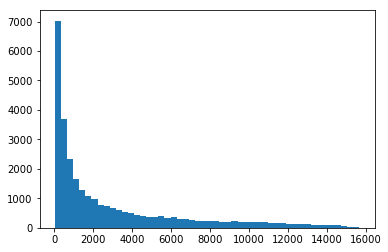

In [12]:
plt.hist(np.sum(data_img, axis = (1,2)), bins = 50)
plt.show()

In [13]:
keys = data.keys()
keys

KeysView(<numpy.lib.npyio.NpzFile object at 0x7f9b321dd898>)

In [14]:
data_point = data['ParticlePoint']
data_momentum = data['ParticleMomentum']
print (data_point.shape)
print (data_momentum.shape)

(29600, 2)
(29600, 3)


In [15]:
data_x = np.concatenate([data_point[:, :2], data_momentum], axis = 1)

In [16]:
np.mean(data_x)

4.177608331523082

In [17]:
#data_img = np.clip(data_img, 1e-8, 8)
#data_img_log = np.log(data_img)
min_ = np.min(data_img)
max_ = np.max(data_img)
print(min_, max_)

0.0 3371.953567922453


In [18]:
n_data_img = []
reconstr_data_img = []

min_ = np.min(data_img)
max_ = np.max(data_img)
min_30 = np.min(data_img, axis = 0)
max_30 = np.max(data_img, axis = 0)

for i, elem in enumerate(data_img):
    n_elem = (elem-min_30)/(max_30 - min_30)
    rec_elem = n_elem*(max_30 - min_30)
    n_data_img.append(n_elem)
    reconstr_data_img.append(rec_elem)
    if (i%5000 == 0):
        print (i)
n_data_img = np.array(n_data_img)
reconstr_data_img = np.array(reconstr_data_img)


0
5000
10000
15000
20000
25000


In [19]:
print (data_img.shape)

(29600, 30, 30)


**Cut it for 4*4**

In [20]:
def cut(data_):
    new_data = []
    for elem in data_:
        new_data.append(elem[13:17, 13:17])
    new_data = np.array(new_data)
    return new_data

In [21]:
cut_data = cut(data_img)
n_cut_data = cut(n_data_img)

In [43]:
np.savez("cut_4_4.npz", ParticlePoint=data_point, ParticleMomentum=data_momentum, EnergyDeposit = cut_data)

In [22]:
cut_data.shape

(29600, 4, 4)

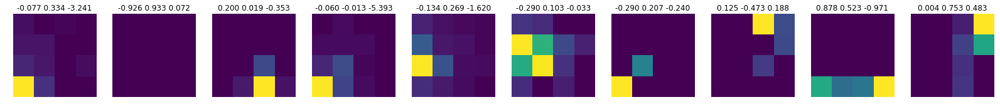

In [23]:
show_images(Variable(torch.from_numpy(cut_data[20:30])), Variable(torch.from_numpy(data_x[20:30])))

In [24]:
np.max(n_cut_data)

1.0

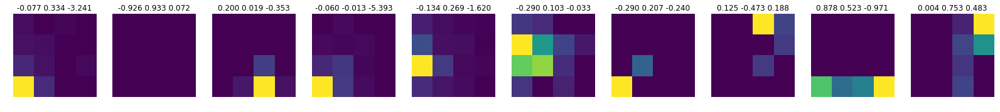

In [25]:
show_images(Variable(torch.from_numpy(n_cut_data[20:30])), Variable(torch.from_numpy(data_x[20:30])))

## loss function ##

In [26]:
def reconstruction_loss_gauss(x_true_object, mu_generative_distr, log_sigma_var, reduce = 'sum'):
    x_prec = torch.exp(-log_sigma_var)
    x_diff = x_true_object - mu_generative_distr
    x_power = (x_diff * x_diff) * x_prec * -0.5
    loss = (log_sigma_var + math.log(2 * math.pi)) / 2 - x_power
    if reduce == 'sum':
        return torch.mean(loss)
    return loss


In [27]:
def kl1(mean, ln_var, reduce='sum'):
    var = torch.exp(ln_var)
    mean_square = mean * mean
    loss = (mean_square + var - ln_var - 1) * 0.5
    if reduce == 'sum':
        return torch.sum(loss)
    else:
        return loss

In [28]:
def kl(mean1, ln_var1, mean2, ln_var2, reduce='sum'):
    var1 = torch.exp(ln_var1)
    var2 = torch.exp(ln_var2)
    mean_square = (mean1 - mean2) * (mean1 - mean2)
    loss = ((mean_square + var1)/var2 - 2*ln_var1 + 2*ln_var2 - 1) * 0.5
    if reduce == 'sum':
        return torch.mean(loss)
    else:
        return loss

## model

In [29]:
INPUT_IMAGE_SIZE = 16
INPUT_CONDITIONAL_SIZE = 4
HIDDEN_SIZE = 1

In [39]:
np.linspace(-14.5, 14.5, 30)

array([-14.5, -13.5, -12.5, -11.5, -10.5,  -9.5,  -8.5,  -7.5,  -6.5,
        -5.5,  -4.5,  -3.5,  -2.5,  -1.5,  -0.5,   0.5,   1.5,   2.5,
         3.5,   4.5,   5.5,   6.5,   7.5,   8.5,   9.5,  10.5,  11.5,
        12.5,  13.5,  14.5])

In [30]:
from torch.distributions import Normal, Bernoulli
from chainer.functions.math import exponential

class CVAE(nn.Module):
    def __init__(self, d, D_x, D_y, alpha):
        """Инициализирует веса модели.
        Вход: d, int - размерность латентного пространства.
        Вход: D_x, int - размерность пространства x.
        Вход: D_y, int - размерность пространства y.
        Вход: alpha, float - число от 0 до 1, коэффициент смеси моделей СVAE и GSNN.
        """
        super(type(self), self).__init__()
        self.d = d
        self.D_x = D_x
        self.D_y = D_y
        self.log_s = nn.Parameter(torch.zeros(1))
        self.i = 0
        self.proposal_network = nn.Sequential(
            nn.Linear(self.D_y + self.D_x, 50),
            nn.LeakyReLU(),
            nn.Linear(50, 25),
            nn.LeakyReLU(),
            nn.Linear(25, self.d),
            nn.Sigmoid()
        )
        self.proposal_mu_head = nn.Linear(self.d, self.d)
        self.proposal_sigma_head = nn.Sequential(nn.Linear(self.d, self.d), nn.Softplus())
        #self.prior_network = nn.Sequential(
            #nn.Linear(self.D_x, 200),
            #nn.LeakyReLU(),
            #nn.Linear(200, 200),
            #nn.LeakyReLU(),
        #)
        self.prior_mu_head = nn.Linear(25, self.d)
        self.prior_sigma_head = nn.Sequential(nn.Linear(25, self.d), nn.Softplus())
    
        self.generative_network = nn.Sequential(
            nn.Linear(self.d + self.D_x, 25),
            nn.LeakyReLU(),
            nn.Linear(25, 50),
            nn.LeakyReLU(),
            nn.Linear(50, self.D_y),
            nn.Sigmoid()
        )

        
        self.generative_mu_head = nn.Sequential(nn.Linear(self.D_y, self.D_y))
        self.generative_sigma_head = nn.Sequential(nn.Linear(self.D_y, self.D_y), nn.Softplus())
        
    def proposal_forward(self, pictures, conditions):
        pictures = pictures.view(pictures.shape[0], 16)
        conditions = conditions.view(conditions.shape[0], self.D_x)
        network_input = torch.cat([pictures, conditions], dim=1)
        answ = self.proposal_network(network_input)
        answ = answ.view(answ.shape[0], self.d)
        return answ

    def generative_forward(self, z, x_batch):
        z = z.view(z.shape[0], self.d)
        x_batch = x_batch.view(x_batch.shape[0], self.D_x)
        network_input = torch.cat([z, x_batch], dim=1)
        answ = self.generative_network(network_input)
        answ = answ.view(answ.shape[0], self.D_y)
        return self.generative_mu_head(answ), self.generative_sigma_head(answ)
    
    def proposal_distr(self, x, y):
        """
        Генерирует предложное распределение на z.
        Вход: x, Variable - матрица размера n x D.
        Возвращаемое значение: tuple(Variable, Variable),
        Каждое Variable - матрица размера n x d.
        Первое - mu, второе - sigma.
        """
        #a = torch.cat([x, y], dim=1)
        #a = a.type(torch.cuda.DoubleTensor)
        #a_cuda = Variable(a, requires_grad=True).cuda()
        q_teta = self.proposal_forward(y, x)
        return self.proposal_mu_head(q_teta), torch.clamp(self.proposal_sigma_head(q_teta), min = 1e-8)

    def prior_distr(self, n):
        """
        Генерирует априорное распределение на z.
        Вход: x, Variable - матрица размера n x D_x.
        Возвращаемое значение: tuple(Variable, Variable),
        Каждое Variable - матрица размера n x d.
        Первое - mu, второе - sigma.
        """
        mu = Variable(torch.Tensor(n, self.d).fill_(0))
        sigma = Variable(torch.Tensor(n, self.d).fill_(1))
        return mu, sigma


    def sample_latent(self, distr, K=1):
        """
        Генерирует сэмплы из гауссовского распределения на z.
        Сэмплы должны быть дифференцируемы по параметрам распределения!
        Вход: distr, tuple(Variable, Varable). Каждое Variable - матрица размера n x d.
        Первое - mu, второе - sigma.
        Вход: K, int - число сэмплов для каждого объекта.
        Возвращаемое значение: Variable, матрица размера n x d.
        """
    
        mu, sigma = distr
        eps = torch.from_numpy(
            np.random.normal(0, 1, size=(K * sigma.shape[0], sigma.shape[1]))
        )
        eps = eps.cuda().to(device)
        return mu.repeat(K, 1) + sigma.repeat(K, 1) * Variable(eps, requires_grad=False)
        

    def sample_prior(self, x_batch):
        mu, sigma = self.prior_distr(x_batch.shape[0])
        m = Normal(mu, sigma)
        answ = m.sample()  
        return answ.cuda().to(device), x_batch
    
    def sample_prior1(self, x_batch):
        """
        Генерирует сэмплы из априорного распределения на z.
        Вход: num_samples, int - число сэмплов, которые надо сгененрировать.
        Возвращаемое значение: Variable, матрица размера num_samples x d.
        """
        m = Normal(self.latent_mu, self.latent_sigma)
        answ = m.sample()  
        return answ.cuda().to(device), x_batch
        

    def generative_distr(self, z):
        #return self.generative_network.forward(z)
        int_distr = self.generative_network(z)
        return (self.generative_mu_head(int_distr), torch.clamp(self.generative_sigma_head(int_distr), min = 1e-8))


    def batch_loss(self, batch, x_batch, K, alpha_, is_show):
        batch = Variable(batch)
        x_batch = Variable(x_batch)        
        
        q_phi = self.proposal_distr(x_batch, batch)
        z = self.sample_latent(q_phi, K)
        
        self.latent_mu = torch.mean(q_phi[0], 0)
        self.latent_sigma = torch.mean(q_phi[1], 0)
        
        mu, sigma = self.generative_forward(z, x_batch)
        answ1 = reconstruction_loss_gauss(batch, mu, torch.log(sigma))

        mu_prior, sigma_prior = self.prior_distr(batch.shape[0])
        
        answ2 = kl1(q_phi[0],torch.log(q_phi[1]))
        
        if (is_show):        
            a_gen1 = self.generate_samples1(
                Variable(torch.cuda.DoubleTensor(n_cut_data[20:30]).to(device)),
                Variable(torch.cuda.DoubleTensor(data_x[20:30]).to(device))
            )
            print ("a_gen shape", a_gen1.shape)
            print ("alpha ", alpha_)
            print ("batch_loss:loss_simple, KL", answ1.data.mean() , answ2)
            show_images(a_gen1,  Variable(torch.cuda.DoubleTensor(data_x[20:30]).to(device)))
            show_images(Variable(torch.from_numpy(n_cut_data[20:30])), Variable(torch.from_numpy(data_x[20:30])))
        return answ1, answ2 


    def generate_samples(self, x):
        """
        Генерирует сэмплы из индуцируемого моделью распределения на объекты x.
        Вход: num_samples, int - число сэмплов, которые надо сгененрировать.
        Возвращаемое значение: Variable, матрица размера num_samples x D.
        """
        z, x_b = self.sample_prior(x)
        mu, sigma = self.generative_forward(z, x_b)
        #mu, sigma = self.conv_forward(self.sample_prior(x))
        m = Normal(mu, sigma)
        answ = m.sample()  
        return answ
    
    def generate_samples1(self, batch, x_batch):
        """
        Генерирует сэмплы из индуцируемого моделью распределения на объекты x.
        Вход: num_samples, int - число сэмплов, которые надо сгененрировать.
        Возвращаемое значение: Variable, матрица размера num_samples x D.
        """
        batch = batch
        x_batch = x_batch        
        
        q_phi = self.proposal_distr(x_batch, batch)
        z = self.sample_latent(q_phi, 1)
        mu, sigma = self.generative_forward(z, x_batch)
        m = Normal(mu, sigma)
        answ = m.sample()  
        return answ
    

def sample_data_batch(bsize, data_, x_data_):
    idxs = np.random.choice(np.arange(data_.shape[0]), size=bsize)
    return torch.cuda.DoubleTensor(data_[idxs]).to(device), torch.cuda.DoubleTensor(x_data_[idxs]).to(device)

/opt/conda/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [35]:
import random
import pickle

shapes = data_img.shape
random.seed()
ep = 0
def train_model(model, tests=[], batch_size=100, K=1, num_epochs=300, learning_rate=1e-3):
    model.double()
    model.to(device)
    
    gd = optim.Adam(model.parameters(), lr=learning_rate)
    dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    train_losses1 = []
    train_losses2 = []
    test_results = []
    for epoch in range(num_epochs):
        ep = epoch
        alpha = 1e-3 * 2 ** (epoch // 2)
        if (alpha > 10.0):
            alpha = 1.0
        for i, (batch, _) in enumerate(dataloader):
            total = 500
            batch, batch_x = sample_data_batch(100, n_cut_data.reshape(-1, 16), data_x)
            
            loss1, loss2 = model.batch_loss(batch, batch_x, K, alpha, False)
            (loss2 + loss1).backward()
            #print (loss.shape)
            
            train_losses1.append(loss1.data.cpu().numpy())
            train_losses2.append(loss2.data.cpu().numpy())
            gd.step()
            gd.zero_grad()
        loss1, loss2 = model.batch_loss(batch, batch_x, K, alpha, True)
        
        print ("epoch:", epoch)
        loss1, loss2 = model.batch_loss(batch, batch_x, K, alpha, True)
        print('\rTrain loss:', train_losses1[-1] + train_losses2[-1],
                      'Batch', i + 1, 'of', total, ' ' * 10, end='', flush=True)
        with open("/home/sayankotor/data/VAEResG/DUMP/model_try.txt","wb") as file:
            pickle.dump(model,file)
    return {
        'model': model,
        'train_losses_list1': train_losses1,
        'train_losses_list2': train_losses2,
        'test_results': test_results
    }

In [36]:
n_data_img.reshape(-1, 900).shape

(29600, 900)

a_gen shape torch.Size([10, 16])
alpha  0.001
batch_loss:loss_simple, KL tensor(-1.9094, device='cuda:1') tensor(1.4925, device='cuda:1', grad_fn=<SumBackward0>)


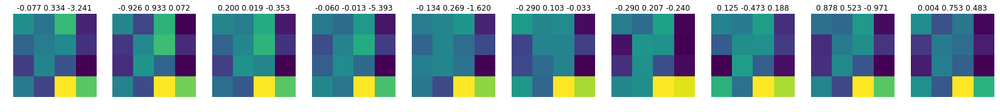

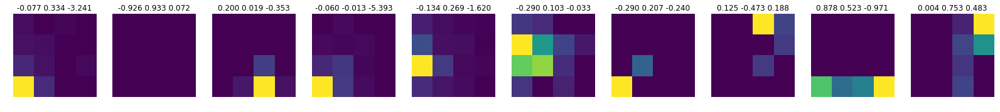

epoch: 0
a_gen shape torch.Size([10, 16])
alpha  0.001
batch_loss:loss_simple, KL tensor(-1.9094, device='cuda:1') tensor(1.4925, device='cuda:1', grad_fn=<SumBackward0>)


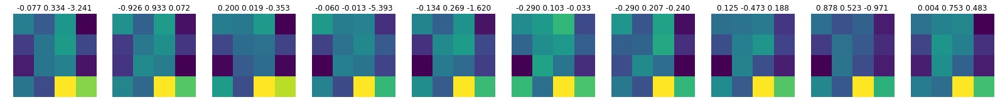

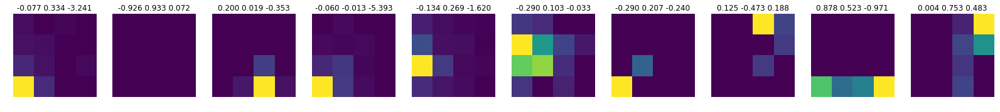

Train loss: -0.40738069579780545 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.001
batch_loss:loss_simple, KL tensor(-1.9058, device='cuda:1') tensor(0.1331, device='cuda:1', grad_fn=<SumBackward0>)


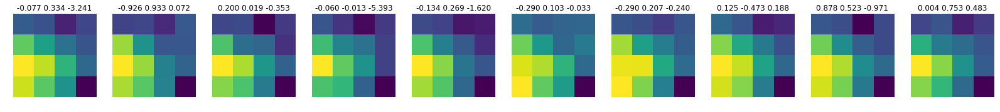

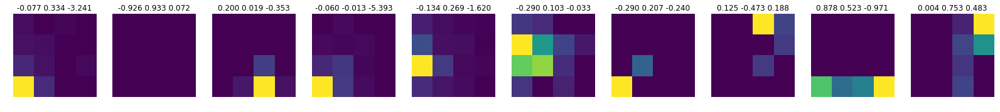

epoch: 1
a_gen shape torch.Size([10, 16])
alpha  0.001
batch_loss:loss_simple, KL tensor(-1.9057, device='cuda:1') tensor(0.1331, device='cuda:1', grad_fn=<SumBackward0>)


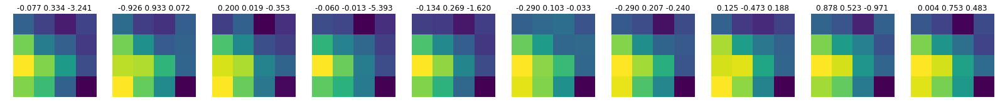

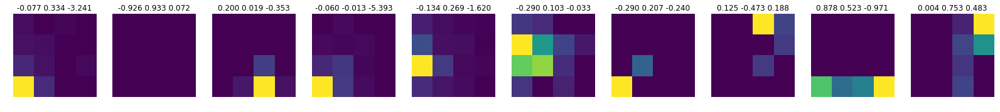

Train loss: -1.762559402835043 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.002
batch_loss:loss_simple, KL tensor(-2.2347, device='cuda:1') tensor(0.0037, device='cuda:1', grad_fn=<SumBackward0>)


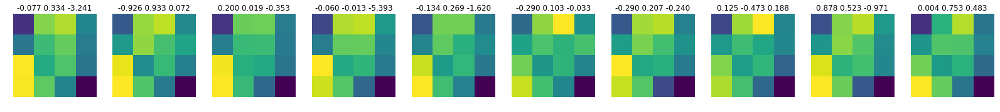

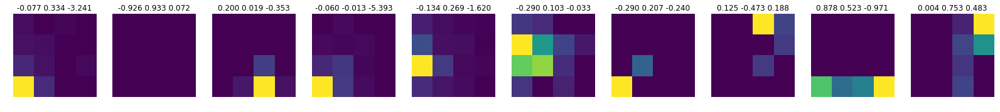

epoch: 2
a_gen shape torch.Size([10, 16])
alpha  0.002
batch_loss:loss_simple, KL tensor(-2.2348, device='cuda:1') tensor(0.0037, device='cuda:1', grad_fn=<SumBackward0>)


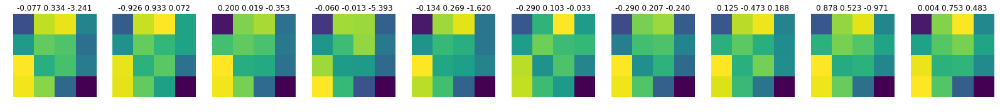

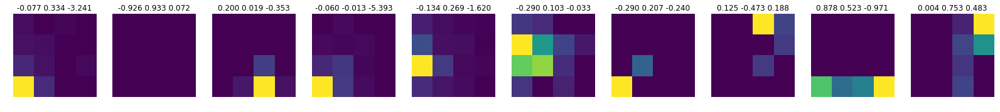

Train loss: -2.2275187612558707 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.002
batch_loss:loss_simple, KL tensor(-2.2260, device='cuda:1') tensor(0.0000, device='cuda:1', grad_fn=<SumBackward0>)


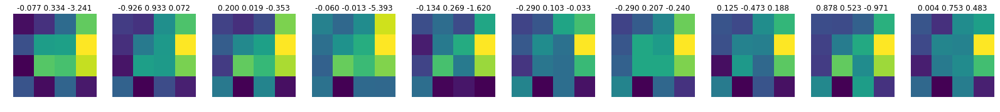

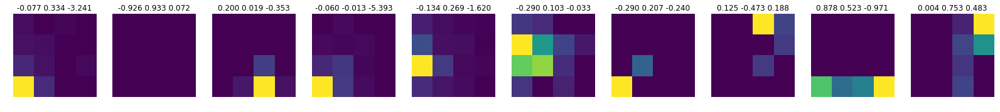

epoch: 3
a_gen shape torch.Size([10, 16])
alpha  0.002
batch_loss:loss_simple, KL tensor(-2.2260, device='cuda:1') tensor(0.0000, device='cuda:1', grad_fn=<SumBackward0>)


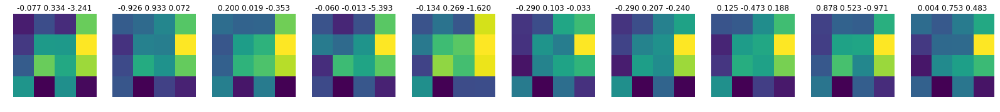

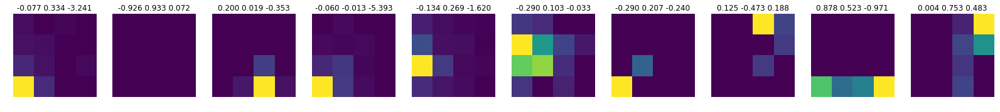

Train loss: -2.2275284873639283 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.004
batch_loss:loss_simple, KL tensor(-2.3480, device='cuda:1') tensor(3.8332e-06, device='cuda:1', grad_fn=<SumBackward0>)


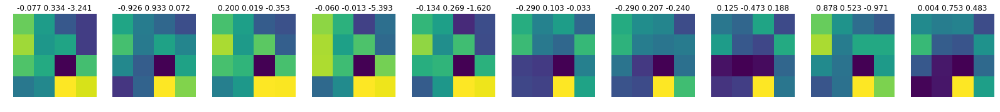

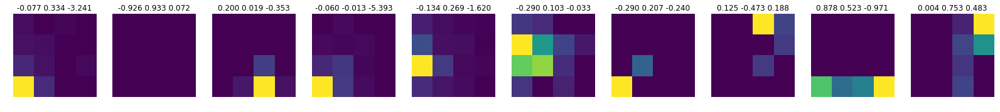

epoch: 4
a_gen shape torch.Size([10, 16])
alpha  0.004
batch_loss:loss_simple, KL tensor(-2.3480, device='cuda:1') tensor(3.8332e-06, device='cuda:1', grad_fn=<SumBackward0>)


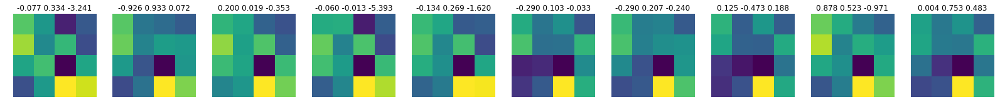

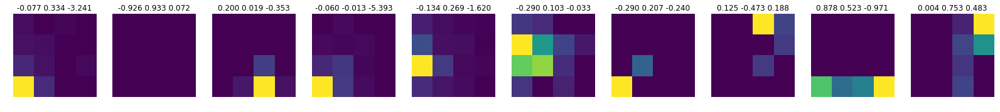

Train loss: -2.3461873226111387 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.004
batch_loss:loss_simple, KL tensor(-2.1899, device='cuda:1') tensor(3.7979e-06, device='cuda:1', grad_fn=<SumBackward0>)


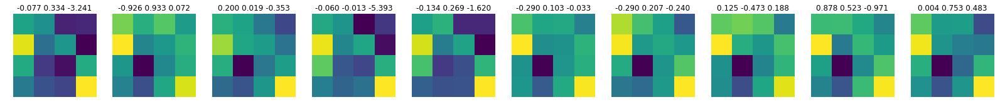

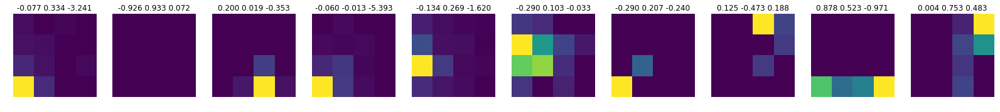

epoch: 5
a_gen shape torch.Size([10, 16])
alpha  0.004
batch_loss:loss_simple, KL tensor(-2.1901, device='cuda:1') tensor(3.7979e-06, device='cuda:1', grad_fn=<SumBackward0>)


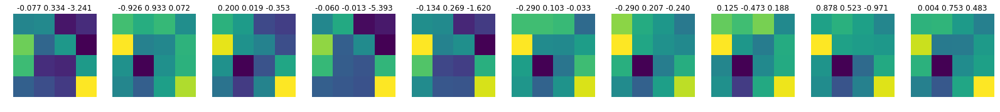

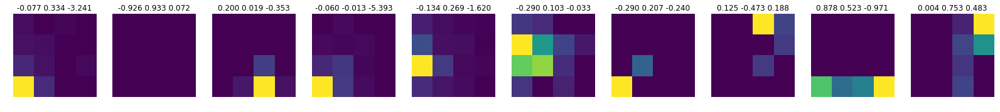

Train loss: -2.1844225493319023 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.008
batch_loss:loss_simple, KL tensor(-2.0491, device='cuda:1') tensor(2.4736e-06, device='cuda:1', grad_fn=<SumBackward0>)


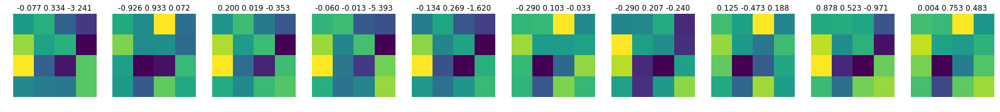

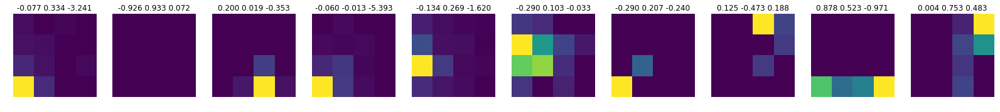

epoch: 6
a_gen shape torch.Size([10, 16])
alpha  0.008
batch_loss:loss_simple, KL tensor(-2.0491, device='cuda:1') tensor(2.4736e-06, device='cuda:1', grad_fn=<SumBackward0>)


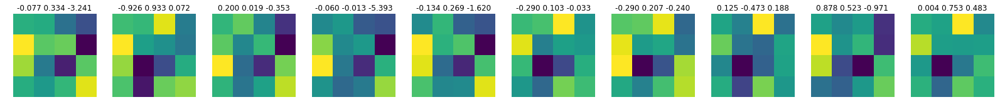

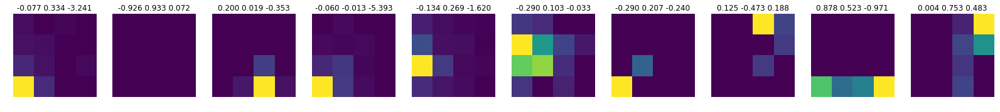

Train loss: -2.045593590891187 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.008
batch_loss:loss_simple, KL tensor(-2.0159, device='cuda:1') tensor(3.6837e-06, device='cuda:1', grad_fn=<SumBackward0>)


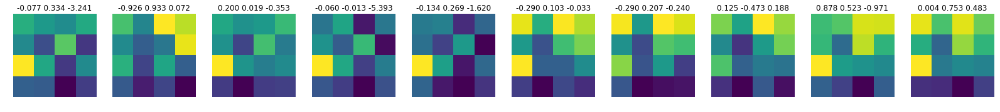

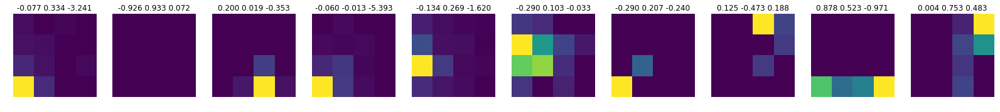

epoch: 7
a_gen shape torch.Size([10, 16])
alpha  0.008
batch_loss:loss_simple, KL tensor(-2.0160, device='cuda:1') tensor(3.6837e-06, device='cuda:1', grad_fn=<SumBackward0>)


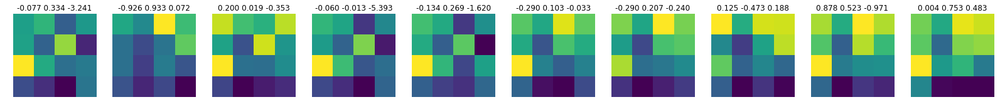

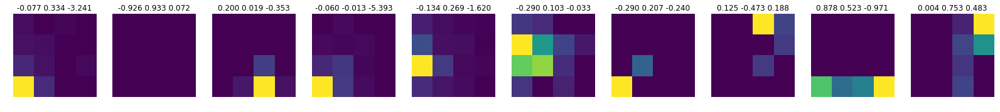

Train loss: -2.000604620205438 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.016
batch_loss:loss_simple, KL tensor(-1.8486, device='cuda:1') tensor(2.8165e-06, device='cuda:1', grad_fn=<SumBackward0>)


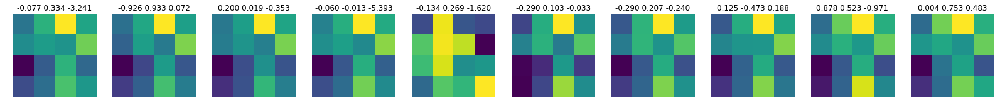

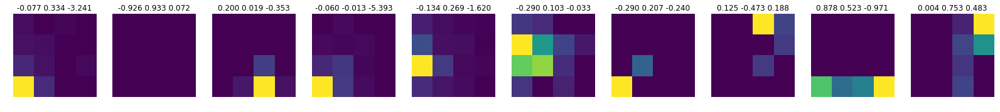

epoch: 8
a_gen shape torch.Size([10, 16])
alpha  0.016
batch_loss:loss_simple, KL tensor(-1.8478, device='cuda:1') tensor(2.8165e-06, device='cuda:1', grad_fn=<SumBackward0>)


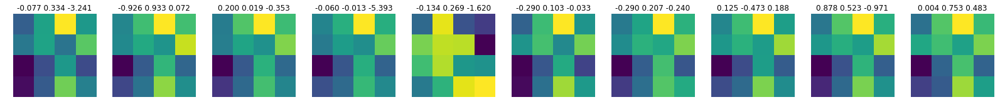

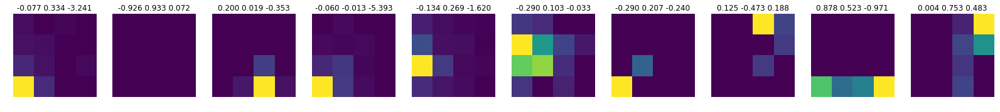

Train loss: -1.840827036811307 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.016
batch_loss:loss_simple, KL tensor(-2.0121, device='cuda:1') tensor(4.5628e-06, device='cuda:1', grad_fn=<SumBackward0>)


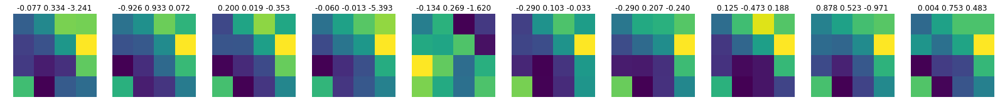

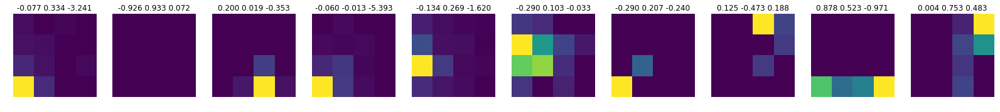

epoch: 9
a_gen shape torch.Size([10, 16])
alpha  0.016
batch_loss:loss_simple, KL tensor(-2.0111, device='cuda:1') tensor(4.5628e-06, device='cuda:1', grad_fn=<SumBackward0>)


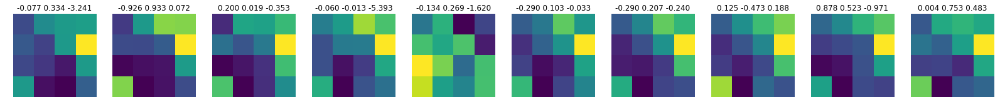

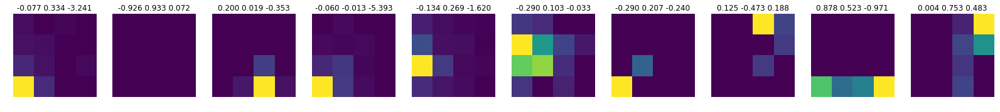

Train loss: -1.995299224293176 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.032
batch_loss:loss_simple, KL tensor(-2.1378, device='cuda:1') tensor(2.3395e-06, device='cuda:1', grad_fn=<SumBackward0>)


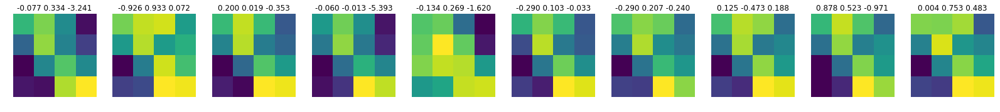

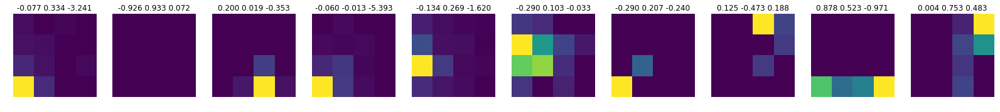

epoch: 10
a_gen shape torch.Size([10, 16])
alpha  0.032
batch_loss:loss_simple, KL tensor(-2.1381, device='cuda:1') tensor(2.3395e-06, device='cuda:1', grad_fn=<SumBackward0>)


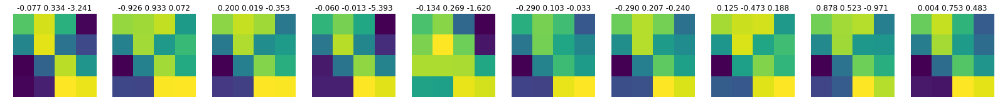

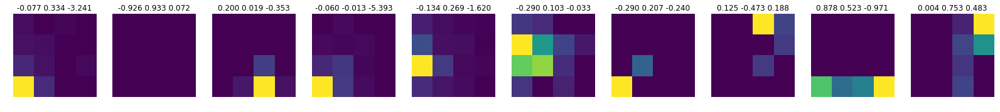

Train loss: -2.1366877344117947 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.032
batch_loss:loss_simple, KL tensor(-2.2554, device='cuda:1') tensor(1.3402e-06, device='cuda:1', grad_fn=<SumBackward0>)


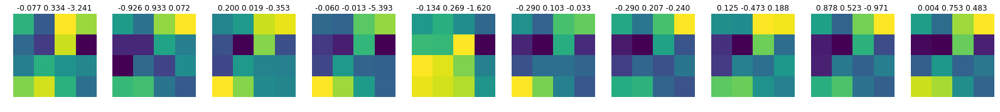

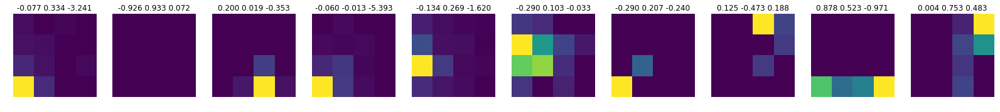

epoch: 11
a_gen shape torch.Size([10, 16])
alpha  0.032
batch_loss:loss_simple, KL tensor(-2.2559, device='cuda:1') tensor(1.3402e-06, device='cuda:1', grad_fn=<SumBackward0>)


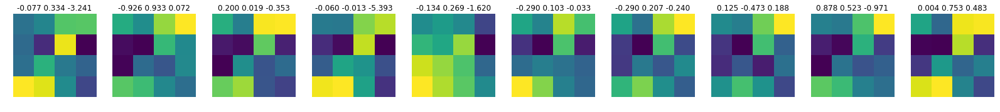

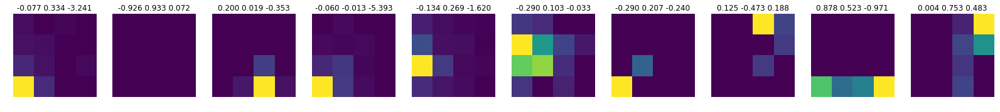

Train loss: -2.247426276276899 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.064
batch_loss:loss_simple, KL tensor(-2.1258, device='cuda:1') tensor(2.2412e-06, device='cuda:1', grad_fn=<SumBackward0>)


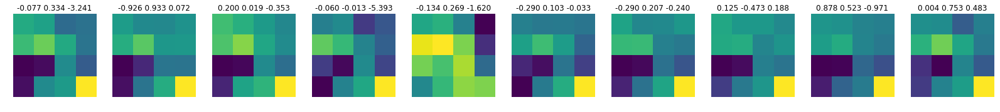

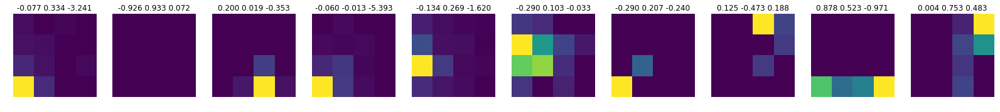

epoch: 12
a_gen shape torch.Size([10, 16])
alpha  0.064
batch_loss:loss_simple, KL tensor(-2.1247, device='cuda:1') tensor(2.2412e-06, device='cuda:1', grad_fn=<SumBackward0>)


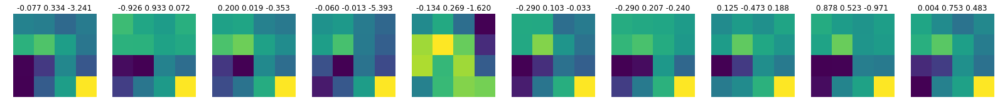

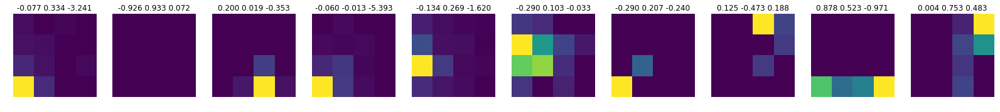

Train loss: -2.1105690031607605 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.064
batch_loss:loss_simple, KL tensor(-2.5549, device='cuda:1') tensor(2.0080e-06, device='cuda:1', grad_fn=<SumBackward0>)


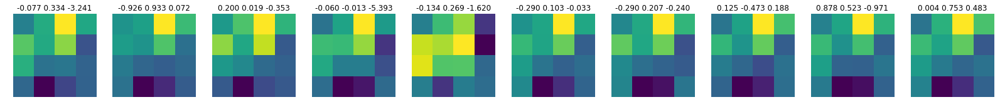

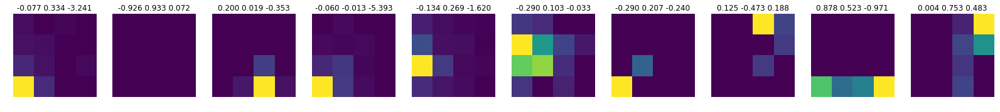

epoch: 13
a_gen shape torch.Size([10, 16])
alpha  0.064
batch_loss:loss_simple, KL tensor(-2.5536, device='cuda:1') tensor(2.0080e-06, device='cuda:1', grad_fn=<SumBackward0>)


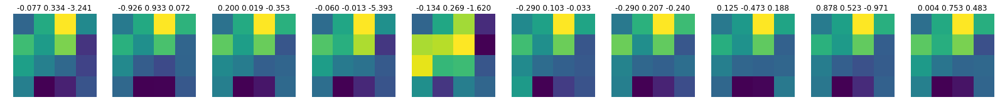

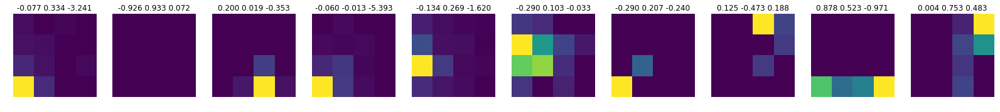

Train loss: -2.5565776219200207 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.128
batch_loss:loss_simple, KL tensor(-2.5788, device='cuda:1') tensor(8.9154e-07, device='cuda:1', grad_fn=<SumBackward0>)


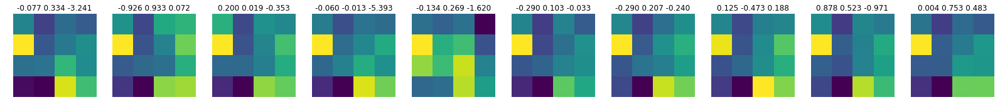

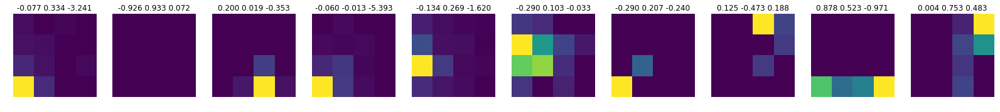

epoch: 14
a_gen shape torch.Size([10, 16])
alpha  0.128
batch_loss:loss_simple, KL tensor(-2.5783, device='cuda:1') tensor(8.9154e-07, device='cuda:1', grad_fn=<SumBackward0>)


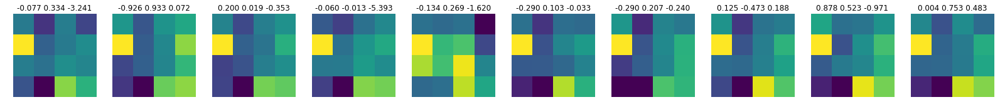

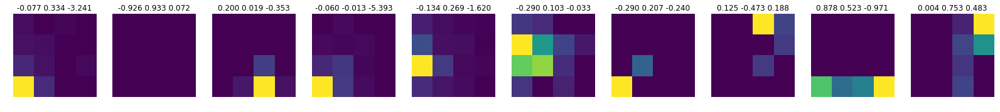

Train loss: -2.570045272498436 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.128
batch_loss:loss_simple, KL tensor(-2.6644, device='cuda:1') tensor(1.1370e-06, device='cuda:1', grad_fn=<SumBackward0>)


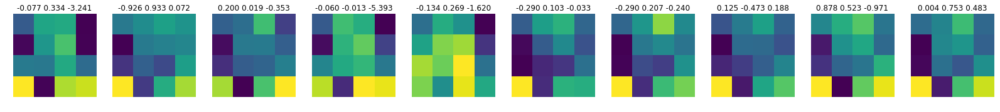

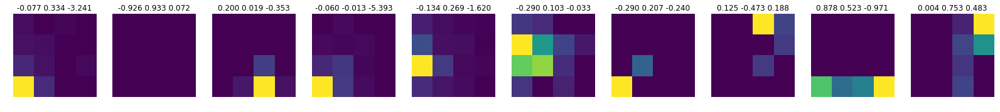

epoch: 15
a_gen shape torch.Size([10, 16])
alpha  0.128
batch_loss:loss_simple, KL tensor(-2.6643, device='cuda:1') tensor(1.1370e-06, device='cuda:1', grad_fn=<SumBackward0>)


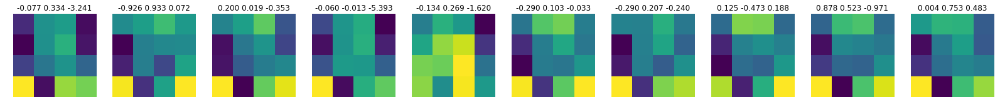

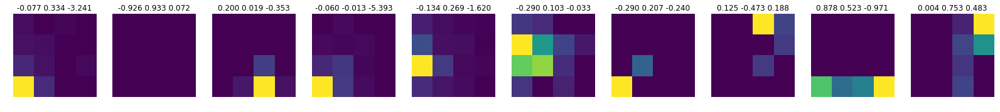

Train loss: -2.6642356237457303 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.256
batch_loss:loss_simple, KL tensor(-2.2328, device='cuda:1') tensor(3.8514e-07, device='cuda:1', grad_fn=<SumBackward0>)


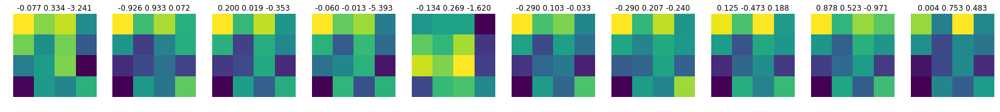

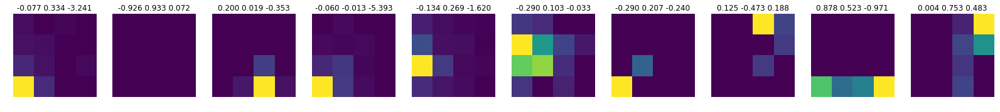

epoch: 16
a_gen shape torch.Size([10, 16])
alpha  0.256
batch_loss:loss_simple, KL tensor(-2.2323, device='cuda:1') tensor(3.8514e-07, device='cuda:1', grad_fn=<SumBackward0>)


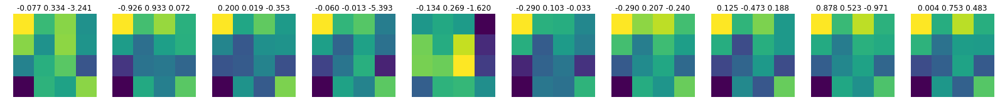

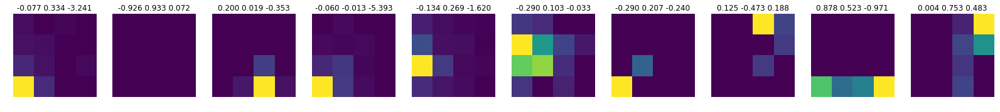

Train loss: -2.218817864925406 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.256
batch_loss:loss_simple, KL tensor(-2.7934, device='cuda:1') tensor(3.8881e-07, device='cuda:1', grad_fn=<SumBackward0>)


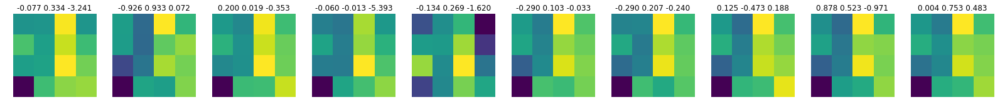

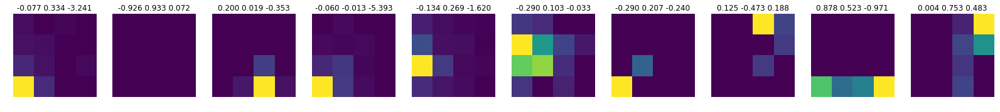

epoch: 17
a_gen shape torch.Size([10, 16])
alpha  0.256
batch_loss:loss_simple, KL tensor(-2.7935, device='cuda:1') tensor(3.8881e-07, device='cuda:1', grad_fn=<SumBackward0>)


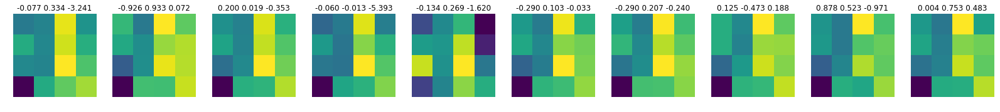

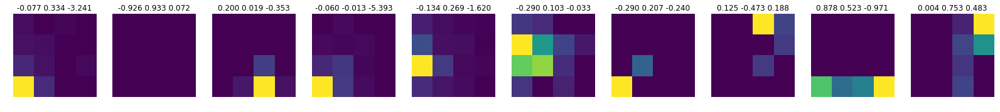

Train loss: -2.790112445367135 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.512
batch_loss:loss_simple, KL tensor(-2.7199, device='cuda:1') tensor(5.4807e-07, device='cuda:1', grad_fn=<SumBackward0>)


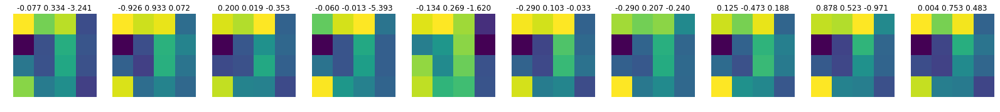

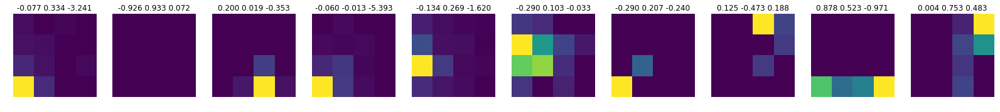

epoch: 18
a_gen shape torch.Size([10, 16])
alpha  0.512
batch_loss:loss_simple, KL tensor(-2.7199, device='cuda:1') tensor(5.4807e-07, device='cuda:1', grad_fn=<SumBackward0>)


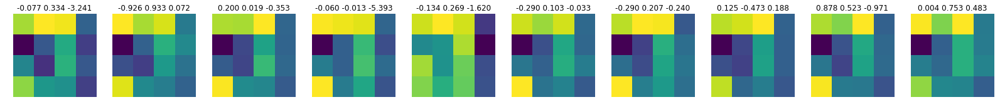

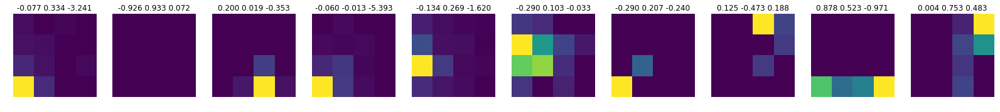

Train loss: -2.7065150070087585 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  0.512
batch_loss:loss_simple, KL tensor(-2.7438, device='cuda:1') tensor(2.9367e-07, device='cuda:1', grad_fn=<SumBackward0>)


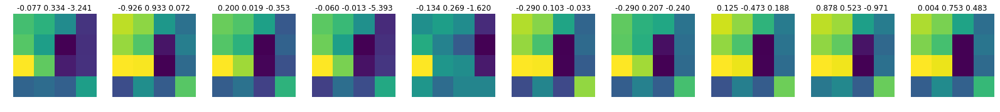

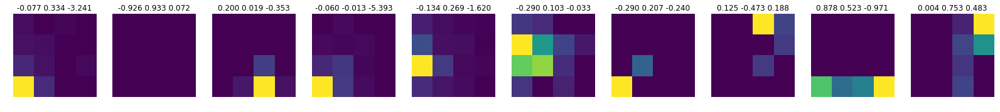

epoch: 19
a_gen shape torch.Size([10, 16])
alpha  0.512
batch_loss:loss_simple, KL tensor(-2.7441, device='cuda:1') tensor(2.9367e-07, device='cuda:1', grad_fn=<SumBackward0>)


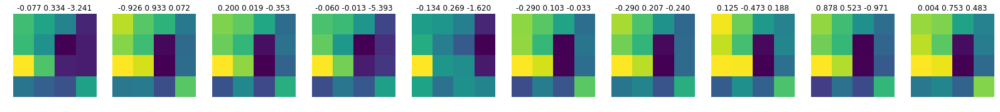

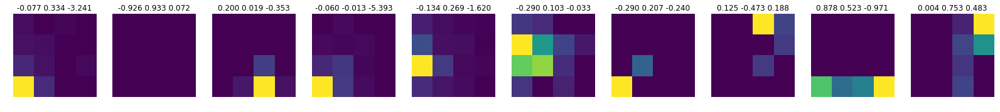

Train loss: -2.7385872677580245 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.024
batch_loss:loss_simple, KL tensor(-3.1214, device='cuda:1') tensor(2.4936e-07, device='cuda:1', grad_fn=<SumBackward0>)


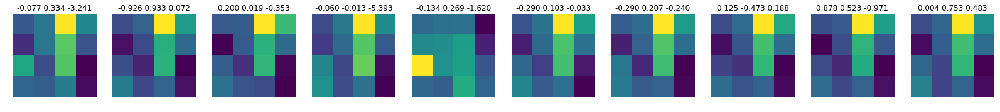

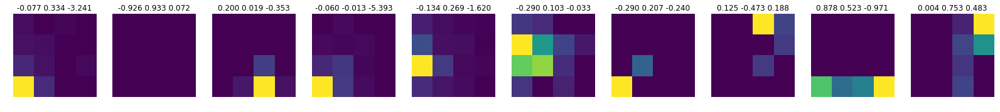

epoch: 20
a_gen shape torch.Size([10, 16])
alpha  1.024
batch_loss:loss_simple, KL tensor(-3.1218, device='cuda:1') tensor(2.4936e-07, device='cuda:1', grad_fn=<SumBackward0>)


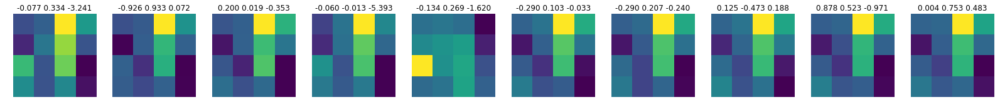

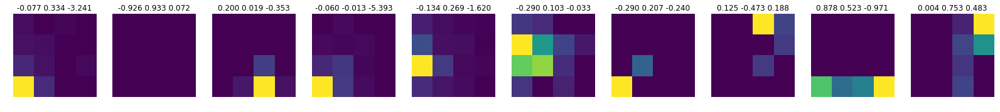

Train loss: -3.122855893397468 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.024
batch_loss:loss_simple, KL tensor(-2.9485, device='cuda:1') tensor(1.7559e-07, device='cuda:1', grad_fn=<SumBackward0>)


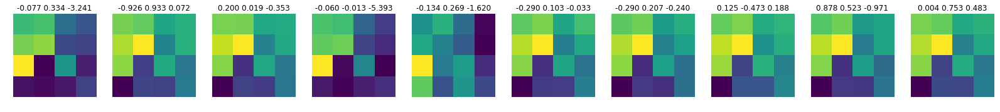

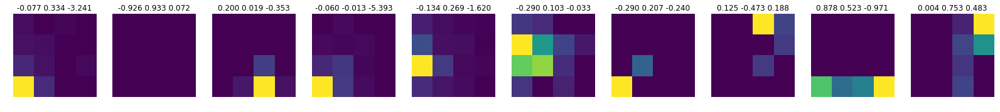

epoch: 21
a_gen shape torch.Size([10, 16])
alpha  1.024
batch_loss:loss_simple, KL tensor(-2.9482, device='cuda:1') tensor(1.7559e-07, device='cuda:1', grad_fn=<SumBackward0>)


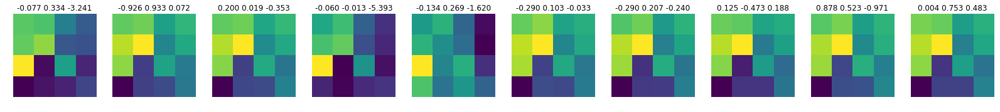

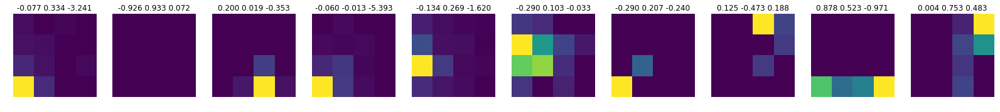

Train loss: -2.949672156890725 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  2.048
batch_loss:loss_simple, KL tensor(-3.1251, device='cuda:1') tensor(1.9320e-07, device='cuda:1', grad_fn=<SumBackward0>)


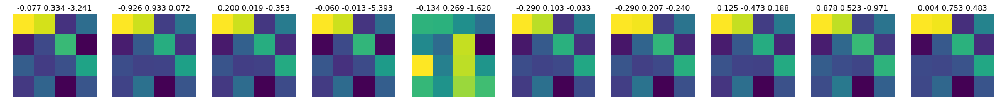

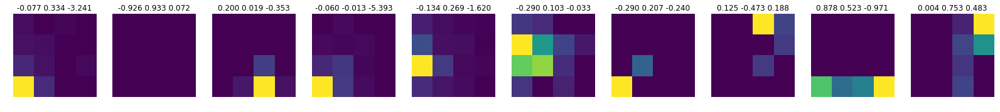

epoch: 22
a_gen shape torch.Size([10, 16])
alpha  2.048
batch_loss:loss_simple, KL tensor(-3.1237, device='cuda:1') tensor(1.9320e-07, device='cuda:1', grad_fn=<SumBackward0>)


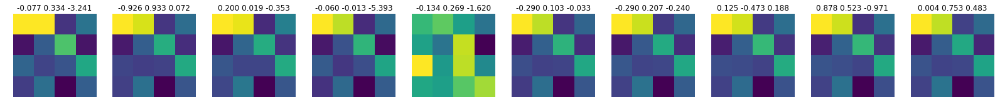

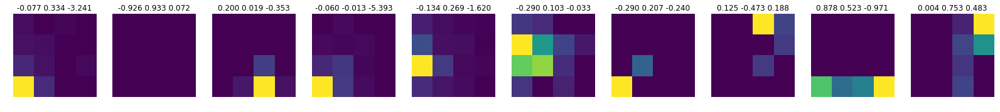

Train loss: -3.127682012229 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  2.048
batch_loss:loss_simple, KL tensor(-3.2131, device='cuda:1') tensor(1.5734e-07, device='cuda:1', grad_fn=<SumBackward0>)


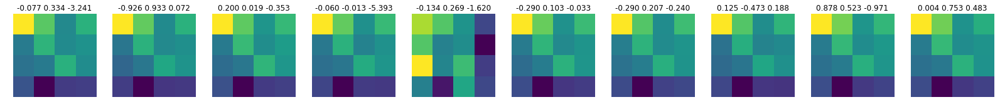

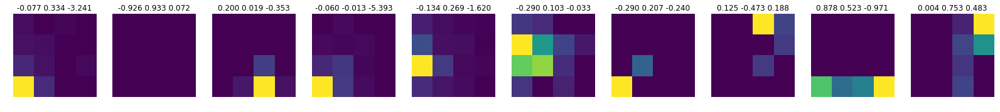

epoch: 23
a_gen shape torch.Size([10, 16])
alpha  2.048
batch_loss:loss_simple, KL tensor(-3.2131, device='cuda:1') tensor(1.5734e-07, device='cuda:1', grad_fn=<SumBackward0>)


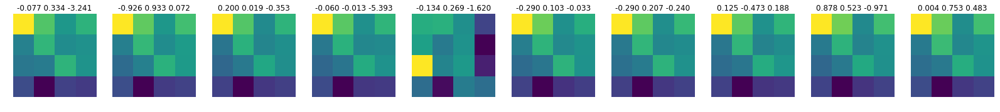

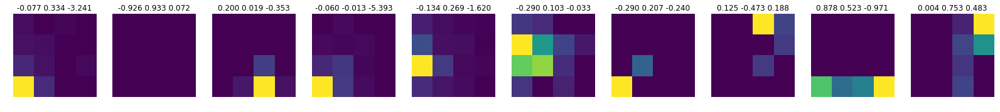

Train loss: -3.216008557063306 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  4.096
batch_loss:loss_simple, KL tensor(-3.3442, device='cuda:1') tensor(3.7557e-08, device='cuda:1', grad_fn=<SumBackward0>)


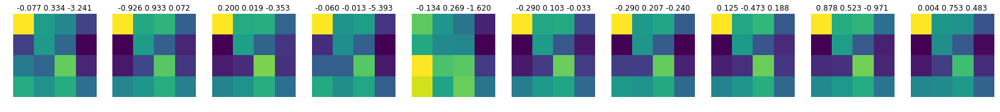

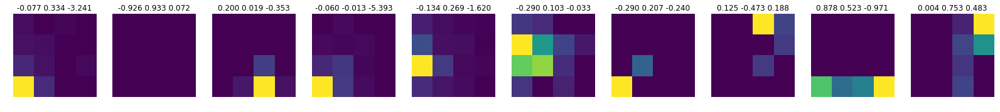

epoch: 24
a_gen shape torch.Size([10, 16])
alpha  4.096
batch_loss:loss_simple, KL tensor(-3.3441, device='cuda:1') tensor(3.7557e-08, device='cuda:1', grad_fn=<SumBackward0>)


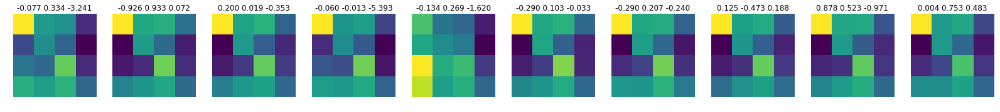

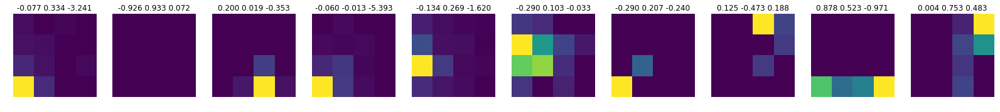

Train loss: -3.328587039789122 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  4.096
batch_loss:loss_simple, KL tensor(-3.9175, device='cuda:1') tensor(2.4364e-08, device='cuda:1', grad_fn=<SumBackward0>)


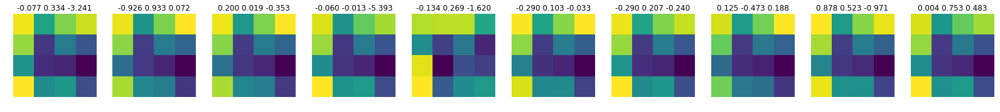

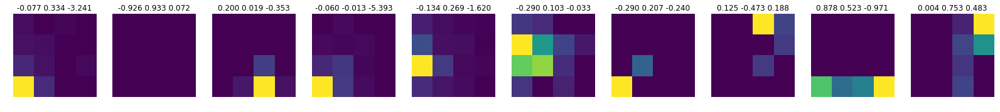

epoch: 25
a_gen shape torch.Size([10, 16])
alpha  4.096
batch_loss:loss_simple, KL tensor(-3.9168, device='cuda:1') tensor(2.4364e-08, device='cuda:1', grad_fn=<SumBackward0>)


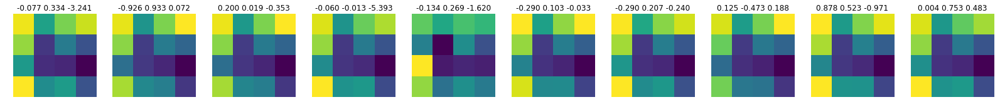

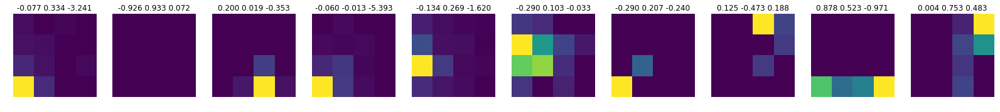

Train loss: -3.9432958431520797 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  8.192
batch_loss:loss_simple, KL tensor(-3.7055, device='cuda:1') tensor(1.5608e-07, device='cuda:1', grad_fn=<SumBackward0>)


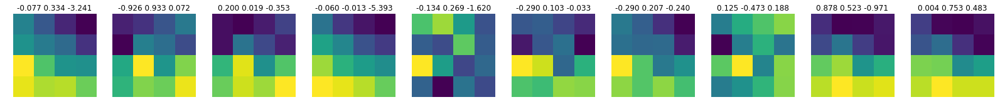

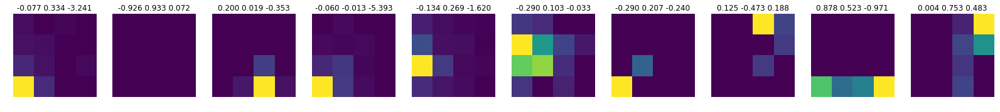

epoch: 26
a_gen shape torch.Size([10, 16])
alpha  8.192
batch_loss:loss_simple, KL tensor(-3.7054, device='cuda:1') tensor(1.5608e-07, device='cuda:1', grad_fn=<SumBackward0>)


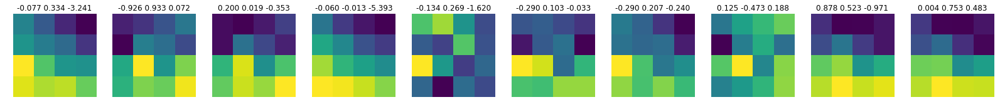

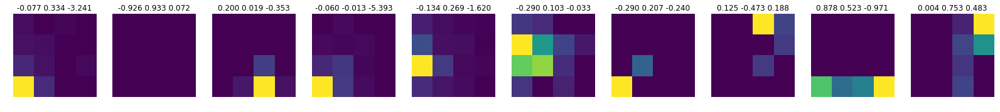

Train loss: -3.694007081146632 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  8.192
batch_loss:loss_simple, KL tensor(-3.9965, device='cuda:1') tensor(8.3264e-07, device='cuda:1', grad_fn=<SumBackward0>)


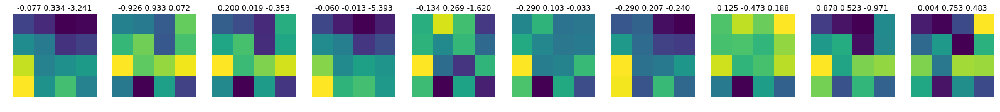

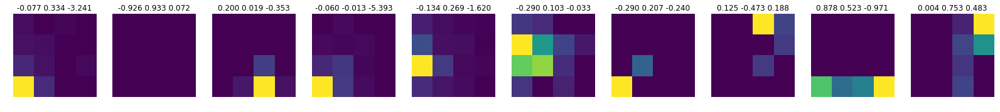

epoch: 27
a_gen shape torch.Size([10, 16])
alpha  8.192
batch_loss:loss_simple, KL tensor(-3.9952, device='cuda:1') tensor(8.3264e-07, device='cuda:1', grad_fn=<SumBackward0>)


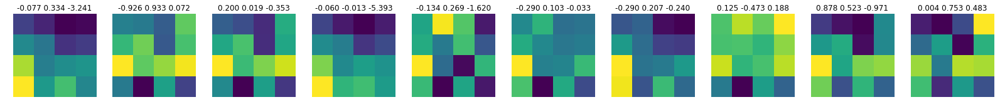

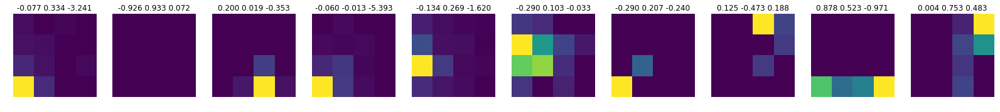

Train loss: -4.0219857337537395 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1505, device='cuda:1') tensor(4.6899e-07, device='cuda:1', grad_fn=<SumBackward0>)


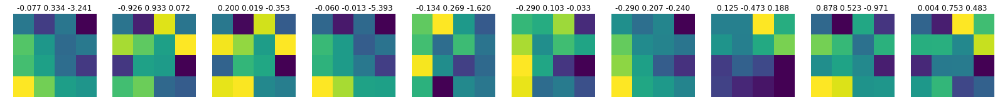

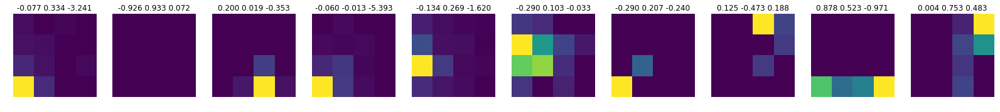

epoch: 28
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1511, device='cuda:1') tensor(4.6899e-07, device='cuda:1', grad_fn=<SumBackward0>)


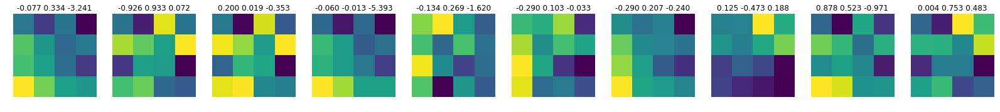

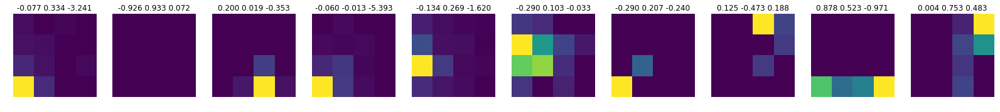

Train loss: -4.179039451732081 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.0191, device='cuda:1') tensor(7.7827e-07, device='cuda:1', grad_fn=<SumBackward0>)


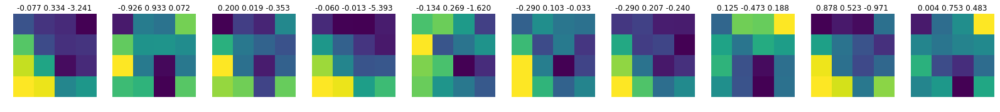

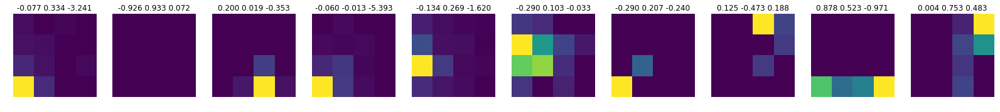

epoch: 29
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.0134, device='cuda:1') tensor(7.7827e-07, device='cuda:1', grad_fn=<SumBackward0>)


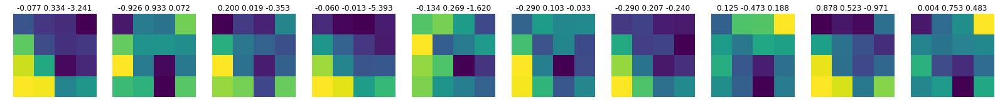

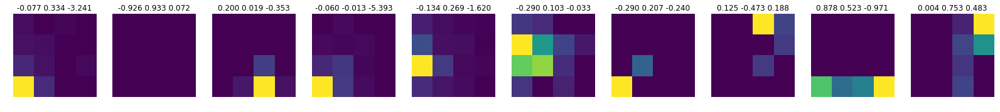

Train loss: -4.014245888587156 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1532, device='cuda:1') tensor(1.1756e-07, device='cuda:1', grad_fn=<SumBackward0>)


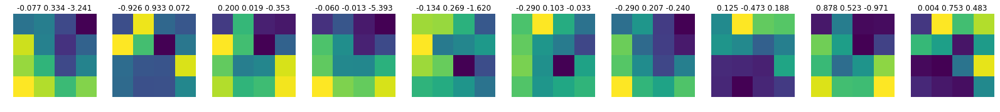

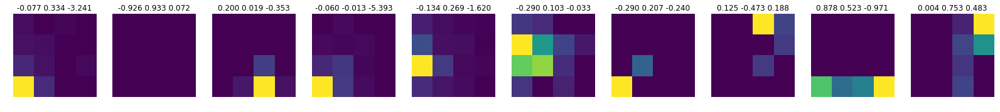

epoch: 30
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1530, device='cuda:1') tensor(1.1756e-07, device='cuda:1', grad_fn=<SumBackward0>)


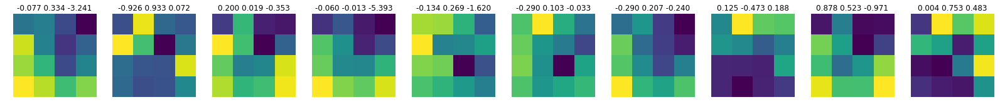

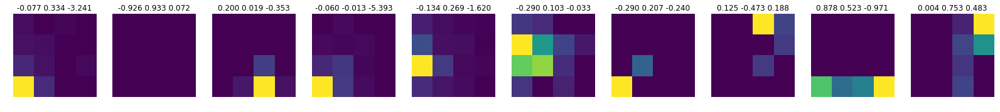

Train loss: -4.1209573637940995 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2770, device='cuda:1') tensor(4.6349e-08, device='cuda:1', grad_fn=<SumBackward0>)


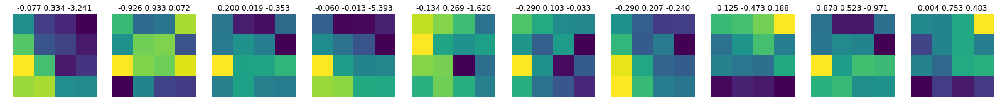

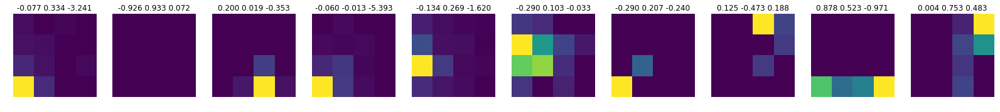

epoch: 31
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2766, device='cuda:1') tensor(4.6349e-08, device='cuda:1', grad_fn=<SumBackward0>)


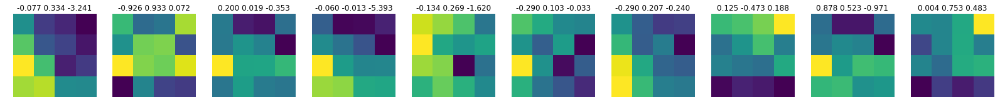

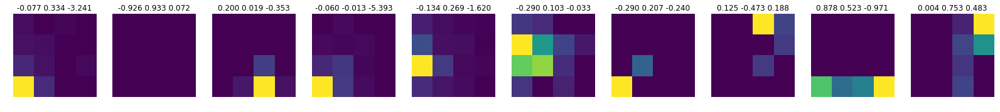

Train loss: -4.147150213636311 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1196, device='cuda:1') tensor(4.6528e-07, device='cuda:1', grad_fn=<SumBackward0>)


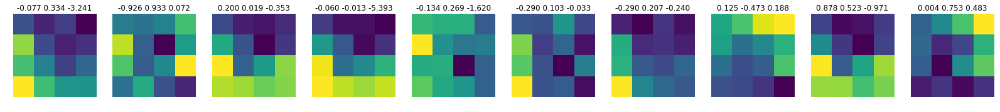

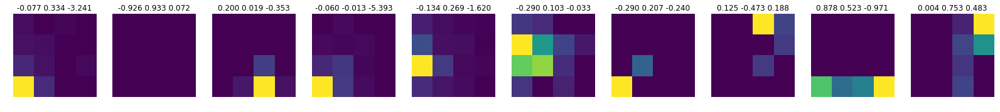

epoch: 32
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1132, device='cuda:1') tensor(4.6528e-07, device='cuda:1', grad_fn=<SumBackward0>)


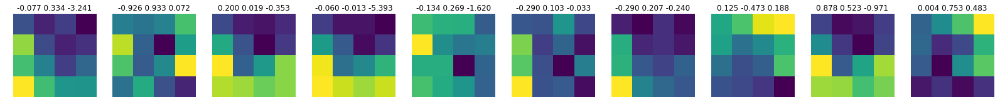

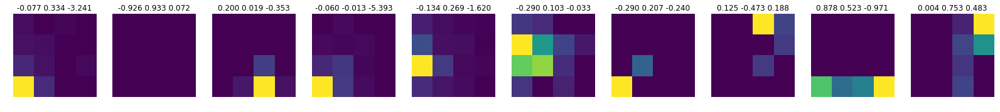

Train loss: -4.069066146079391 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1856, device='cuda:1') tensor(1.3555e-07, device='cuda:1', grad_fn=<SumBackward0>)


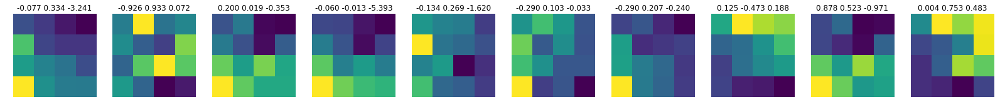

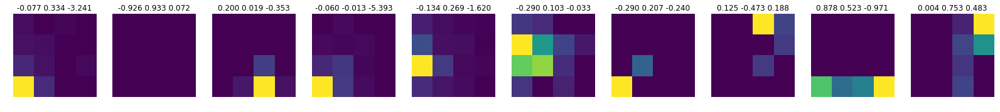

epoch: 33
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.1863, device='cuda:1') tensor(1.3555e-07, device='cuda:1', grad_fn=<SumBackward0>)


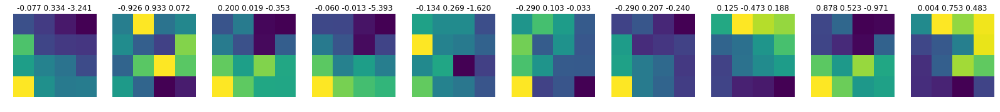

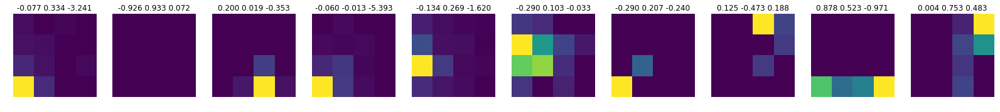

Train loss: -4.111797571936068 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4229, device='cuda:1') tensor(2.8482e-07, device='cuda:1', grad_fn=<SumBackward0>)


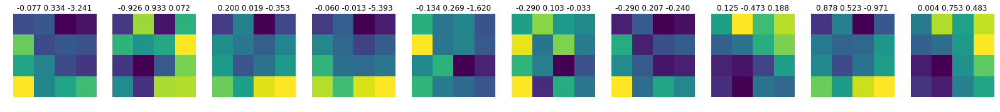

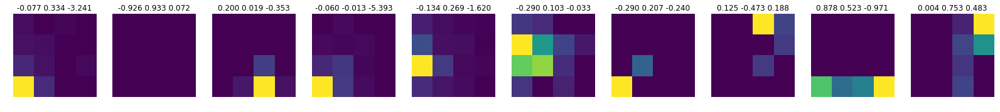

epoch: 34
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4236, device='cuda:1') tensor(2.8482e-07, device='cuda:1', grad_fn=<SumBackward0>)


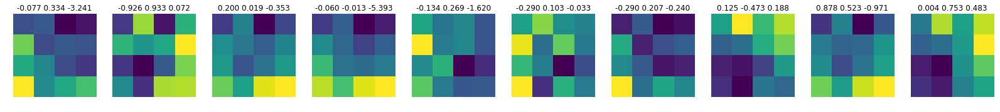

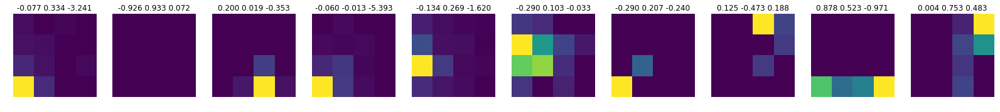

Train loss: -4.383208059894395 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2265, device='cuda:1') tensor(2.4246e-07, device='cuda:1', grad_fn=<SumBackward0>)


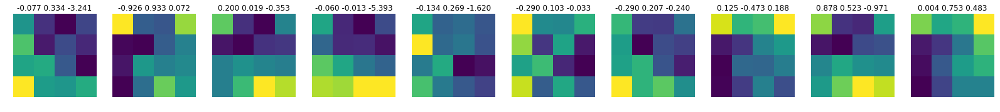

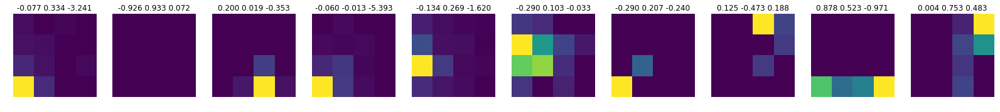

epoch: 35
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2295, device='cuda:1') tensor(2.4246e-07, device='cuda:1', grad_fn=<SumBackward0>)


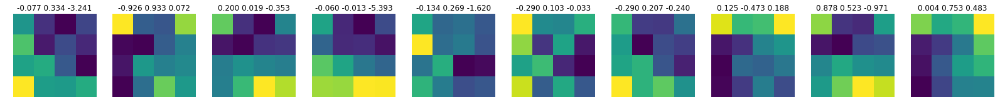

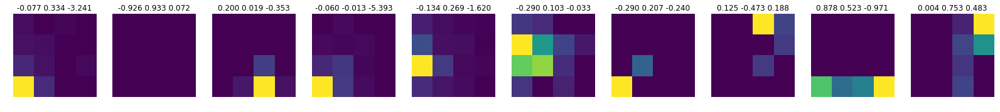

Train loss: -4.251503454573684 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2766, device='cuda:1') tensor(5.5513e-09, device='cuda:1', grad_fn=<SumBackward0>)


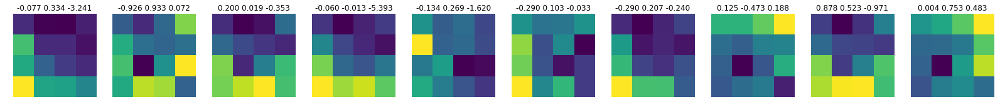

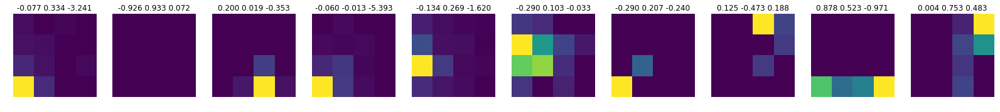

epoch: 36
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2769, device='cuda:1') tensor(5.5513e-09, device='cuda:1', grad_fn=<SumBackward0>)


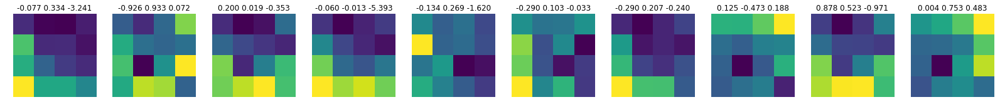

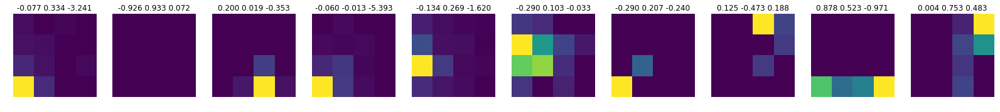

Train loss: -4.259308039294569 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2954, device='cuda:1') tensor(5.4350e-07, device='cuda:1', grad_fn=<SumBackward0>)


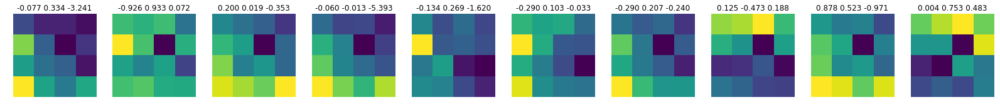

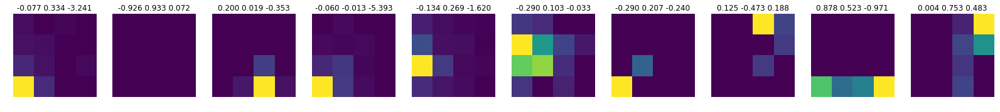

epoch: 37
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2956, device='cuda:1') tensor(5.4350e-07, device='cuda:1', grad_fn=<SumBackward0>)


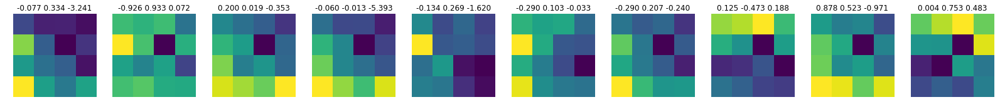

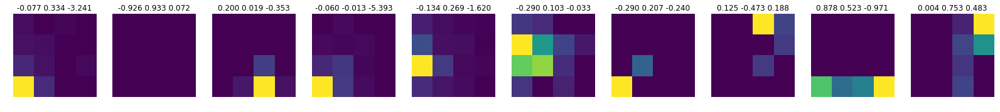

Train loss: -4.251832394241293 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5553, device='cuda:1') tensor(4.0842e-07, device='cuda:1', grad_fn=<SumBackward0>)


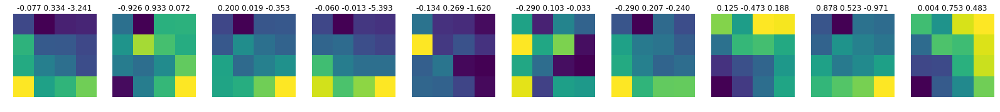

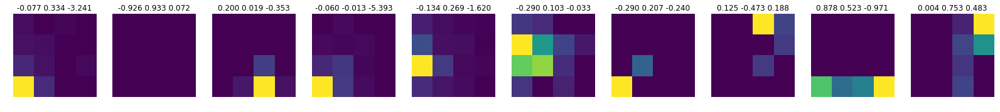

epoch: 38
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5537, device='cuda:1') tensor(4.0842e-07, device='cuda:1', grad_fn=<SumBackward0>)


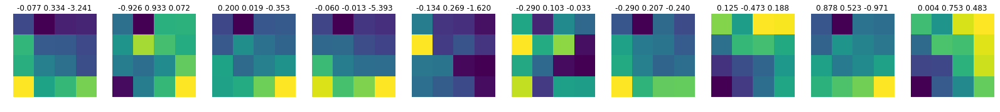

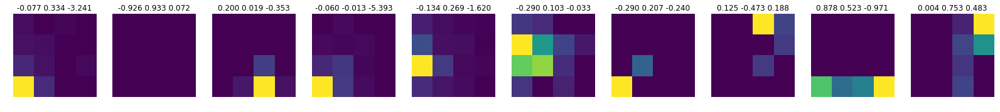

Train loss: -4.549578958339507 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3690, device='cuda:1') tensor(9.8167e-08, device='cuda:1', grad_fn=<SumBackward0>)


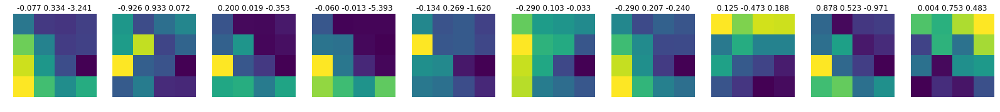

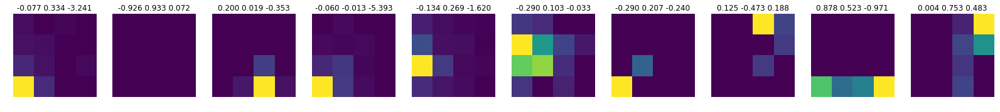

epoch: 39
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3655, device='cuda:1') tensor(9.8167e-08, device='cuda:1', grad_fn=<SumBackward0>)


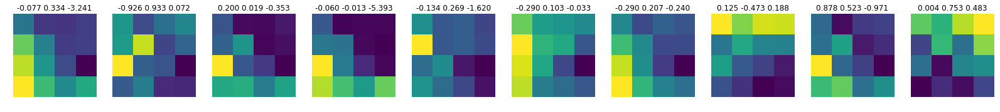

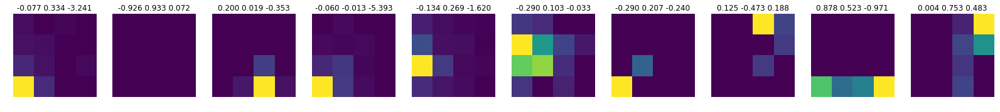

Train loss: -4.255391877527353 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2810, device='cuda:1') tensor(6.2009e-07, device='cuda:1', grad_fn=<SumBackward0>)


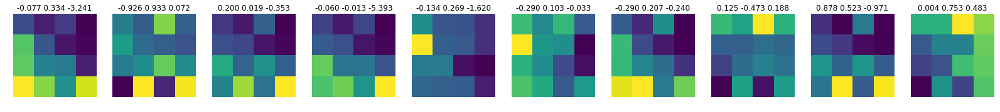

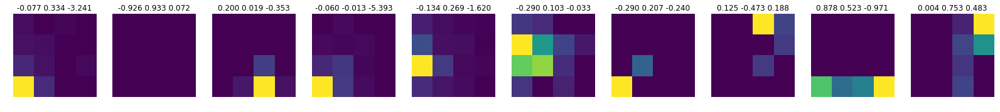

epoch: 40
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2838, device='cuda:1') tensor(6.2009e-07, device='cuda:1', grad_fn=<SumBackward0>)


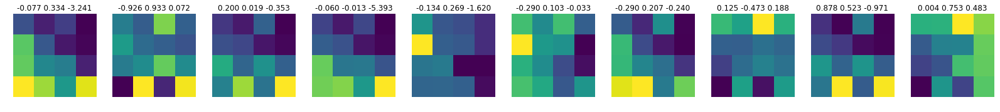

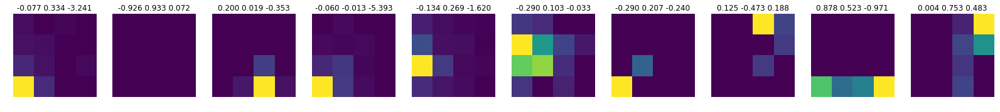

Train loss: -4.261623045313632 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3134, device='cuda:1') tensor(4.9479e-07, device='cuda:1', grad_fn=<SumBackward0>)


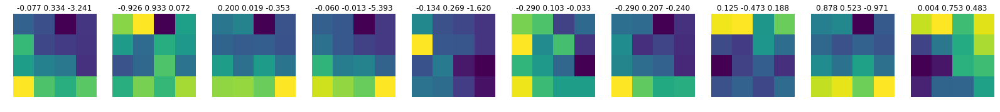

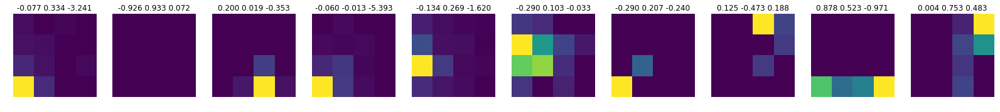

epoch: 41
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3138, device='cuda:1') tensor(4.9479e-07, device='cuda:1', grad_fn=<SumBackward0>)


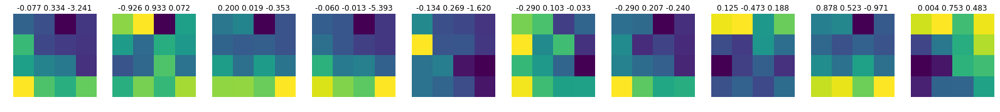

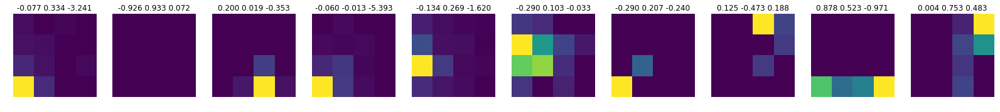

Train loss: -4.3282383382335725 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2259, device='cuda:1') tensor(1.8057e-06, device='cuda:1', grad_fn=<SumBackward0>)


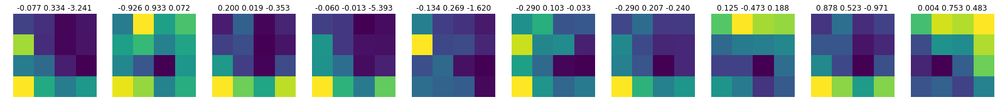

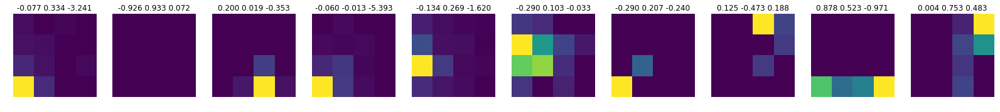

epoch: 42
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2246, device='cuda:1') tensor(1.8057e-06, device='cuda:1', grad_fn=<SumBackward0>)


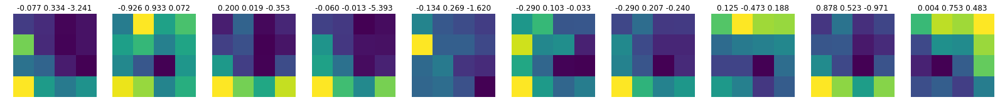

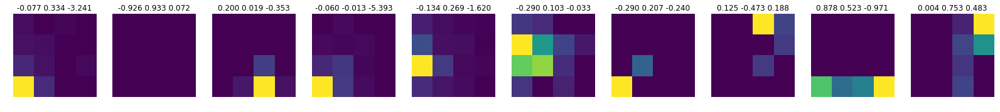

Train loss: -4.287918612860146 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3763, device='cuda:1') tensor(5.5091e-08, device='cuda:1', grad_fn=<SumBackward0>)


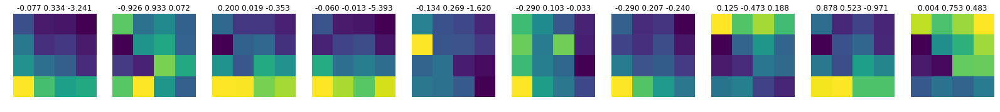

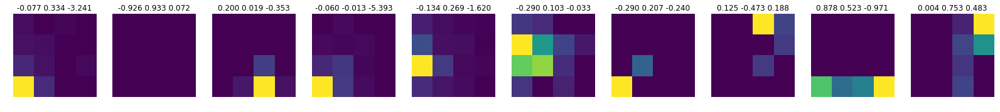

epoch: 43
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3752, device='cuda:1') tensor(5.5091e-08, device='cuda:1', grad_fn=<SumBackward0>)


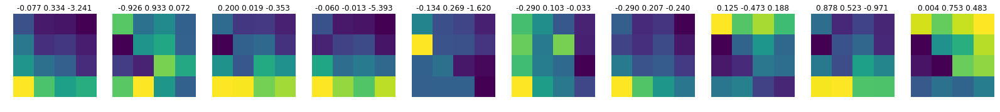

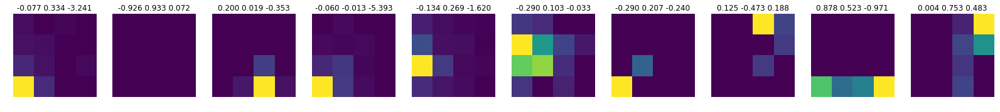

Train loss: -4.3244122651590775 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5086, device='cuda:1') tensor(5.6835e-08, device='cuda:1', grad_fn=<SumBackward0>)


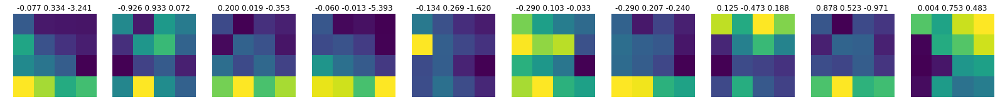

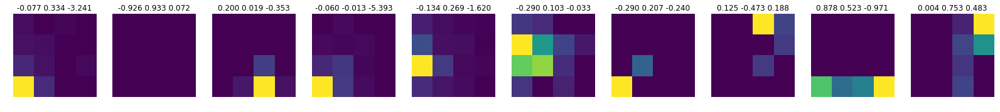

epoch: 44
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5110, device='cuda:1') tensor(5.6835e-08, device='cuda:1', grad_fn=<SumBackward0>)


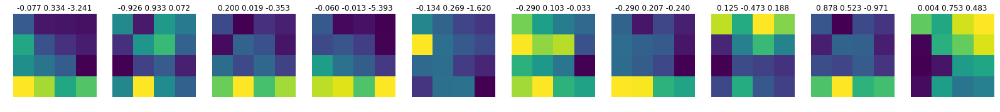

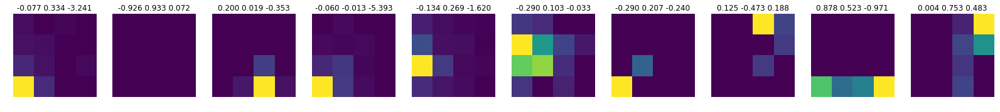

Train loss: -4.559991997598505 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6600, device='cuda:1') tensor(4.1513e-08, device='cuda:1', grad_fn=<SumBackward0>)


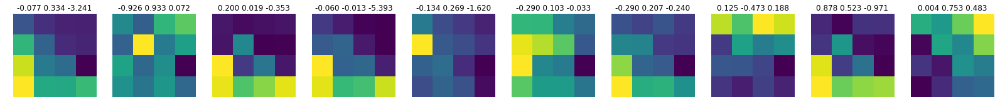

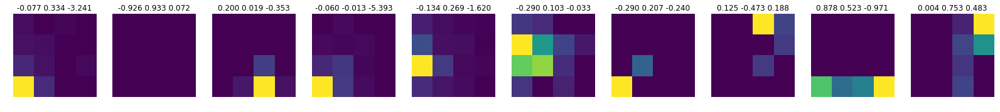

epoch: 45
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6581, device='cuda:1') tensor(4.1513e-08, device='cuda:1', grad_fn=<SumBackward0>)


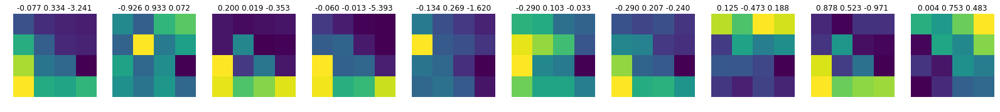

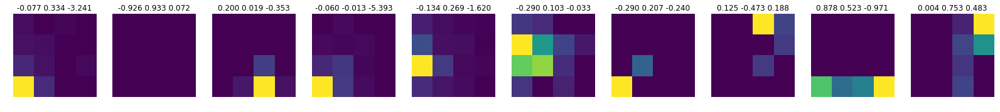

Train loss: -4.571189054081961 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6157, device='cuda:1') tensor(7.6386e-09, device='cuda:1', grad_fn=<SumBackward0>)


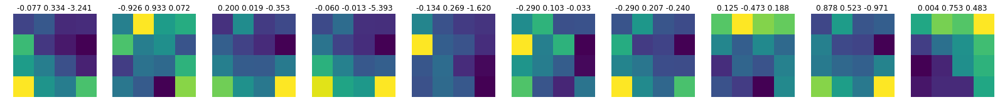

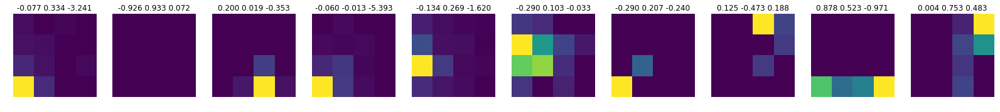

epoch: 46
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6131, device='cuda:1') tensor(7.6386e-09, device='cuda:1', grad_fn=<SumBackward0>)


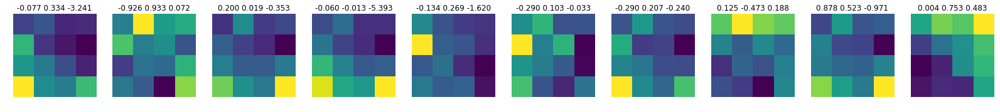

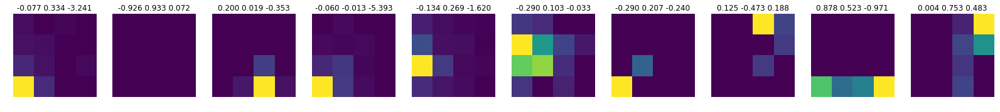

Train loss: -4.608616299551155 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2938, device='cuda:1') tensor(2.6657e-07, device='cuda:1', grad_fn=<SumBackward0>)


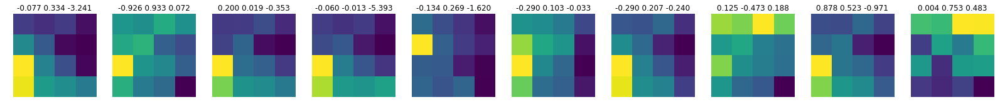

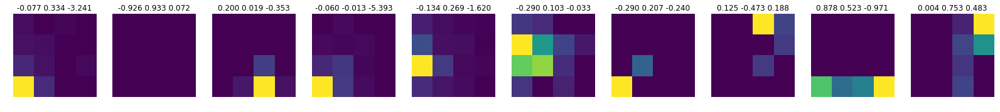

epoch: 47
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2952, device='cuda:1') tensor(2.6657e-07, device='cuda:1', grad_fn=<SumBackward0>)


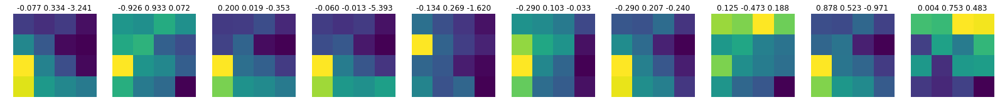

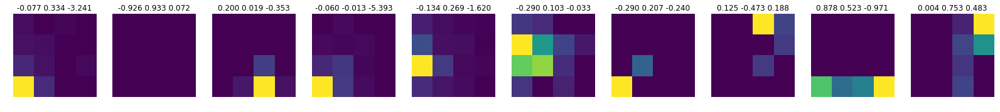

Train loss: -4.293176320938535 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5410, device='cuda:1') tensor(2.5248e-08, device='cuda:1', grad_fn=<SumBackward0>)


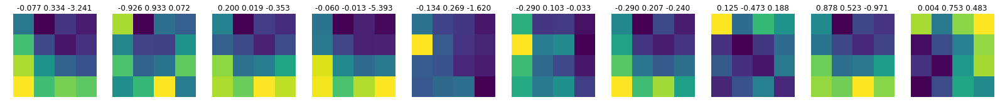

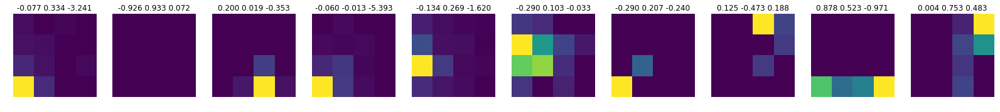

epoch: 48
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5395, device='cuda:1') tensor(2.5248e-08, device='cuda:1', grad_fn=<SumBackward0>)


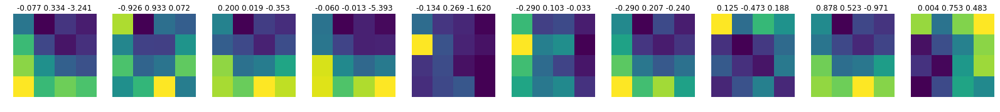

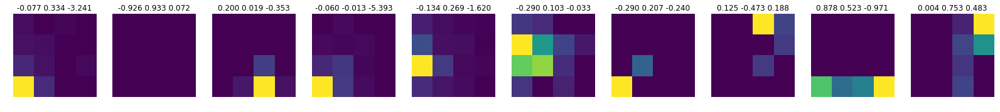

Train loss: -4.463001888954981 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6052, device='cuda:1') tensor(3.7807e-09, device='cuda:1', grad_fn=<SumBackward0>)


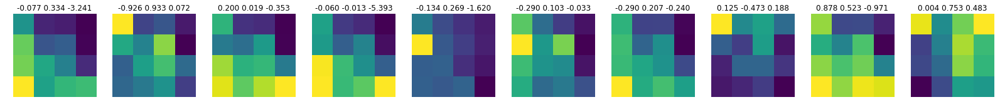

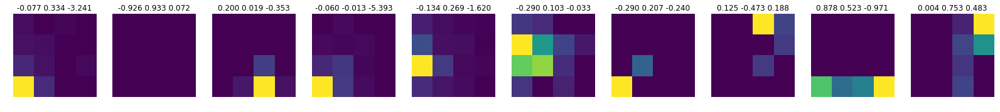

epoch: 49
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6039, device='cuda:1') tensor(3.7807e-09, device='cuda:1', grad_fn=<SumBackward0>)


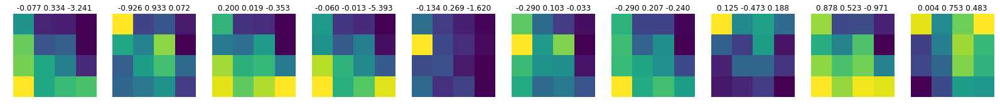

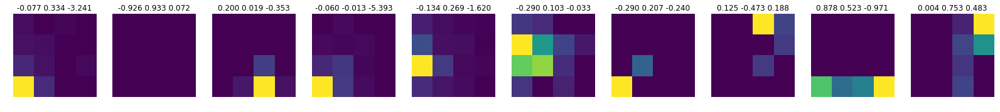

Train loss: -4.614318150066529 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5183, device='cuda:1') tensor(3.2538e-07, device='cuda:1', grad_fn=<SumBackward0>)


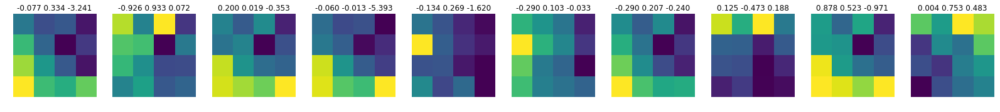

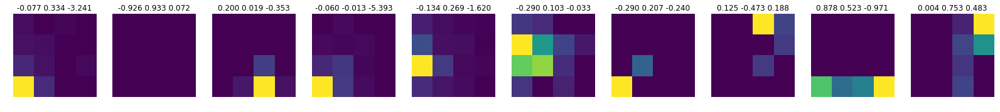

epoch: 50
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5199, device='cuda:1') tensor(3.2538e-07, device='cuda:1', grad_fn=<SumBackward0>)


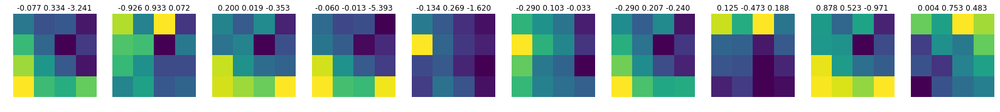

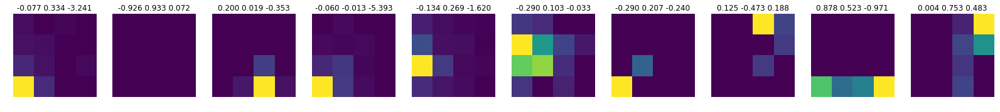

Train loss: -4.505762549565804 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6480, device='cuda:1') tensor(1.6689e-07, device='cuda:1', grad_fn=<SumBackward0>)


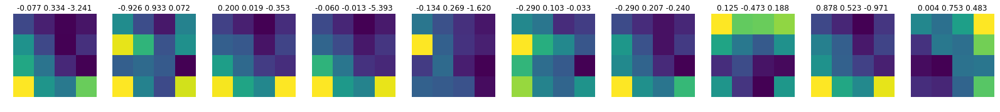

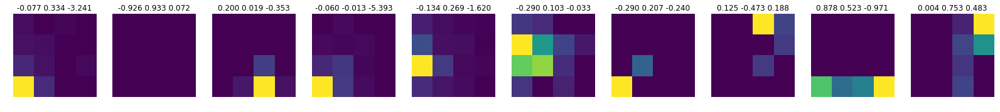

epoch: 51
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6501, device='cuda:1') tensor(1.6689e-07, device='cuda:1', grad_fn=<SumBackward0>)


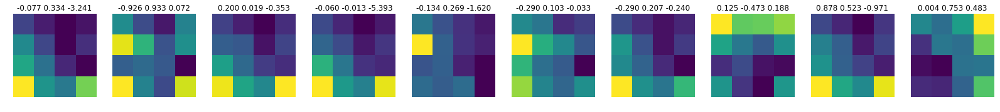

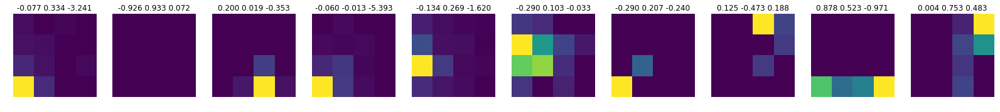

Train loss: -4.602364283224437 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5315, device='cuda:1') tensor(2.9538e-08, device='cuda:1', grad_fn=<SumBackward0>)


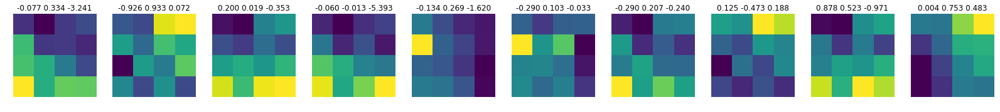

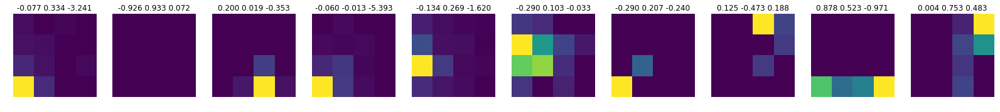

epoch: 52
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5320, device='cuda:1') tensor(2.9538e-08, device='cuda:1', grad_fn=<SumBackward0>)


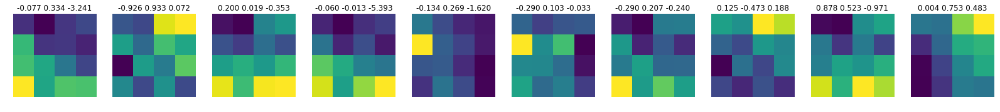

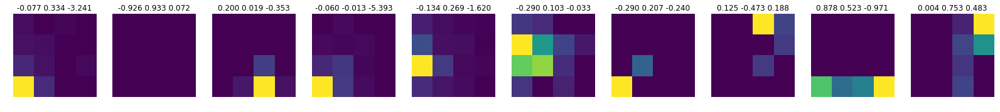

Train loss: -4.608504757269473 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4628, device='cuda:1') tensor(8.3125e-08, device='cuda:1', grad_fn=<SumBackward0>)


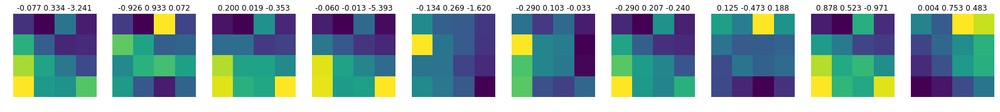

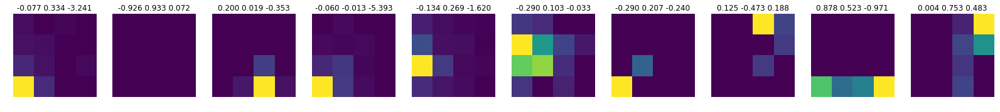

epoch: 53
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4707, device='cuda:1') tensor(8.3125e-08, device='cuda:1', grad_fn=<SumBackward0>)


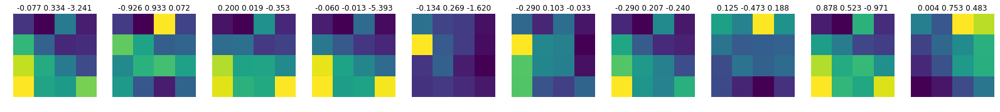

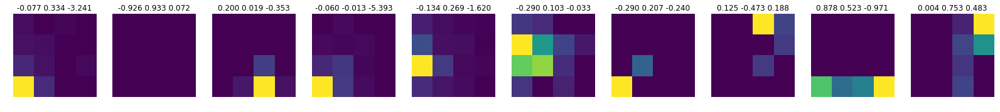

Train loss: -4.408984679676182 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5550, device='cuda:1') tensor(5.3006e-07, device='cuda:1', grad_fn=<SumBackward0>)


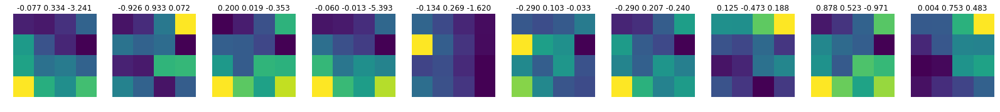

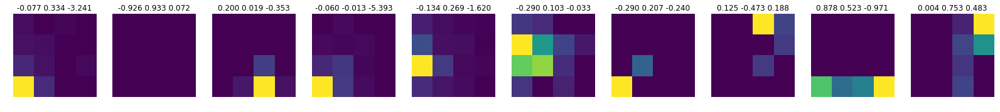

epoch: 54
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5557, device='cuda:1') tensor(5.3006e-07, device='cuda:1', grad_fn=<SumBackward0>)


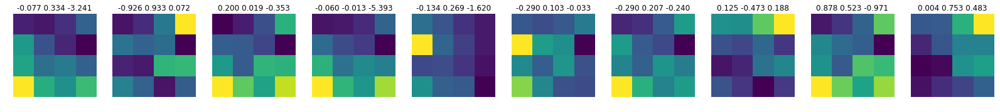

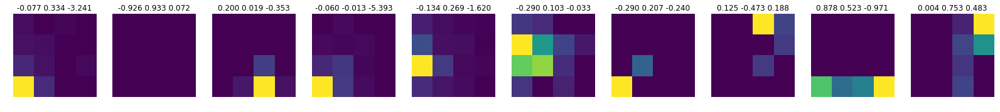

Train loss: -4.539605811384536 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4826, device='cuda:1') tensor(3.3842e-08, device='cuda:1', grad_fn=<SumBackward0>)


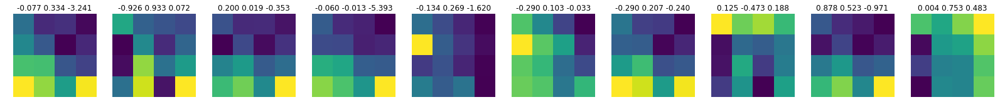

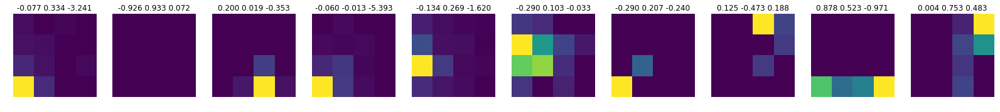

epoch: 55
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4848, device='cuda:1') tensor(3.3842e-08, device='cuda:1', grad_fn=<SumBackward0>)


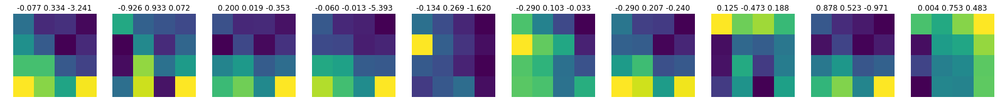

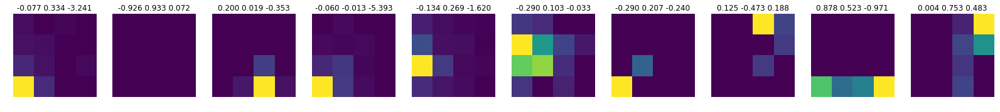

Train loss: -4.5093206326926945 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6650, device='cuda:1') tensor(1.6626e-08, device='cuda:1', grad_fn=<SumBackward0>)


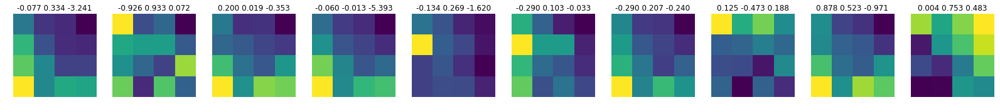

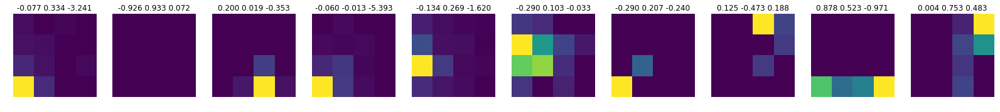

epoch: 56
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6650, device='cuda:1') tensor(1.6626e-08, device='cuda:1', grad_fn=<SumBackward0>)


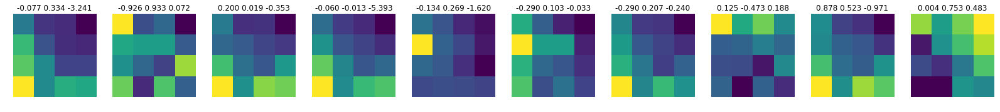

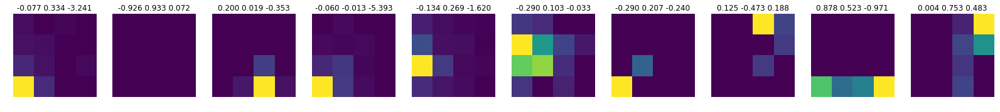

Train loss: -4.6550391548846335 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3601, device='cuda:1') tensor(1.9385e-07, device='cuda:1', grad_fn=<SumBackward0>)


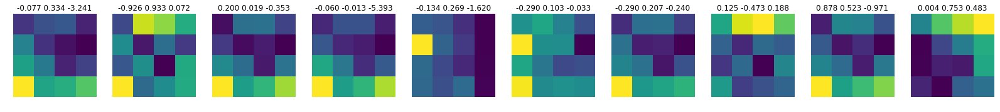

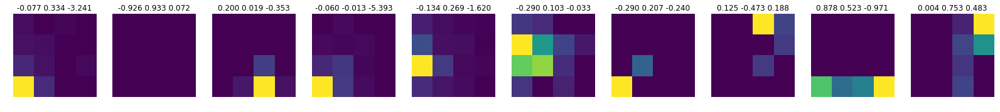

epoch: 57
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3598, device='cuda:1') tensor(1.9385e-07, device='cuda:1', grad_fn=<SumBackward0>)


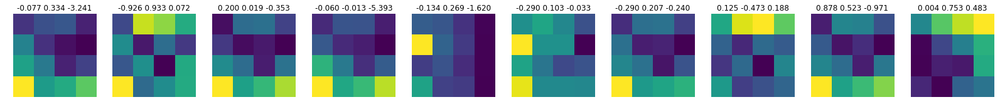

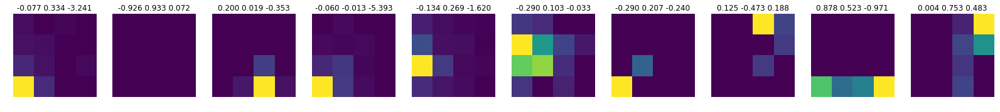

Train loss: -4.224607075255019 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6391, device='cuda:1') tensor(5.7650e-07, device='cuda:1', grad_fn=<SumBackward0>)


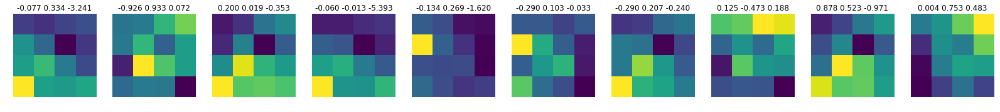

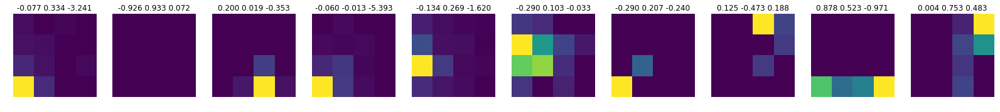

epoch: 58
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6343, device='cuda:1') tensor(5.7650e-07, device='cuda:1', grad_fn=<SumBackward0>)


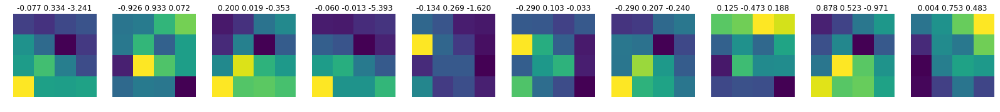

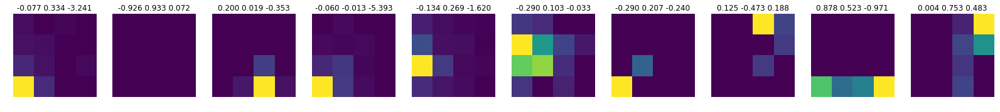

Train loss: -4.712291908016442 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5865, device='cuda:1') tensor(5.6074e-08, device='cuda:1', grad_fn=<SumBackward0>)


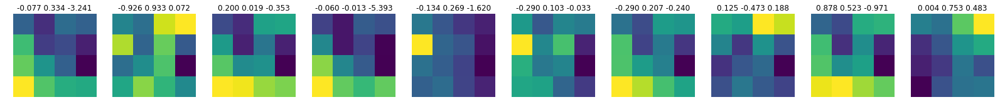

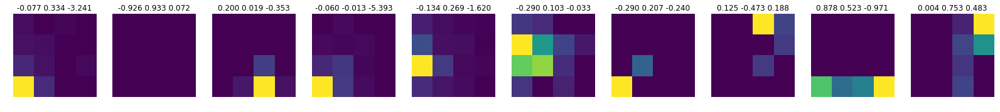

epoch: 59
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5876, device='cuda:1') tensor(5.6074e-08, device='cuda:1', grad_fn=<SumBackward0>)


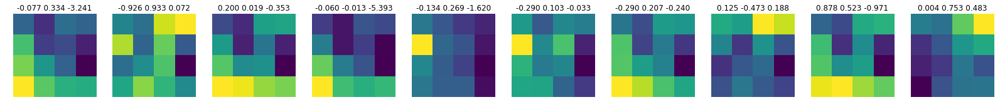

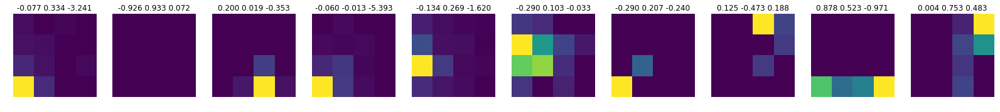

Train loss: -4.67283346323189 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5386, device='cuda:1') tensor(7.1437e-07, device='cuda:1', grad_fn=<SumBackward0>)


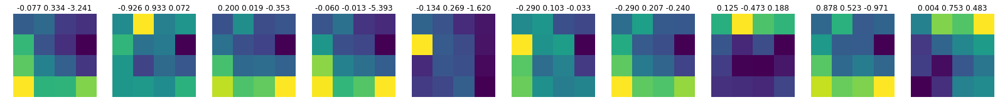

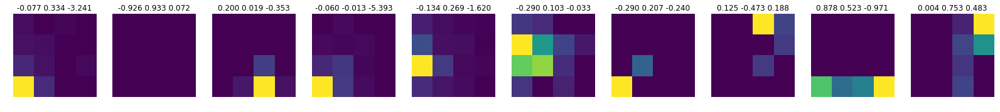

epoch: 60
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5385, device='cuda:1') tensor(7.1437e-07, device='cuda:1', grad_fn=<SumBackward0>)


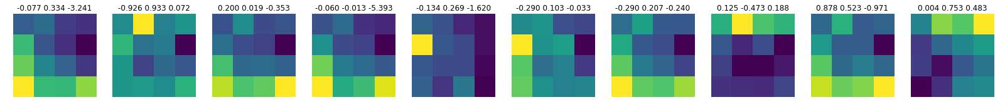

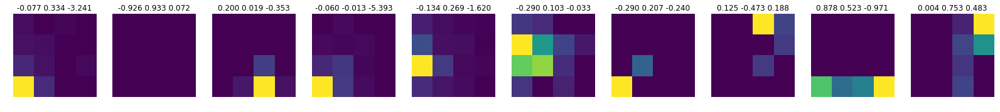

Train loss: -4.4731985832177275 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5824, device='cuda:1') tensor(1.6059e-07, device='cuda:1', grad_fn=<SumBackward0>)


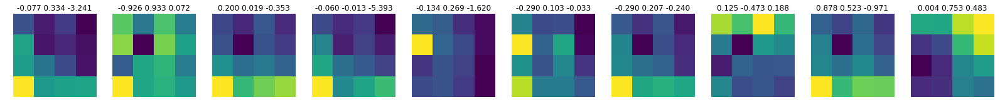

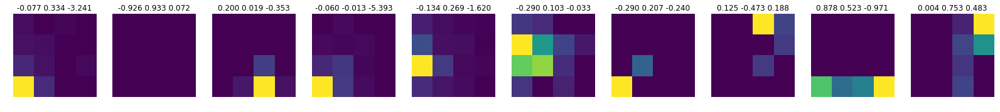

epoch: 61
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5851, device='cuda:1') tensor(1.6059e-07, device='cuda:1', grad_fn=<SumBackward0>)


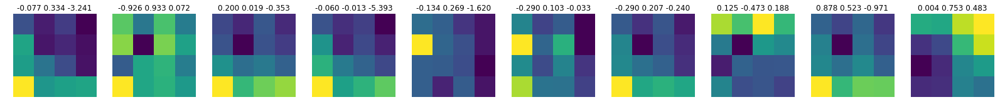

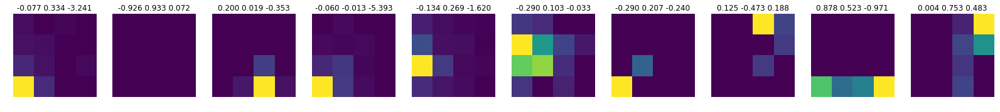

Train loss: -4.613727385208406 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7825, device='cuda:1') tensor(4.2263e-07, device='cuda:1', grad_fn=<SumBackward0>)


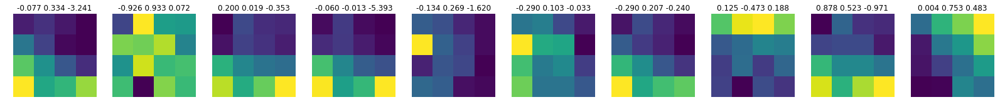

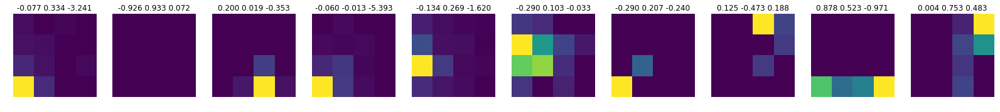

epoch: 62
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7840, device='cuda:1') tensor(4.2263e-07, device='cuda:1', grad_fn=<SumBackward0>)


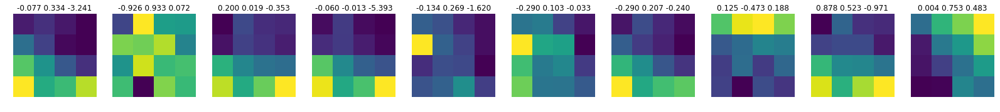

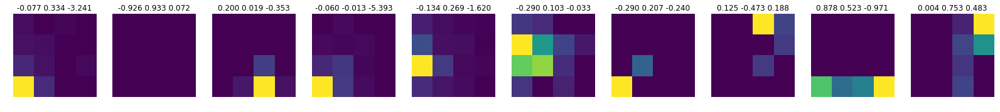

Train loss: -4.650541133472822 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3965, device='cuda:1') tensor(3.9311e-07, device='cuda:1', grad_fn=<SumBackward0>)


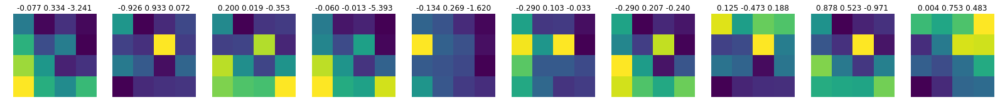

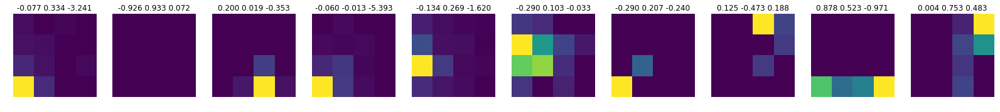

epoch: 63
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3980, device='cuda:1') tensor(3.9311e-07, device='cuda:1', grad_fn=<SumBackward0>)


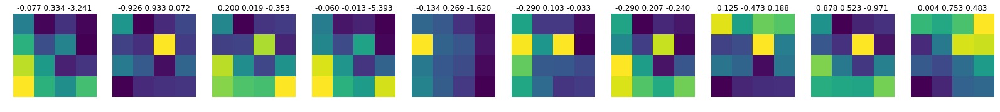

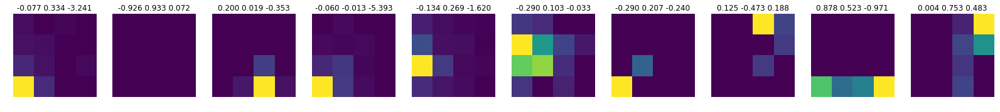

Train loss: -4.454686067543798 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5923, device='cuda:1') tensor(3.9232e-07, device='cuda:1', grad_fn=<SumBackward0>)


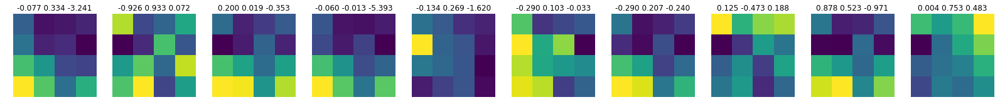

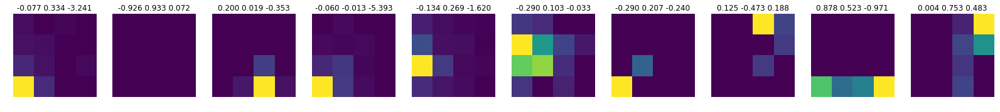

epoch: 64
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5915, device='cuda:1') tensor(3.9232e-07, device='cuda:1', grad_fn=<SumBackward0>)


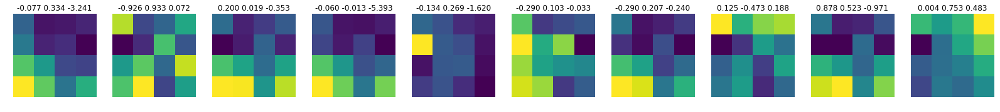

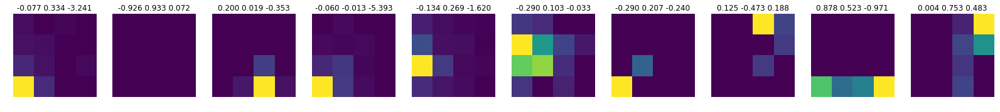

Train loss: -4.619688138108501 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4875, device='cuda:1') tensor(1.6406e-07, device='cuda:1', grad_fn=<SumBackward0>)


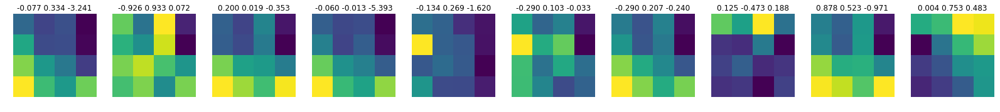

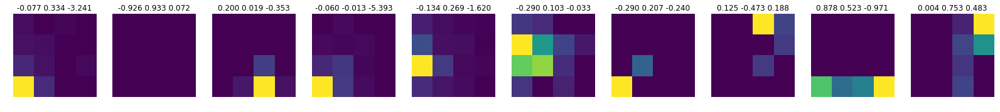

epoch: 65
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4902, device='cuda:1') tensor(1.6406e-07, device='cuda:1', grad_fn=<SumBackward0>)


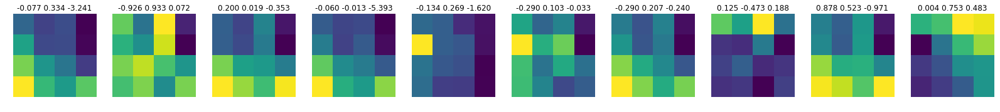

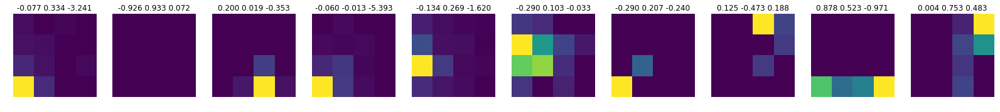

Train loss: -4.429418408008589 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5589, device='cuda:1') tensor(1.5380e-07, device='cuda:1', grad_fn=<SumBackward0>)


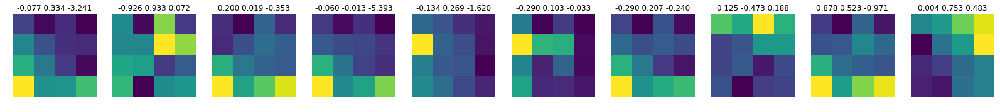

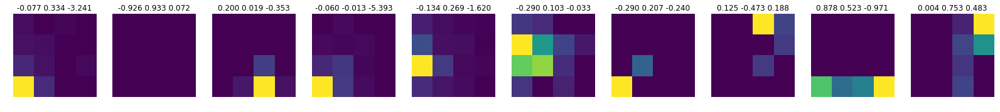

epoch: 66
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5596, device='cuda:1') tensor(1.5380e-07, device='cuda:1', grad_fn=<SumBackward0>)


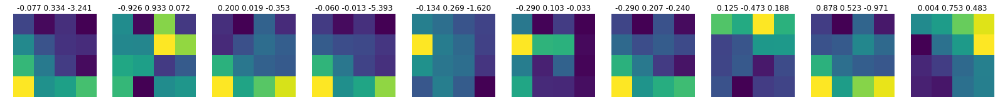

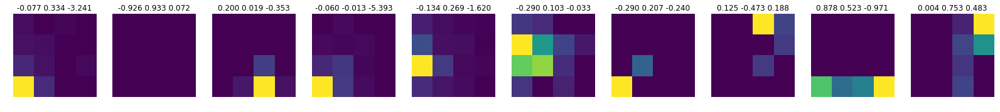

Train loss: -4.483090419264482 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4348, device='cuda:1') tensor(5.4706e-07, device='cuda:1', grad_fn=<SumBackward0>)


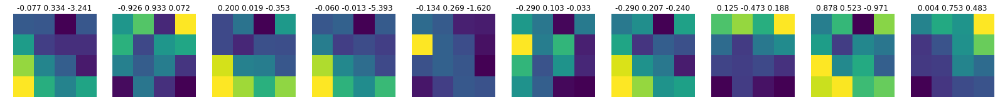

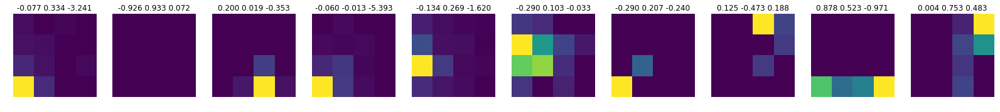

epoch: 67
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4339, device='cuda:1') tensor(5.4706e-07, device='cuda:1', grad_fn=<SumBackward0>)


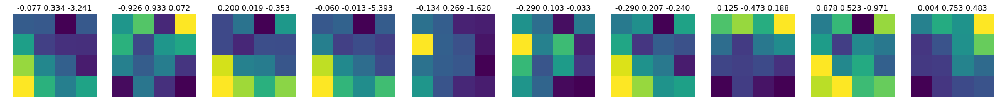

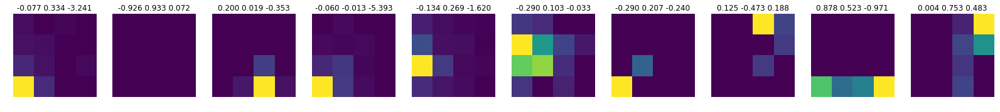

Train loss: -4.533006964785807 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8095, device='cuda:1') tensor(1.0017e-07, device='cuda:1', grad_fn=<SumBackward0>)


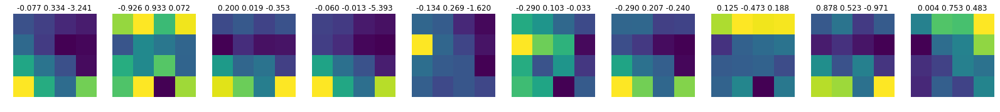

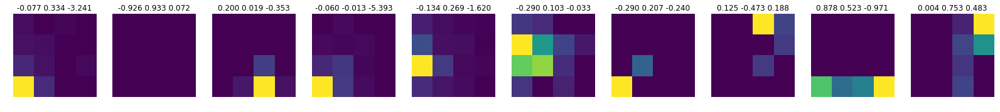

epoch: 68
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8109, device='cuda:1') tensor(1.0017e-07, device='cuda:1', grad_fn=<SumBackward0>)


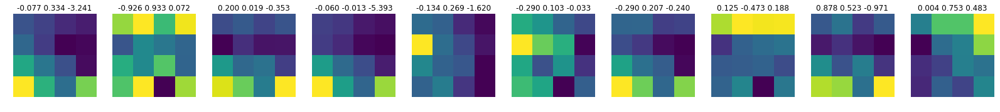

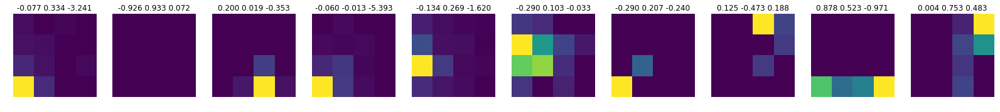

Train loss: -4.79923830296839 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6946, device='cuda:1') tensor(1.3634e-07, device='cuda:1', grad_fn=<SumBackward0>)


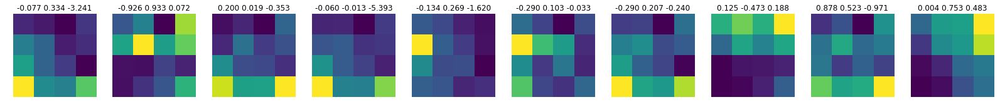

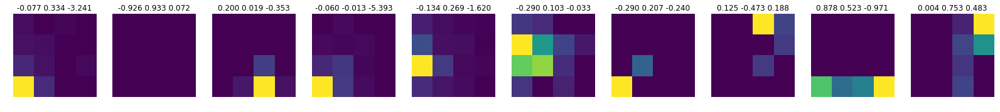

epoch: 69
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6955, device='cuda:1') tensor(1.3634e-07, device='cuda:1', grad_fn=<SumBackward0>)


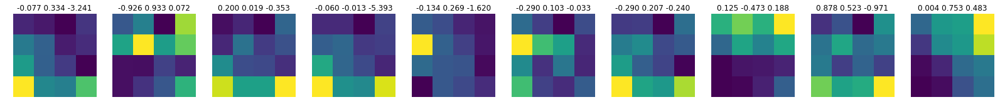

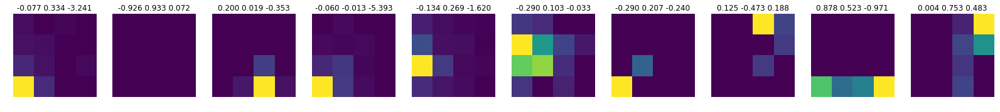

Train loss: -4.662347417866936 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7511, device='cuda:1') tensor(7.5219e-08, device='cuda:1', grad_fn=<SumBackward0>)


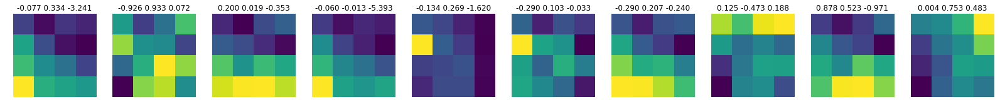

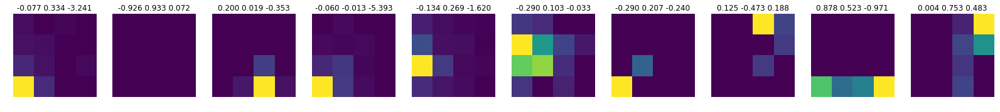

epoch: 70
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7491, device='cuda:1') tensor(7.5219e-08, device='cuda:1', grad_fn=<SumBackward0>)


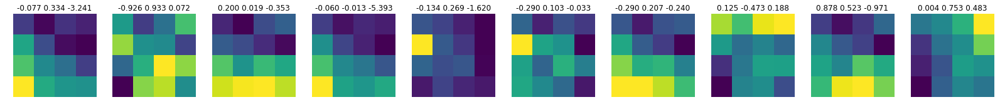

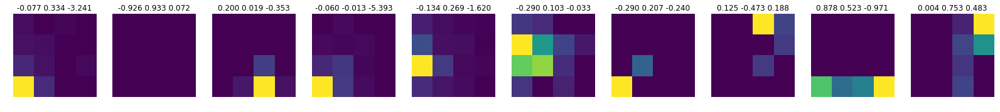

Train loss: -4.756786673946693 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5667, device='cuda:1') tensor(2.7868e-08, device='cuda:1', grad_fn=<SumBackward0>)


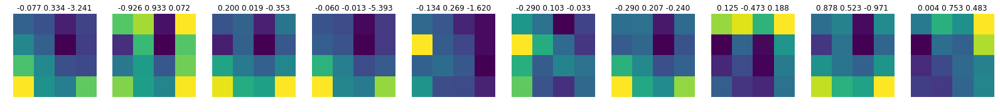

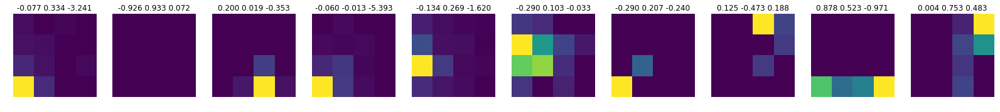

epoch: 71
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5621, device='cuda:1') tensor(2.7868e-08, device='cuda:1', grad_fn=<SumBackward0>)


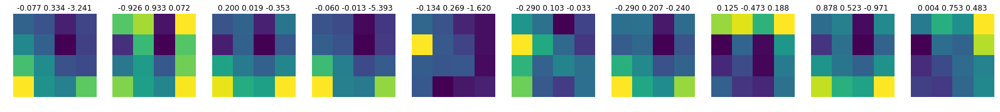

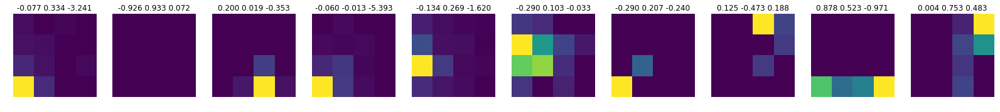

Train loss: -4.517764168484755 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5934, device='cuda:1') tensor(2.6495e-07, device='cuda:1', grad_fn=<SumBackward0>)


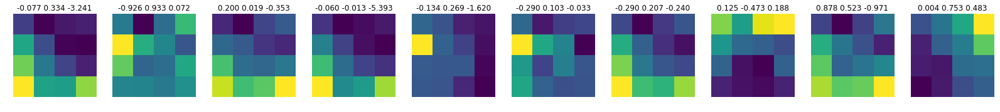

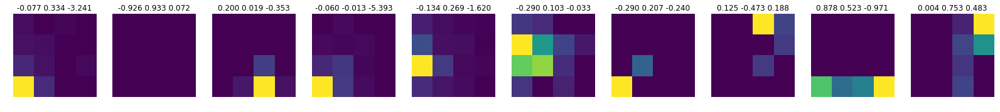

epoch: 72
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5906, device='cuda:1') tensor(2.6495e-07, device='cuda:1', grad_fn=<SumBackward0>)


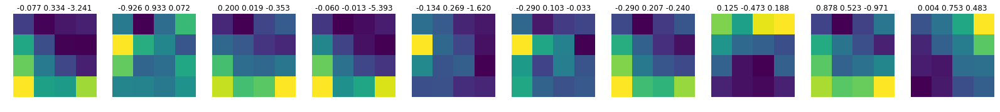

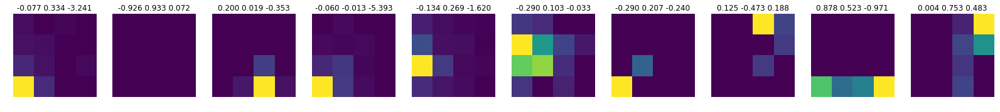

Train loss: -4.491535033597481 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4460, device='cuda:1') tensor(2.0984e-07, device='cuda:1', grad_fn=<SumBackward0>)


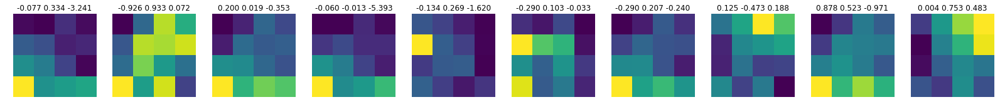

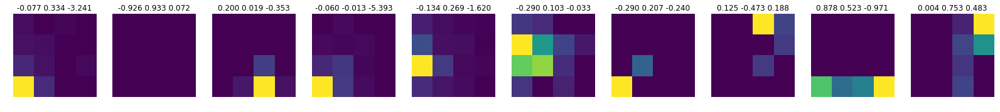

epoch: 73
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4446, device='cuda:1') tensor(2.0984e-07, device='cuda:1', grad_fn=<SumBackward0>)


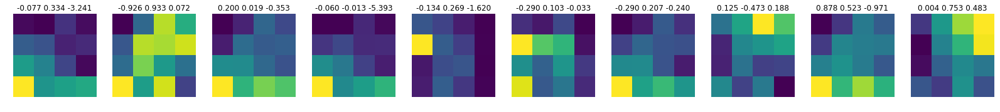

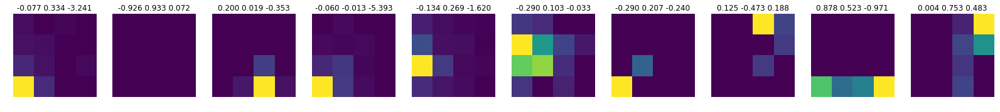

Train loss: -4.445697206553809 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6621, device='cuda:1') tensor(1.1263e-07, device='cuda:1', grad_fn=<SumBackward0>)


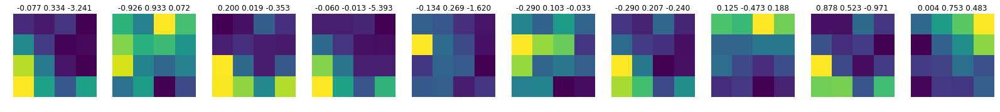

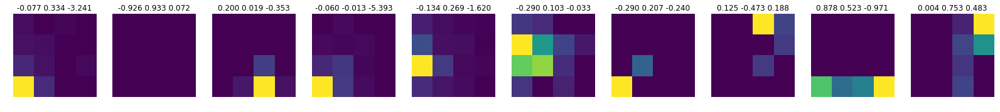

epoch: 74
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6646, device='cuda:1') tensor(1.1263e-07, device='cuda:1', grad_fn=<SumBackward0>)


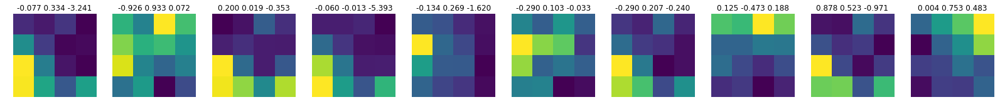

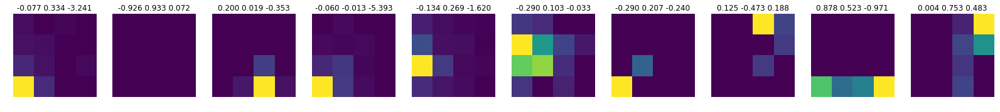

Train loss: -4.579667827184529 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6099, device='cuda:1') tensor(2.0024e-07, device='cuda:1', grad_fn=<SumBackward0>)


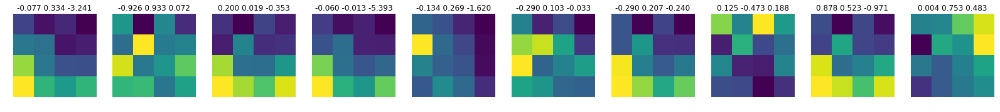

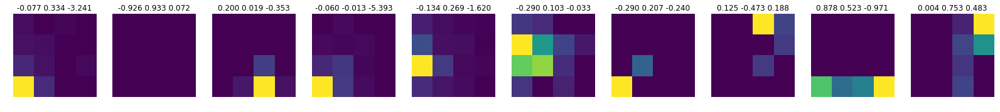

epoch: 75
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6087, device='cuda:1') tensor(2.0024e-07, device='cuda:1', grad_fn=<SumBackward0>)


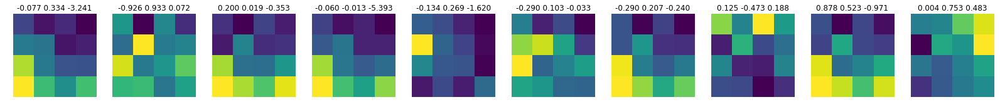

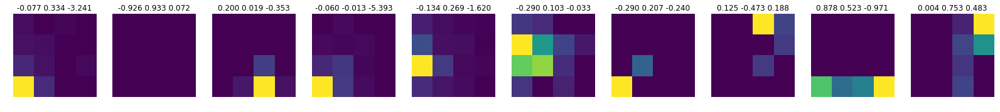

Train loss: -4.734804935041071 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6847, device='cuda:1') tensor(7.4951e-08, device='cuda:1', grad_fn=<SumBackward0>)


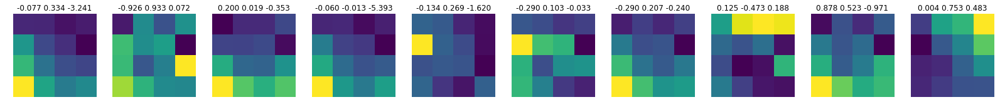

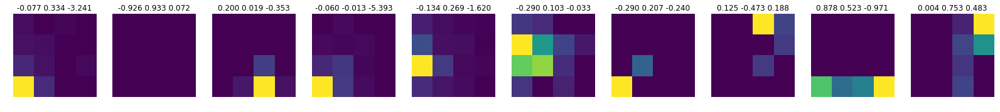

epoch: 76
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6846, device='cuda:1') tensor(7.4951e-08, device='cuda:1', grad_fn=<SumBackward0>)


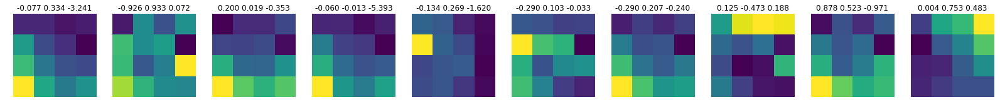

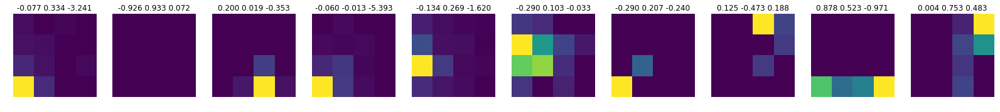

Train loss: -4.570615846373851 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6695, device='cuda:1') tensor(8.7913e-09, device='cuda:1', grad_fn=<SumBackward0>)


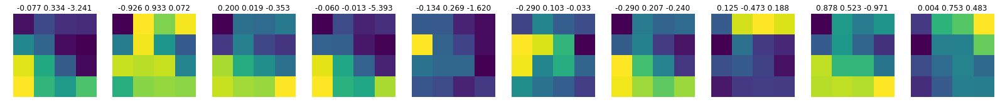

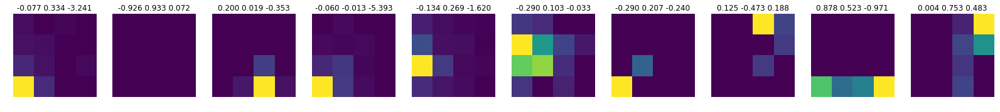

epoch: 77
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6679, device='cuda:1') tensor(8.7913e-09, device='cuda:1', grad_fn=<SumBackward0>)


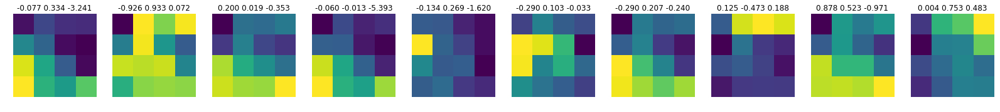

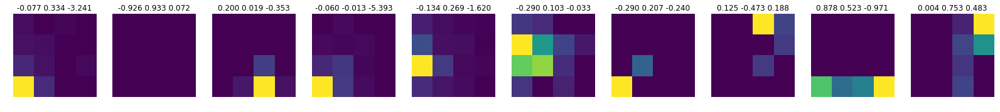

Train loss: -4.702113320310101 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4759, device='cuda:1') tensor(2.2488e-07, device='cuda:1', grad_fn=<SumBackward0>)


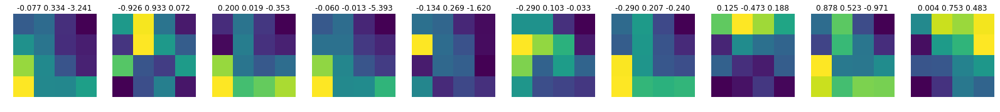

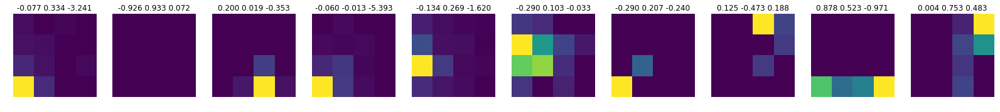

epoch: 78
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4776, device='cuda:1') tensor(2.2488e-07, device='cuda:1', grad_fn=<SumBackward0>)


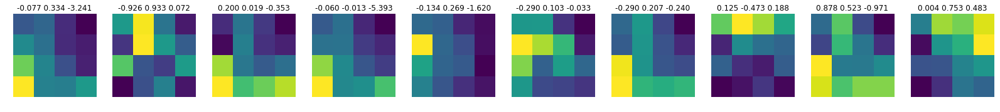

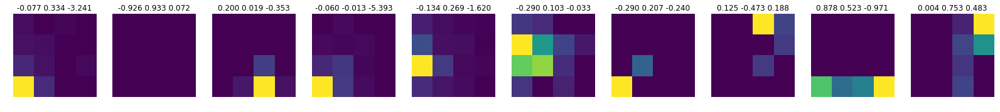

Train loss: -4.431976878254896 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4267, device='cuda:1') tensor(8.7292e-08, device='cuda:1', grad_fn=<SumBackward0>)


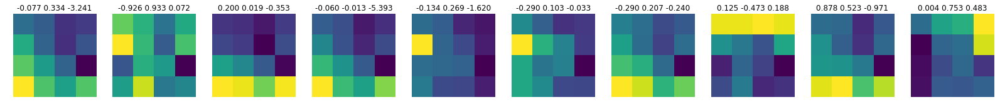

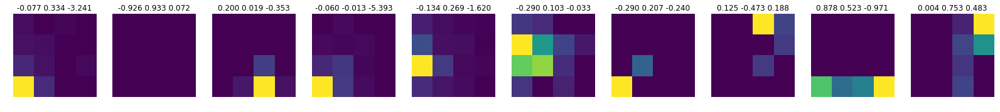

epoch: 79
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4272, device='cuda:1') tensor(8.7292e-08, device='cuda:1', grad_fn=<SumBackward0>)


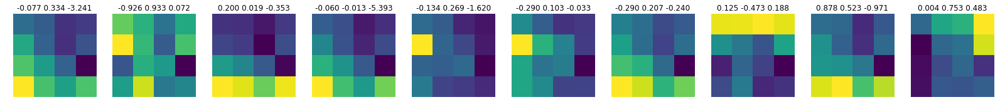

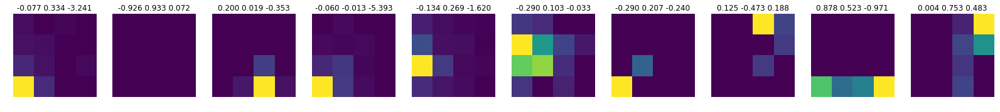

Train loss: -4.417957513595013 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7100, device='cuda:1') tensor(1.1133e-07, device='cuda:1', grad_fn=<SumBackward0>)


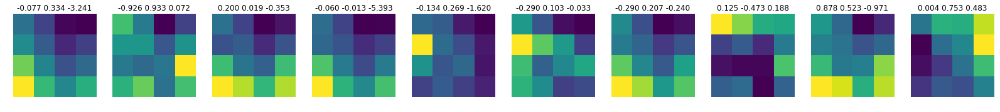

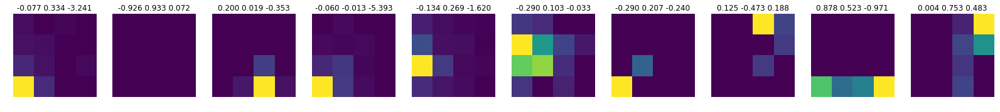

epoch: 80
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7092, device='cuda:1') tensor(1.1133e-07, device='cuda:1', grad_fn=<SumBackward0>)


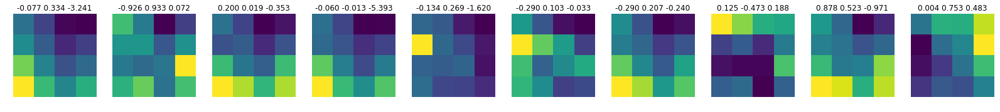

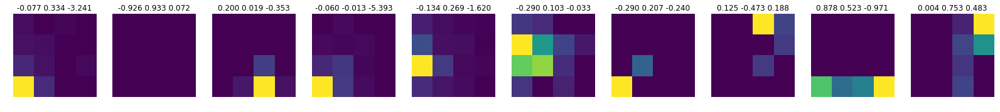

Train loss: -4.75865477369422 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4317, device='cuda:1') tensor(1.2460e-07, device='cuda:1', grad_fn=<SumBackward0>)


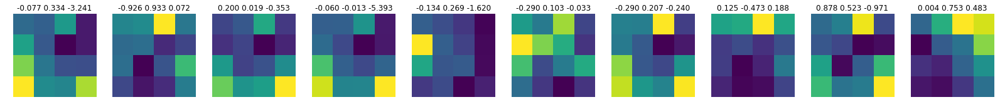

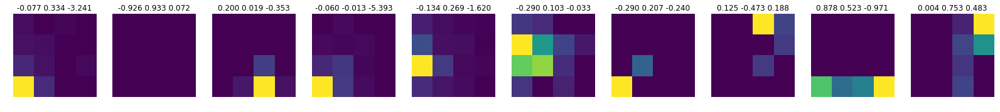

epoch: 81
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4323, device='cuda:1') tensor(1.2460e-07, device='cuda:1', grad_fn=<SumBackward0>)


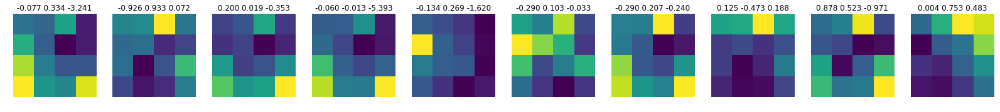

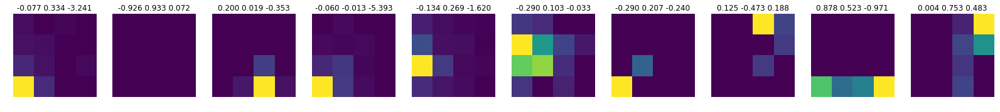

Train loss: -4.5255311633859625 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6056, device='cuda:1') tensor(3.2483e-07, device='cuda:1', grad_fn=<SumBackward0>)


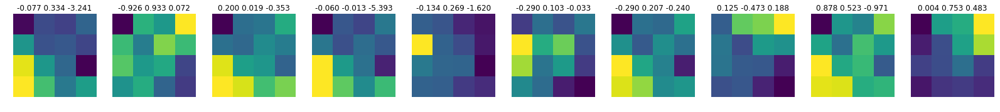

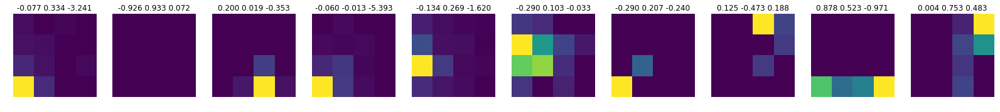

epoch: 82
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6013, device='cuda:1') tensor(3.2483e-07, device='cuda:1', grad_fn=<SumBackward0>)


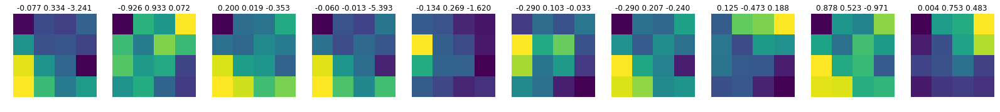

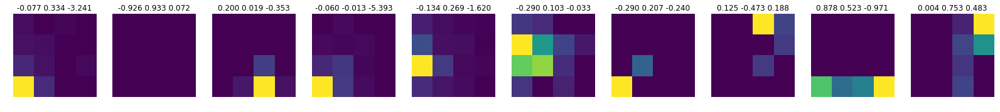

Train loss: -4.605596543627682 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6372, device='cuda:1') tensor(9.6174e-09, device='cuda:1', grad_fn=<SumBackward0>)


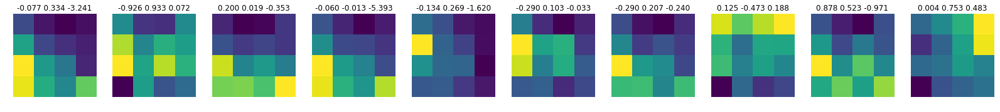

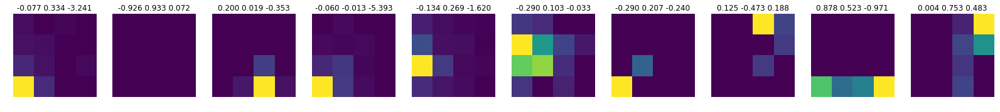

epoch: 83
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6372, device='cuda:1') tensor(9.6174e-09, device='cuda:1', grad_fn=<SumBackward0>)


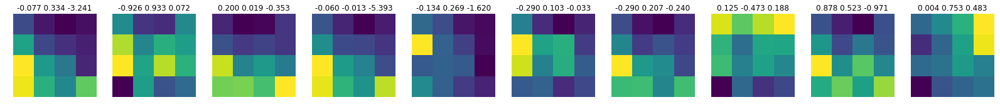

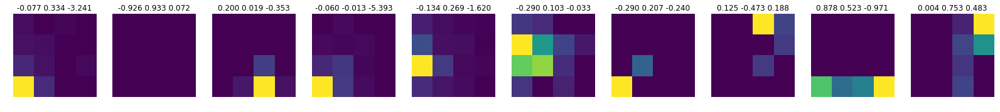

Train loss: -4.651453978214684 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8048, device='cuda:1') tensor(5.0922e-07, device='cuda:1', grad_fn=<SumBackward0>)


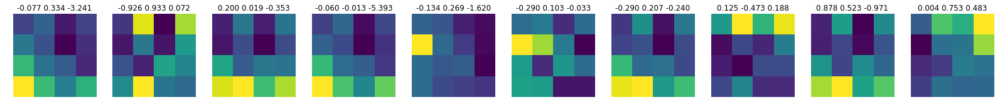

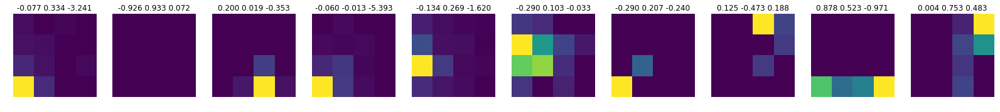

epoch: 84
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8030, device='cuda:1') tensor(5.0922e-07, device='cuda:1', grad_fn=<SumBackward0>)


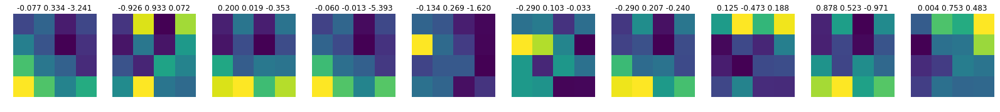

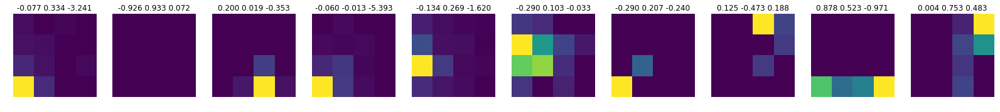

Train loss: -4.9228448434829355 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7037, device='cuda:1') tensor(2.3564e-07, device='cuda:1', grad_fn=<SumBackward0>)


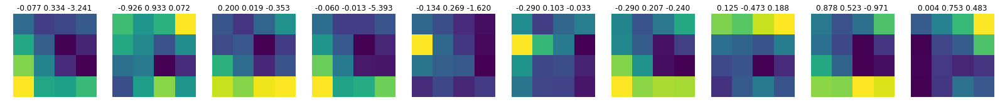

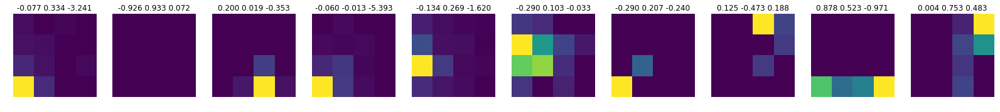

epoch: 85
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7043, device='cuda:1') tensor(2.3564e-07, device='cuda:1', grad_fn=<SumBackward0>)


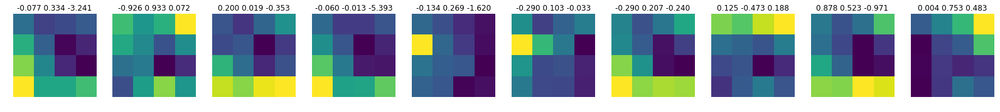

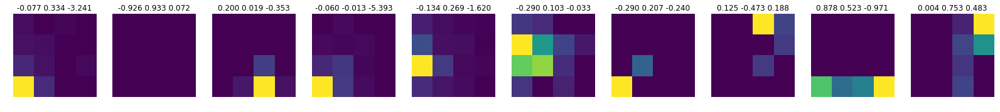

Train loss: -4.734741245894587 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7652, device='cuda:1') tensor(1.3980e-07, device='cuda:1', grad_fn=<SumBackward0>)


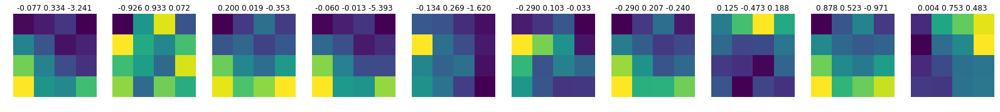

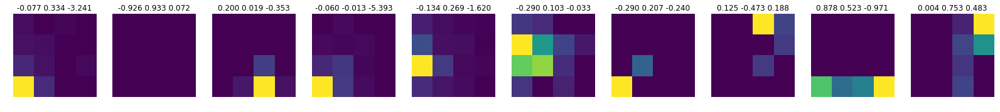

epoch: 86
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7657, device='cuda:1') tensor(1.3980e-07, device='cuda:1', grad_fn=<SumBackward0>)


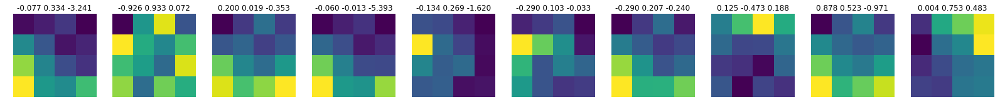

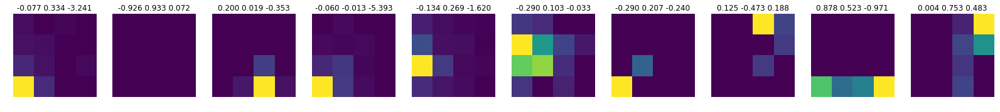

Train loss: -4.713938372209386 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8629, device='cuda:1') tensor(7.3921e-08, device='cuda:1', grad_fn=<SumBackward0>)


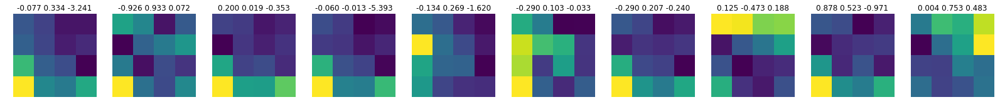

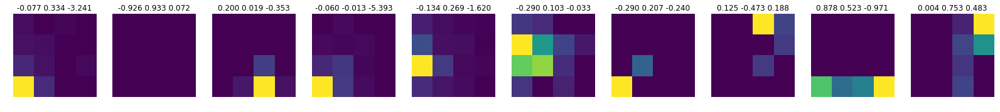

epoch: 87
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8635, device='cuda:1') tensor(7.3921e-08, device='cuda:1', grad_fn=<SumBackward0>)


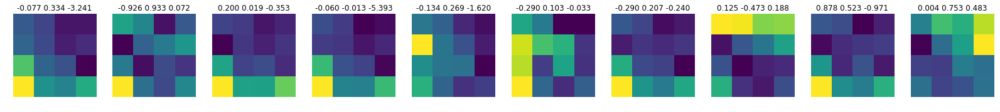

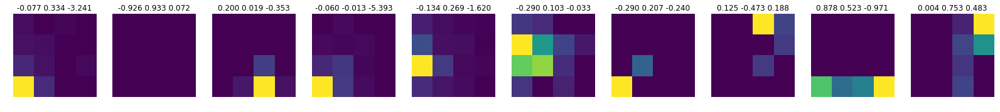

Train loss: -4.4566858607152176 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4940, device='cuda:1') tensor(3.4696e-07, device='cuda:1', grad_fn=<SumBackward0>)


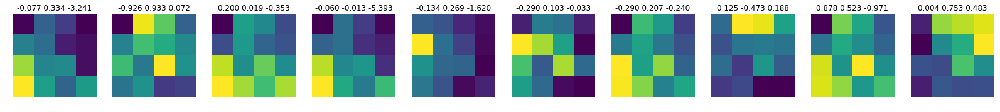

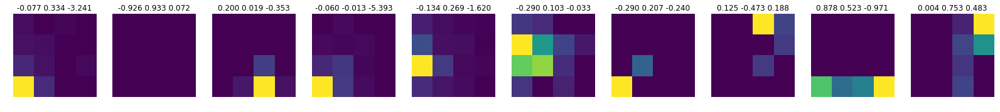

epoch: 88
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4879, device='cuda:1') tensor(3.4696e-07, device='cuda:1', grad_fn=<SumBackward0>)


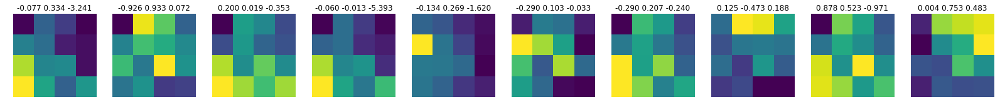

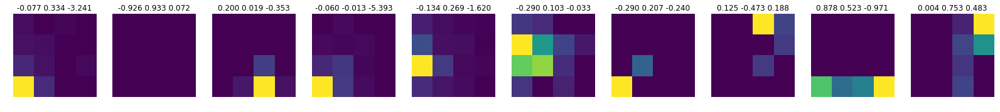

Train loss: -4.804101160204108 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5740, device='cuda:1') tensor(5.6841e-07, device='cuda:1', grad_fn=<SumBackward0>)


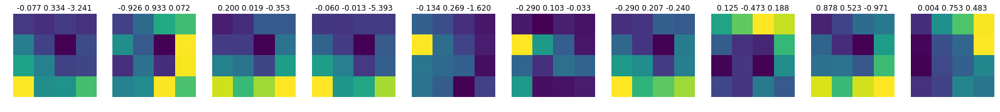

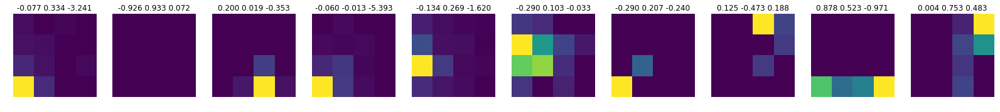

epoch: 89
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5756, device='cuda:1') tensor(5.6841e-07, device='cuda:1', grad_fn=<SumBackward0>)


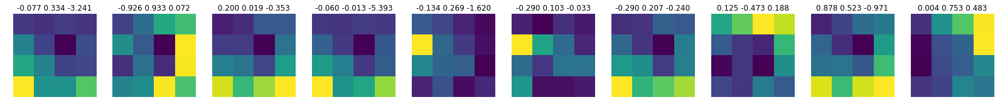

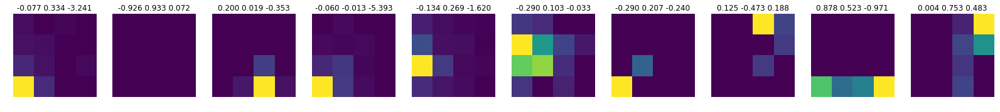

Train loss: -4.593235633182461 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7718, device='cuda:1') tensor(1.6319e-07, device='cuda:1', grad_fn=<SumBackward0>)


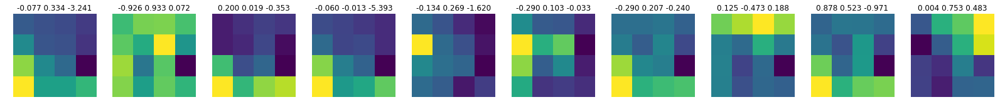

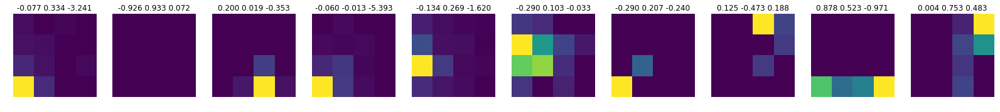

epoch: 90
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7709, device='cuda:1') tensor(1.6319e-07, device='cuda:1', grad_fn=<SumBackward0>)


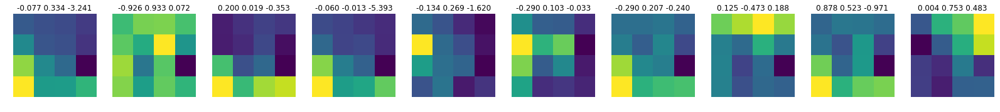

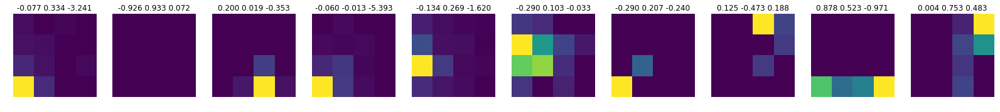

Train loss: -4.75964643979549 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4861, device='cuda:1') tensor(3.6400e-07, device='cuda:1', grad_fn=<SumBackward0>)


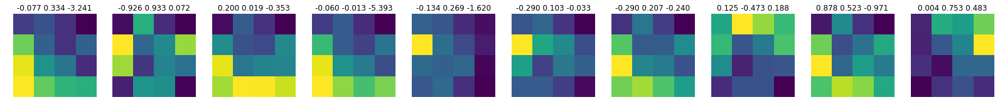

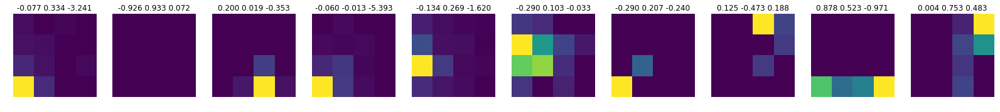

epoch: 91
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4845, device='cuda:1') tensor(3.6400e-07, device='cuda:1', grad_fn=<SumBackward0>)


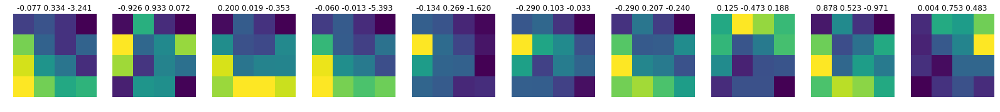

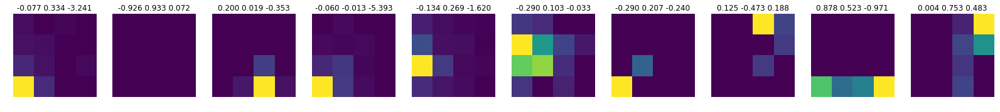

Train loss: -4.420902403647656 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4301, device='cuda:1') tensor(3.4462e-07, device='cuda:1', grad_fn=<SumBackward0>)


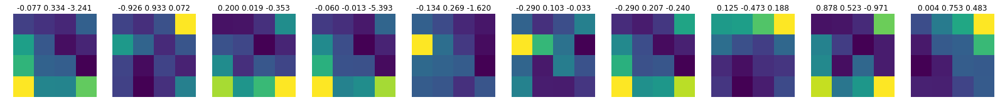

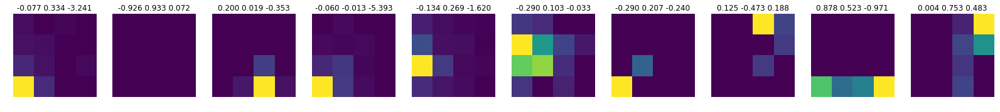

epoch: 92
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4293, device='cuda:1') tensor(3.4462e-07, device='cuda:1', grad_fn=<SumBackward0>)


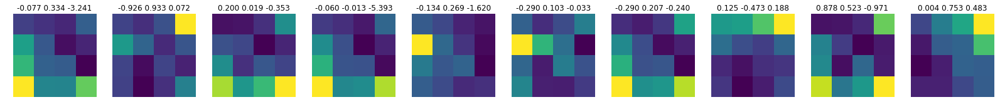

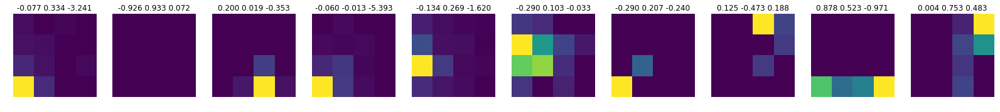

Train loss: -4.435765396907137 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6899, device='cuda:1') tensor(3.0881e-08, device='cuda:1', grad_fn=<SumBackward0>)


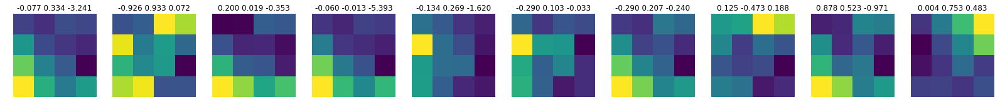

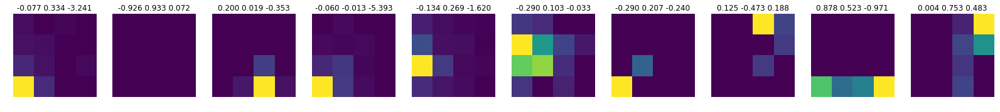

epoch: 93
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6902, device='cuda:1') tensor(3.0881e-08, device='cuda:1', grad_fn=<SumBackward0>)


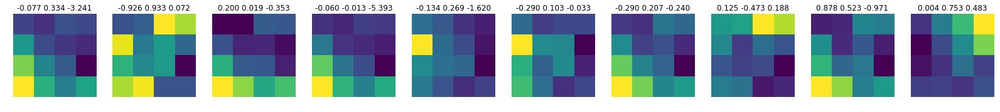

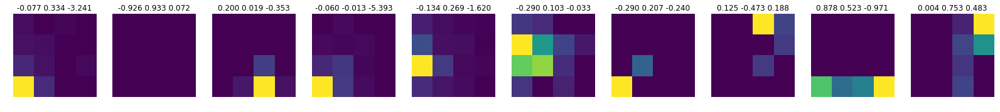

Train loss: -4.624123290304308 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7014, device='cuda:1') tensor(8.0832e-07, device='cuda:1', grad_fn=<SumBackward0>)


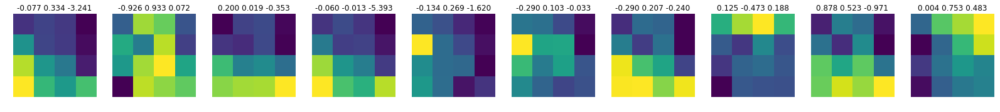

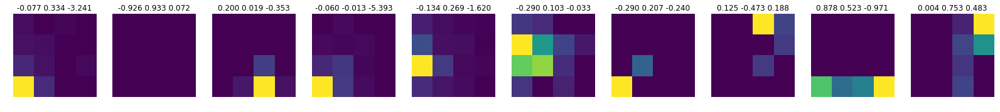

epoch: 94
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7055, device='cuda:1') tensor(8.0832e-07, device='cuda:1', grad_fn=<SumBackward0>)


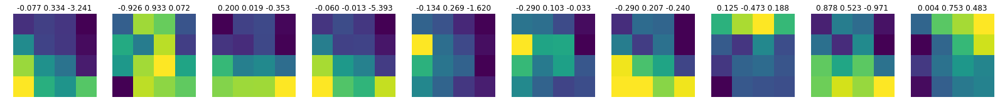

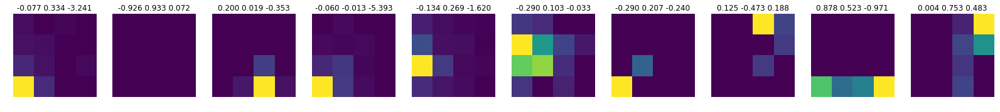

Train loss: -4.745254401465884 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4632, device='cuda:1') tensor(5.9701e-07, device='cuda:1', grad_fn=<SumBackward0>)


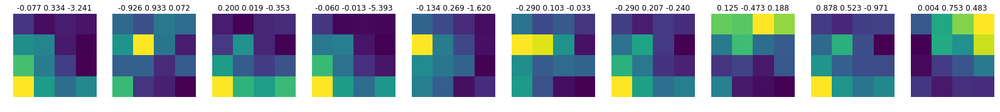

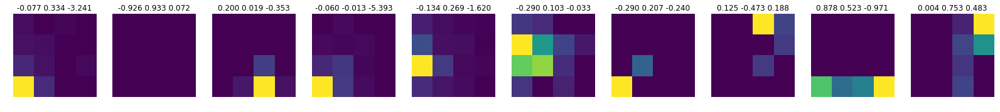

epoch: 95
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4638, device='cuda:1') tensor(5.9701e-07, device='cuda:1', grad_fn=<SumBackward0>)


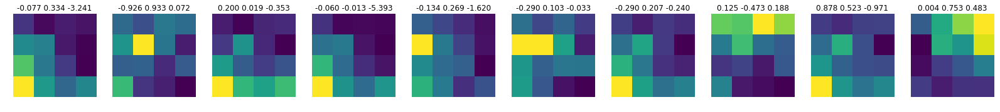

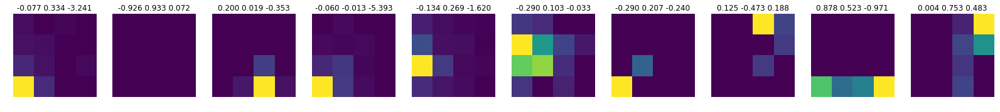

Train loss: -4.483134811202838 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6513, device='cuda:1') tensor(1.1033e-07, device='cuda:1', grad_fn=<SumBackward0>)


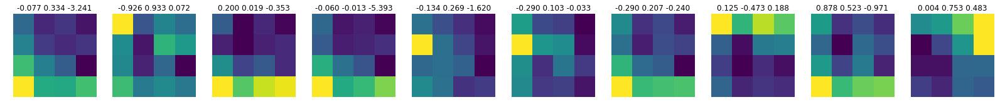

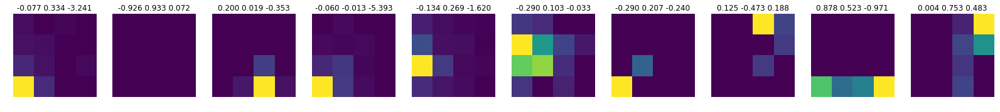

epoch: 96
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6490, device='cuda:1') tensor(1.1033e-07, device='cuda:1', grad_fn=<SumBackward0>)


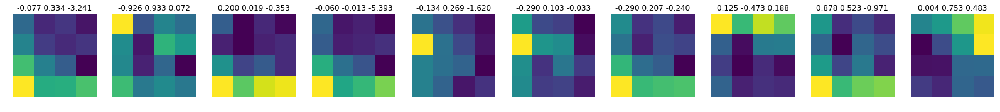

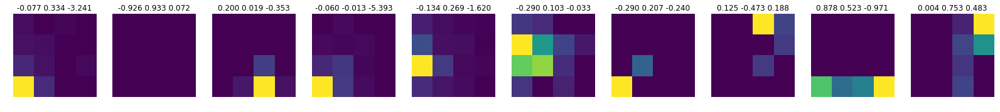

Train loss: -4.637389692315095 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5770, device='cuda:1') tensor(8.0737e-09, device='cuda:1', grad_fn=<SumBackward0>)


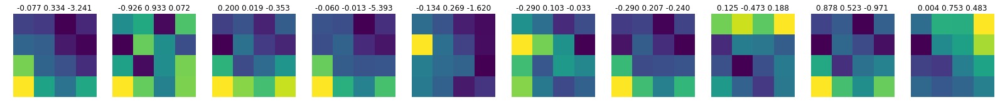

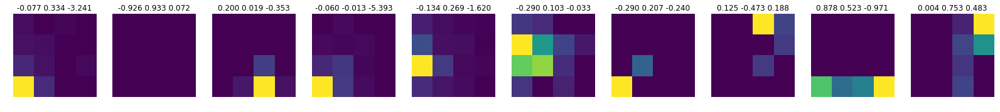

epoch: 97
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5775, device='cuda:1') tensor(8.0737e-09, device='cuda:1', grad_fn=<SumBackward0>)


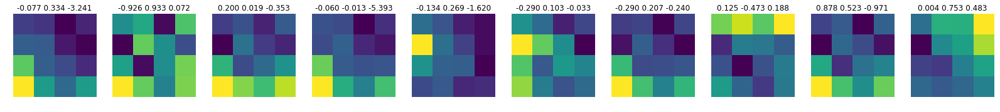

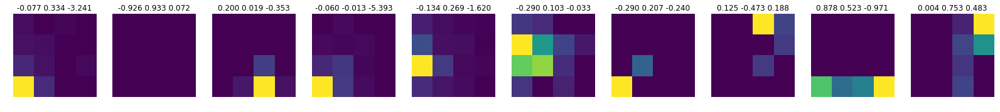

Train loss: -4.51182662893088 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7366, device='cuda:1') tensor(6.4612e-08, device='cuda:1', grad_fn=<SumBackward0>)


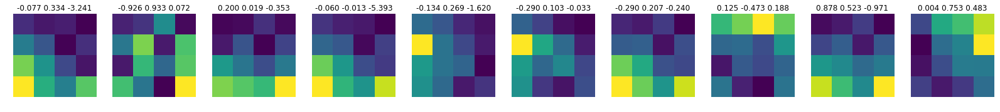

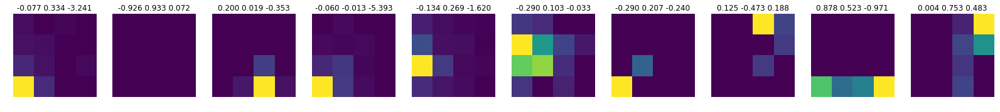

epoch: 98
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7378, device='cuda:1') tensor(6.4612e-08, device='cuda:1', grad_fn=<SumBackward0>)


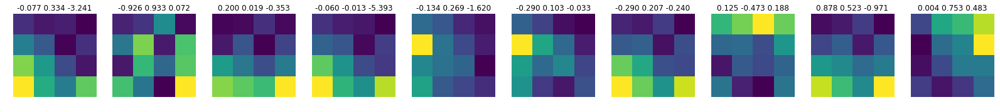

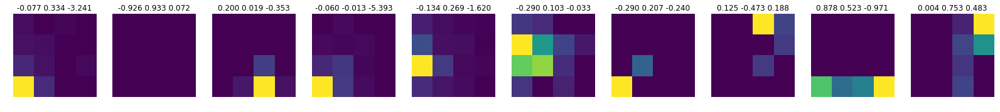

Train loss: -4.709635830207875 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8307, device='cuda:1') tensor(8.9081e-08, device='cuda:1', grad_fn=<SumBackward0>)


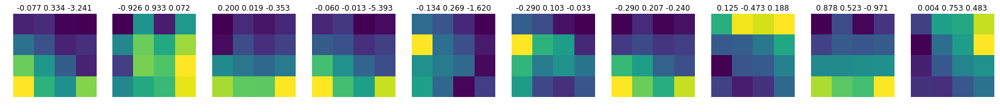

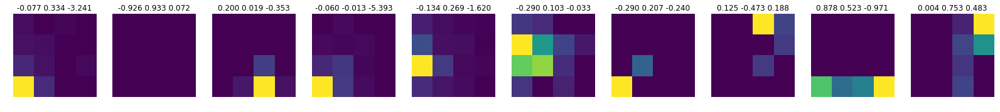

epoch: 99
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8316, device='cuda:1') tensor(8.9081e-08, device='cuda:1', grad_fn=<SumBackward0>)


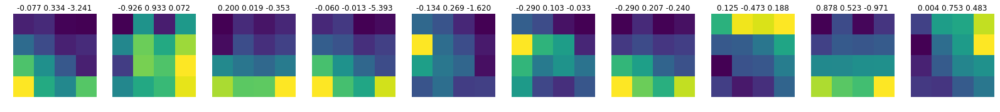

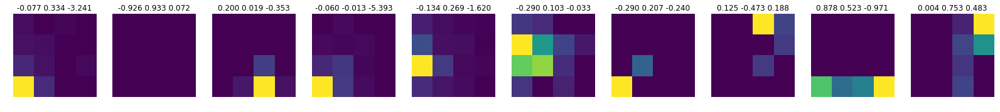

Train loss: -4.783922063282615 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6497, device='cuda:1') tensor(1.7456e-07, device='cuda:1', grad_fn=<SumBackward0>)


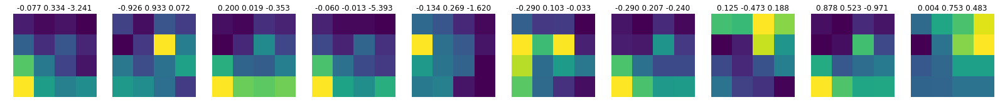

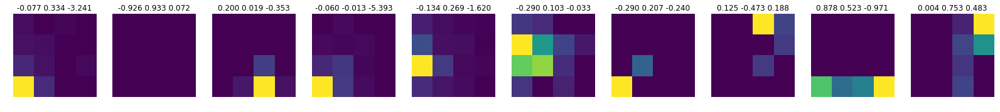

epoch: 100
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6483, device='cuda:1') tensor(1.7456e-07, device='cuda:1', grad_fn=<SumBackward0>)


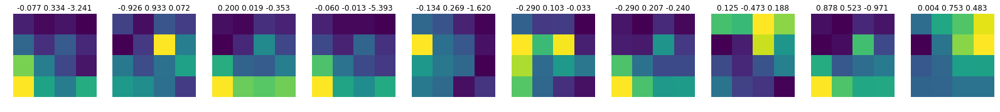

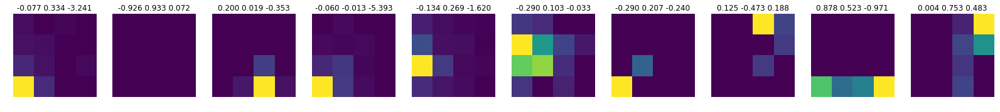

Train loss: -4.708708753701433 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6561, device='cuda:1') tensor(5.6068e-07, device='cuda:1', grad_fn=<SumBackward0>)


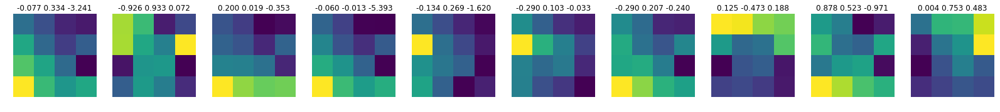

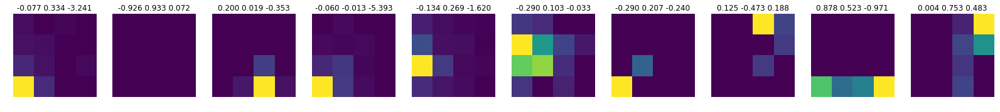

epoch: 101
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6556, device='cuda:1') tensor(5.6068e-07, device='cuda:1', grad_fn=<SumBackward0>)


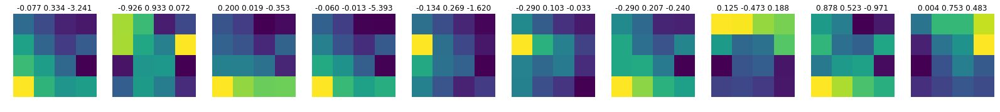

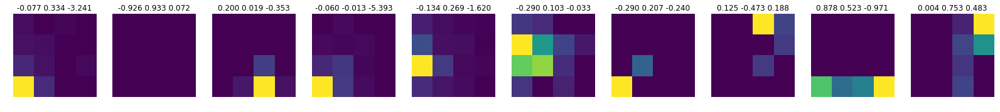

Train loss: -4.6232967995148595 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6885, device='cuda:1') tensor(1.2506e-07, device='cuda:1', grad_fn=<SumBackward0>)


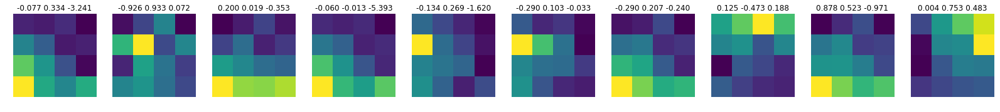

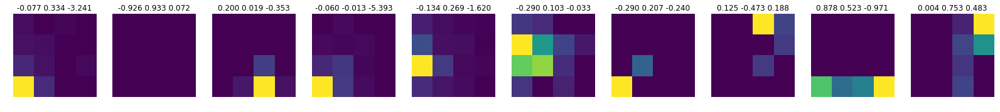

epoch: 102
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6885, device='cuda:1') tensor(1.2506e-07, device='cuda:1', grad_fn=<SumBackward0>)


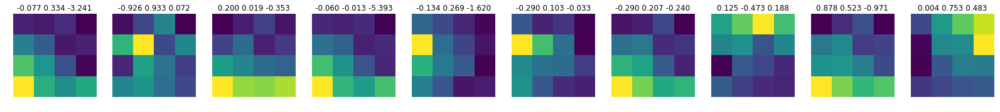

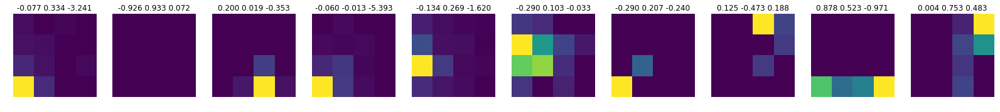

Train loss: -4.61522445433487 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6919, device='cuda:1') tensor(3.7116e-07, device='cuda:1', grad_fn=<SumBackward0>)


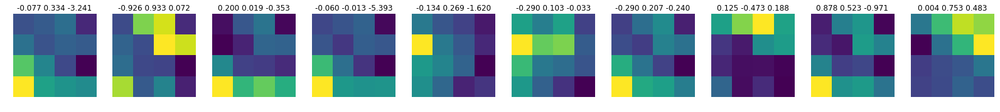

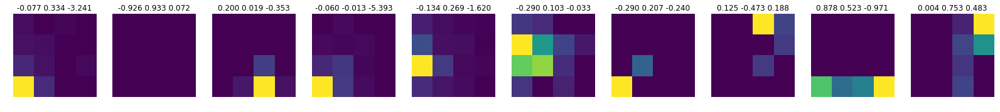

epoch: 103
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6924, device='cuda:1') tensor(3.7116e-07, device='cuda:1', grad_fn=<SumBackward0>)


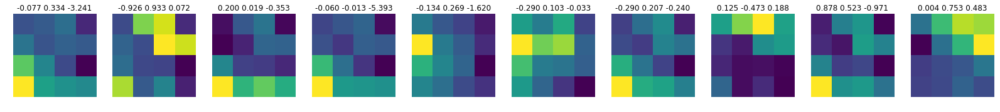

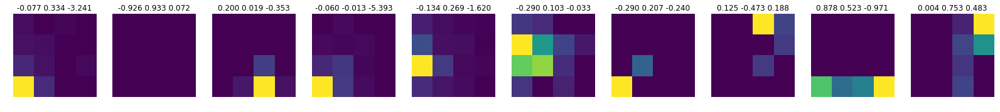

Train loss: -4.615327678744752 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5480, device='cuda:1') tensor(1.2034e-06, device='cuda:1', grad_fn=<SumBackward0>)


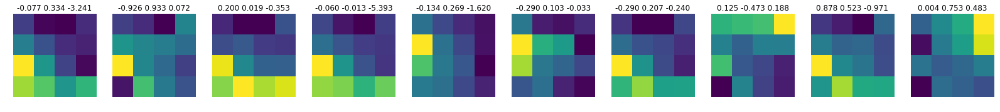

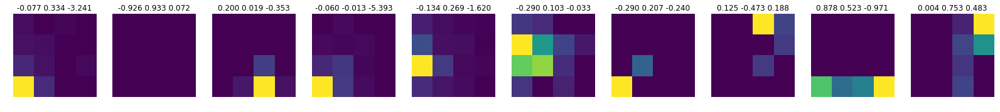

epoch: 104
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5484, device='cuda:1') tensor(1.2034e-06, device='cuda:1', grad_fn=<SumBackward0>)


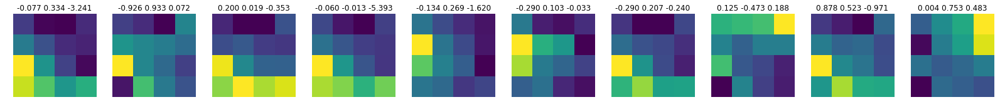

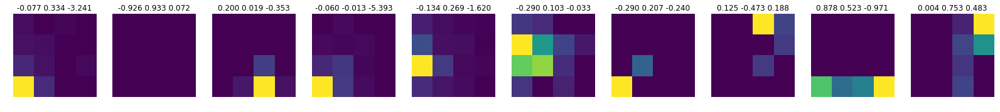

Train loss: -4.569940683922387 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6819, device='cuda:1') tensor(1.7327e-07, device='cuda:1', grad_fn=<SumBackward0>)


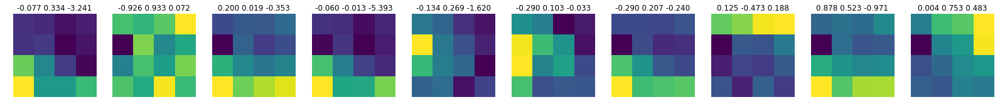

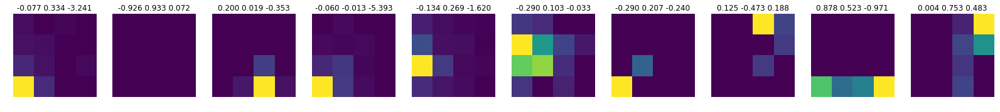

epoch: 105
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6819, device='cuda:1') tensor(1.7327e-07, device='cuda:1', grad_fn=<SumBackward0>)


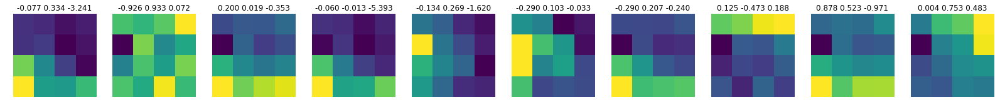

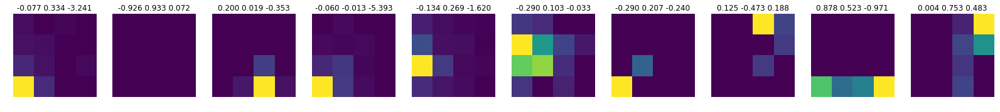

Train loss: -4.640513933469197 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9655, device='cuda:1') tensor(3.8305e-07, device='cuda:1', grad_fn=<SumBackward0>)


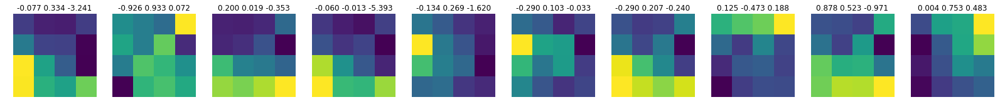

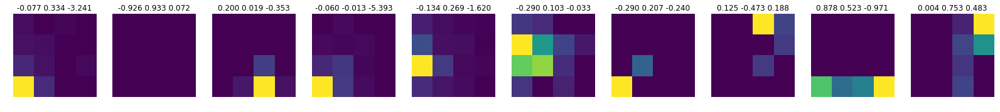

epoch: 106
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9652, device='cuda:1') tensor(3.8305e-07, device='cuda:1', grad_fn=<SumBackward0>)


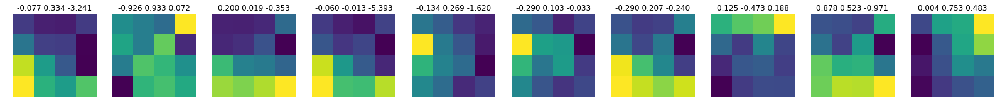

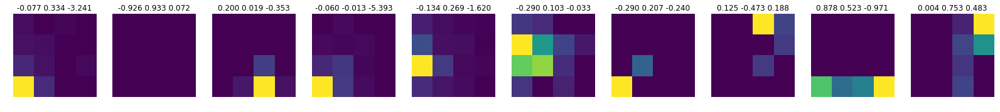

Train loss: -4.963573006354786 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7689, device='cuda:1') tensor(1.3003e-07, device='cuda:1', grad_fn=<SumBackward0>)


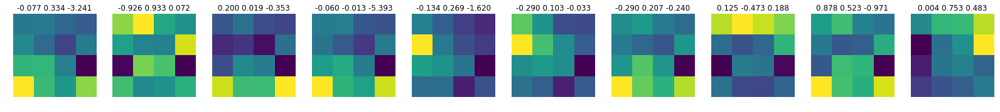

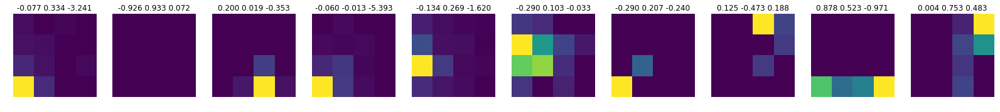

epoch: 107
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7698, device='cuda:1') tensor(1.3003e-07, device='cuda:1', grad_fn=<SumBackward0>)


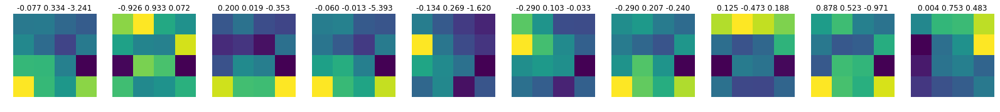

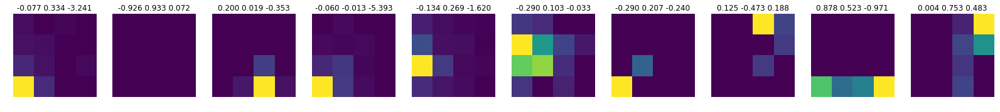

Train loss: -4.740364394392299 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6303, device='cuda:1') tensor(1.9164e-07, device='cuda:1', grad_fn=<SumBackward0>)


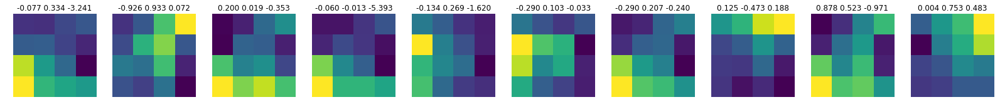

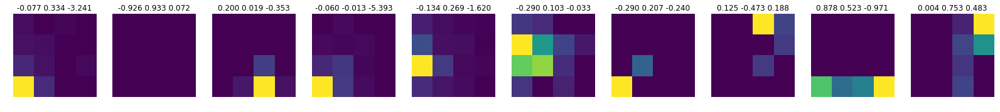

epoch: 108
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6298, device='cuda:1') tensor(1.9164e-07, device='cuda:1', grad_fn=<SumBackward0>)


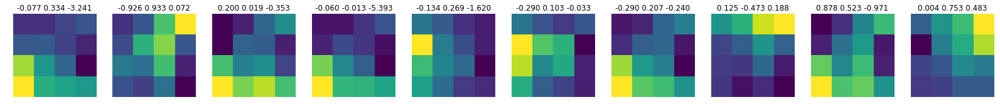

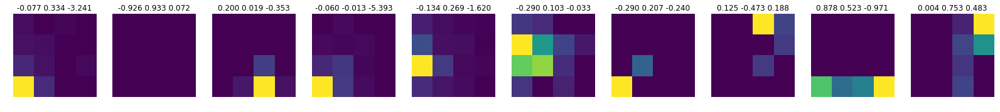

Train loss: -4.655347332155152 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4355, device='cuda:1') tensor(2.0622e-07, device='cuda:1', grad_fn=<SumBackward0>)


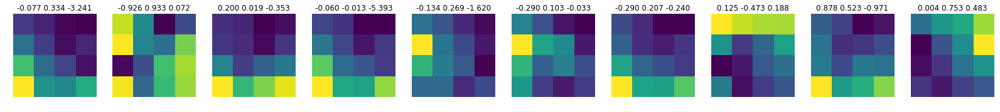

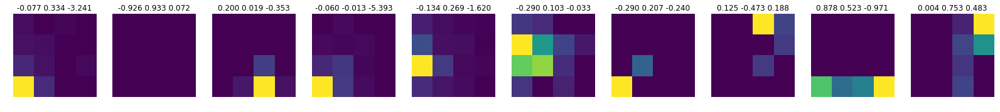

epoch: 109
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4336, device='cuda:1') tensor(2.0622e-07, device='cuda:1', grad_fn=<SumBackward0>)


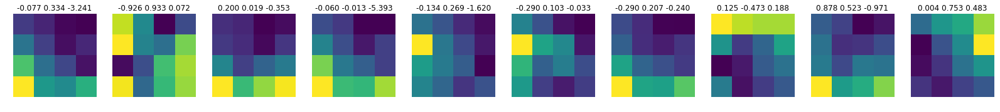

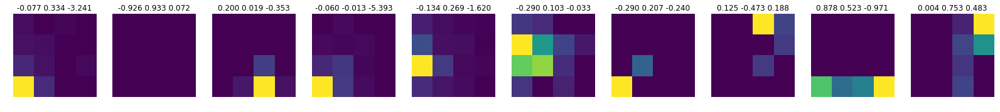

Train loss: -4.306784259043527 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6611, device='cuda:1') tensor(1.2779e-08, device='cuda:1', grad_fn=<SumBackward0>)


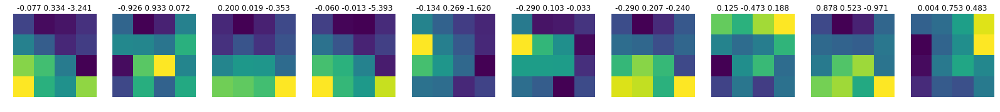

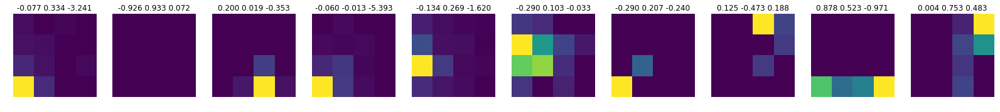

epoch: 110
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6606, device='cuda:1') tensor(1.2779e-08, device='cuda:1', grad_fn=<SumBackward0>)


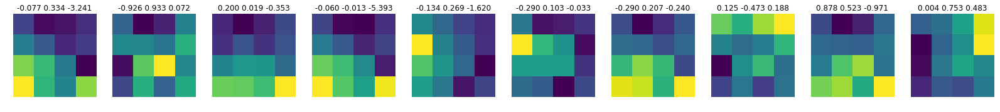

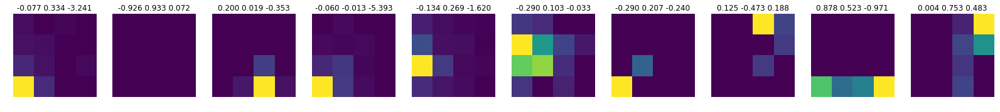

Train loss: -4.720602526325127 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5200, device='cuda:1') tensor(4.6144e-07, device='cuda:1', grad_fn=<SumBackward0>)


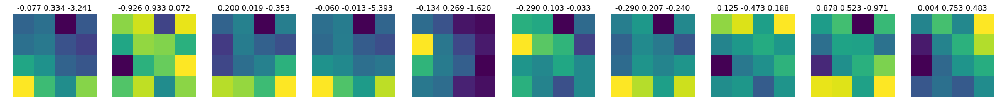

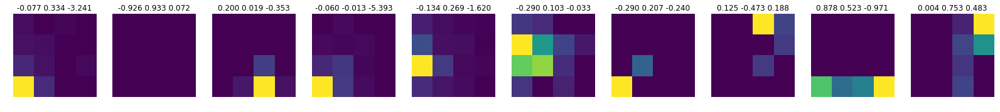

epoch: 111
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5248, device='cuda:1') tensor(4.6144e-07, device='cuda:1', grad_fn=<SumBackward0>)


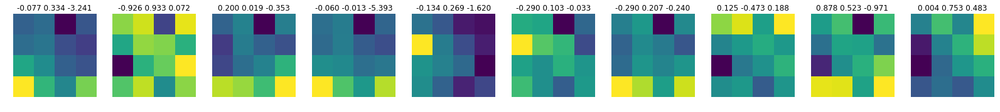

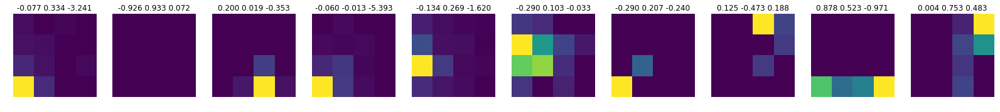

Train loss: -4.763803940800441 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7472, device='cuda:1') tensor(6.9668e-08, device='cuda:1', grad_fn=<SumBackward0>)


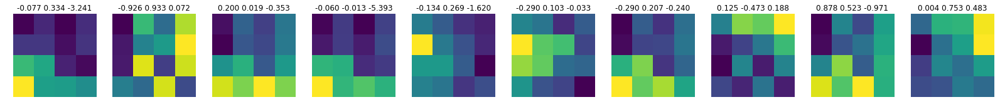

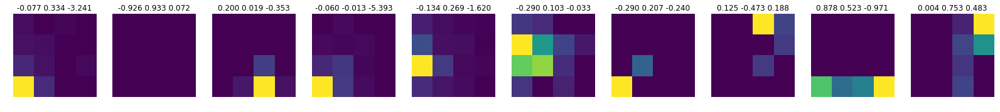

epoch: 112
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7442, device='cuda:1') tensor(6.9668e-08, device='cuda:1', grad_fn=<SumBackward0>)


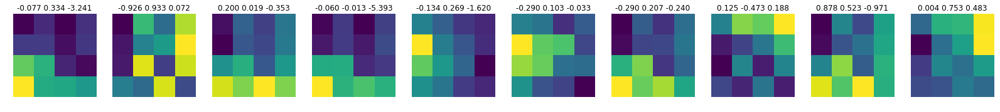

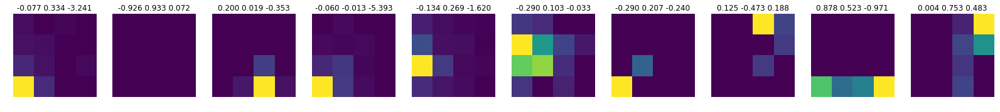

Train loss: -4.870992669536622 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5415, device='cuda:1') tensor(7.8274e-08, device='cuda:1', grad_fn=<SumBackward0>)


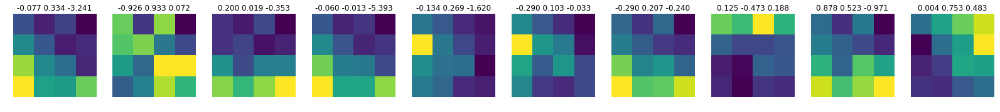

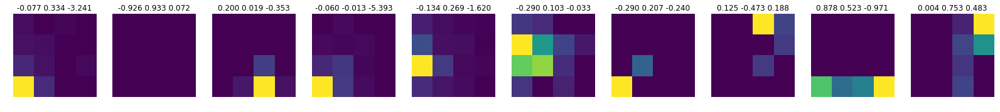

epoch: 113
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5413, device='cuda:1') tensor(7.8274e-08, device='cuda:1', grad_fn=<SumBackward0>)


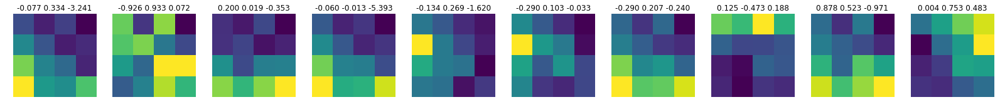

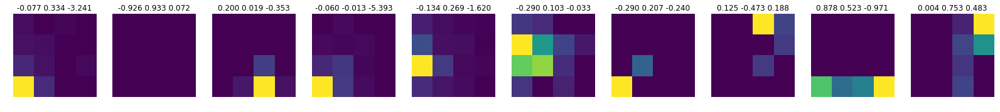

Train loss: -4.46098752150144 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7764, device='cuda:1') tensor(1.6173e-07, device='cuda:1', grad_fn=<SumBackward0>)


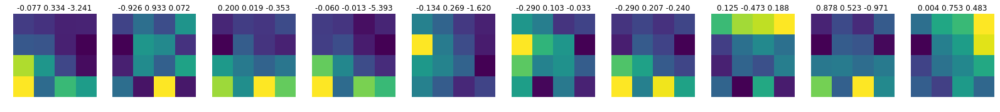

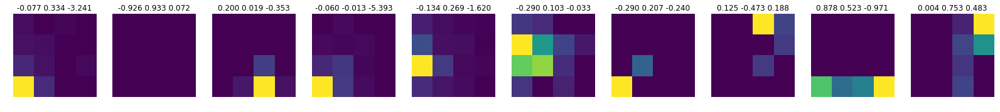

epoch: 114
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7769, device='cuda:1') tensor(1.6173e-07, device='cuda:1', grad_fn=<SumBackward0>)


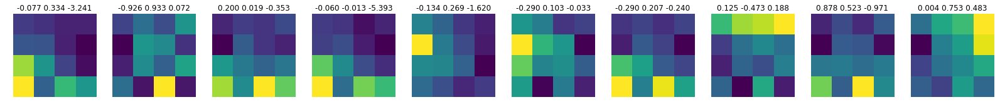

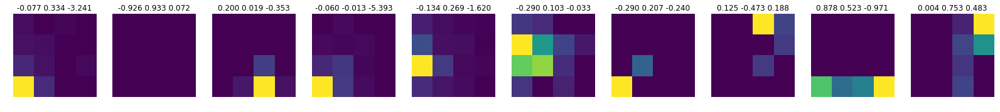

Train loss: -4.761842611637831 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4625, device='cuda:1') tensor(3.4075e-07, device='cuda:1', grad_fn=<SumBackward0>)


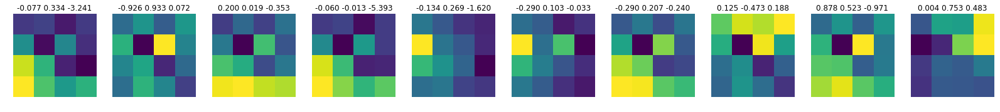

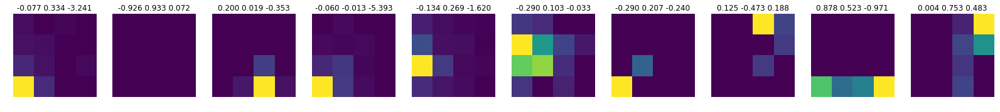

epoch: 115
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4631, device='cuda:1') tensor(3.4075e-07, device='cuda:1', grad_fn=<SumBackward0>)


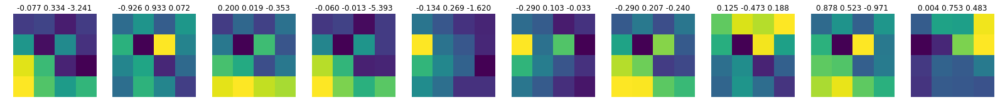

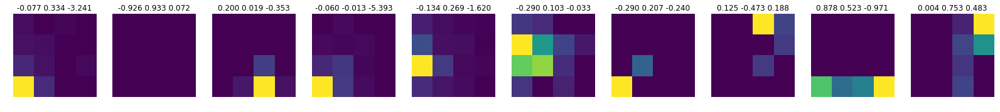

Train loss: -4.736406422694476 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3640, device='cuda:1') tensor(3.3847e-07, device='cuda:1', grad_fn=<SumBackward0>)


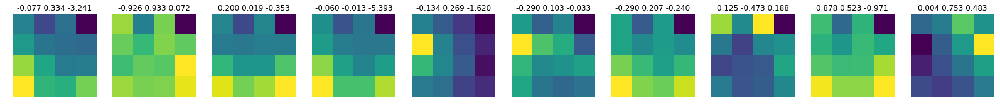

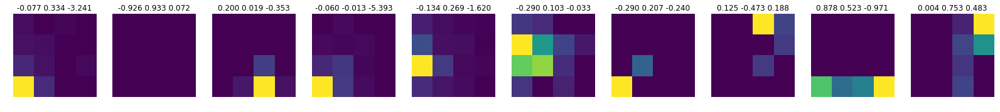

epoch: 116
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3648, device='cuda:1') tensor(3.3847e-07, device='cuda:1', grad_fn=<SumBackward0>)


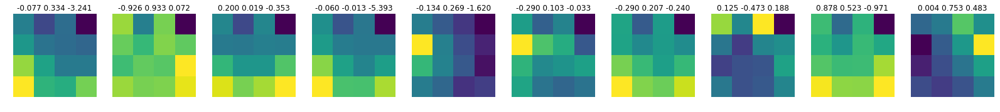

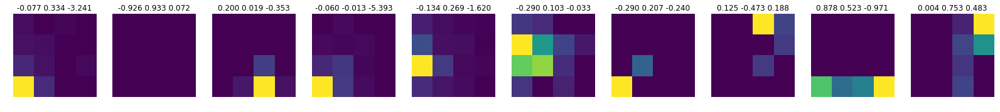

Train loss: -4.501676111811087 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8426, device='cuda:1') tensor(7.6619e-07, device='cuda:1', grad_fn=<SumBackward0>)


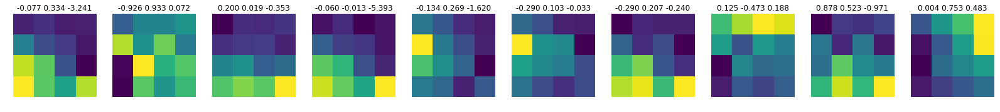

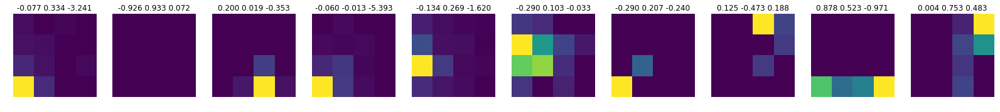

epoch: 117
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8440, device='cuda:1') tensor(7.6619e-07, device='cuda:1', grad_fn=<SumBackward0>)


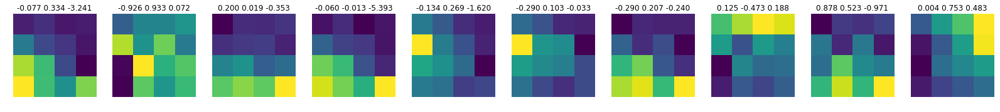

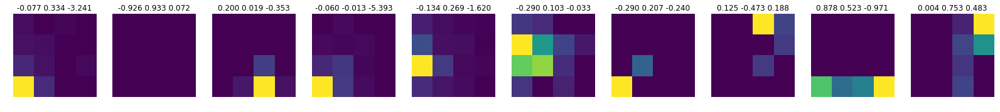

Train loss: -4.8206944940146474 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5663, device='cuda:1') tensor(6.5252e-08, device='cuda:1', grad_fn=<SumBackward0>)


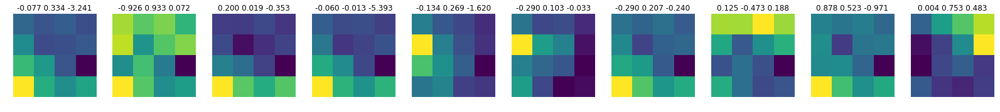

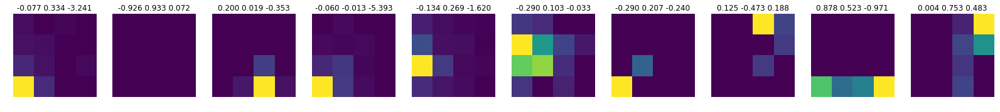

epoch: 118
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5669, device='cuda:1') tensor(6.5252e-08, device='cuda:1', grad_fn=<SumBackward0>)


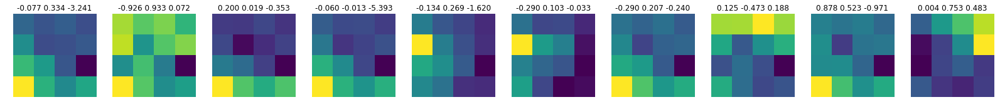

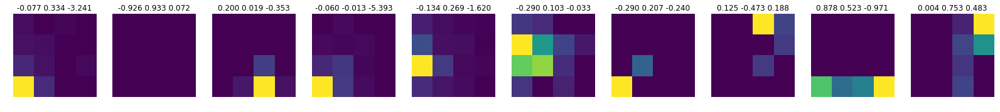

Train loss: -4.631272732810274 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8400, device='cuda:1') tensor(2.2972e-07, device='cuda:1', grad_fn=<SumBackward0>)


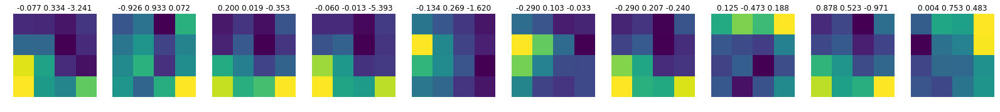

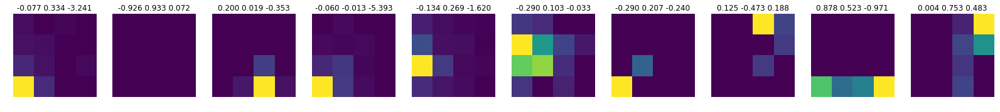

epoch: 119
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8417, device='cuda:1') tensor(2.2972e-07, device='cuda:1', grad_fn=<SumBackward0>)


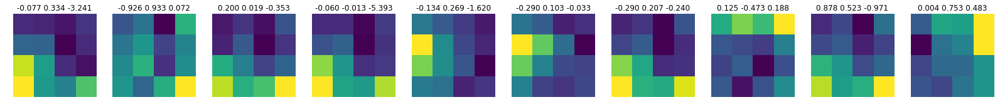

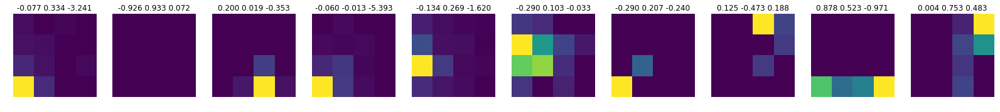

Train loss: -4.785658761644384 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7334, device='cuda:1') tensor(8.7758e-07, device='cuda:1', grad_fn=<SumBackward0>)


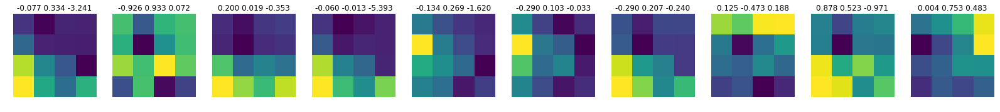

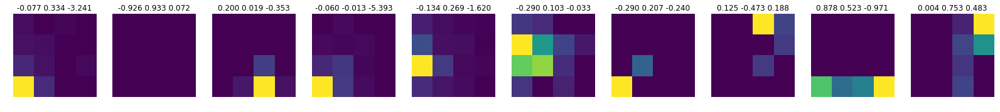

epoch: 120
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7339, device='cuda:1') tensor(8.7758e-07, device='cuda:1', grad_fn=<SumBackward0>)


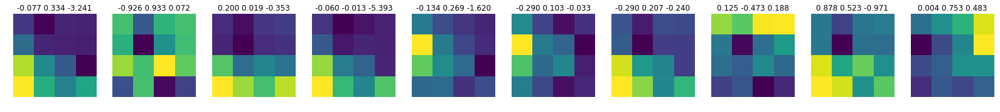

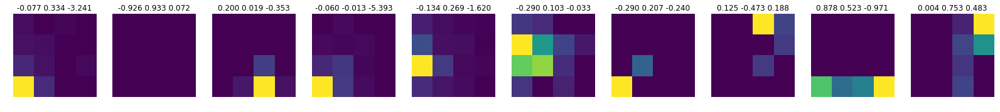

Train loss: -4.755843008539288 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7158, device='cuda:1') tensor(9.2708e-07, device='cuda:1', grad_fn=<SumBackward0>)


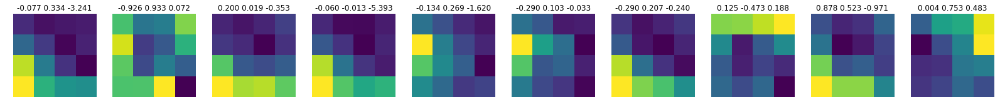

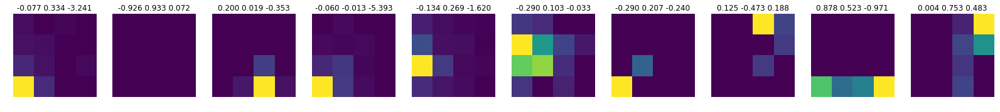

epoch: 121
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7172, device='cuda:1') tensor(9.2708e-07, device='cuda:1', grad_fn=<SumBackward0>)


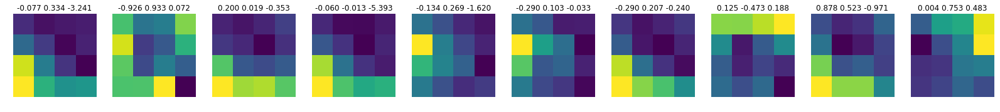

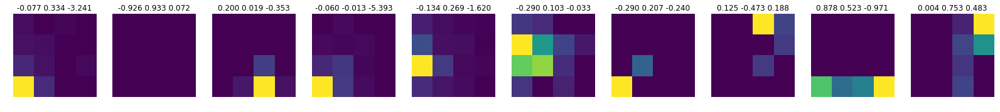

Train loss: -4.720929044131687 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6335, device='cuda:1') tensor(9.4177e-08, device='cuda:1', grad_fn=<SumBackward0>)


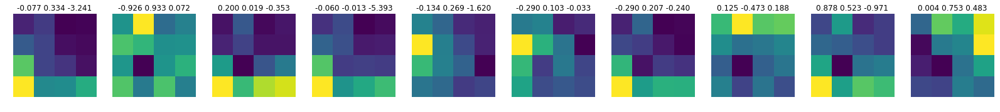

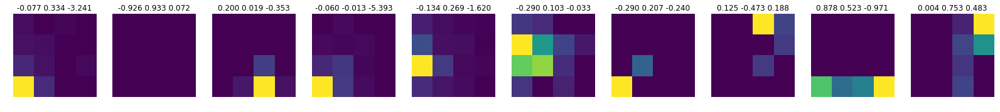

epoch: 122
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6338, device='cuda:1') tensor(9.4177e-08, device='cuda:1', grad_fn=<SumBackward0>)


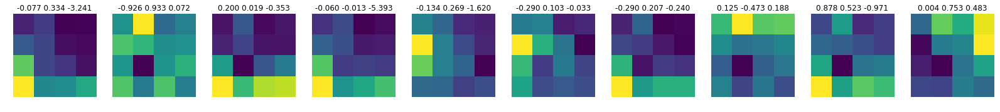

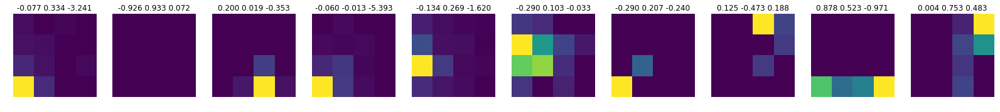

Train loss: -4.527065920130333 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6115, device='cuda:1') tensor(5.3927e-07, device='cuda:1', grad_fn=<SumBackward0>)


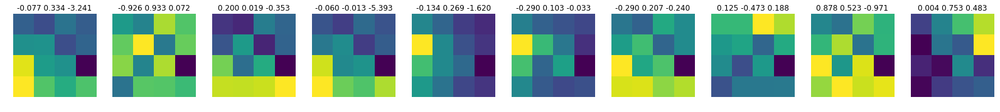

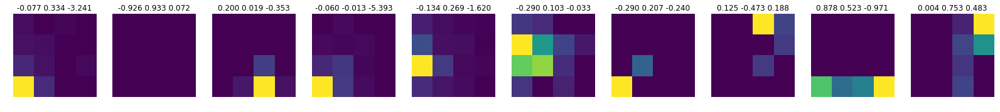

epoch: 123
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6131, device='cuda:1') tensor(5.3927e-07, device='cuda:1', grad_fn=<SumBackward0>)


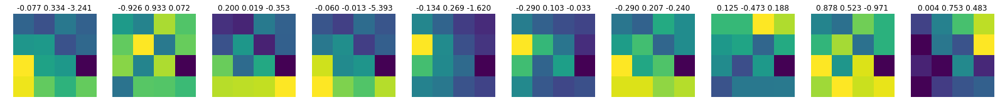

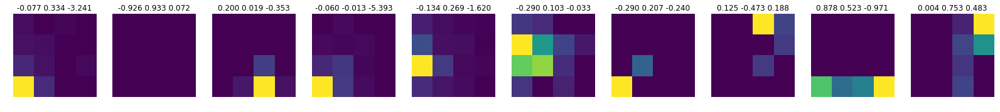

Train loss: -4.822377475075618 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6730, device='cuda:1') tensor(8.1299e-08, device='cuda:1', grad_fn=<SumBackward0>)


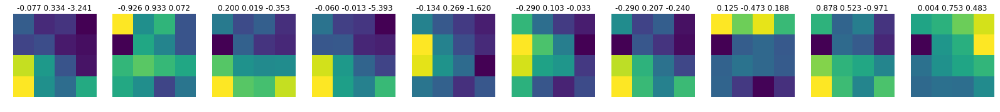

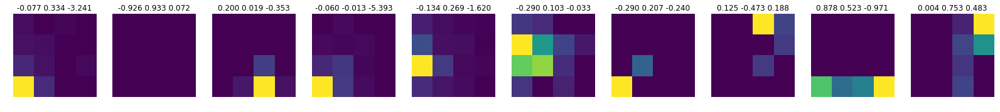

epoch: 124
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6739, device='cuda:1') tensor(8.1299e-08, device='cuda:1', grad_fn=<SumBackward0>)


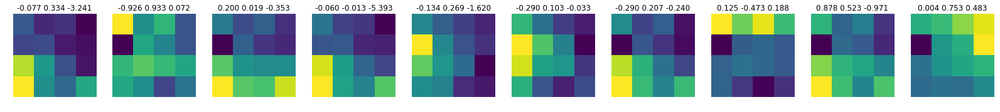

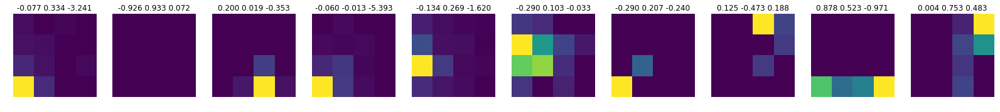

Train loss: -4.733961438420098 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6529, device='cuda:1') tensor(9.5819e-08, device='cuda:1', grad_fn=<SumBackward0>)


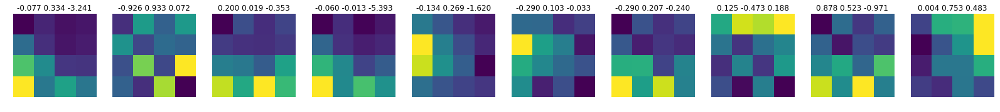

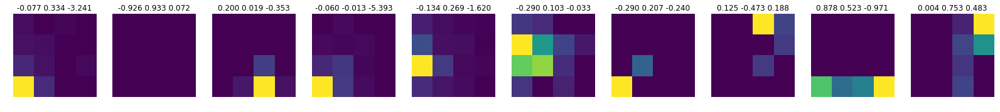

epoch: 125
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6512, device='cuda:1') tensor(9.5819e-08, device='cuda:1', grad_fn=<SumBackward0>)


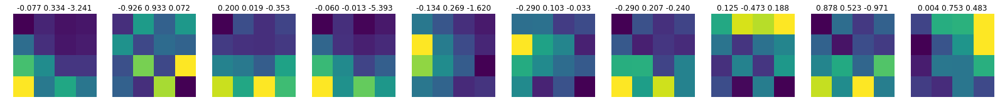

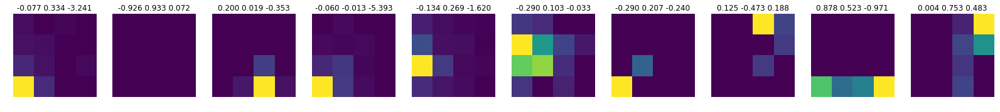

Train loss: -4.66523184495998 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6481, device='cuda:1') tensor(5.4853e-08, device='cuda:1', grad_fn=<SumBackward0>)


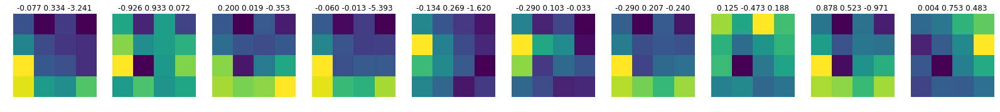

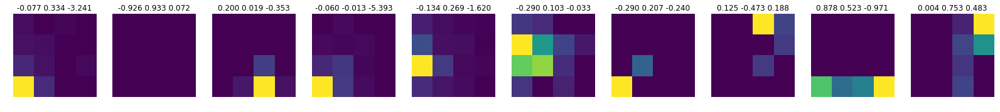

epoch: 126
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6480, device='cuda:1') tensor(5.4853e-08, device='cuda:1', grad_fn=<SumBackward0>)


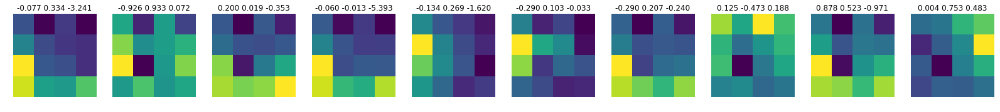

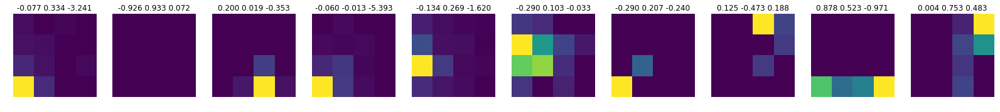

Train loss: -4.657263115495089 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8386, device='cuda:1') tensor(1.2112e-06, device='cuda:1', grad_fn=<SumBackward0>)


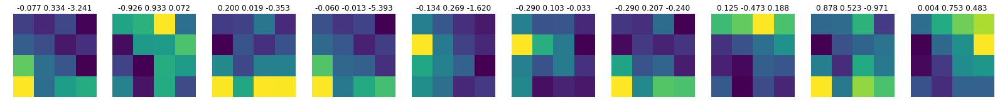

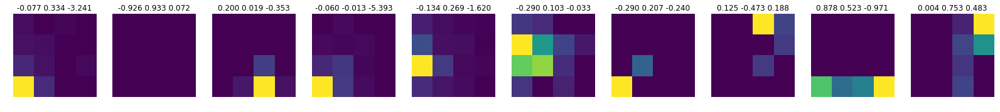

epoch: 127
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8381, device='cuda:1') tensor(1.2112e-06, device='cuda:1', grad_fn=<SumBackward0>)


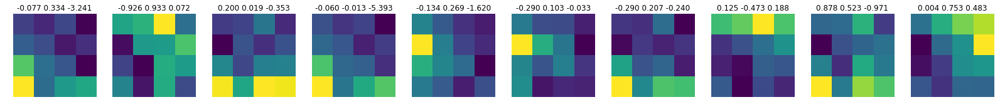

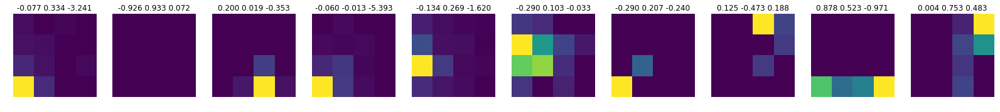

Train loss: -4.757721354499356 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5985, device='cuda:1') tensor(1.9860e-08, device='cuda:1', grad_fn=<SumBackward0>)


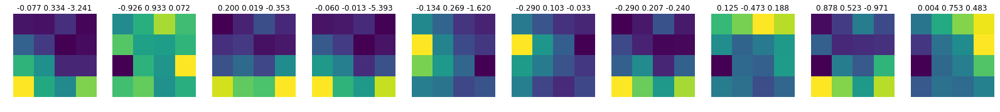

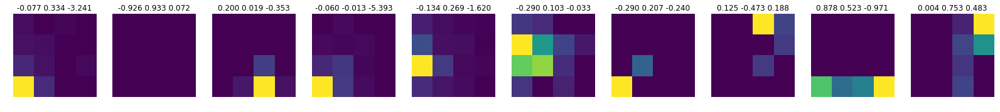

epoch: 128
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5989, device='cuda:1') tensor(1.9860e-08, device='cuda:1', grad_fn=<SumBackward0>)


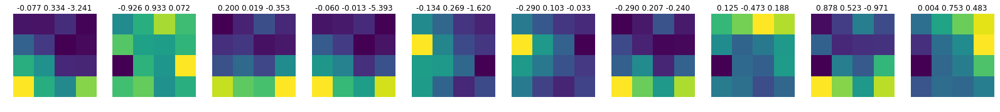

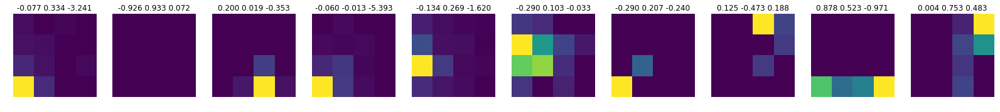

Train loss: -4.489366462440978 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9516, device='cuda:1') tensor(1.4055e-08, device='cuda:1', grad_fn=<SumBackward0>)


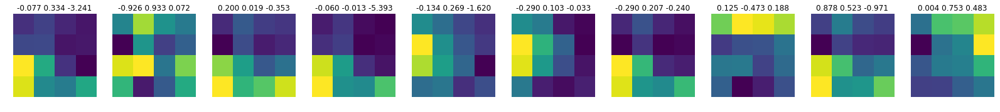

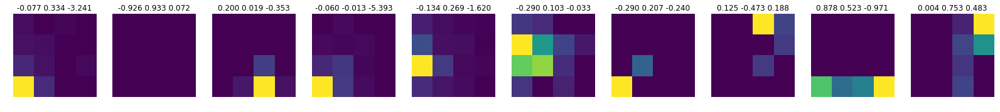

epoch: 129
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9512, device='cuda:1') tensor(1.4055e-08, device='cuda:1', grad_fn=<SumBackward0>)


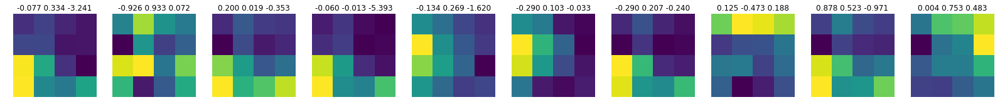

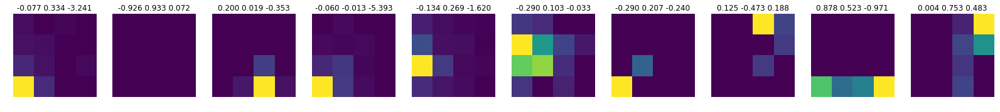

Train loss: -4.930502076664199 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5633, device='cuda:1') tensor(4.5080e-08, device='cuda:1', grad_fn=<SumBackward0>)


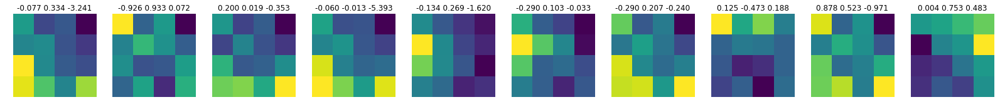

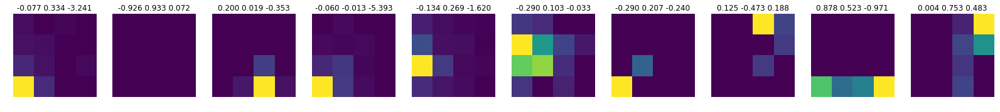

epoch: 130
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5637, device='cuda:1') tensor(4.5080e-08, device='cuda:1', grad_fn=<SumBackward0>)


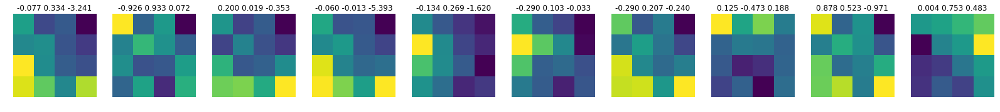

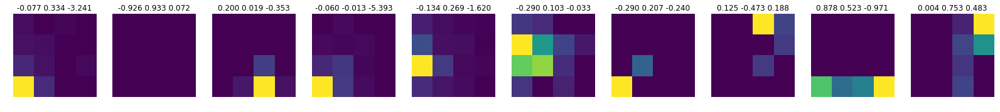

Train loss: -4.80379171692429 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7120, device='cuda:1') tensor(9.3064e-08, device='cuda:1', grad_fn=<SumBackward0>)


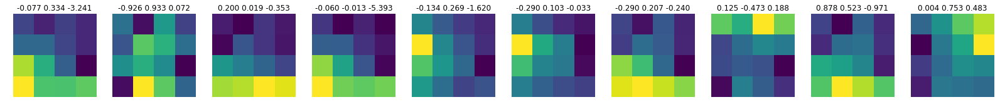

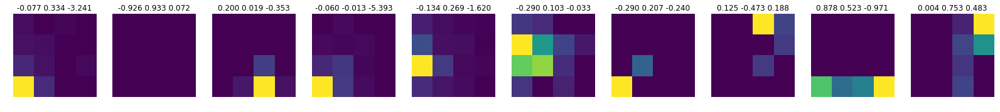

epoch: 131
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7135, device='cuda:1') tensor(9.3064e-08, device='cuda:1', grad_fn=<SumBackward0>)


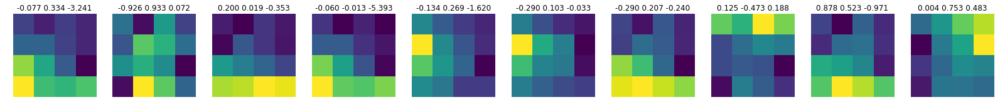

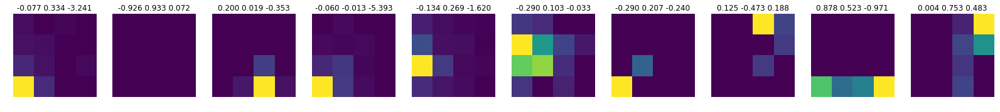

Train loss: -4.6861621987659055 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7516, device='cuda:1') tensor(5.3072e-08, device='cuda:1', grad_fn=<SumBackward0>)


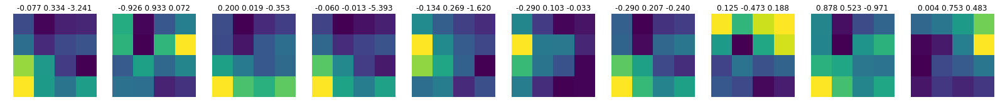

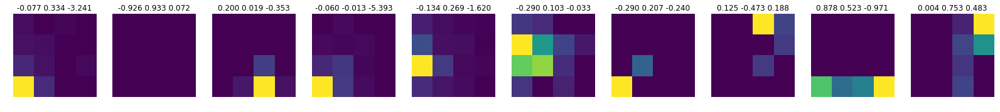

epoch: 132
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7520, device='cuda:1') tensor(5.3072e-08, device='cuda:1', grad_fn=<SumBackward0>)


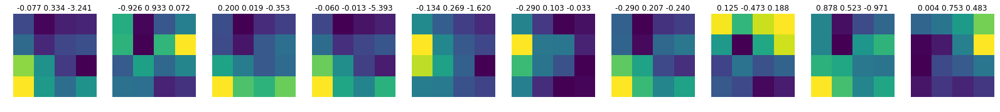

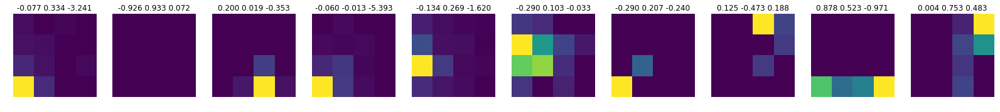

Train loss: -4.716546615612619 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6319, device='cuda:1') tensor(1.3591e-06, device='cuda:1', grad_fn=<SumBackward0>)


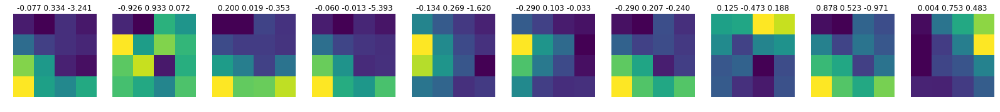

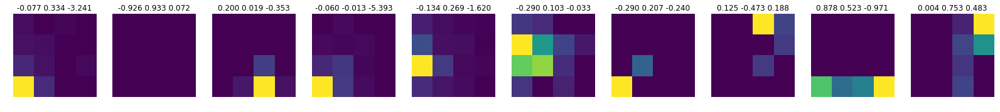

epoch: 133
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6264, device='cuda:1') tensor(1.3591e-06, device='cuda:1', grad_fn=<SumBackward0>)


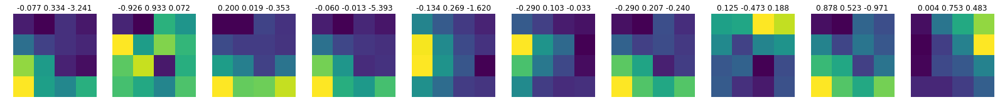

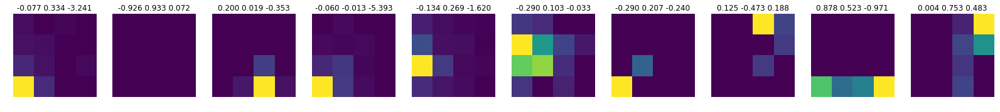

Train loss: -4.599962083109335 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6072, device='cuda:1') tensor(4.9268e-07, device='cuda:1', grad_fn=<SumBackward0>)


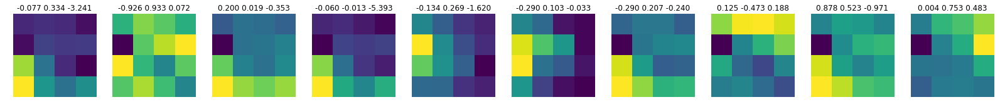

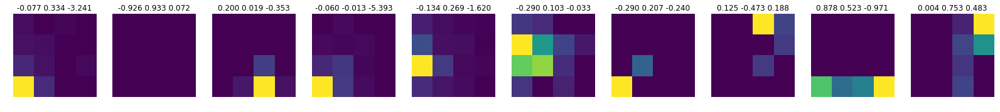

epoch: 134
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6083, device='cuda:1') tensor(4.9268e-07, device='cuda:1', grad_fn=<SumBackward0>)


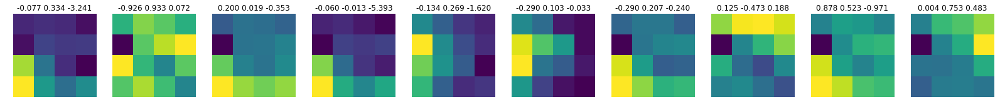

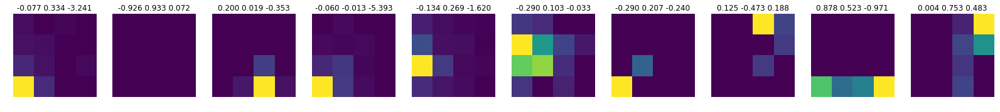

Train loss: -4.551118776675968 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6989, device='cuda:1') tensor(1.6081e-08, device='cuda:1', grad_fn=<SumBackward0>)


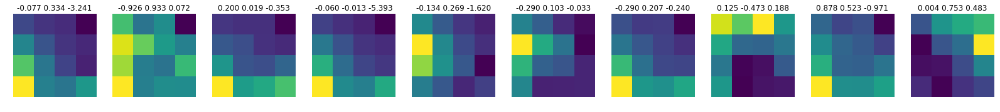

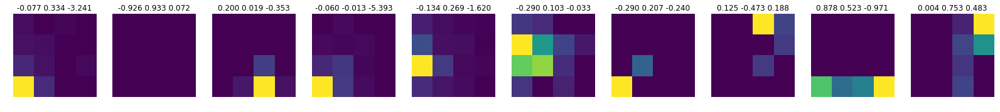

epoch: 135
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6988, device='cuda:1') tensor(1.6081e-08, device='cuda:1', grad_fn=<SumBackward0>)


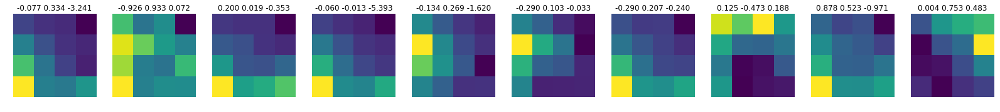

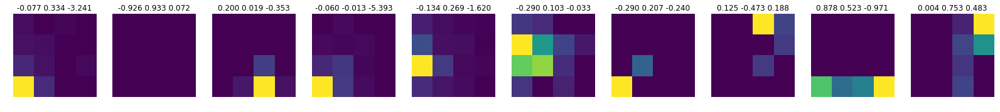

Train loss: -4.635787609613667 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6242, device='cuda:1') tensor(8.3594e-07, device='cuda:1', grad_fn=<SumBackward0>)


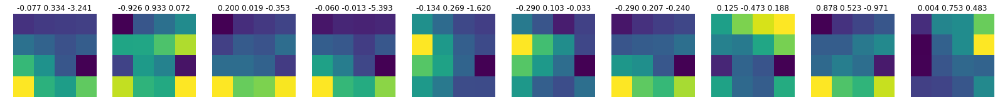

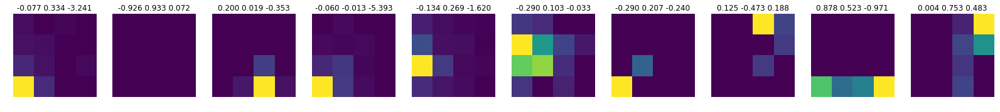

epoch: 136
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6244, device='cuda:1') tensor(8.3594e-07, device='cuda:1', grad_fn=<SumBackward0>)


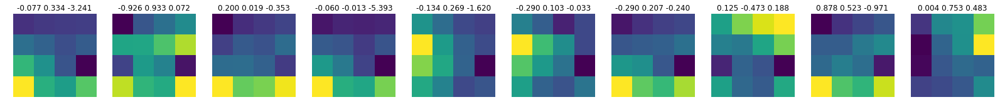

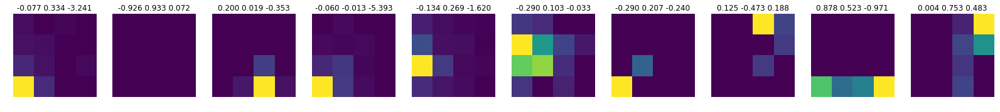

Train loss: -4.608563889390853 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7988, device='cuda:1') tensor(1.1331e-08, device='cuda:1', grad_fn=<SumBackward0>)


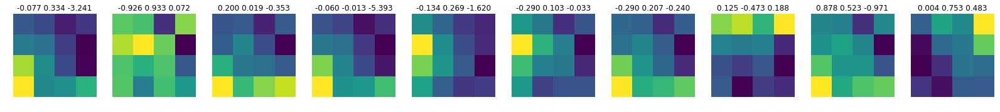

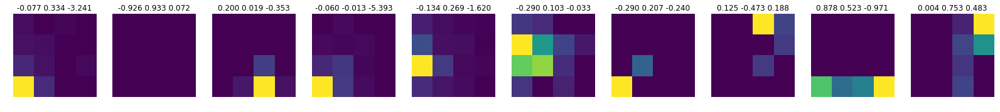

epoch: 137
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7991, device='cuda:1') tensor(1.1331e-08, device='cuda:1', grad_fn=<SumBackward0>)


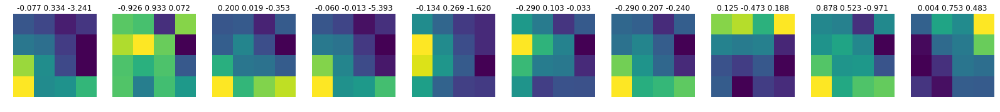

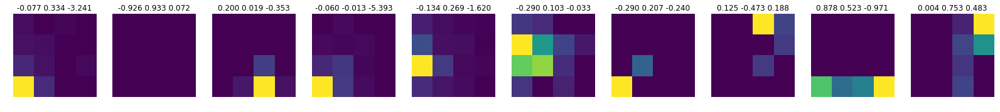

Train loss: -4.825618668761961 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7558, device='cuda:1') tensor(1.1921e-07, device='cuda:1', grad_fn=<SumBackward0>)


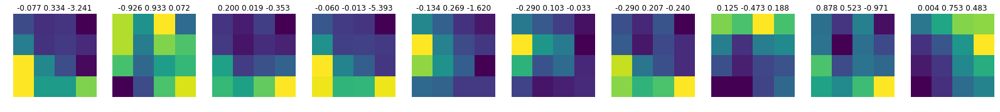

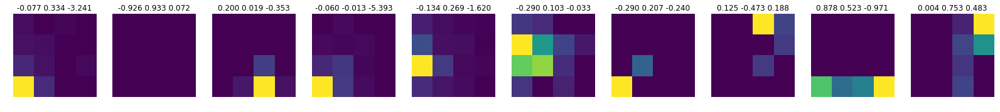

epoch: 138
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7555, device='cuda:1') tensor(1.1921e-07, device='cuda:1', grad_fn=<SumBackward0>)


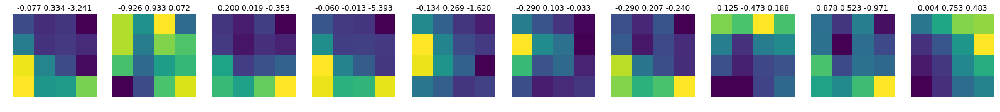

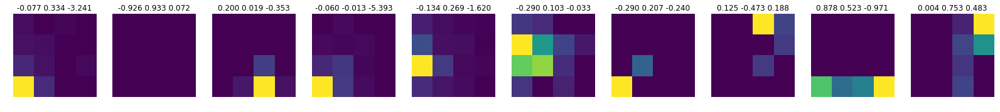

Train loss: -4.865725825070778 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6401, device='cuda:1') tensor(3.9075e-08, device='cuda:1', grad_fn=<SumBackward0>)


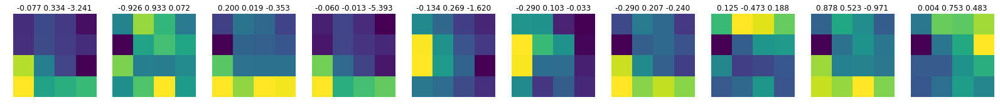

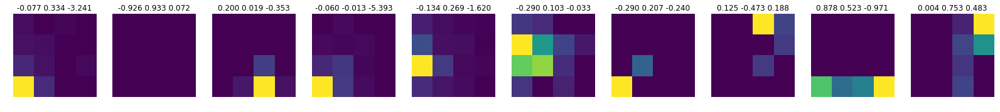

epoch: 139
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6402, device='cuda:1') tensor(3.9075e-08, device='cuda:1', grad_fn=<SumBackward0>)


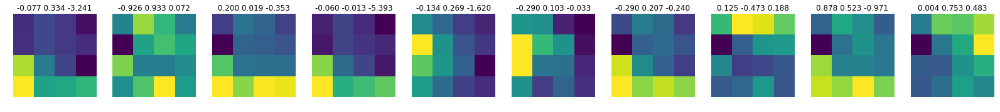

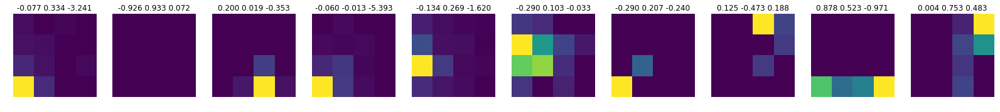

Train loss: -4.4532506800509974 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6880, device='cuda:1') tensor(1.5177e-08, device='cuda:1', grad_fn=<SumBackward0>)


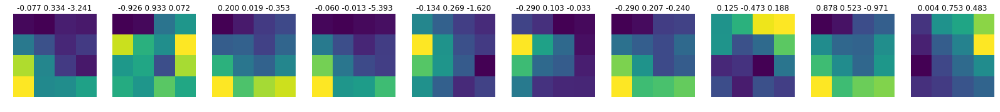

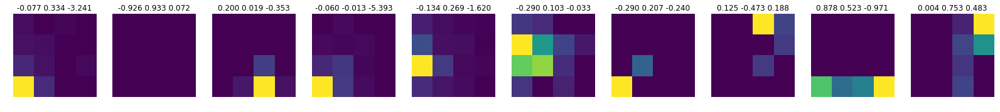

epoch: 140
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6889, device='cuda:1') tensor(1.5177e-08, device='cuda:1', grad_fn=<SumBackward0>)


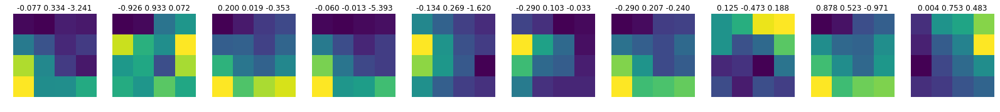

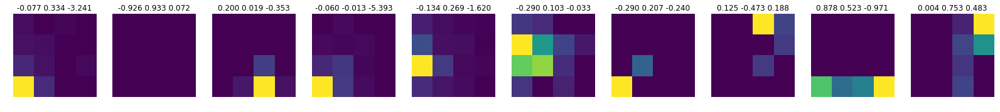

Train loss: -4.503502836416914 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6342, device='cuda:1') tensor(9.3414e-08, device='cuda:1', grad_fn=<SumBackward0>)


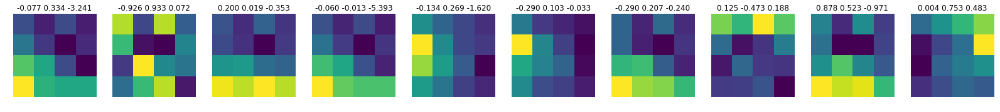

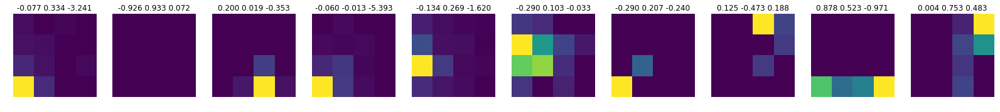

epoch: 141
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6322, device='cuda:1') tensor(9.3414e-08, device='cuda:1', grad_fn=<SumBackward0>)


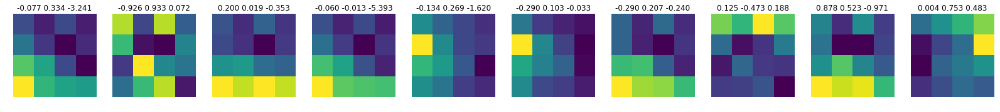

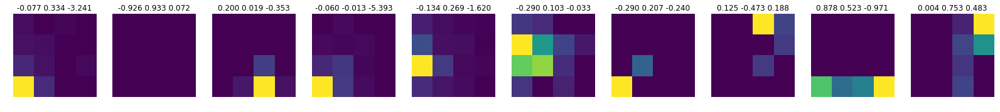

Train loss: -4.5140039011831625 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4802, device='cuda:1') tensor(6.1447e-08, device='cuda:1', grad_fn=<SumBackward0>)


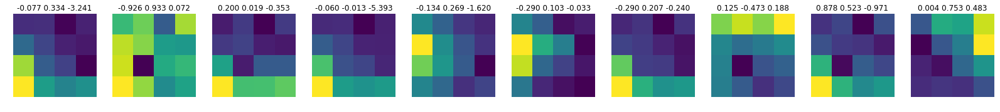

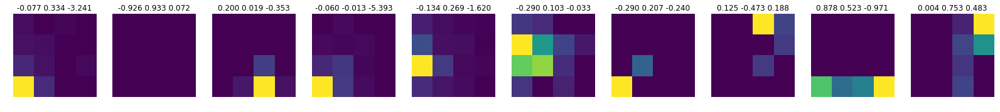

epoch: 142
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4802, device='cuda:1') tensor(6.1447e-08, device='cuda:1', grad_fn=<SumBackward0>)


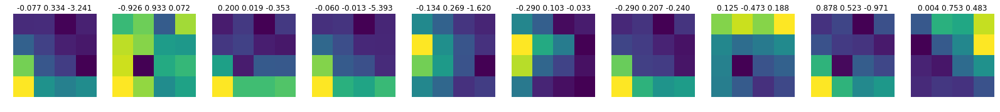

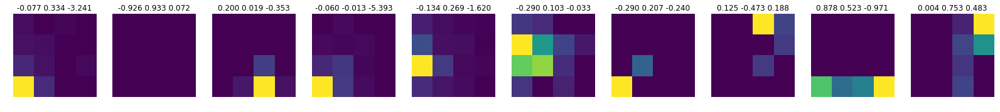

Train loss: -4.429932294663413 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7103, device='cuda:1') tensor(4.6944e-07, device='cuda:1', grad_fn=<SumBackward0>)


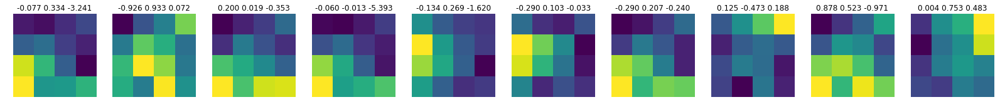

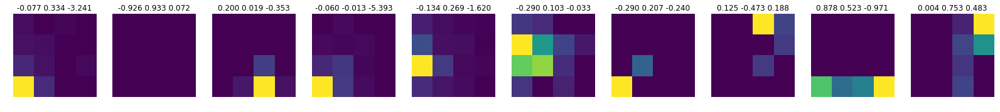

epoch: 143
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7096, device='cuda:1') tensor(4.6944e-07, device='cuda:1', grad_fn=<SumBackward0>)


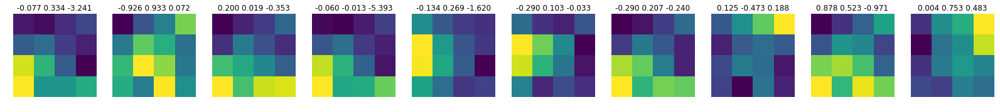

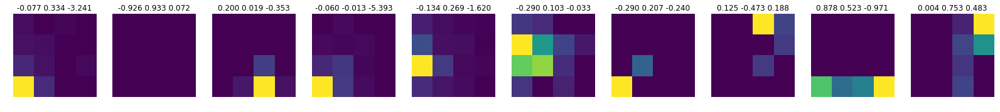

Train loss: -4.786415517293191 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5646, device='cuda:1') tensor(2.9113e-07, device='cuda:1', grad_fn=<SumBackward0>)


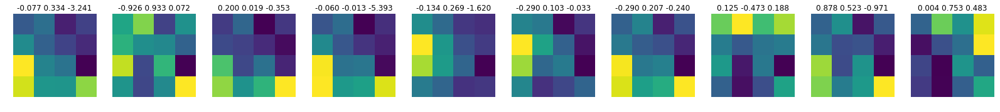

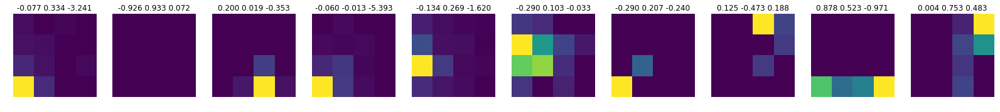

epoch: 144
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5642, device='cuda:1') tensor(2.9113e-07, device='cuda:1', grad_fn=<SumBackward0>)


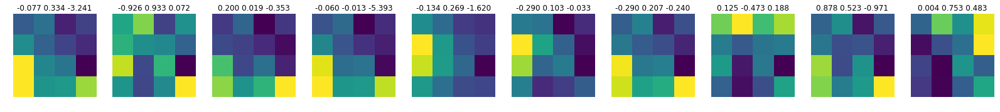

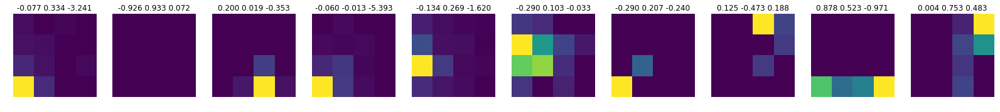

Train loss: -4.63660239268078 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5915, device='cuda:1') tensor(1.6037e-07, device='cuda:1', grad_fn=<SumBackward0>)


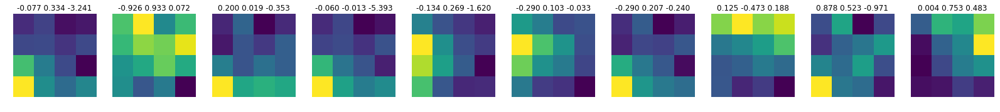

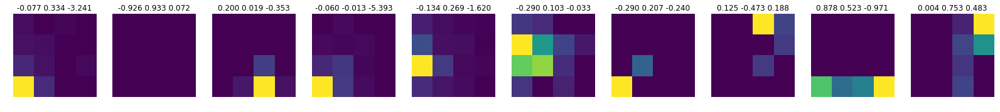

epoch: 145
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5921, device='cuda:1') tensor(1.6037e-07, device='cuda:1', grad_fn=<SumBackward0>)


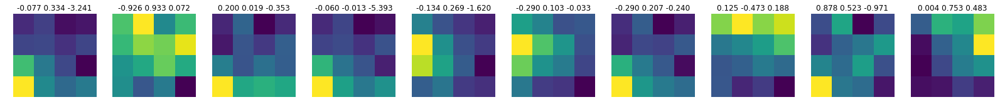

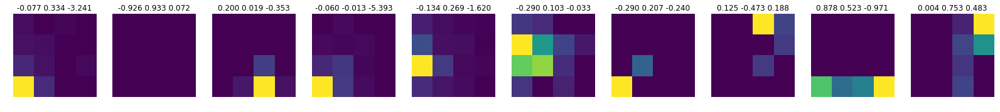

Train loss: -4.559935193406802 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5459, device='cuda:1') tensor(1.9961e-07, device='cuda:1', grad_fn=<SumBackward0>)


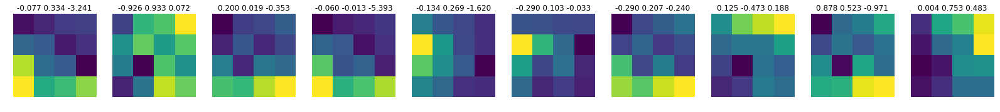

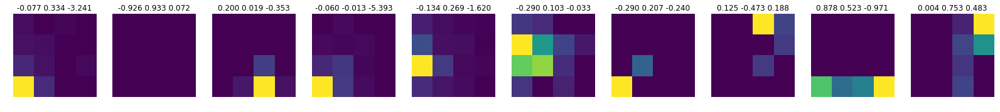

epoch: 146
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5510, device='cuda:1') tensor(1.9961e-07, device='cuda:1', grad_fn=<SumBackward0>)


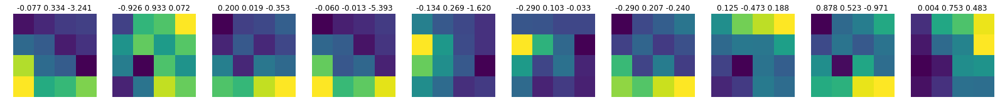

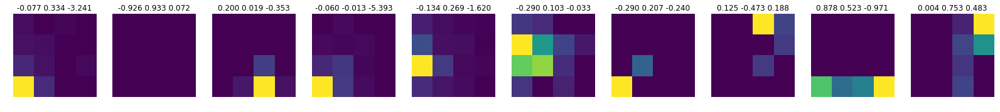

Train loss: -4.5932299590546295 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6800, device='cuda:1') tensor(2.1676e-07, device='cuda:1', grad_fn=<SumBackward0>)


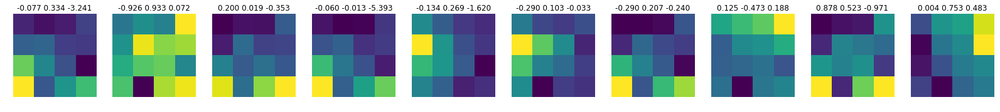

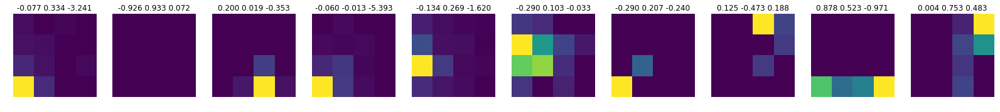

epoch: 147
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6797, device='cuda:1') tensor(2.1676e-07, device='cuda:1', grad_fn=<SumBackward0>)


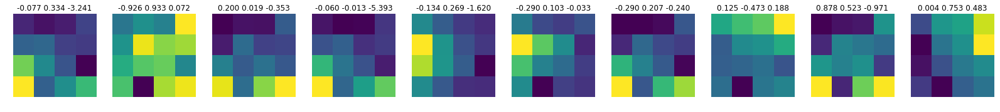

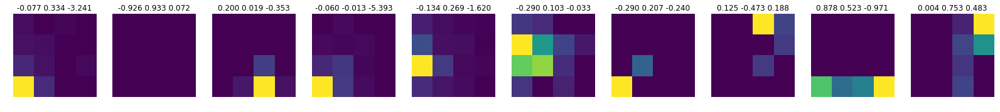

Train loss: -4.593896456048308 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6116, device='cuda:1') tensor(1.7135e-07, device='cuda:1', grad_fn=<SumBackward0>)


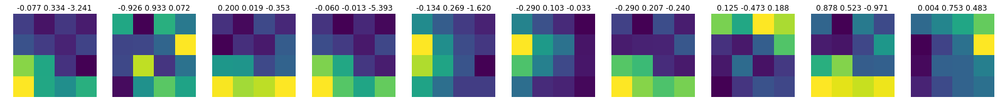

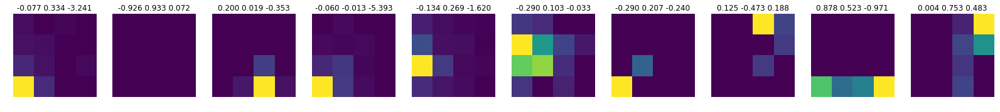

epoch: 148
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6138, device='cuda:1') tensor(1.7135e-07, device='cuda:1', grad_fn=<SumBackward0>)


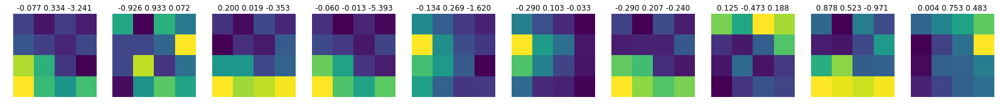

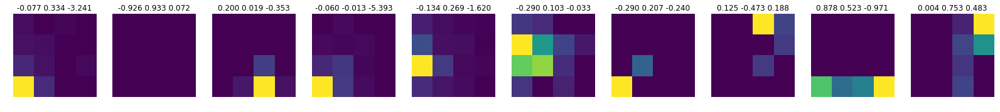

Train loss: -4.536587586571632 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7738, device='cuda:1') tensor(1.2077e-06, device='cuda:1', grad_fn=<SumBackward0>)


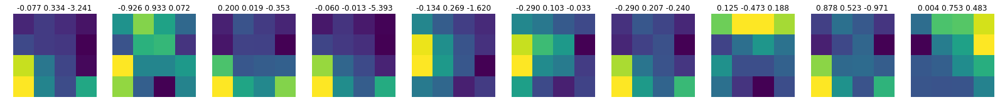

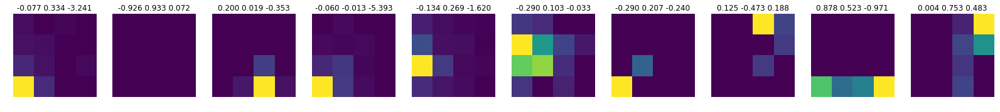

epoch: 149
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7741, device='cuda:1') tensor(1.2077e-06, device='cuda:1', grad_fn=<SumBackward0>)


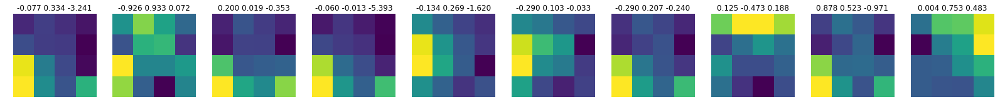

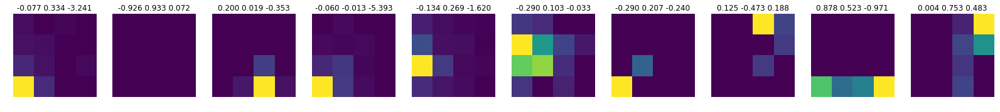

Train loss: -4.792971335377583 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6647, device='cuda:1') tensor(3.1987e-08, device='cuda:1', grad_fn=<SumBackward0>)


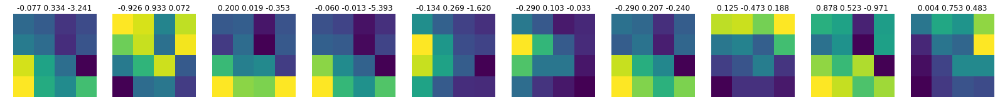

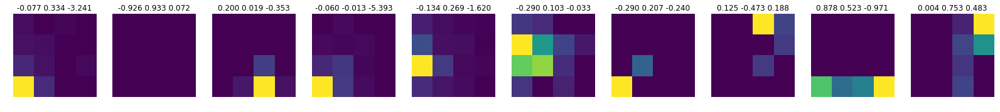

epoch: 150
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6666, device='cuda:1') tensor(3.1987e-08, device='cuda:1', grad_fn=<SumBackward0>)


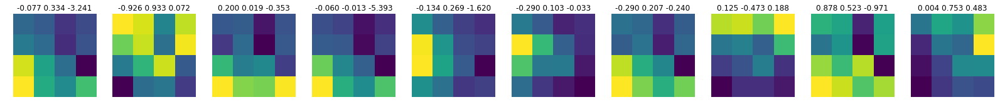

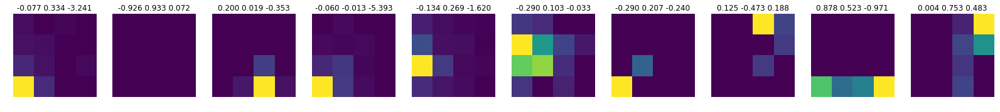

Train loss: -4.632084884394783 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7119, device='cuda:1') tensor(8.9784e-08, device='cuda:1', grad_fn=<SumBackward0>)


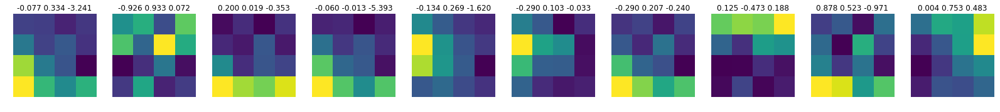

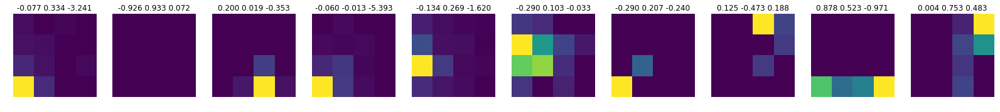

epoch: 151
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7129, device='cuda:1') tensor(8.9784e-08, device='cuda:1', grad_fn=<SumBackward0>)


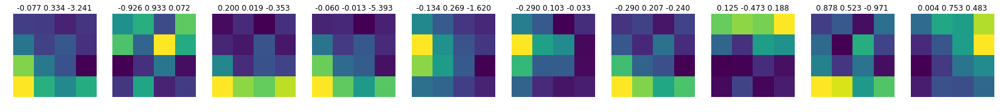

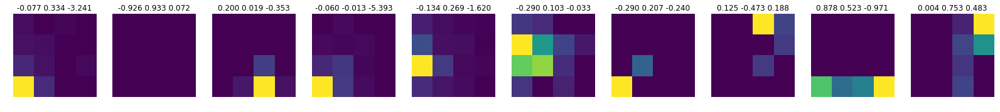

Train loss: -4.669105874499159 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7838, device='cuda:1') tensor(5.8745e-08, device='cuda:1', grad_fn=<SumBackward0>)


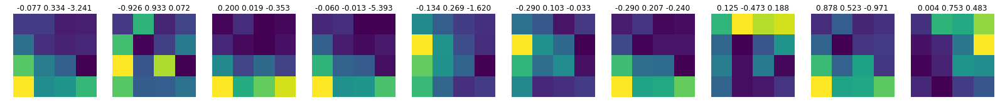

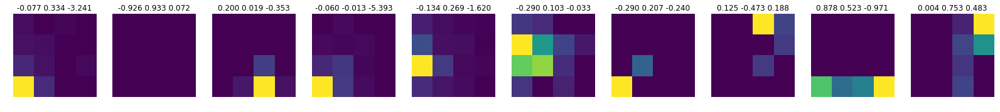

epoch: 152
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7815, device='cuda:1') tensor(5.8745e-08, device='cuda:1', grad_fn=<SumBackward0>)


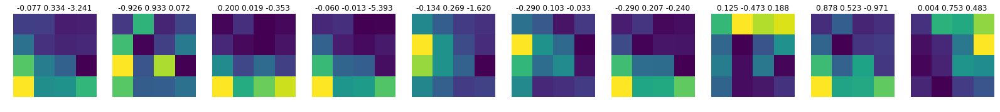

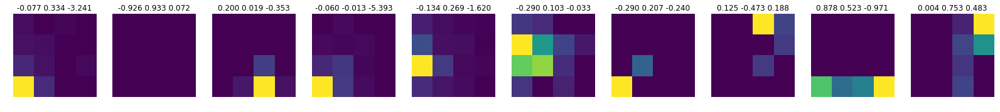

Train loss: -4.760020204105096 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6888, device='cuda:1') tensor(1.3382e-06, device='cuda:1', grad_fn=<SumBackward0>)


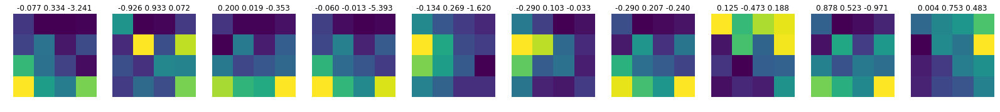

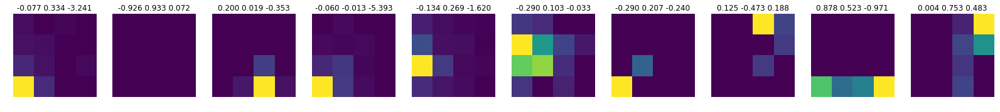

epoch: 153
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6890, device='cuda:1') tensor(1.3382e-06, device='cuda:1', grad_fn=<SumBackward0>)


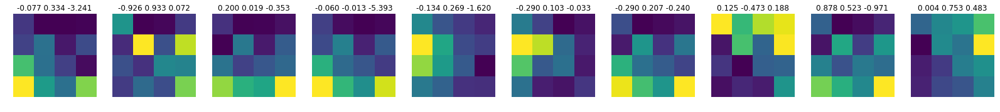

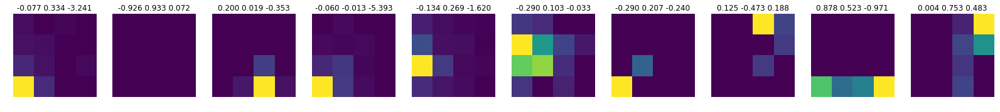

Train loss: -4.73463747186894 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6026, device='cuda:1') tensor(5.1504e-08, device='cuda:1', grad_fn=<SumBackward0>)


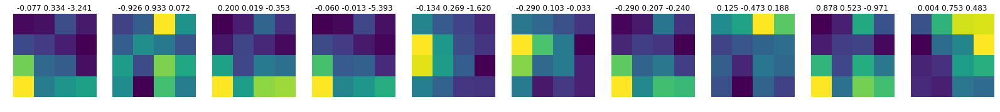

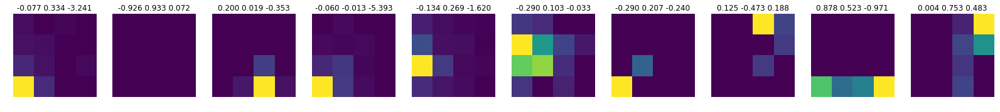

epoch: 154
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6016, device='cuda:1') tensor(5.1504e-08, device='cuda:1', grad_fn=<SumBackward0>)


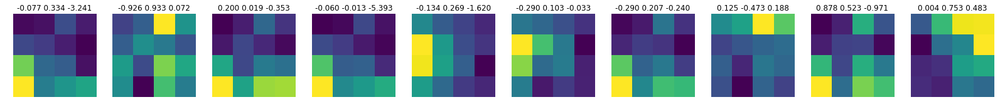

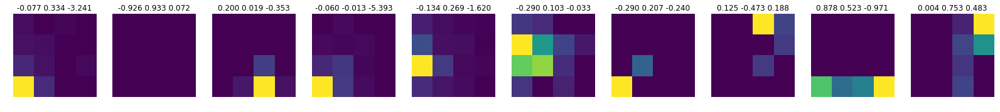

Train loss: -4.657377838851 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7546, device='cuda:1') tensor(2.4890e-07, device='cuda:1', grad_fn=<SumBackward0>)


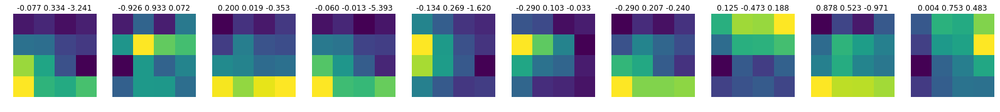

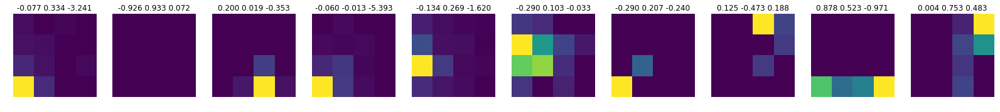

epoch: 155
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7559, device='cuda:1') tensor(2.4890e-07, device='cuda:1', grad_fn=<SumBackward0>)


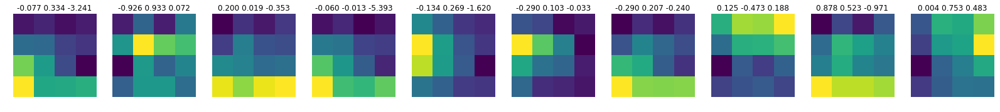

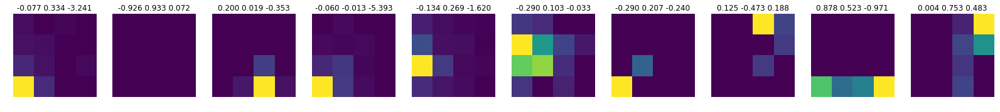

Train loss: -4.814755004970433 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4579, device='cuda:1') tensor(2.1894e-07, device='cuda:1', grad_fn=<SumBackward0>)


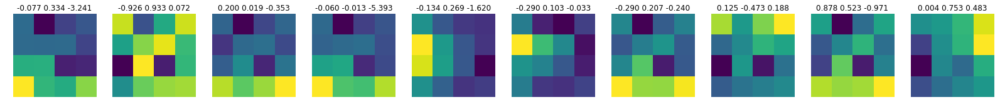

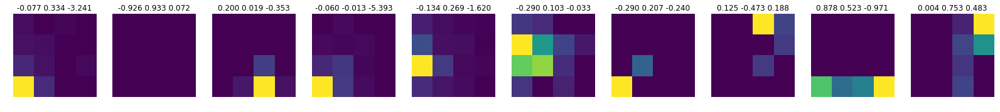

epoch: 156
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4582, device='cuda:1') tensor(2.1894e-07, device='cuda:1', grad_fn=<SumBackward0>)


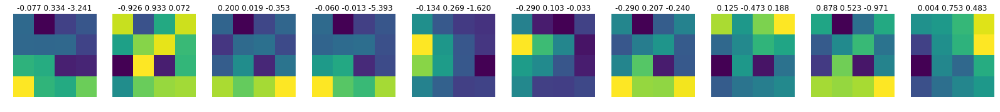

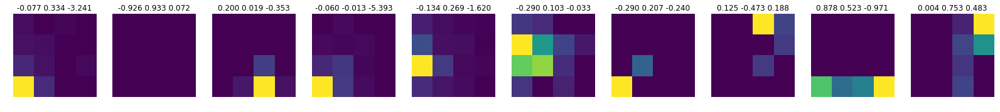

Train loss: -4.720556506258825 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7656, device='cuda:1') tensor(1.4395e-07, device='cuda:1', grad_fn=<SumBackward0>)


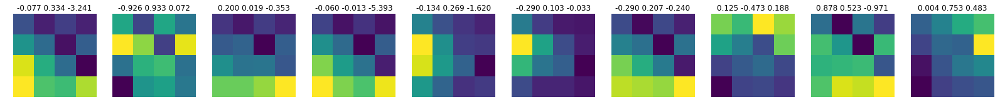

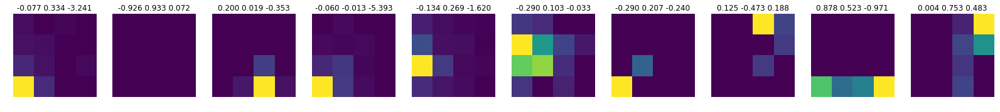

epoch: 157
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7633, device='cuda:1') tensor(1.4395e-07, device='cuda:1', grad_fn=<SumBackward0>)


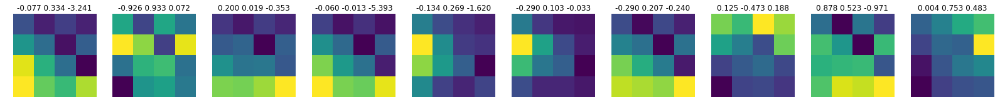

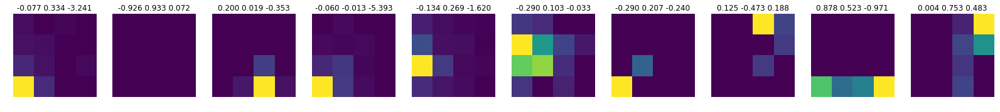

Train loss: -4.803102174761526 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7775, device='cuda:1') tensor(2.1844e-07, device='cuda:1', grad_fn=<SumBackward0>)


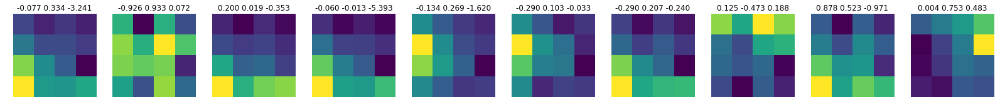

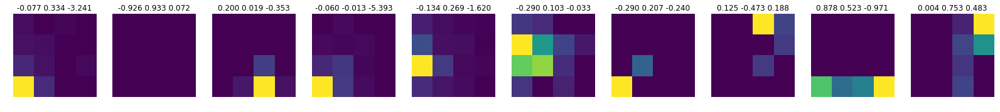

epoch: 158
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7762, device='cuda:1') tensor(2.1844e-07, device='cuda:1', grad_fn=<SumBackward0>)


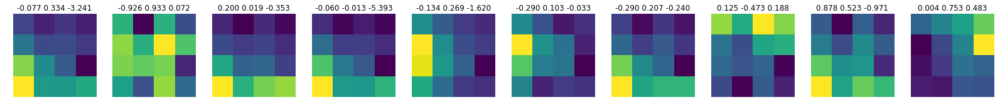

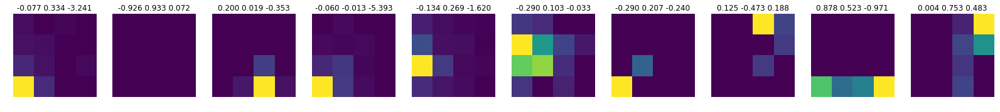

Train loss: -4.744365369454478 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7870, device='cuda:1') tensor(8.4255e-08, device='cuda:1', grad_fn=<SumBackward0>)


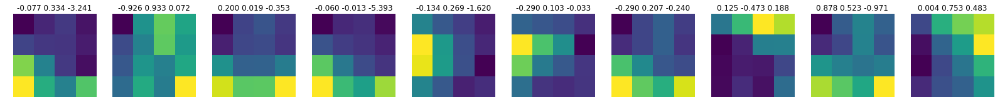

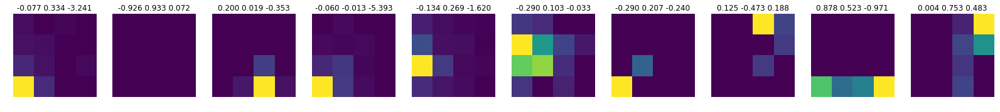

epoch: 159
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7903, device='cuda:1') tensor(8.4255e-08, device='cuda:1', grad_fn=<SumBackward0>)


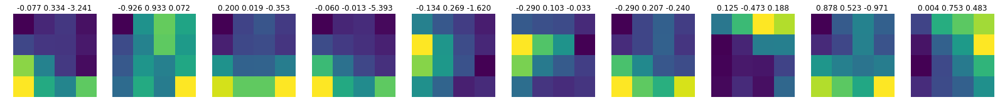

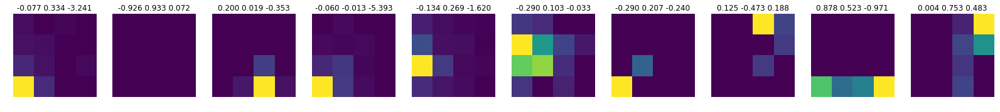

Train loss: -4.735331781206325 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7347, device='cuda:1') tensor(2.7662e-07, device='cuda:1', grad_fn=<SumBackward0>)


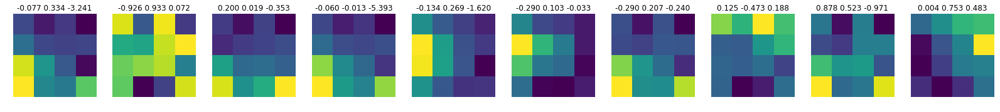

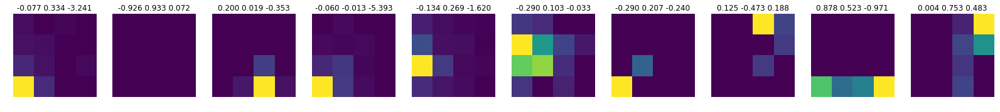

epoch: 160
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7365, device='cuda:1') tensor(2.7662e-07, device='cuda:1', grad_fn=<SumBackward0>)


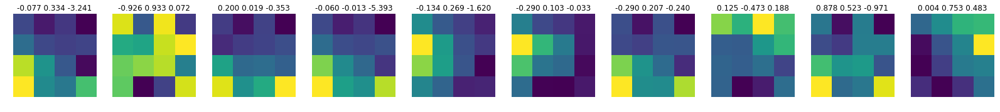

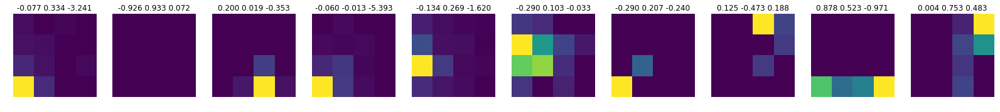

Train loss: -4.744601024689775 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7415, device='cuda:1') tensor(1.4574e-07, device='cuda:1', grad_fn=<SumBackward0>)


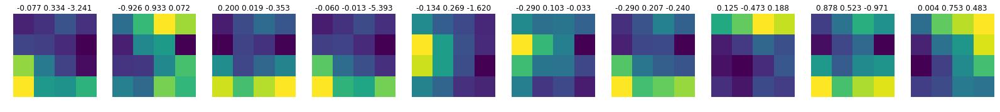

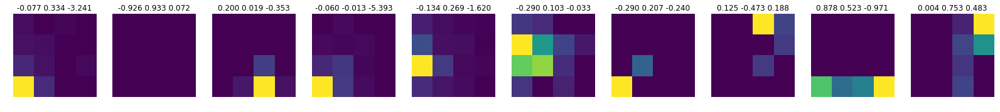

epoch: 161
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7425, device='cuda:1') tensor(1.4574e-07, device='cuda:1', grad_fn=<SumBackward0>)


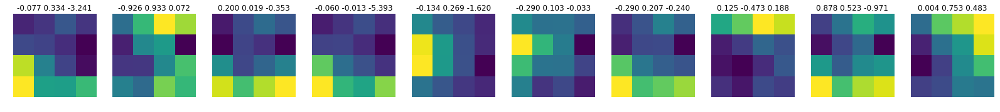

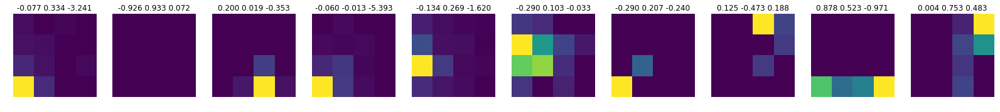

Train loss: -4.65934130200196 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7391, device='cuda:1') tensor(3.1410e-07, device='cuda:1', grad_fn=<SumBackward0>)


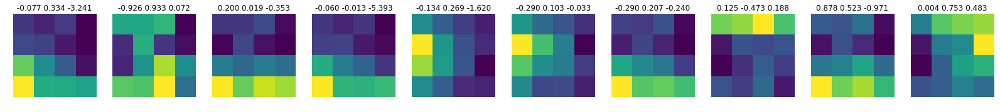

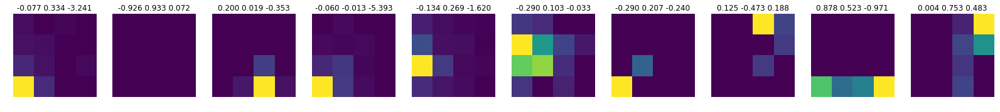

epoch: 162
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7393, device='cuda:1') tensor(3.1410e-07, device='cuda:1', grad_fn=<SumBackward0>)


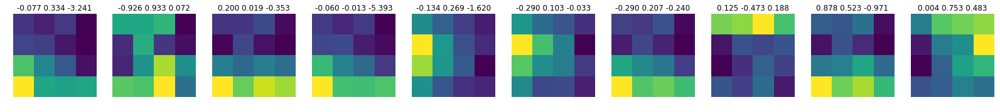

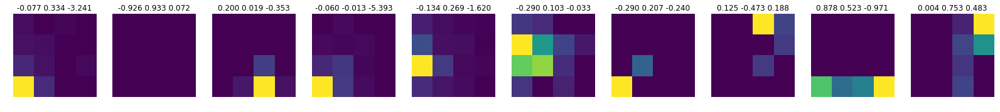

Train loss: -4.710923289712791 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6294, device='cuda:1') tensor(9.7958e-07, device='cuda:1', grad_fn=<SumBackward0>)


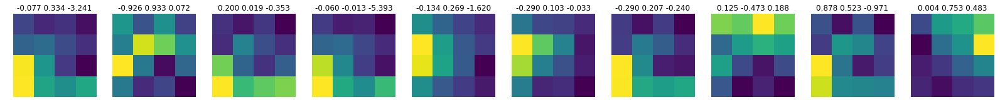

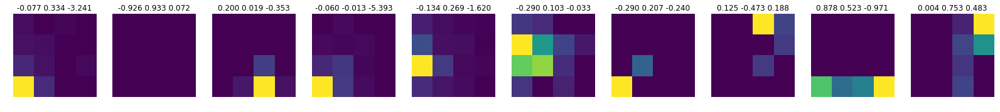

epoch: 163
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6269, device='cuda:1') tensor(9.7958e-07, device='cuda:1', grad_fn=<SumBackward0>)


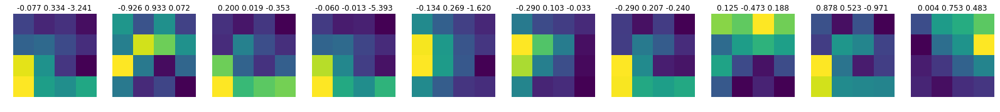

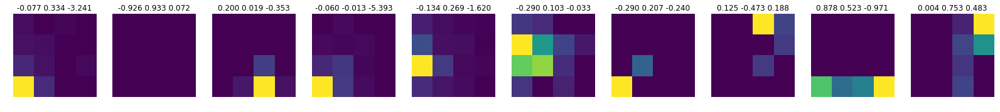

Train loss: -4.734199106671728 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7010, device='cuda:1') tensor(1.4402e-06, device='cuda:1', grad_fn=<SumBackward0>)


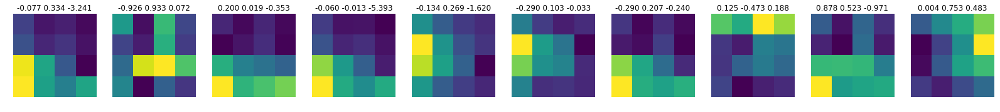

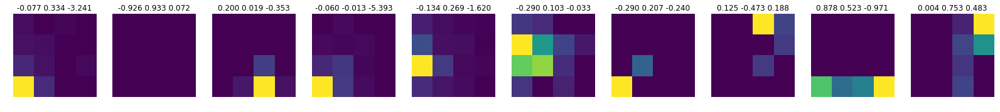

epoch: 164
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7035, device='cuda:1') tensor(1.4402e-06, device='cuda:1', grad_fn=<SumBackward0>)


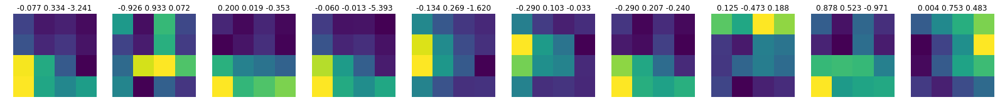

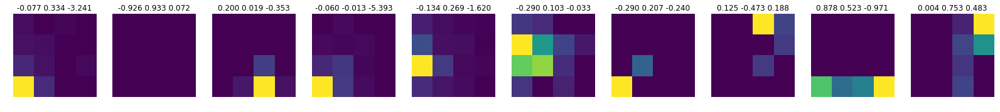

Train loss: -4.581994437169125 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6712, device='cuda:1') tensor(3.8807e-07, device='cuda:1', grad_fn=<SumBackward0>)


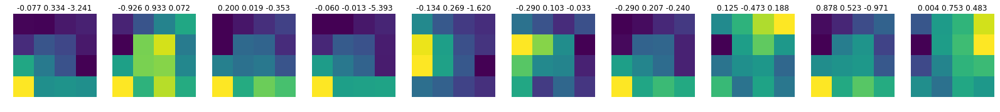

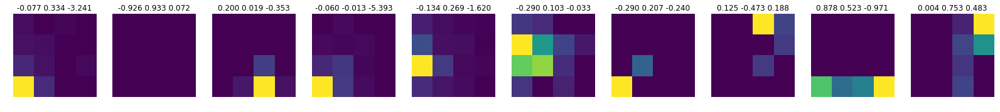

epoch: 165
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6752, device='cuda:1') tensor(3.8807e-07, device='cuda:1', grad_fn=<SumBackward0>)


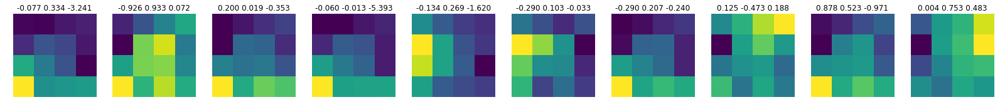

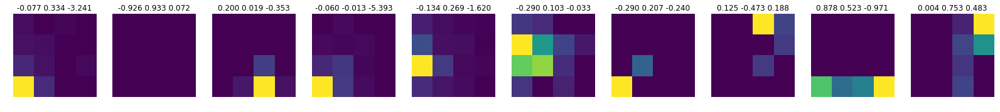

Train loss: -4.9768769093399134 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8275, device='cuda:1') tensor(3.3920e-09, device='cuda:1', grad_fn=<SumBackward0>)


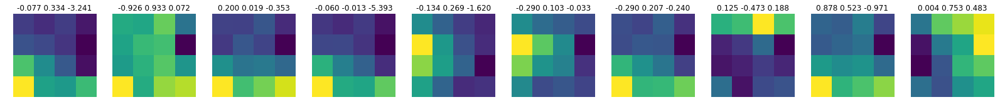

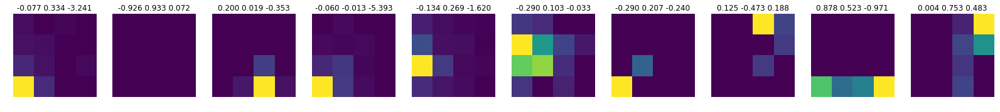

epoch: 166
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8276, device='cuda:1') tensor(3.3920e-09, device='cuda:1', grad_fn=<SumBackward0>)


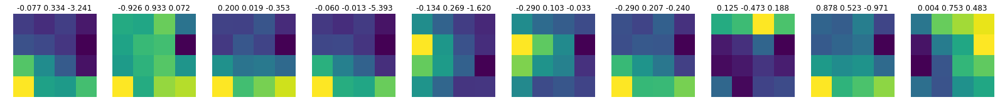

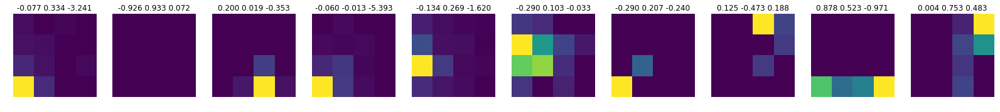

Train loss: -4.892146386313727 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5800, device='cuda:1') tensor(9.6919e-08, device='cuda:1', grad_fn=<SumBackward0>)


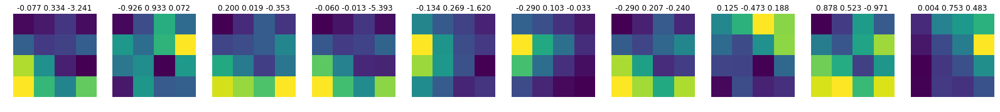

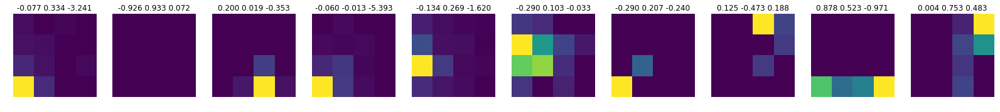

epoch: 167
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5818, device='cuda:1') tensor(9.6919e-08, device='cuda:1', grad_fn=<SumBackward0>)


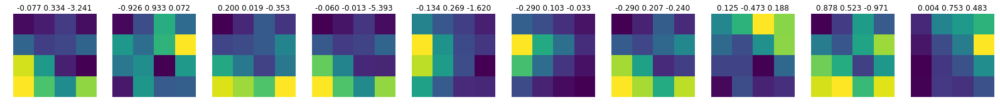

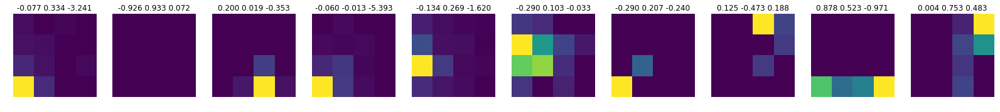

Train loss: -4.4637513940681215 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8969, device='cuda:1') tensor(5.4207e-08, device='cuda:1', grad_fn=<SumBackward0>)


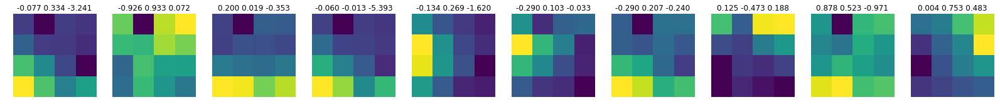

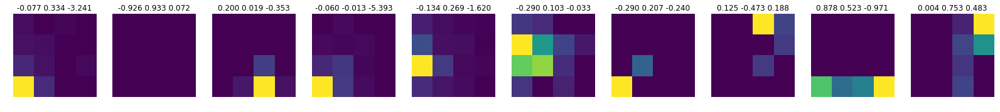

epoch: 168
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8979, device='cuda:1') tensor(5.4207e-08, device='cuda:1', grad_fn=<SumBackward0>)


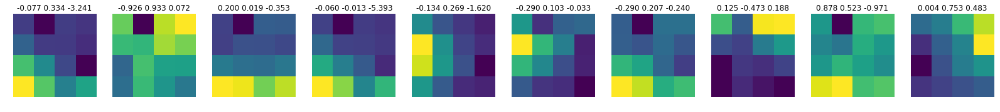

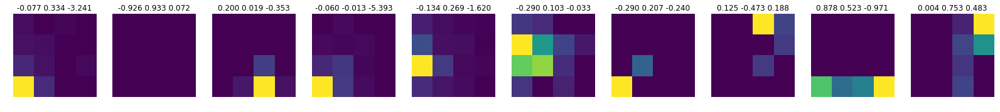

Train loss: -4.882426279968655 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6630, device='cuda:1') tensor(2.5312e-08, device='cuda:1', grad_fn=<SumBackward0>)


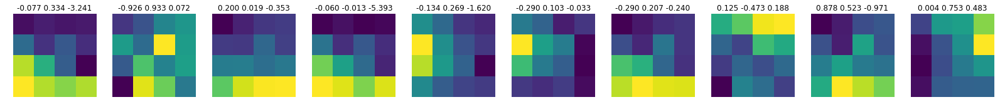

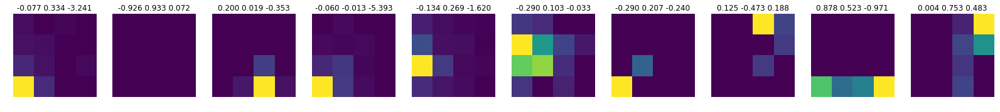

epoch: 169
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6651, device='cuda:1') tensor(2.5312e-08, device='cuda:1', grad_fn=<SumBackward0>)


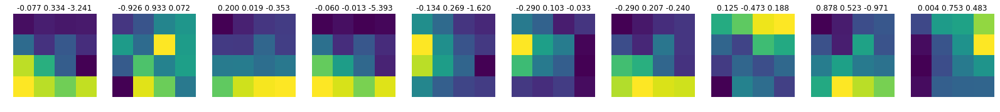

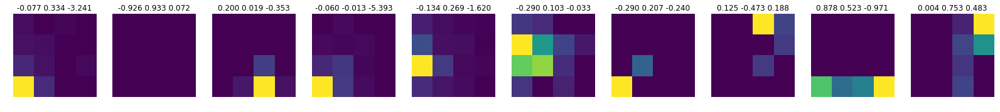

Train loss: -4.562530395894899 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6147, device='cuda:1') tensor(2.7562e-07, device='cuda:1', grad_fn=<SumBackward0>)


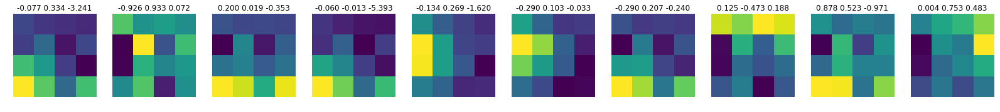

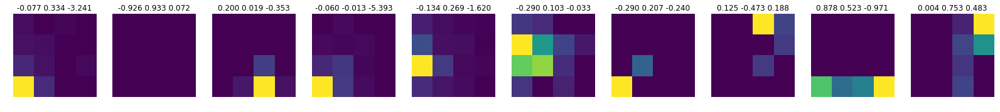

epoch: 170
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6173, device='cuda:1') tensor(2.7562e-07, device='cuda:1', grad_fn=<SumBackward0>)


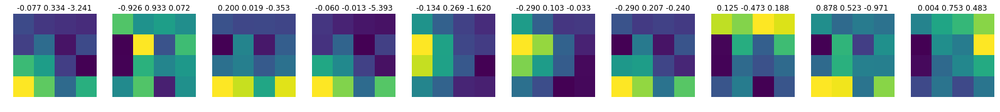

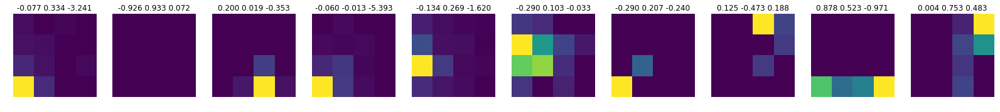

Train loss: -4.510547733175597 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5631, device='cuda:1') tensor(6.9449e-07, device='cuda:1', grad_fn=<SumBackward0>)


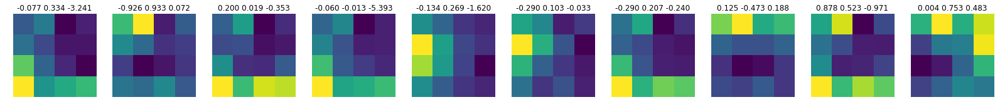

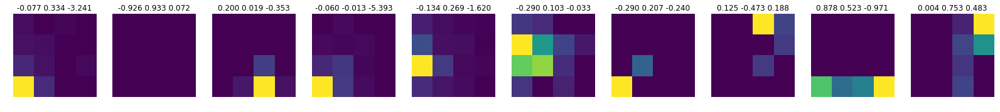

epoch: 171
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5604, device='cuda:1') tensor(6.9449e-07, device='cuda:1', grad_fn=<SumBackward0>)


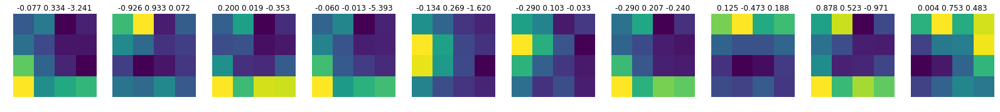

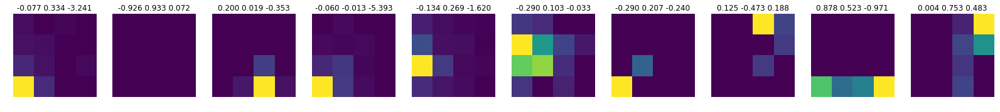

Train loss: -4.567558773006607 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6979, device='cuda:1') tensor(1.1856e-07, device='cuda:1', grad_fn=<SumBackward0>)


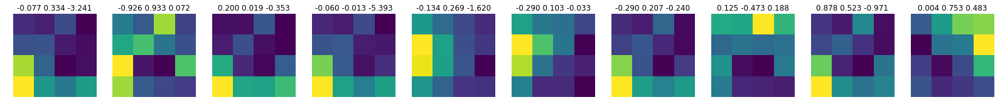

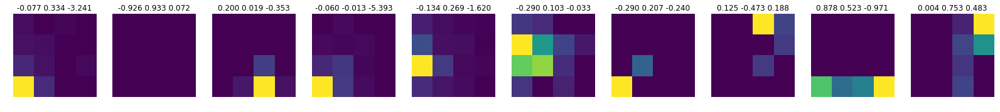

epoch: 172
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6990, device='cuda:1') tensor(1.1856e-07, device='cuda:1', grad_fn=<SumBackward0>)


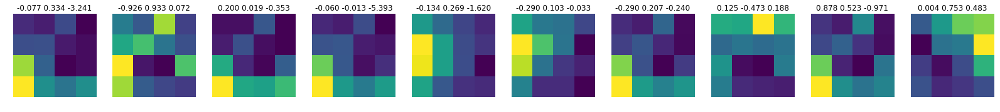

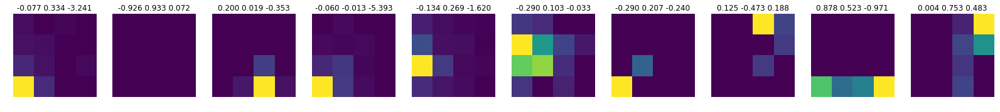

Train loss: -4.853724941255142 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7741, device='cuda:1') tensor(1.4236e-07, device='cuda:1', grad_fn=<SumBackward0>)


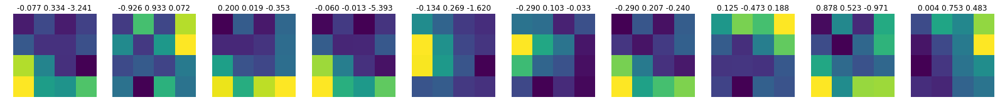

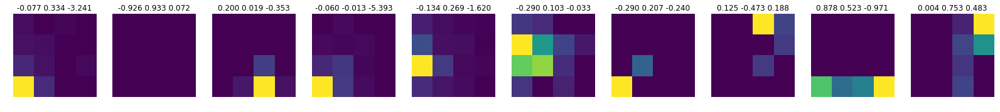

epoch: 173
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7746, device='cuda:1') tensor(1.4236e-07, device='cuda:1', grad_fn=<SumBackward0>)


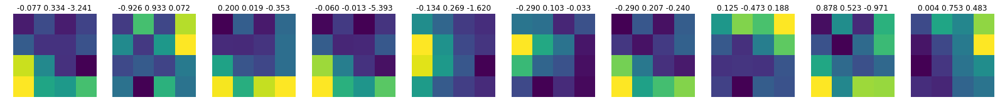

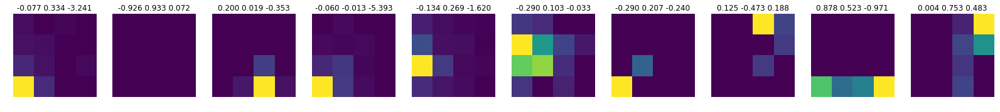

Train loss: -4.791399716034934 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8225, device='cuda:1') tensor(5.6552e-07, device='cuda:1', grad_fn=<SumBackward0>)


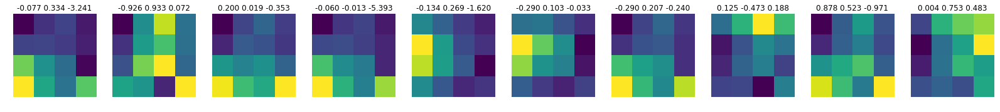

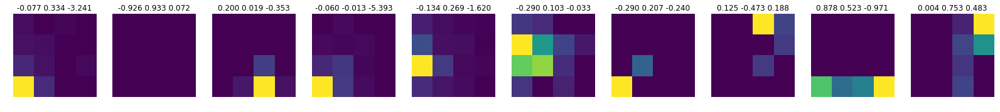

epoch: 174
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8209, device='cuda:1') tensor(5.6552e-07, device='cuda:1', grad_fn=<SumBackward0>)


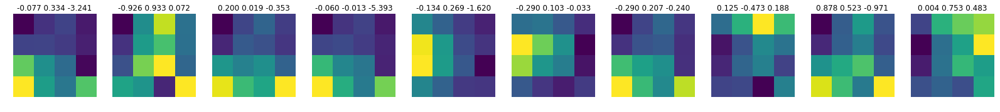

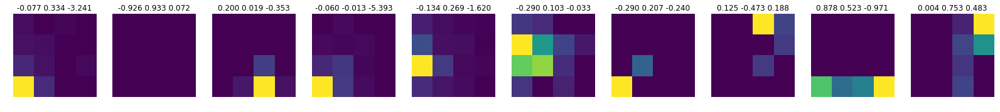

Train loss: -5.015005663449148 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6208, device='cuda:1') tensor(7.6082e-07, device='cuda:1', grad_fn=<SumBackward0>)


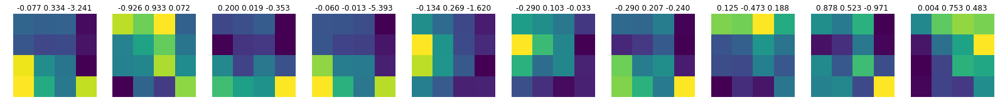

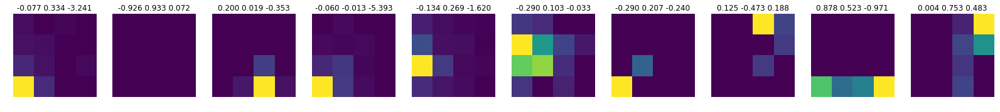

epoch: 175
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6189, device='cuda:1') tensor(7.6082e-07, device='cuda:1', grad_fn=<SumBackward0>)


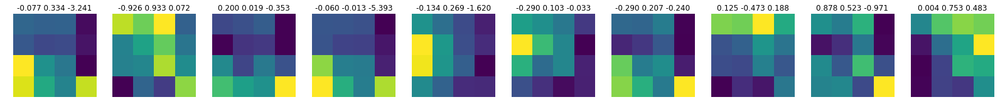

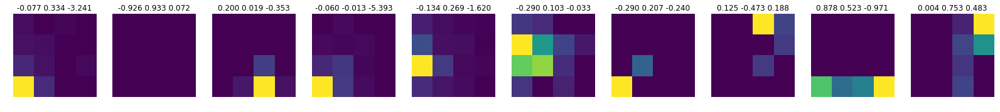

Train loss: -4.7833544573183895 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7285, device='cuda:1') tensor(4.1287e-09, device='cuda:1', grad_fn=<SumBackward0>)


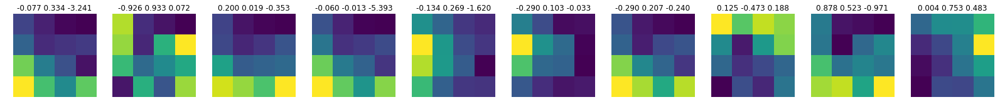

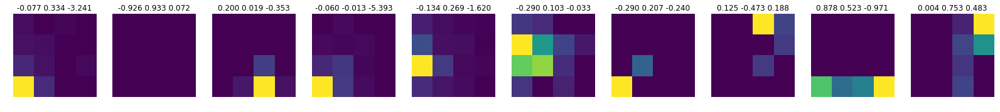

epoch: 176
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7268, device='cuda:1') tensor(4.1287e-09, device='cuda:1', grad_fn=<SumBackward0>)


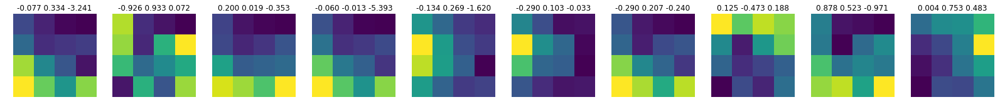

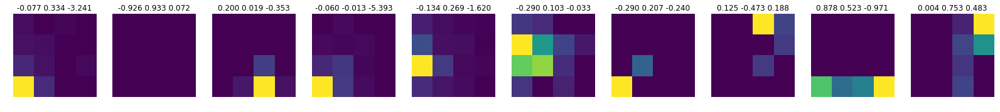

Train loss: -4.794185987038991 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8549, device='cuda:1') tensor(6.8671e-07, device='cuda:1', grad_fn=<SumBackward0>)


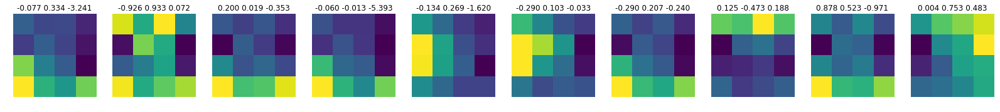

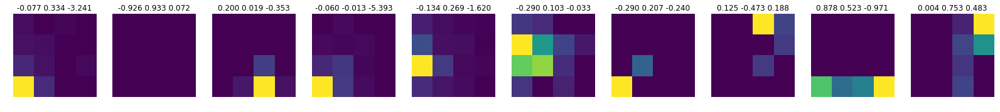

epoch: 177
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8543, device='cuda:1') tensor(6.8671e-07, device='cuda:1', grad_fn=<SumBackward0>)


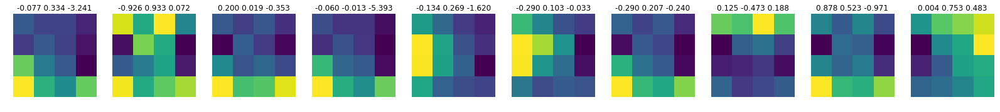

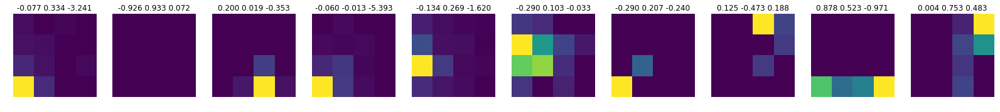

Train loss: -4.769749627615702 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6112, device='cuda:1') tensor(5.0941e-07, device='cuda:1', grad_fn=<SumBackward0>)


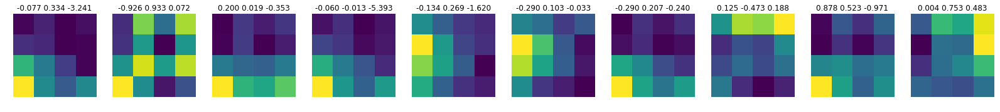

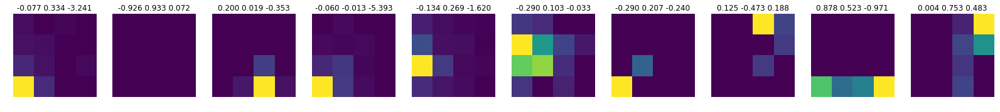

epoch: 178
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6143, device='cuda:1') tensor(5.0941e-07, device='cuda:1', grad_fn=<SumBackward0>)


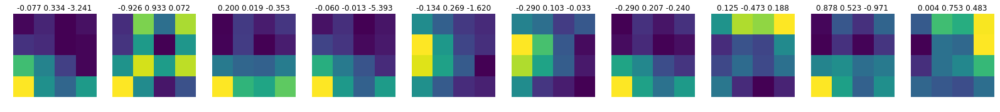

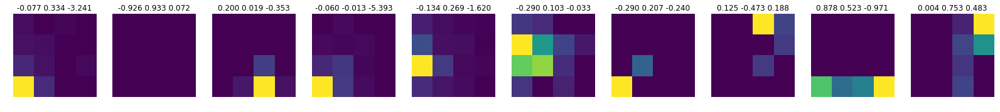

Train loss: -4.4454329555440655 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7372, device='cuda:1') tensor(2.3579e-07, device='cuda:1', grad_fn=<SumBackward0>)


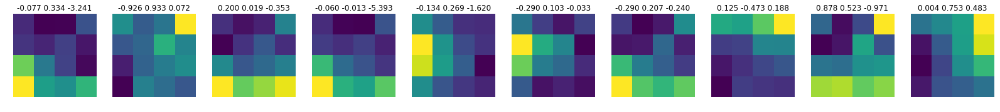

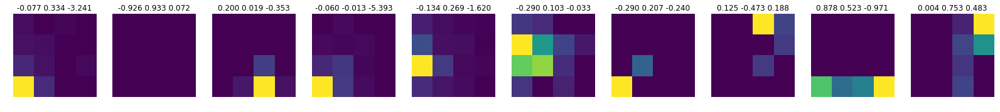

epoch: 179
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7384, device='cuda:1') tensor(2.3579e-07, device='cuda:1', grad_fn=<SumBackward0>)


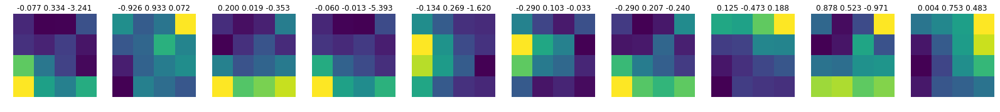

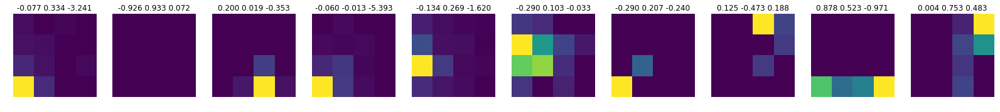

Train loss: -4.577487436530995 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6307, device='cuda:1') tensor(1.2862e-07, device='cuda:1', grad_fn=<SumBackward0>)


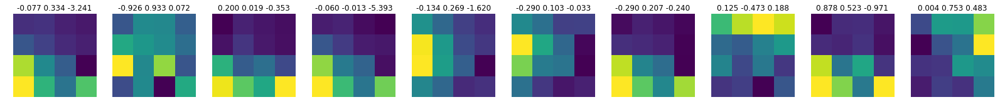

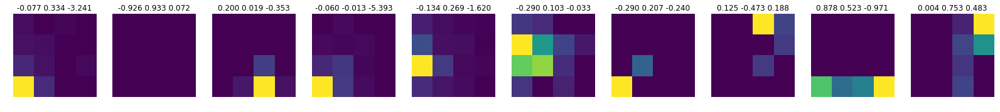

epoch: 180
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6316, device='cuda:1') tensor(1.2862e-07, device='cuda:1', grad_fn=<SumBackward0>)


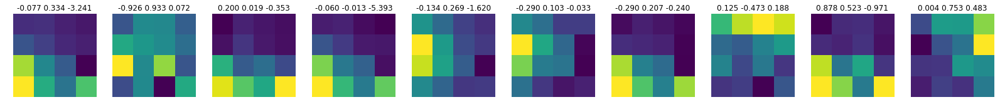

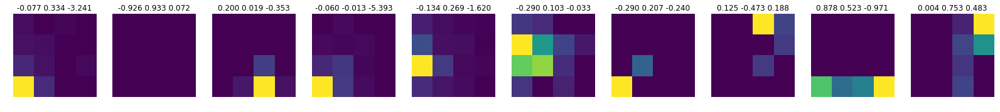

Train loss: -4.558244731762849 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8608, device='cuda:1') tensor(1.5397e-07, device='cuda:1', grad_fn=<SumBackward0>)


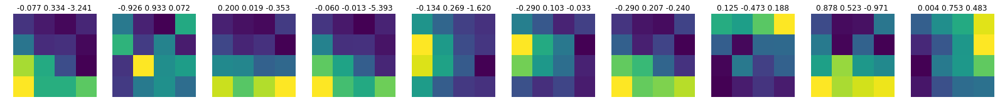

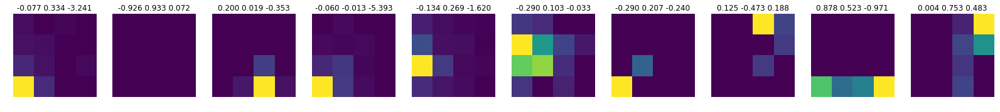

epoch: 181
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8607, device='cuda:1') tensor(1.5397e-07, device='cuda:1', grad_fn=<SumBackward0>)


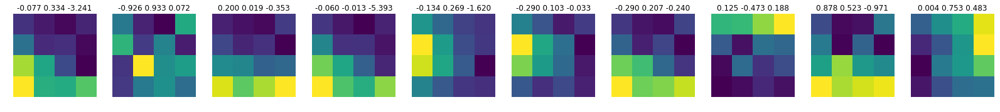

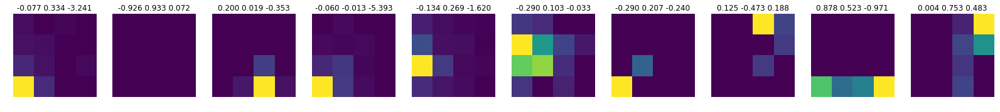

Train loss: -4.8397347109956765 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6634, device='cuda:1') tensor(9.2549e-07, device='cuda:1', grad_fn=<SumBackward0>)


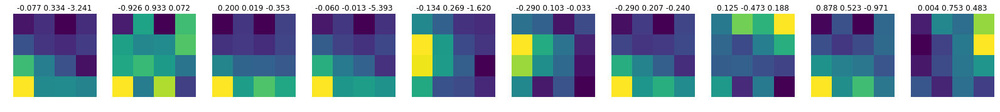

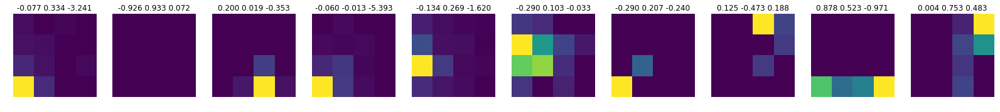

epoch: 182
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6636, device='cuda:1') tensor(9.2549e-07, device='cuda:1', grad_fn=<SumBackward0>)


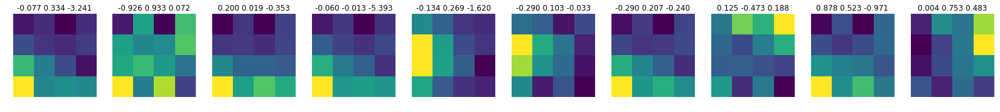

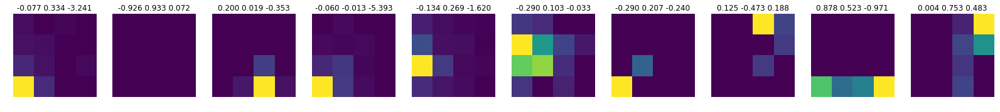

Train loss: -4.622633013733675 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2441, device='cuda:1') tensor(4.0024e-08, device='cuda:1', grad_fn=<SumBackward0>)


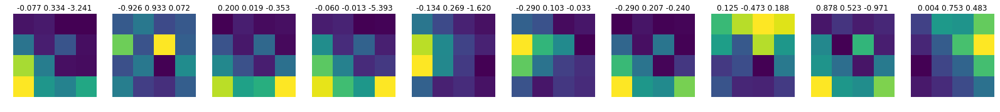

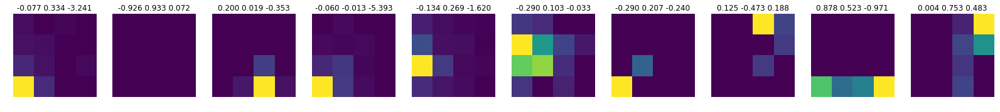

epoch: 183
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.2435, device='cuda:1') tensor(4.0024e-08, device='cuda:1', grad_fn=<SumBackward0>)


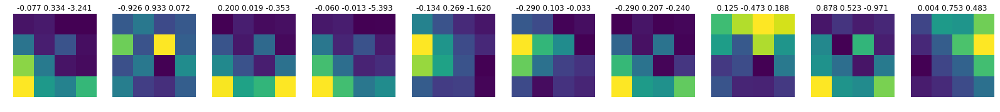

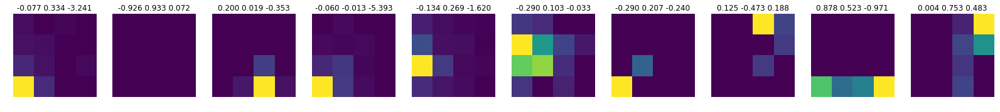

Train loss: -3.654261661801839 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7610, device='cuda:1') tensor(7.2759e-08, device='cuda:1', grad_fn=<SumBackward0>)


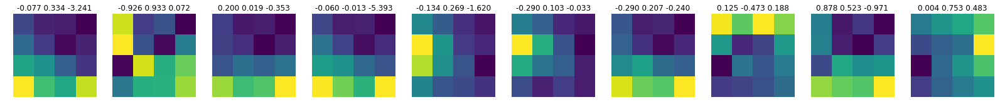

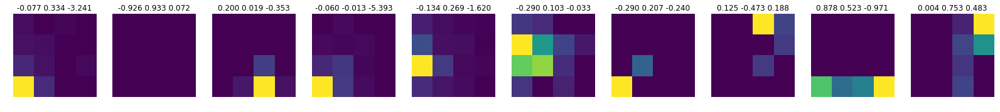

epoch: 184
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7613, device='cuda:1') tensor(7.2759e-08, device='cuda:1', grad_fn=<SumBackward0>)


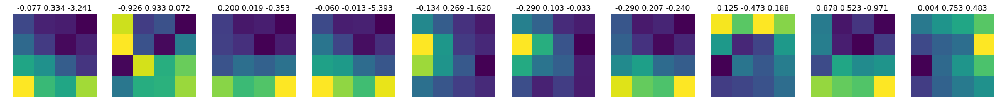

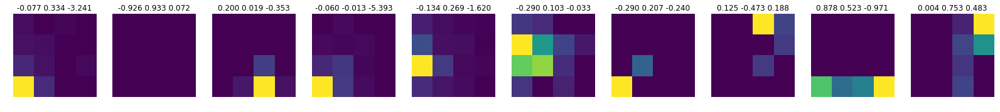

Train loss: -4.634099491957284 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8101, device='cuda:1') tensor(1.8963e-07, device='cuda:1', grad_fn=<SumBackward0>)


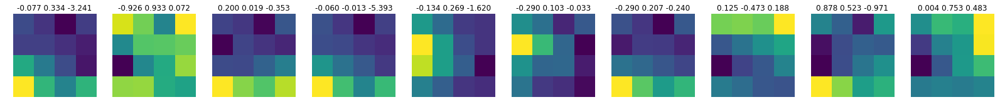

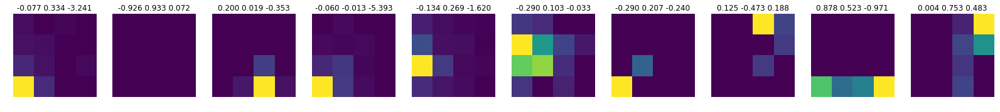

epoch: 185
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8083, device='cuda:1') tensor(1.8963e-07, device='cuda:1', grad_fn=<SumBackward0>)


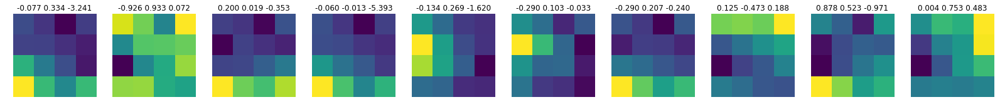

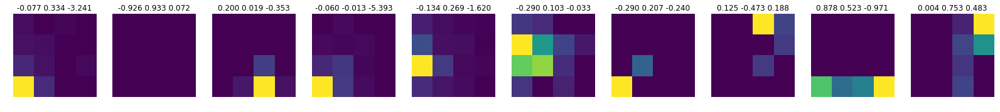

Train loss: -4.7581580741001135 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4462, device='cuda:1') tensor(2.5962e-07, device='cuda:1', grad_fn=<SumBackward0>)


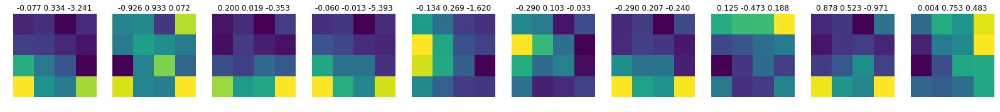

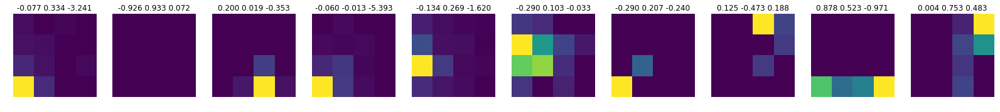

epoch: 186
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4374, device='cuda:1') tensor(2.5962e-07, device='cuda:1', grad_fn=<SumBackward0>)


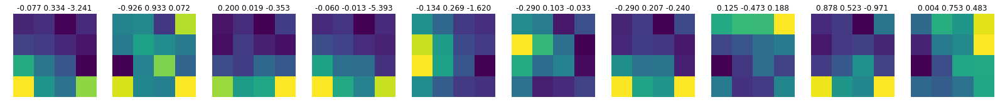

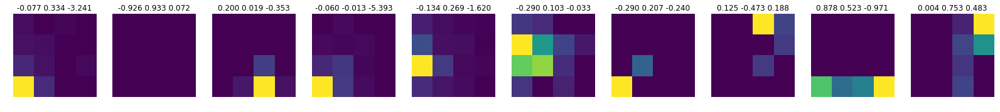

Train loss: -4.336408063743374 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6401, device='cuda:1') tensor(2.7635e-07, device='cuda:1', grad_fn=<SumBackward0>)


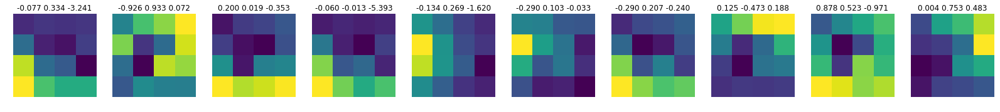

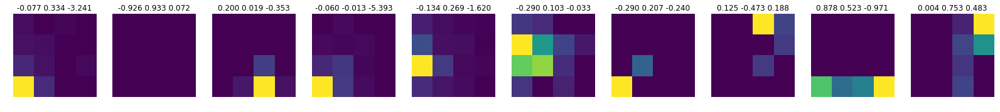

epoch: 187
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6380, device='cuda:1') tensor(2.7635e-07, device='cuda:1', grad_fn=<SumBackward0>)


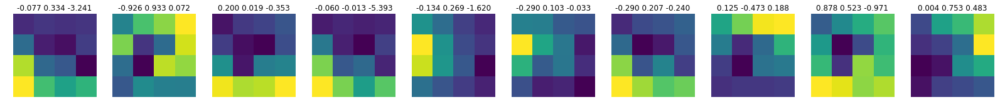

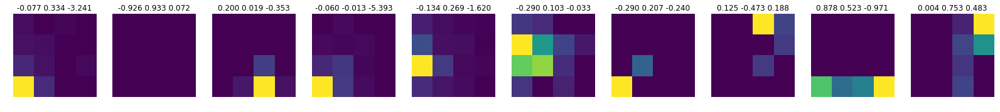

Train loss: -4.570771306474386 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5531, device='cuda:1') tensor(4.4963e-07, device='cuda:1', grad_fn=<SumBackward0>)


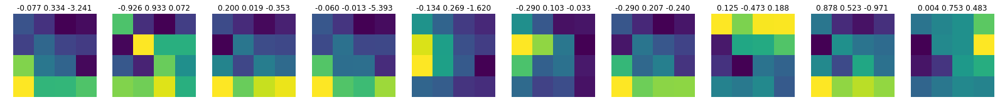

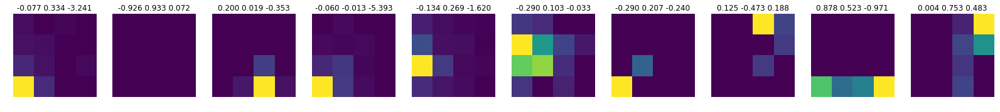

epoch: 188
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5561, device='cuda:1') tensor(4.4963e-07, device='cuda:1', grad_fn=<SumBackward0>)


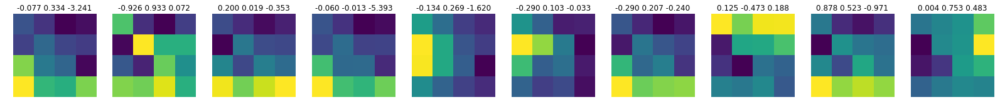

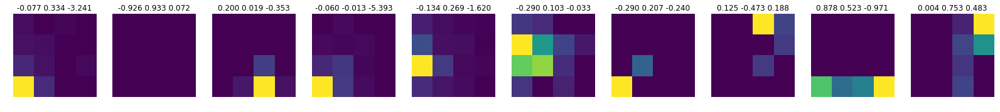

Train loss: -4.606997915100882 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6921, device='cuda:1') tensor(1.0542e-07, device='cuda:1', grad_fn=<SumBackward0>)


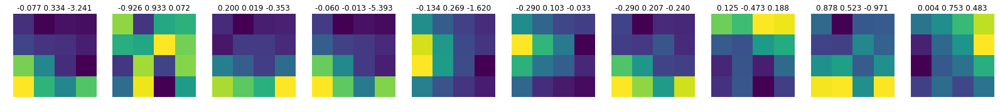

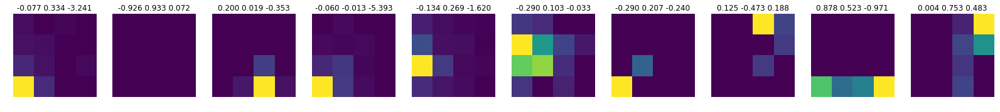

epoch: 189
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6926, device='cuda:1') tensor(1.0542e-07, device='cuda:1', grad_fn=<SumBackward0>)


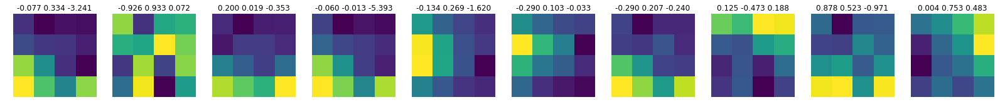

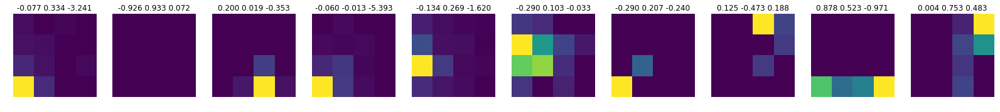

Train loss: -4.558352681990101 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5625, device='cuda:1') tensor(2.0110e-07, device='cuda:1', grad_fn=<SumBackward0>)


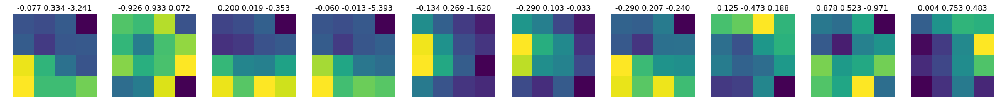

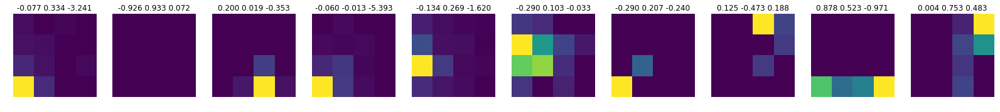

epoch: 190
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5619, device='cuda:1') tensor(2.0110e-07, device='cuda:1', grad_fn=<SumBackward0>)


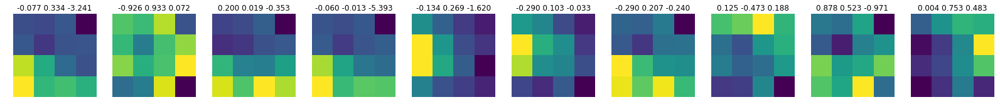

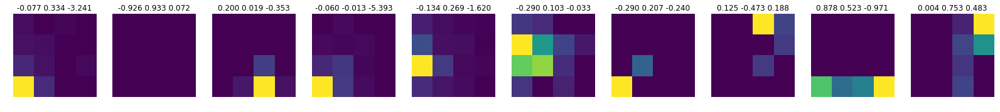

Train loss: -4.67324372516705 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5637, device='cuda:1') tensor(5.6777e-07, device='cuda:1', grad_fn=<SumBackward0>)


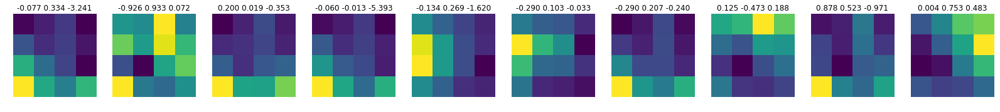

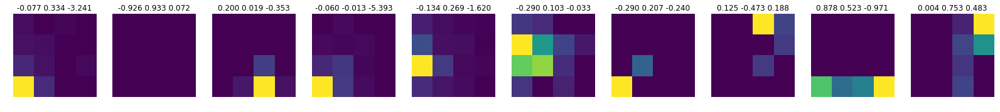

epoch: 191
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5666, device='cuda:1') tensor(5.6777e-07, device='cuda:1', grad_fn=<SumBackward0>)


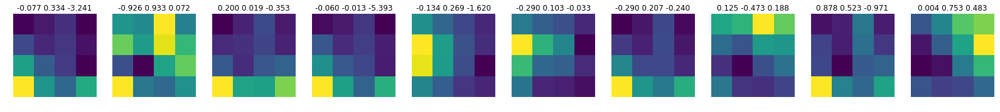

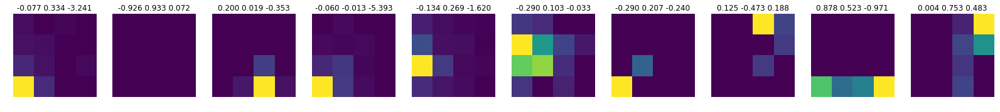

Train loss: -4.596084423473404 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7663, device='cuda:1') tensor(1.0448e-06, device='cuda:1', grad_fn=<SumBackward0>)


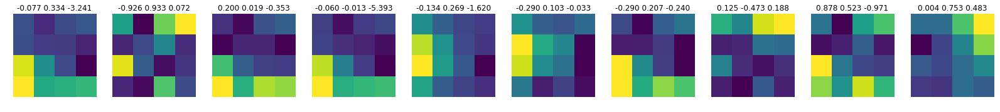

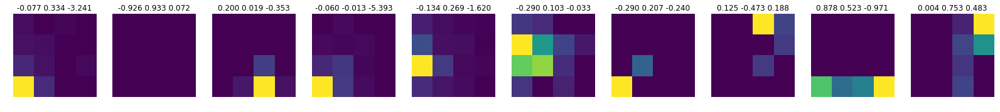

epoch: 192
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7675, device='cuda:1') tensor(1.0448e-06, device='cuda:1', grad_fn=<SumBackward0>)


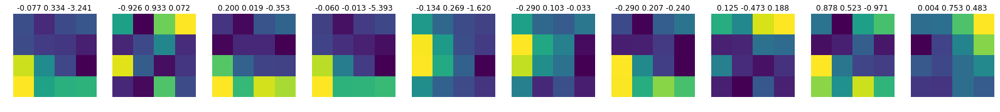

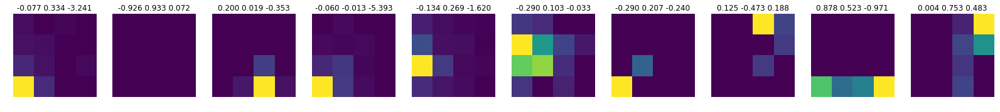

Train loss: -4.7778110986742615 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7472, device='cuda:1') tensor(2.4448e-08, device='cuda:1', grad_fn=<SumBackward0>)


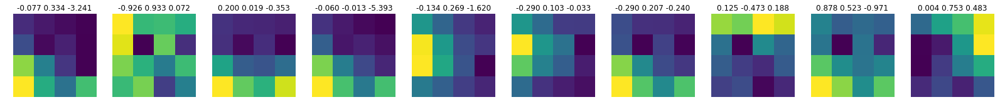

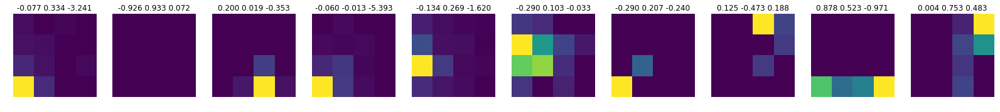

epoch: 193
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7471, device='cuda:1') tensor(2.4448e-08, device='cuda:1', grad_fn=<SumBackward0>)


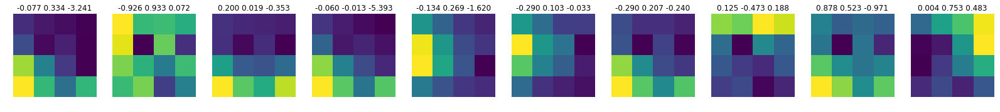

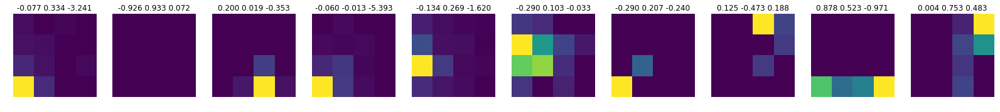

Train loss: -4.662555186883852 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7519, device='cuda:1') tensor(2.8844e-08, device='cuda:1', grad_fn=<SumBackward0>)


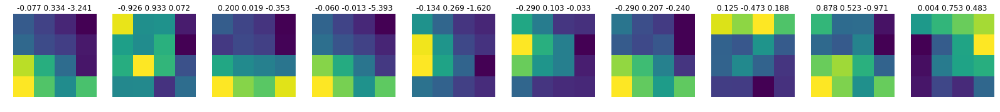

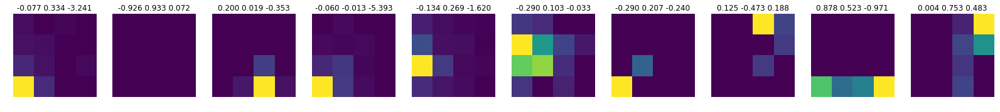

epoch: 194
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7518, device='cuda:1') tensor(2.8844e-08, device='cuda:1', grad_fn=<SumBackward0>)


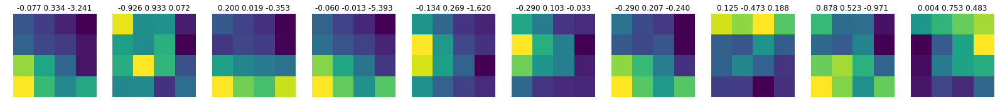

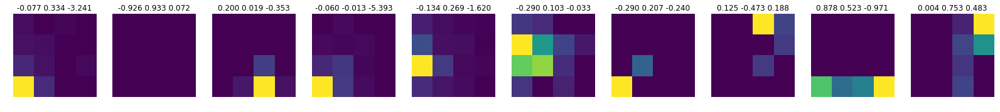

Train loss: -4.659198601601895 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5772, device='cuda:1') tensor(9.8532e-09, device='cuda:1', grad_fn=<SumBackward0>)


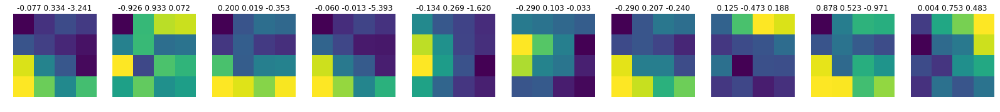

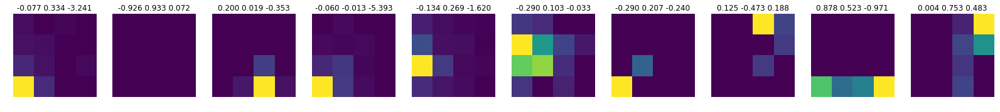

epoch: 195
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5759, device='cuda:1') tensor(9.8532e-09, device='cuda:1', grad_fn=<SumBackward0>)


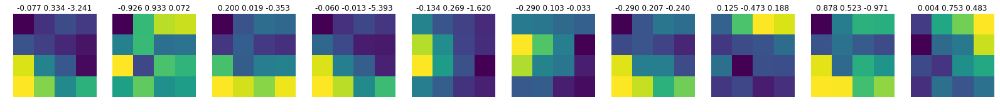

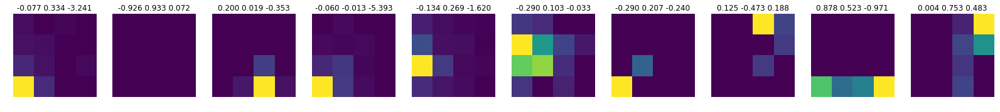

Train loss: -4.402004929456497 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6953, device='cuda:1') tensor(1.6245e-07, device='cuda:1', grad_fn=<SumBackward0>)


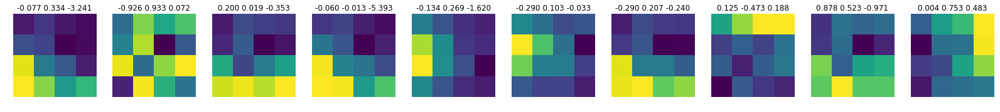

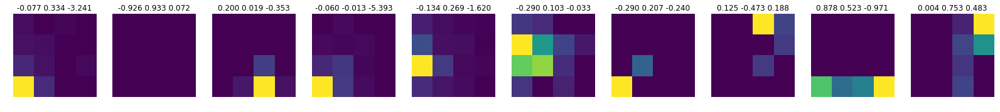

epoch: 196
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6917, device='cuda:1') tensor(1.6245e-07, device='cuda:1', grad_fn=<SumBackward0>)


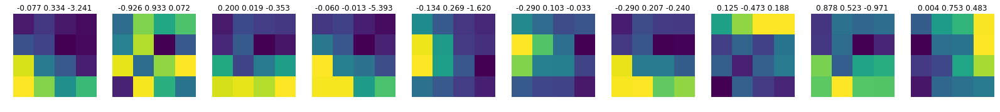

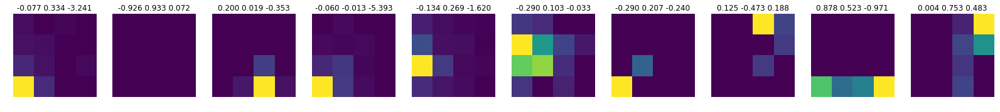

Train loss: -4.630627473582905 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3728, device='cuda:1') tensor(1.2860e-07, device='cuda:1', grad_fn=<SumBackward0>)


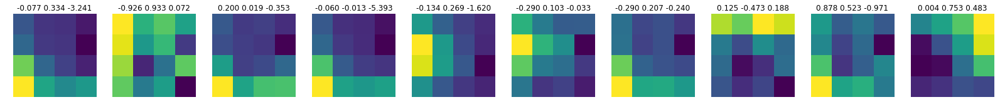

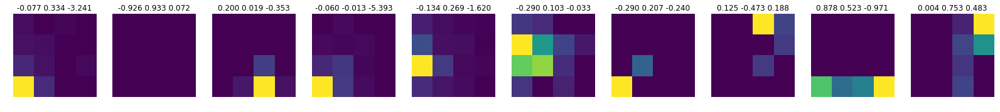

epoch: 197
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.3742, device='cuda:1') tensor(1.2860e-07, device='cuda:1', grad_fn=<SumBackward0>)


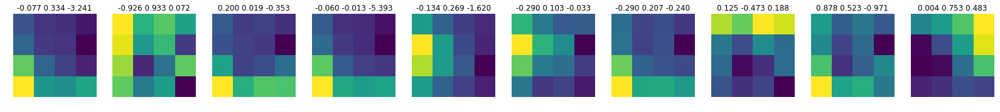

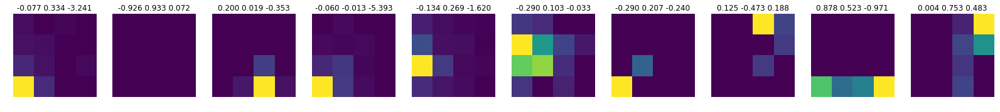

Train loss: -4.174486856129221 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6110, device='cuda:1') tensor(8.8294e-09, device='cuda:1', grad_fn=<SumBackward0>)


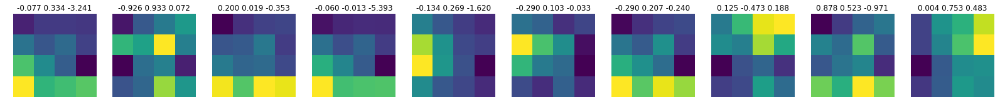

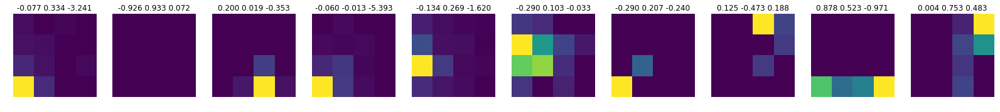

epoch: 198
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6108, device='cuda:1') tensor(8.8294e-09, device='cuda:1', grad_fn=<SumBackward0>)


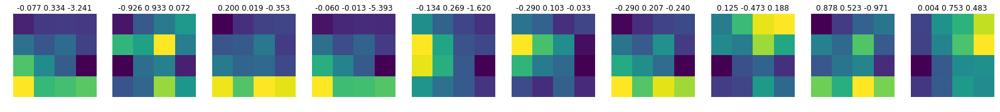

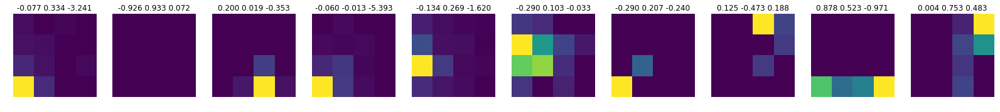

Train loss: -4.51735016989087 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6562, device='cuda:1') tensor(3.9244e-08, device='cuda:1', grad_fn=<SumBackward0>)


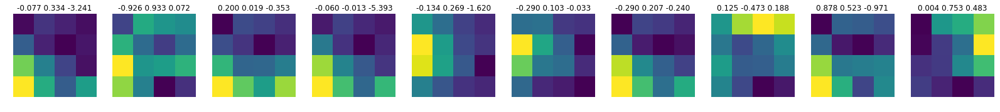

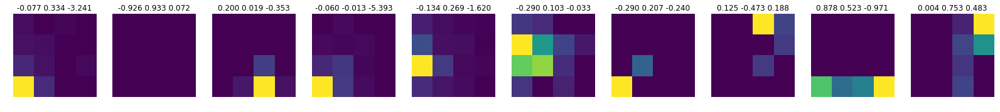

epoch: 199
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6576, device='cuda:1') tensor(3.9244e-08, device='cuda:1', grad_fn=<SumBackward0>)


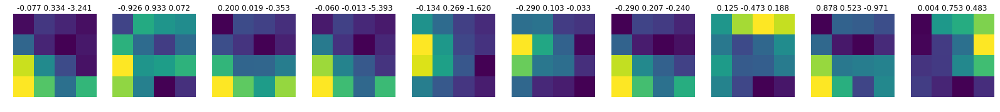

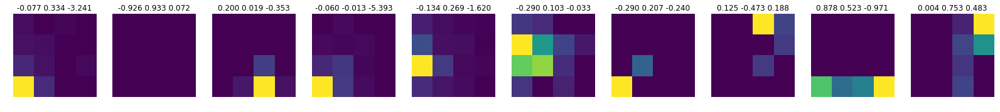

Train loss: -4.720885176937377 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8263, device='cuda:1') tensor(3.8768e-07, device='cuda:1', grad_fn=<SumBackward0>)


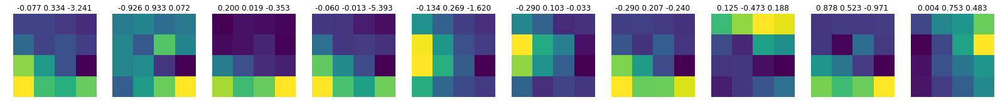

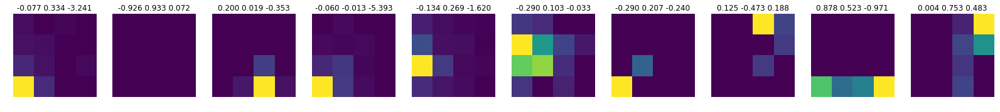

epoch: 200
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8245, device='cuda:1') tensor(3.8768e-07, device='cuda:1', grad_fn=<SumBackward0>)


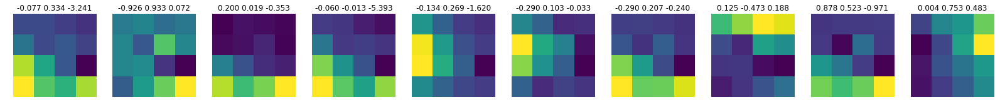

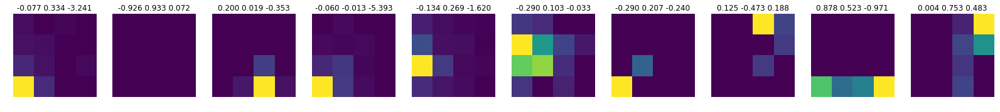

Train loss: -4.800856907990772 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7136, device='cuda:1') tensor(1.5077e-07, device='cuda:1', grad_fn=<SumBackward0>)


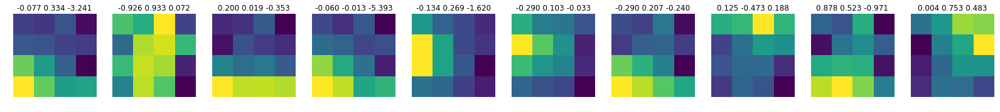

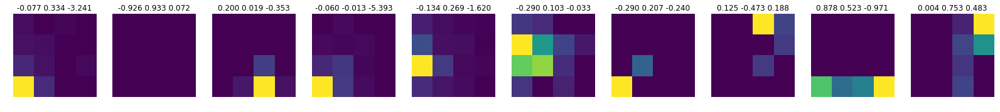

epoch: 201
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7112, device='cuda:1') tensor(1.5077e-07, device='cuda:1', grad_fn=<SumBackward0>)


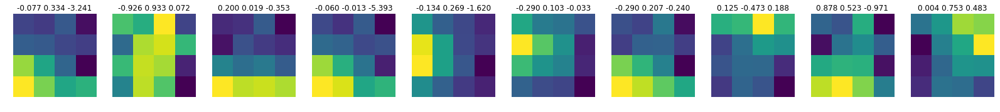

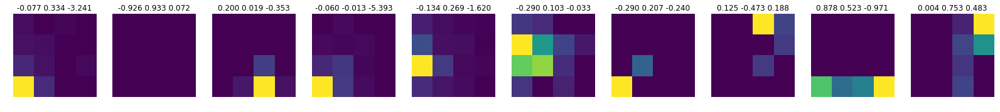

Train loss: -4.724082663056965 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9906, device='cuda:1') tensor(3.7799e-07, device='cuda:1', grad_fn=<SumBackward0>)


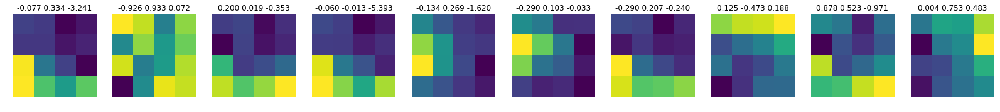

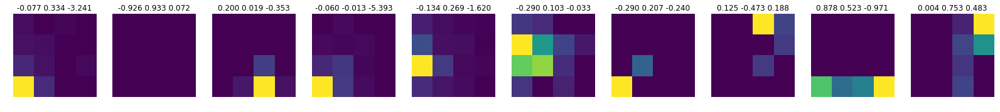

epoch: 202
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9885, device='cuda:1') tensor(3.7799e-07, device='cuda:1', grad_fn=<SumBackward0>)


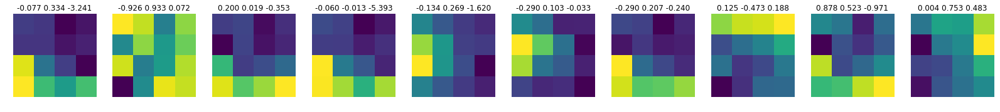

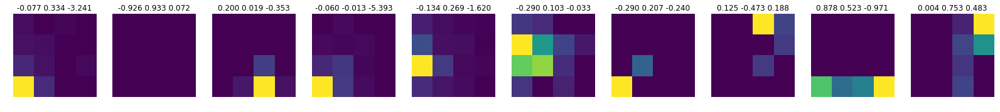

Train loss: -4.922805250974411 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8663, device='cuda:1') tensor(2.1413e-07, device='cuda:1', grad_fn=<SumBackward0>)


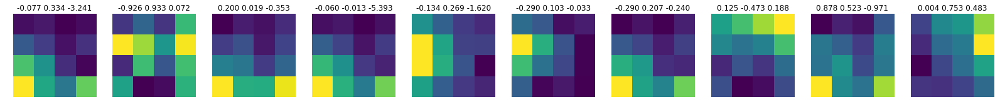

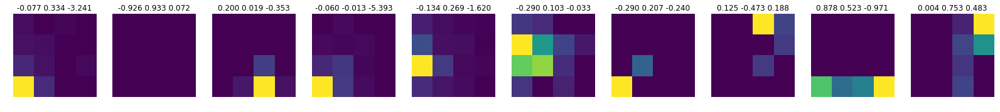

epoch: 203
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8711, device='cuda:1') tensor(2.1413e-07, device='cuda:1', grad_fn=<SumBackward0>)


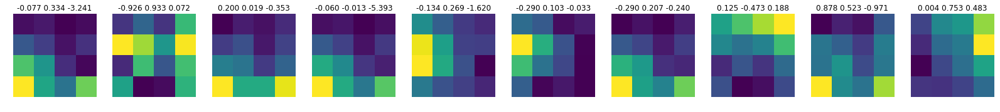

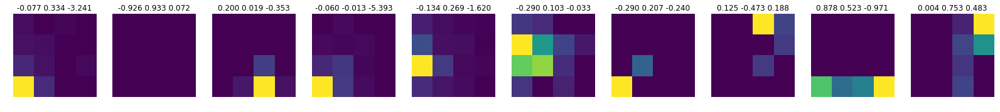

Train loss: -4.849979445818114 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7848, device='cuda:1') tensor(1.4632e-07, device='cuda:1', grad_fn=<SumBackward0>)


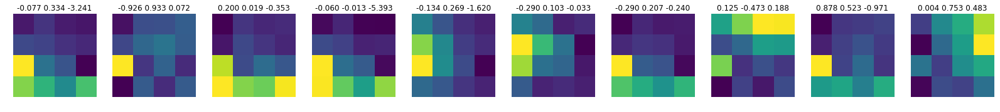

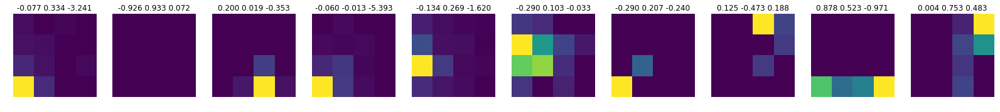

epoch: 204
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7859, device='cuda:1') tensor(1.4632e-07, device='cuda:1', grad_fn=<SumBackward0>)


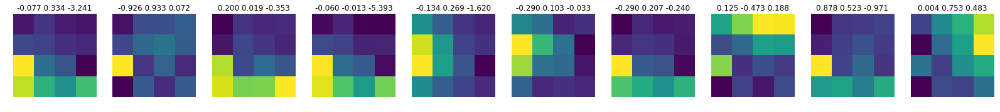

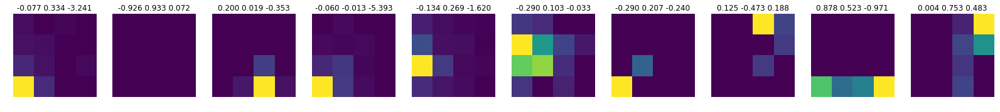

Train loss: -4.742398728533588 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8338, device='cuda:1') tensor(6.3468e-08, device='cuda:1', grad_fn=<SumBackward0>)


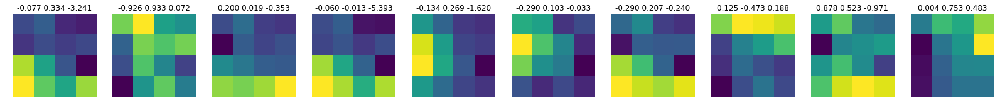

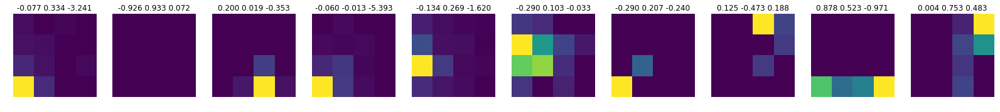

epoch: 205
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8349, device='cuda:1') tensor(6.3468e-08, device='cuda:1', grad_fn=<SumBackward0>)


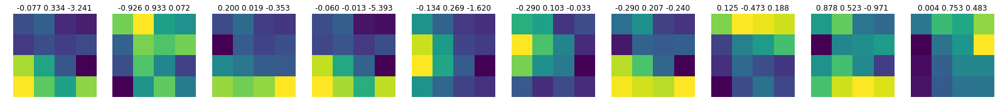

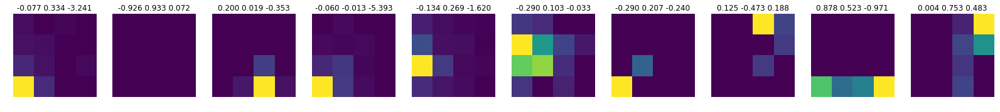

Train loss: -4.808318328022548 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7917, device='cuda:1') tensor(6.7929e-08, device='cuda:1', grad_fn=<SumBackward0>)


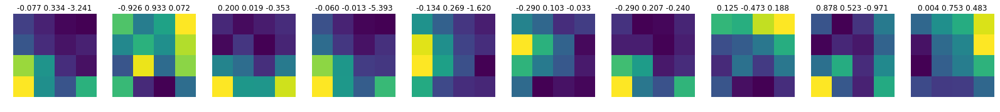

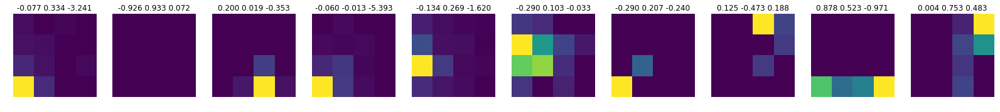

epoch: 206
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7901, device='cuda:1') tensor(6.7929e-08, device='cuda:1', grad_fn=<SumBackward0>)


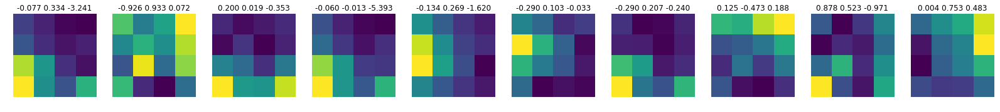

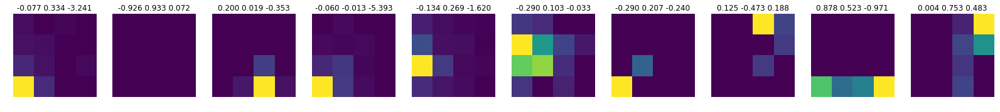

Train loss: -4.722998449366976 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6918, device='cuda:1') tensor(1.2716e-08, device='cuda:1', grad_fn=<SumBackward0>)


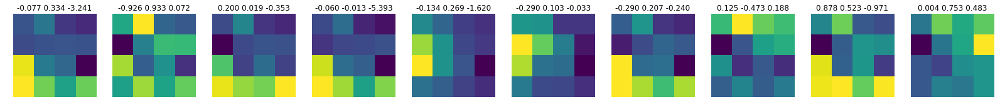

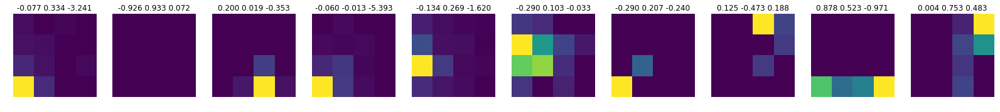

epoch: 207
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6957, device='cuda:1') tensor(1.2716e-08, device='cuda:1', grad_fn=<SumBackward0>)


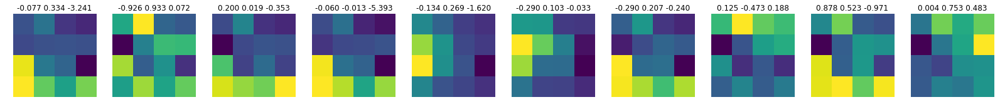

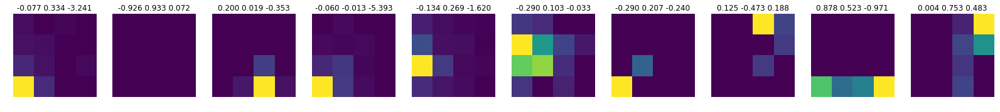

Train loss: -4.841052756687641 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6194, device='cuda:1') tensor(6.1495e-08, device='cuda:1', grad_fn=<SumBackward0>)


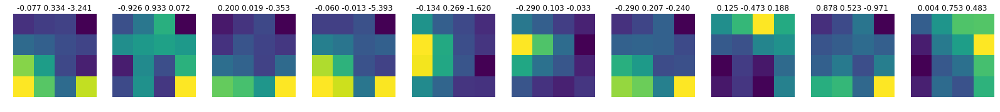

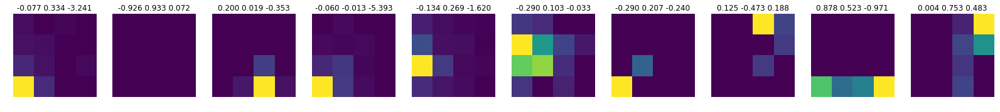

epoch: 208
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6230, device='cuda:1') tensor(6.1495e-08, device='cuda:1', grad_fn=<SumBackward0>)


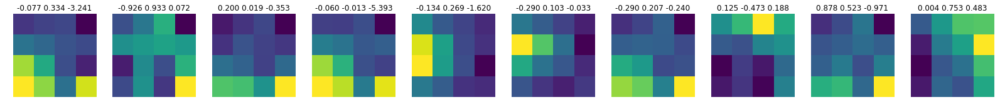

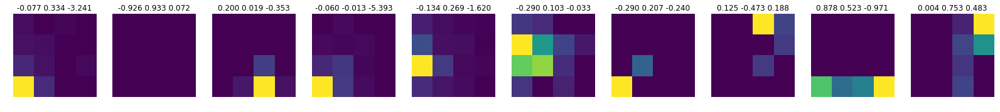

Train loss: -4.511690072978295 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7385, device='cuda:1') tensor(5.3928e-08, device='cuda:1', grad_fn=<SumBackward0>)


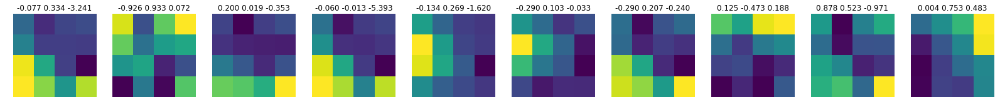

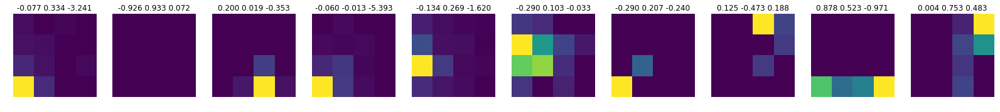

epoch: 209
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7383, device='cuda:1') tensor(5.3928e-08, device='cuda:1', grad_fn=<SumBackward0>)


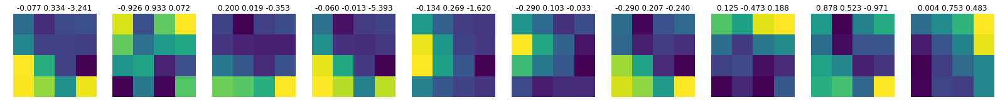

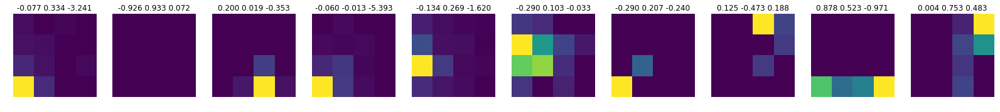

Train loss: -4.722390820401919 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8377, device='cuda:1') tensor(8.6384e-08, device='cuda:1', grad_fn=<SumBackward0>)


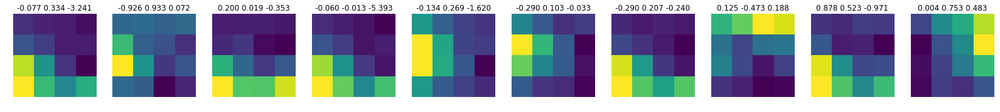

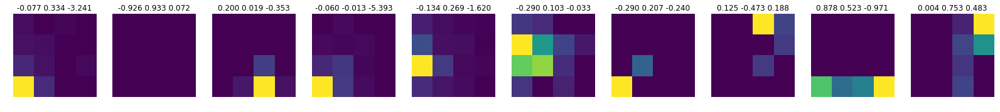

epoch: 210
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8392, device='cuda:1') tensor(8.6384e-08, device='cuda:1', grad_fn=<SumBackward0>)


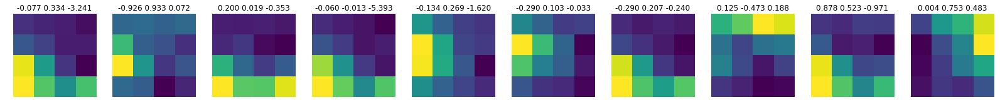

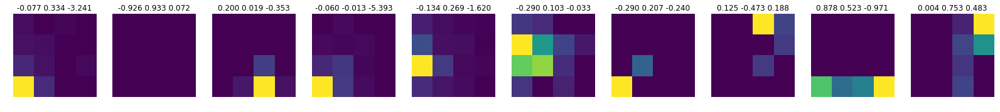

Train loss: -4.8447967690793945 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8956, device='cuda:1') tensor(1.0467e-07, device='cuda:1', grad_fn=<SumBackward0>)


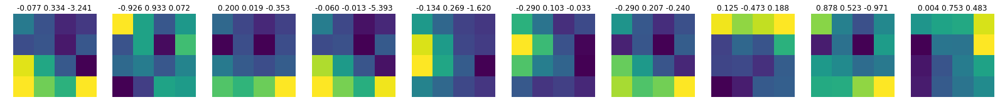

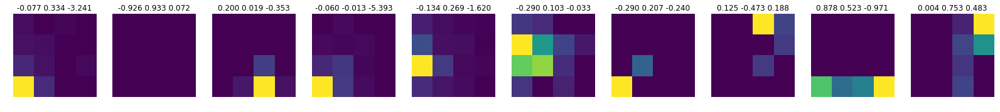

epoch: 211
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8944, device='cuda:1') tensor(1.0467e-07, device='cuda:1', grad_fn=<SumBackward0>)


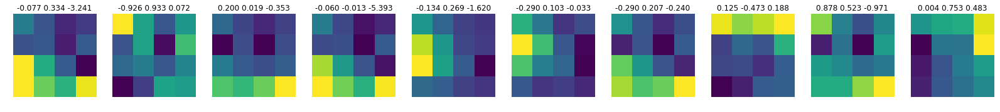

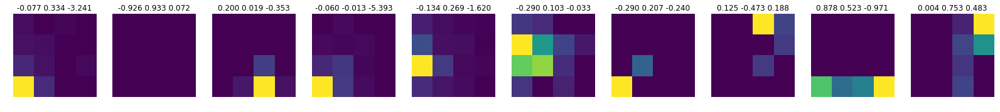

Train loss: -4.861452668931205 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7556, device='cuda:1') tensor(3.0975e-08, device='cuda:1', grad_fn=<SumBackward0>)


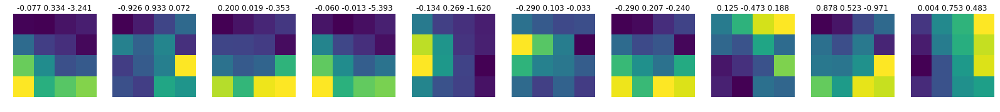

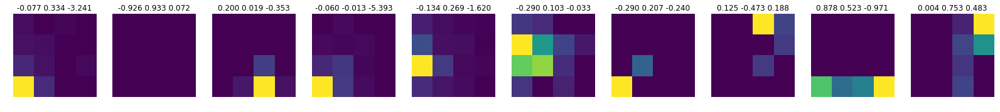

epoch: 212
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7558, device='cuda:1') tensor(3.0975e-08, device='cuda:1', grad_fn=<SumBackward0>)


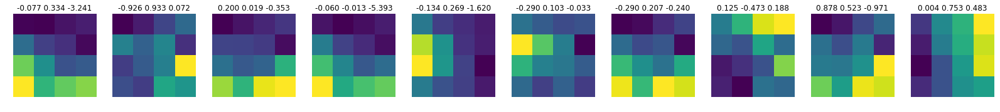

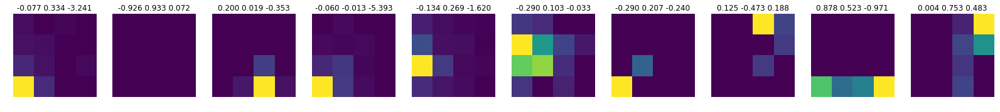

Train loss: -4.8185914489160275 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8476, device='cuda:1') tensor(1.4292e-07, device='cuda:1', grad_fn=<SumBackward0>)


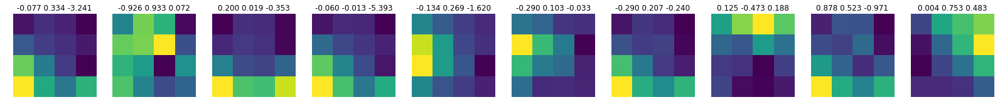

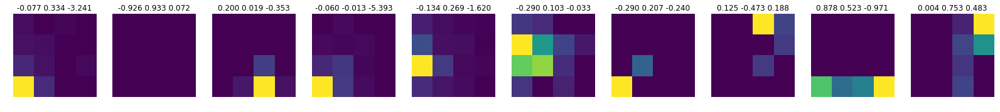

epoch: 213
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8456, device='cuda:1') tensor(1.4292e-07, device='cuda:1', grad_fn=<SumBackward0>)


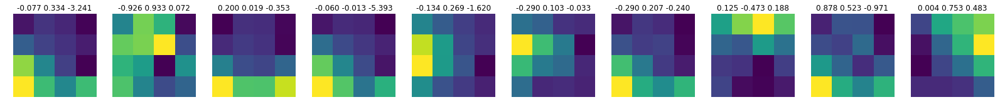

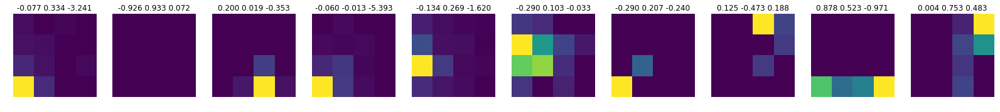

Train loss: -4.650137320470418 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8198, device='cuda:1') tensor(2.1716e-08, device='cuda:1', grad_fn=<SumBackward0>)


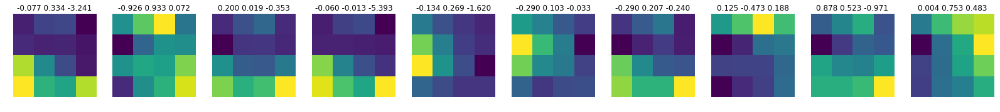

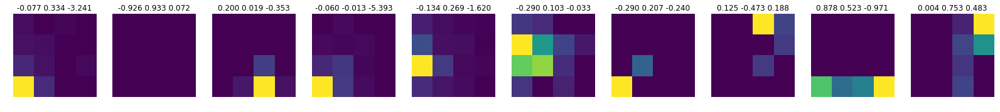

epoch: 214
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8206, device='cuda:1') tensor(2.1716e-08, device='cuda:1', grad_fn=<SumBackward0>)


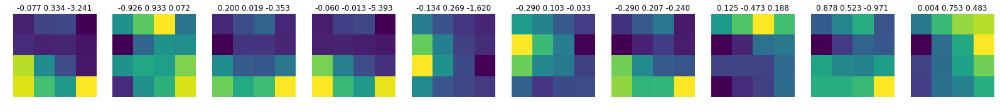

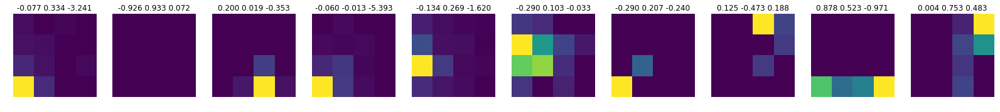

Train loss: -4.803217595140992 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8000, device='cuda:1') tensor(1.5218e-06, device='cuda:1', grad_fn=<SumBackward0>)


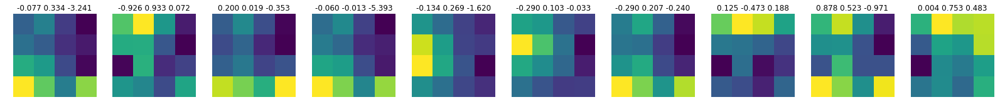

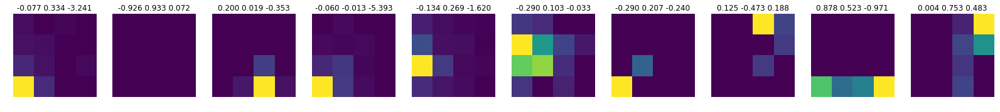

epoch: 215
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7946, device='cuda:1') tensor(1.5218e-06, device='cuda:1', grad_fn=<SumBackward0>)


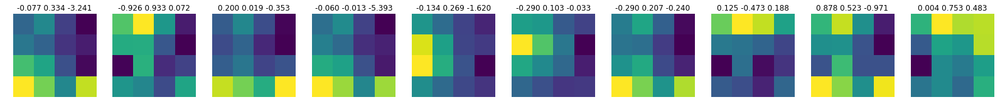

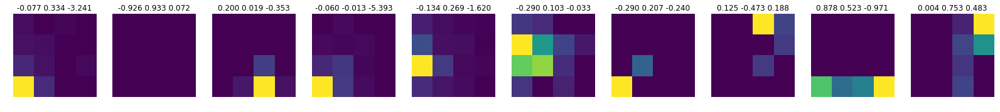

Train loss: -5.075764425891784 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6353, device='cuda:1') tensor(2.3096e-07, device='cuda:1', grad_fn=<SumBackward0>)


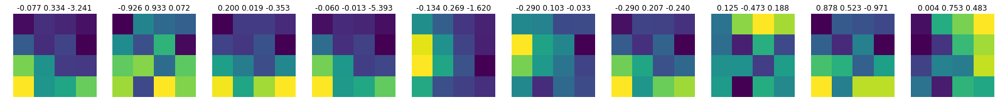

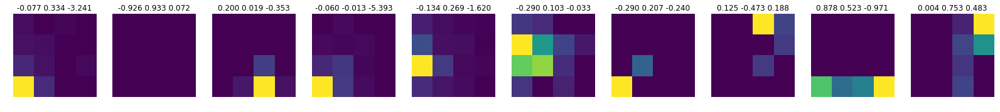

epoch: 216
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6353, device='cuda:1') tensor(2.3096e-07, device='cuda:1', grad_fn=<SumBackward0>)


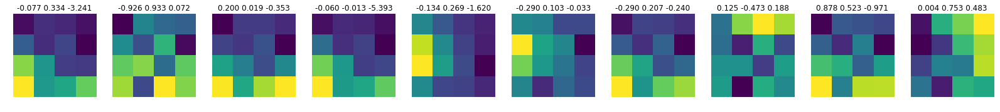

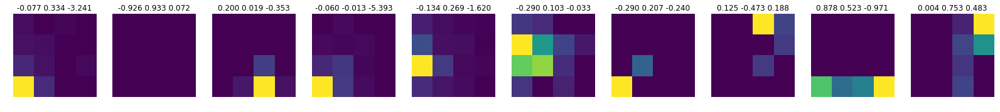

Train loss: -4.89300210401321 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6497, device='cuda:1') tensor(1.4095e-07, device='cuda:1', grad_fn=<SumBackward0>)


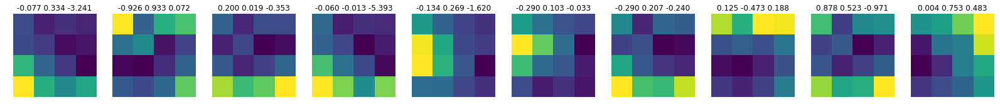

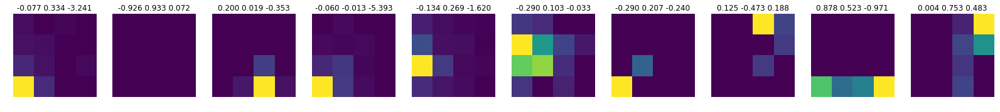

epoch: 217
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6516, device='cuda:1') tensor(1.4095e-07, device='cuda:1', grad_fn=<SumBackward0>)


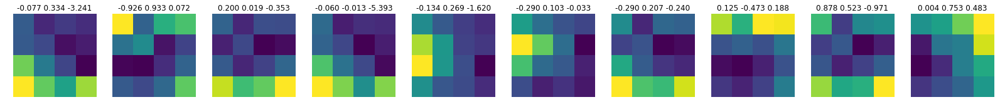

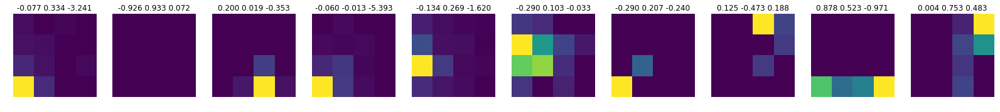

Train loss: -4.671227215072444 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5539, device='cuda:1') tensor(1.6144e-08, device='cuda:1', grad_fn=<SumBackward0>)


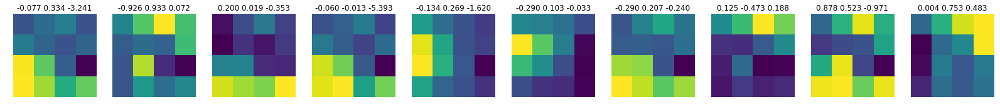

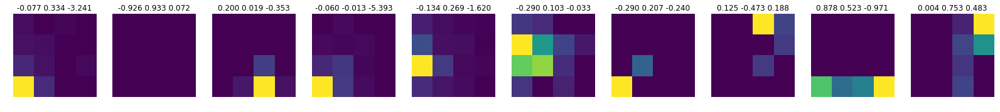

epoch: 218
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5528, device='cuda:1') tensor(1.6144e-08, device='cuda:1', grad_fn=<SumBackward0>)


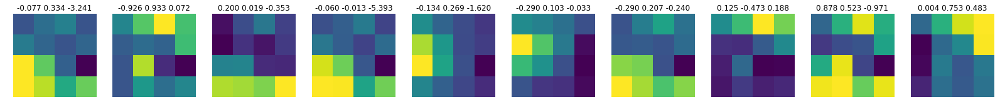

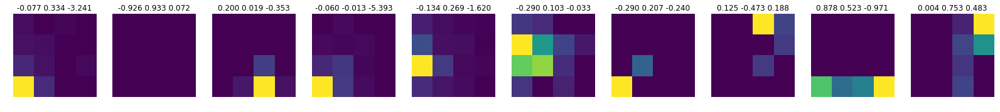

Train loss: -4.705791636726379 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6328, device='cuda:1') tensor(1.4926e-07, device='cuda:1', grad_fn=<SumBackward0>)


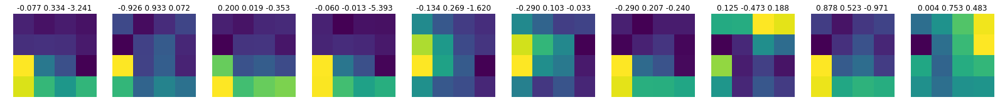

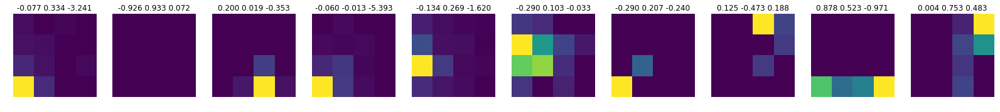

epoch: 219
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6305, device='cuda:1') tensor(1.4926e-07, device='cuda:1', grad_fn=<SumBackward0>)


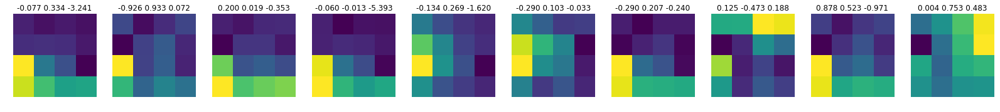

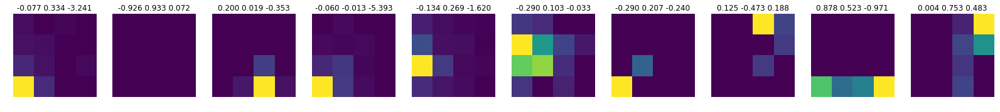

Train loss: -4.6739655568152045 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6087, device='cuda:1') tensor(3.9934e-09, device='cuda:1', grad_fn=<SumBackward0>)


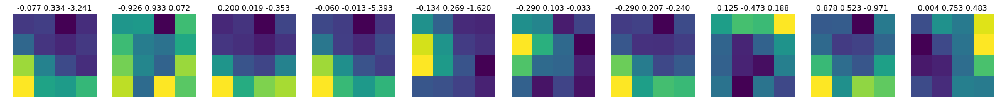

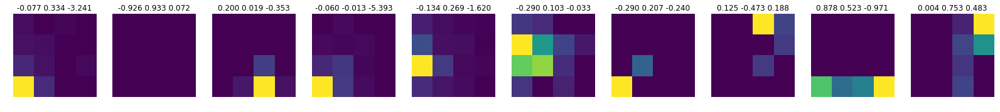

epoch: 220
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6094, device='cuda:1') tensor(3.9934e-09, device='cuda:1', grad_fn=<SumBackward0>)


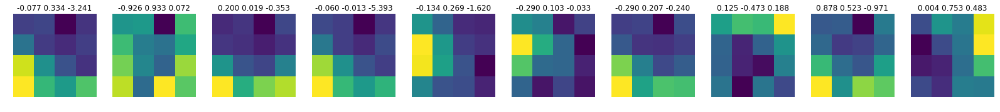

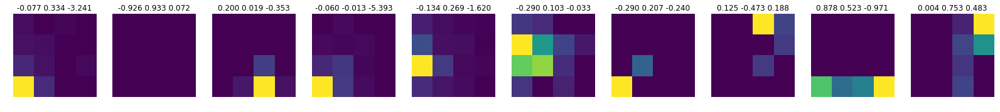

Train loss: -4.625493285680735 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9615, device='cuda:1') tensor(4.4565e-07, device='cuda:1', grad_fn=<SumBackward0>)


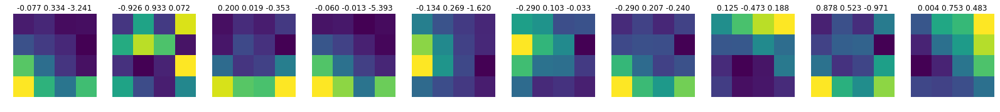

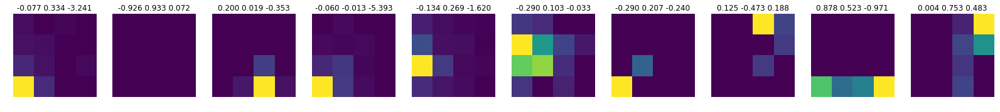

epoch: 221
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9625, device='cuda:1') tensor(4.4565e-07, device='cuda:1', grad_fn=<SumBackward0>)


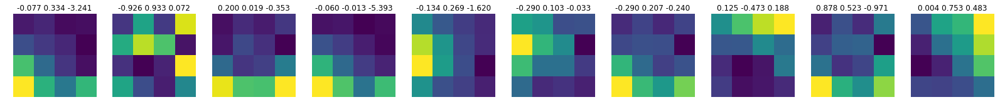

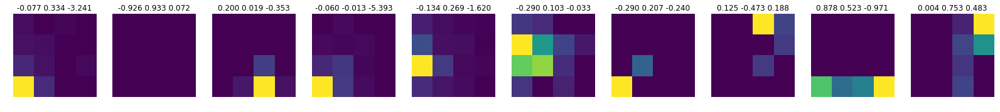

Train loss: -4.857514008130115 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7270, device='cuda:1') tensor(3.3755e-07, device='cuda:1', grad_fn=<SumBackward0>)


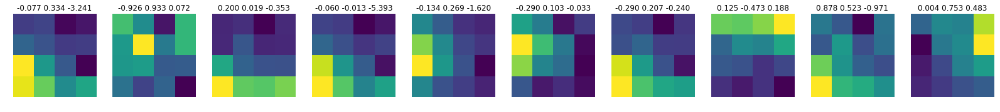

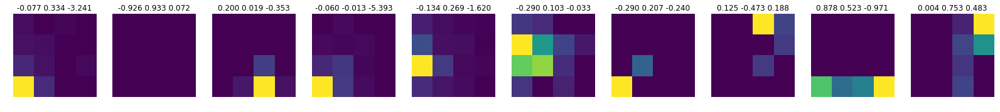

epoch: 222
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7260, device='cuda:1') tensor(3.3755e-07, device='cuda:1', grad_fn=<SumBackward0>)


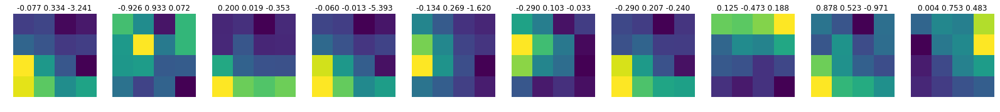

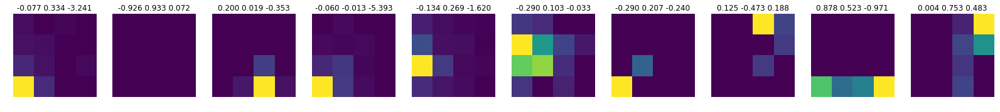

Train loss: -4.685475991717902 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5722, device='cuda:1') tensor(1.7184e-08, device='cuda:1', grad_fn=<SumBackward0>)


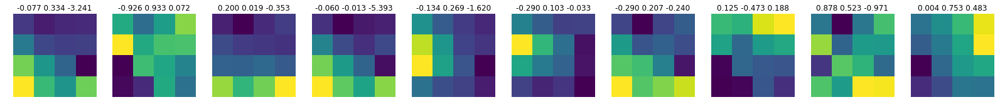

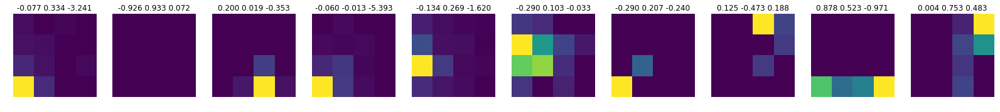

epoch: 223
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5716, device='cuda:1') tensor(1.7184e-08, device='cuda:1', grad_fn=<SumBackward0>)


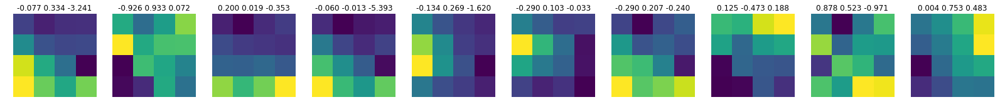

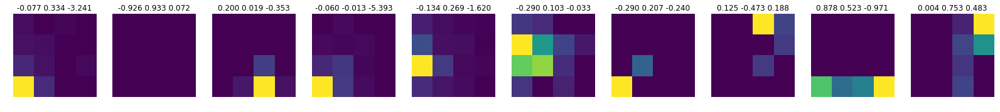

Train loss: -4.527811455930698 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8022, device='cuda:1') tensor(1.2664e-06, device='cuda:1', grad_fn=<SumBackward0>)


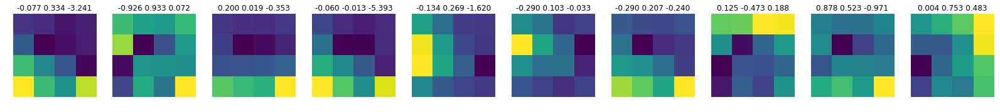

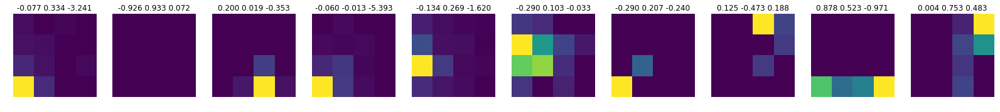

epoch: 224
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8034, device='cuda:1') tensor(1.2664e-06, device='cuda:1', grad_fn=<SumBackward0>)


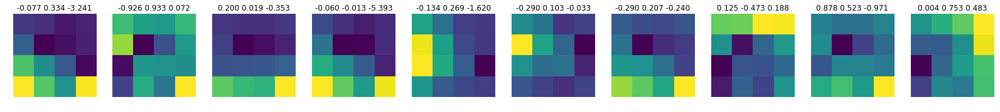

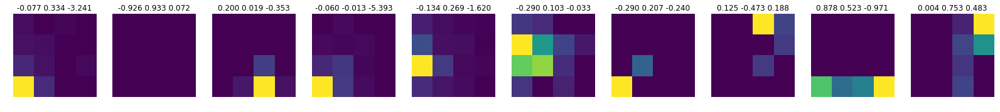

Train loss: -4.77039716661333 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9417, device='cuda:1') tensor(8.5038e-08, device='cuda:1', grad_fn=<SumBackward0>)


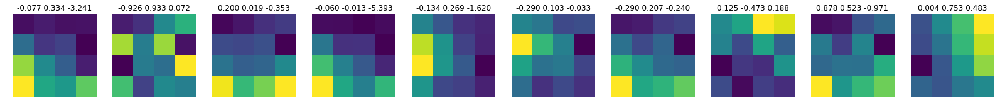

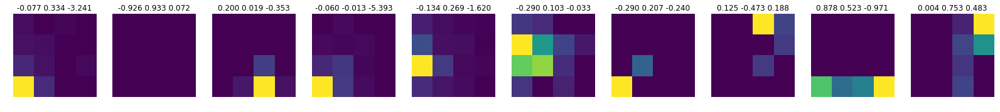

epoch: 225
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9438, device='cuda:1') tensor(8.5038e-08, device='cuda:1', grad_fn=<SumBackward0>)


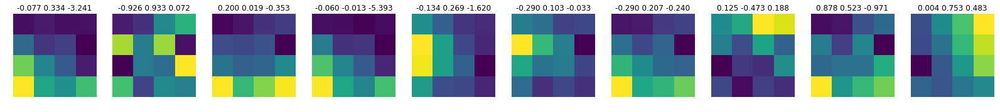

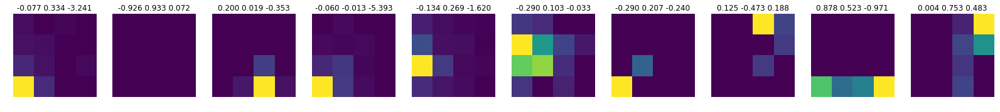

Train loss: -4.897877505502561 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5668, device='cuda:1') tensor(9.8783e-08, device='cuda:1', grad_fn=<SumBackward0>)


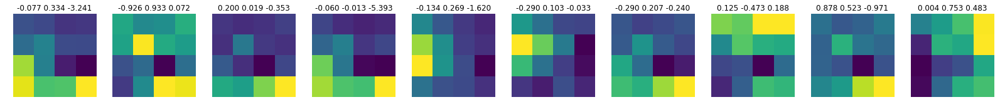

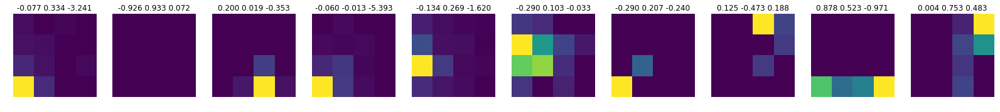

epoch: 226
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5636, device='cuda:1') tensor(9.8783e-08, device='cuda:1', grad_fn=<SumBackward0>)


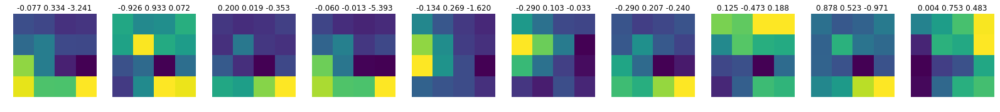

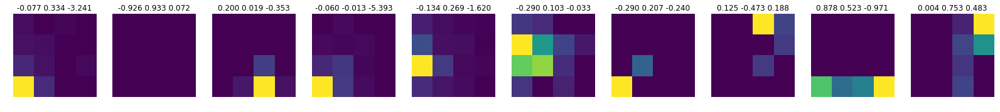

Train loss: -4.774577385118015 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7708, device='cuda:1') tensor(4.0150e-07, device='cuda:1', grad_fn=<SumBackward0>)


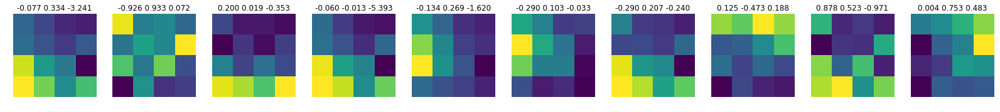

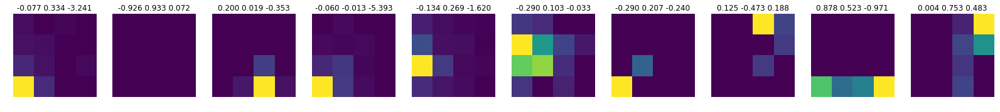

epoch: 227
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7728, device='cuda:1') tensor(4.0150e-07, device='cuda:1', grad_fn=<SumBackward0>)


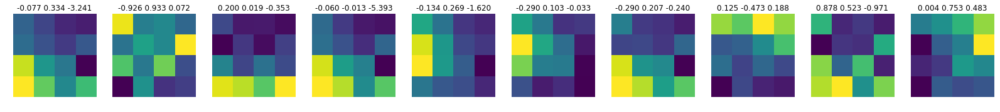

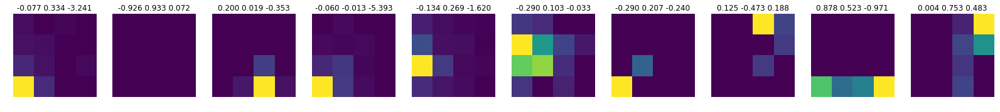

Train loss: -4.445415848845505 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8663, device='cuda:1') tensor(2.2694e-06, device='cuda:1', grad_fn=<SumBackward0>)


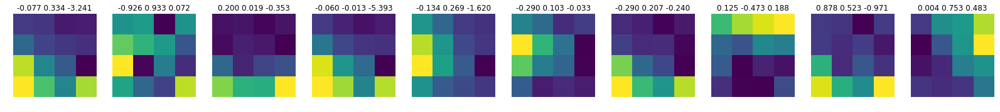

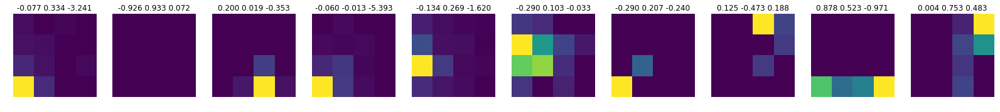

epoch: 228
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8699, device='cuda:1') tensor(2.2694e-06, device='cuda:1', grad_fn=<SumBackward0>)


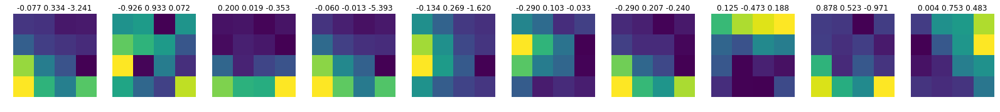

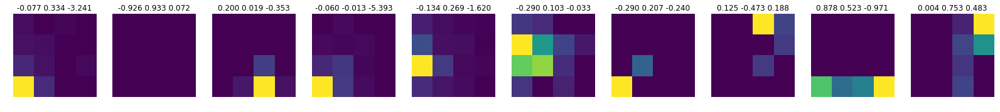

Train loss: -4.821914207777211 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6410, device='cuda:1') tensor(1.9704e-08, device='cuda:1', grad_fn=<SumBackward0>)


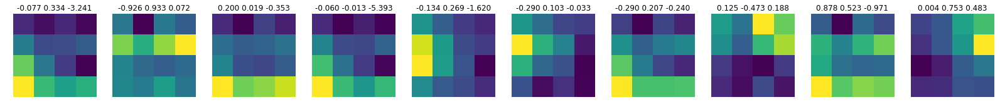

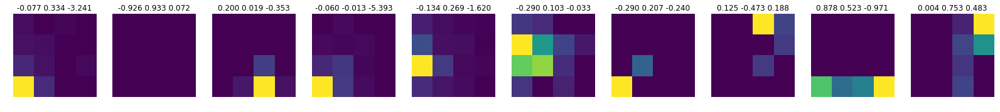

epoch: 229
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6394, device='cuda:1') tensor(1.9704e-08, device='cuda:1', grad_fn=<SumBackward0>)


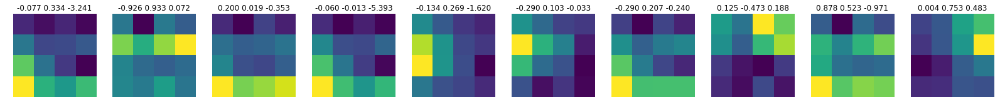

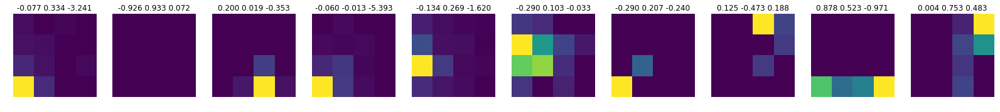

Train loss: -4.853044172251919 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7303, device='cuda:1') tensor(6.1049e-08, device='cuda:1', grad_fn=<SumBackward0>)


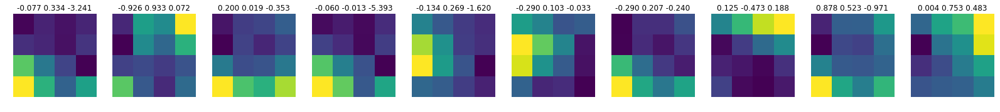

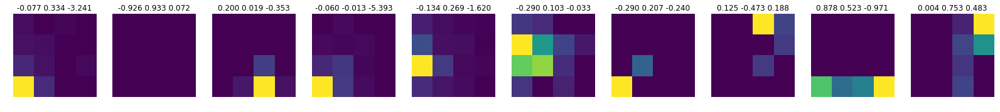

epoch: 230
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7311, device='cuda:1') tensor(6.1049e-08, device='cuda:1', grad_fn=<SumBackward0>)


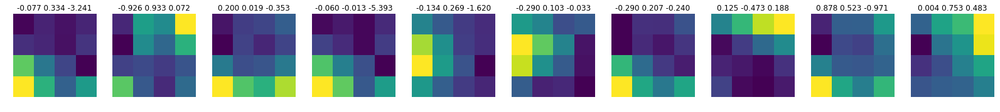

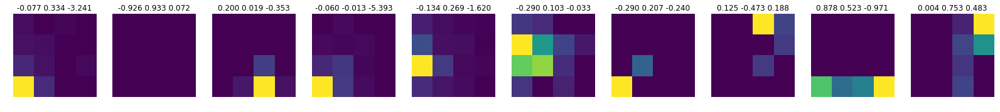

Train loss: -4.553837268484093 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8446, device='cuda:1') tensor(8.0333e-08, device='cuda:1', grad_fn=<SumBackward0>)


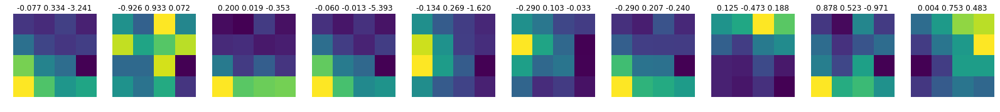

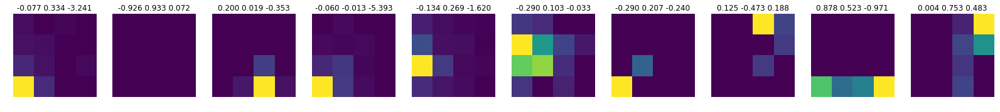

epoch: 231
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8457, device='cuda:1') tensor(8.0333e-08, device='cuda:1', grad_fn=<SumBackward0>)


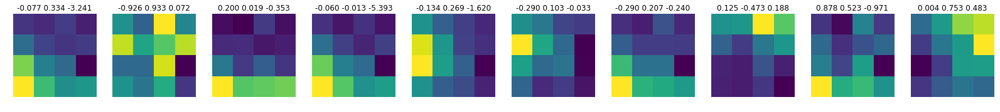

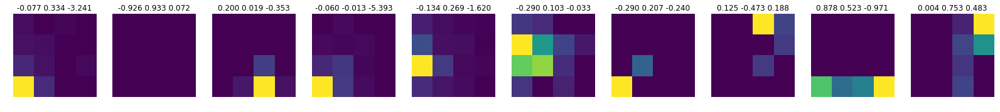

Train loss: -4.8322428505979405 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8036, device='cuda:1') tensor(1.0081e-07, device='cuda:1', grad_fn=<SumBackward0>)


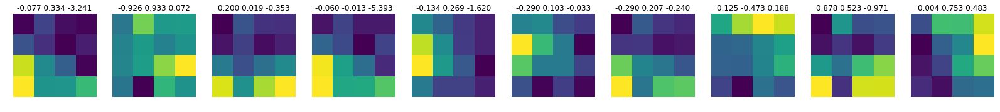

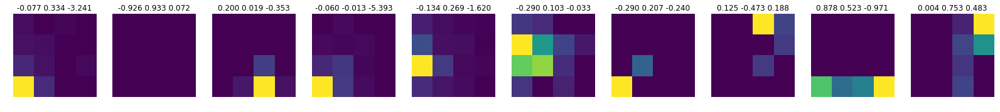

epoch: 232
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8034, device='cuda:1') tensor(1.0081e-07, device='cuda:1', grad_fn=<SumBackward0>)


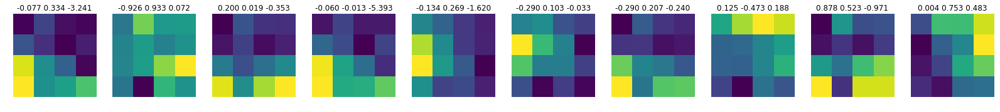

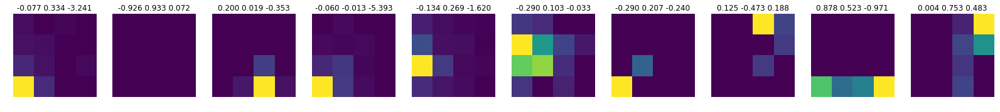

Train loss: -4.757600861742645 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5673, device='cuda:1') tensor(7.2671e-07, device='cuda:1', grad_fn=<SumBackward0>)


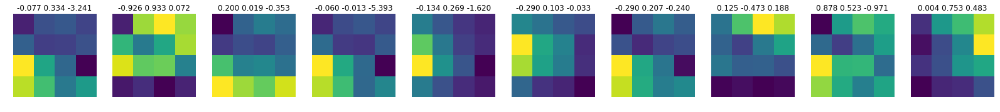

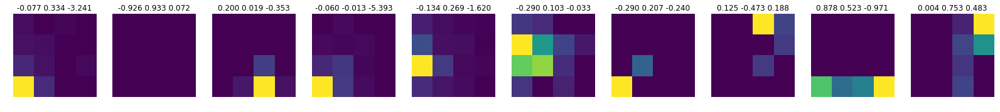

epoch: 233
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5831, device='cuda:1') tensor(7.2671e-07, device='cuda:1', grad_fn=<SumBackward0>)


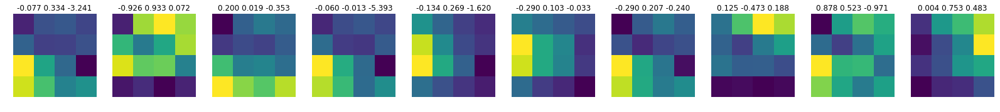

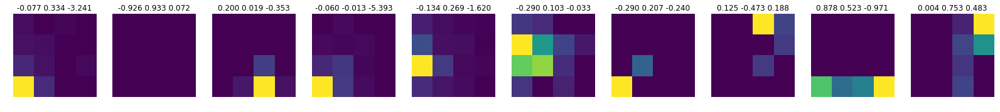

Train loss: -4.610291024148609 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9066, device='cuda:1') tensor(5.0806e-08, device='cuda:1', grad_fn=<SumBackward0>)


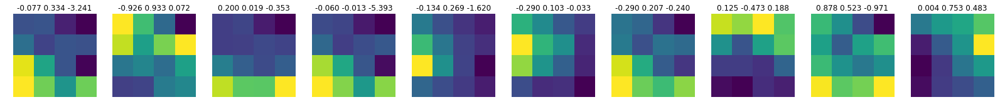

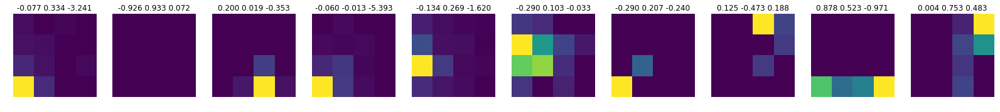

epoch: 234
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9071, device='cuda:1') tensor(5.0806e-08, device='cuda:1', grad_fn=<SumBackward0>)


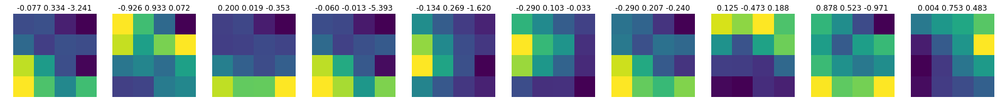

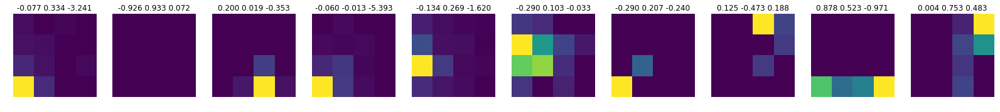

Train loss: -4.844152713118964 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7408, device='cuda:1') tensor(6.8101e-07, device='cuda:1', grad_fn=<SumBackward0>)


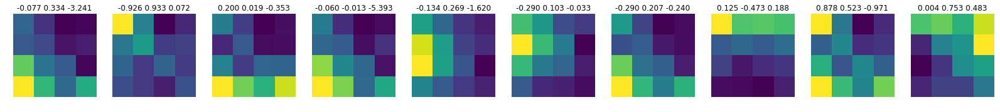

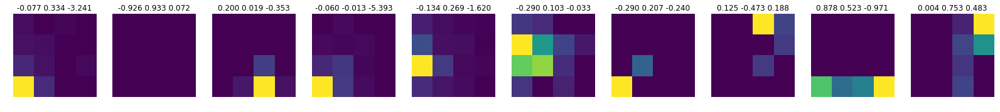

epoch: 235
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7392, device='cuda:1') tensor(6.8101e-07, device='cuda:1', grad_fn=<SumBackward0>)


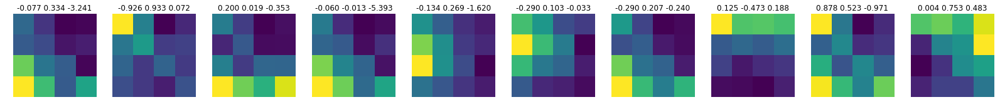

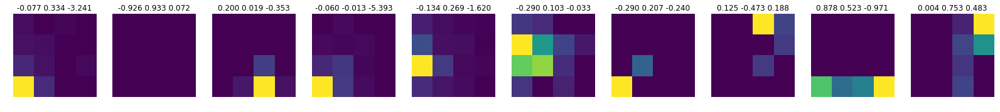

Train loss: -4.756099613441653 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9958, device='cuda:1') tensor(1.6564e-07, device='cuda:1', grad_fn=<SumBackward0>)


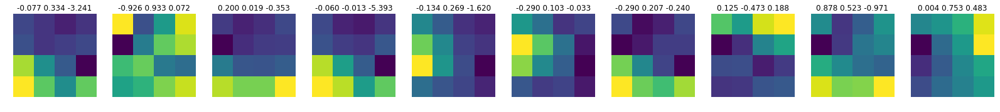

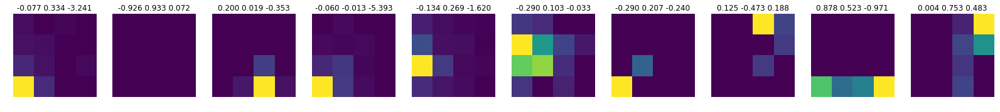

epoch: 236
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9942, device='cuda:1') tensor(1.6564e-07, device='cuda:1', grad_fn=<SumBackward0>)


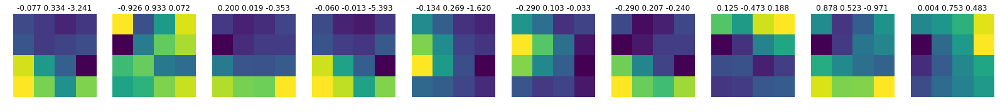

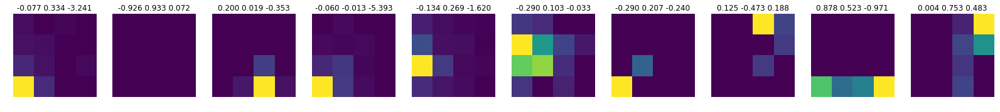

Train loss: -4.944216852981498 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7030, device='cuda:1') tensor(3.7484e-07, device='cuda:1', grad_fn=<SumBackward0>)


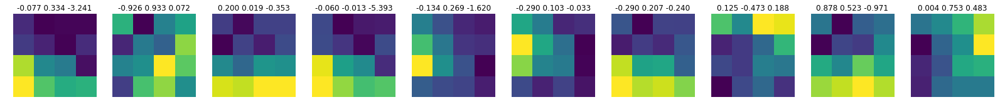

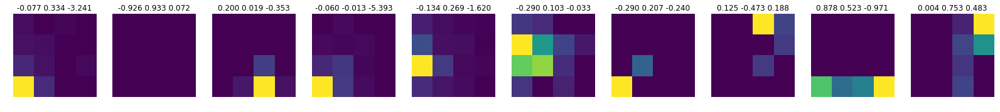

epoch: 237
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7046, device='cuda:1') tensor(3.7484e-07, device='cuda:1', grad_fn=<SumBackward0>)


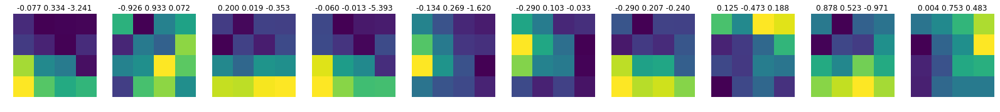

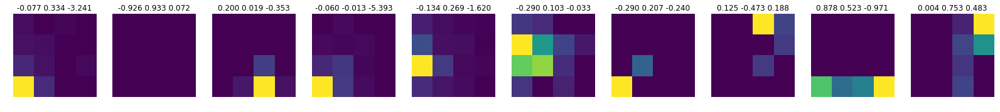

Train loss: -4.725691426976509 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8153, device='cuda:1') tensor(5.3756e-07, device='cuda:1', grad_fn=<SumBackward0>)


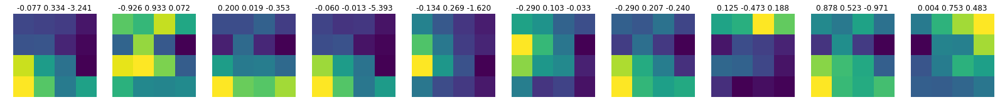

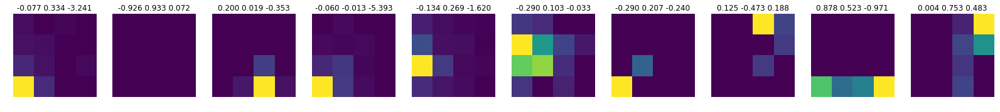

epoch: 238
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8135, device='cuda:1') tensor(5.3756e-07, device='cuda:1', grad_fn=<SumBackward0>)


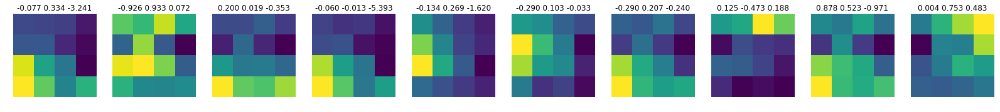

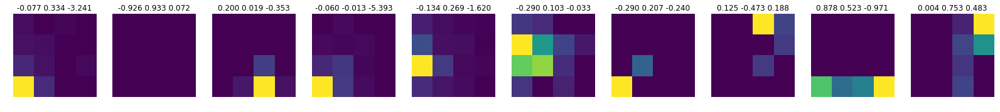

Train loss: -4.836943997083541 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7359, device='cuda:1') tensor(3.2590e-07, device='cuda:1', grad_fn=<SumBackward0>)


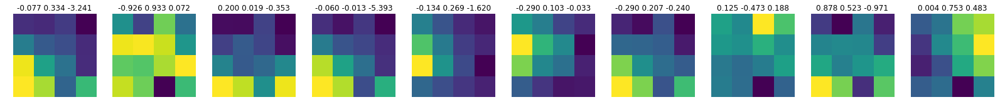

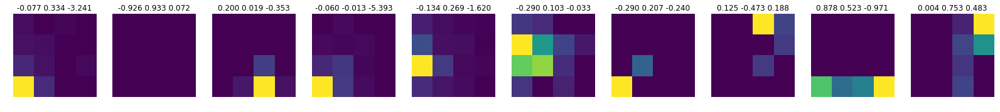

epoch: 239
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7363, device='cuda:1') tensor(3.2590e-07, device='cuda:1', grad_fn=<SumBackward0>)


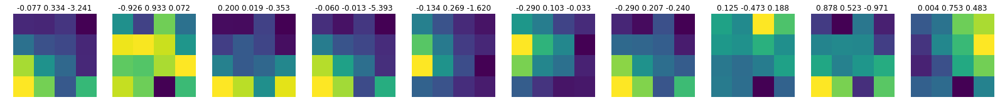

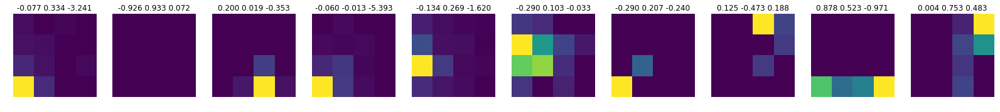

Train loss: -4.806538454915773 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9845, device='cuda:1') tensor(9.1475e-07, device='cuda:1', grad_fn=<SumBackward0>)


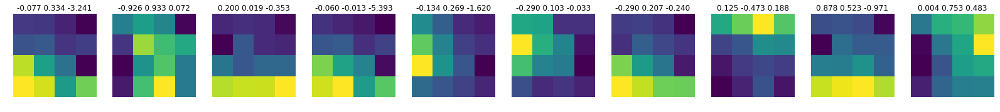

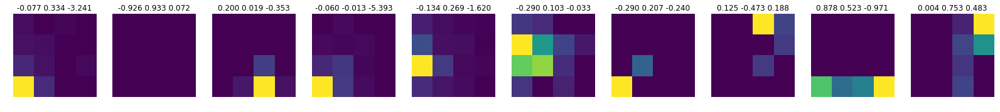

epoch: 240
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9821, device='cuda:1') tensor(9.1475e-07, device='cuda:1', grad_fn=<SumBackward0>)


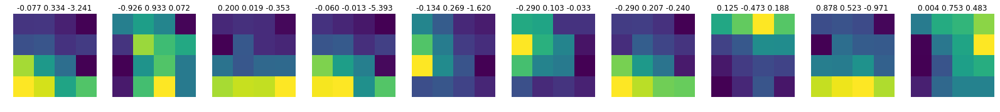

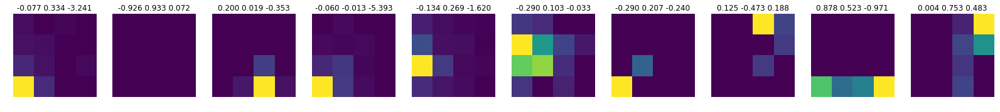

Train loss: -4.9230367736824165 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4889, device='cuda:1') tensor(2.4987e-07, device='cuda:1', grad_fn=<SumBackward0>)


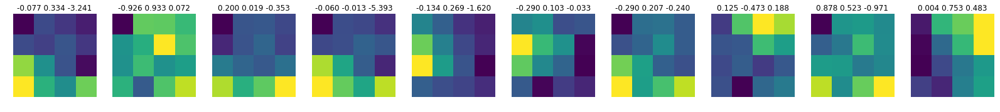

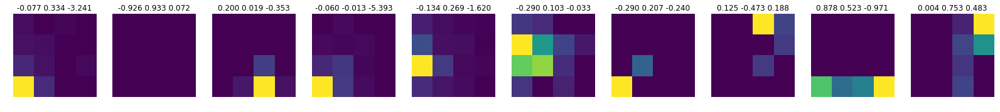

epoch: 241
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.4886, device='cuda:1') tensor(2.4987e-07, device='cuda:1', grad_fn=<SumBackward0>)


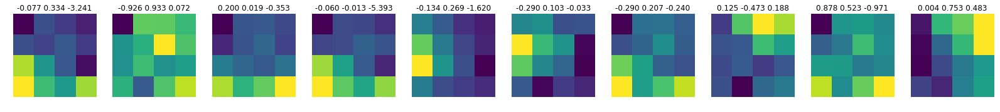

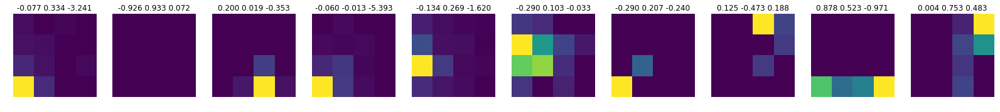

Train loss: -4.494528785663788 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8698, device='cuda:1') tensor(5.3129e-07, device='cuda:1', grad_fn=<SumBackward0>)


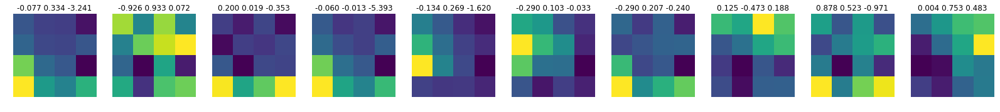

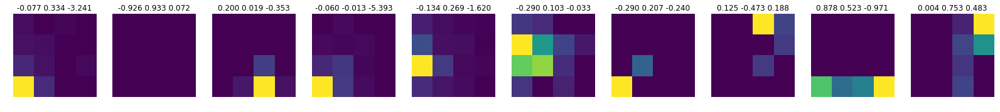

epoch: 242
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8717, device='cuda:1') tensor(5.3129e-07, device='cuda:1', grad_fn=<SumBackward0>)


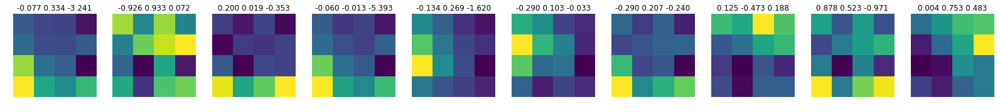

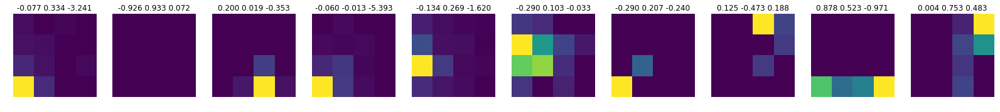

Train loss: -4.937597401201281 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7637, device='cuda:1') tensor(2.6952e-08, device='cuda:1', grad_fn=<SumBackward0>)


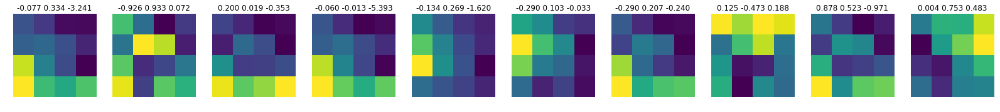

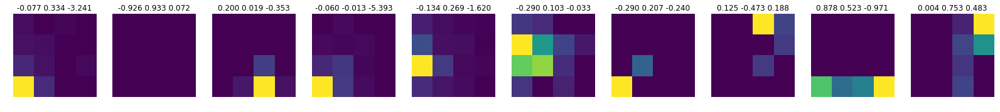

epoch: 243
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7645, device='cuda:1') tensor(2.6952e-08, device='cuda:1', grad_fn=<SumBackward0>)


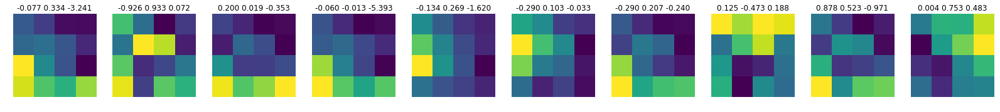

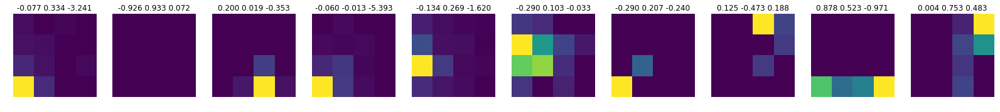

Train loss: -4.93514603460492 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8668, device='cuda:1') tensor(4.9196e-07, device='cuda:1', grad_fn=<SumBackward0>)


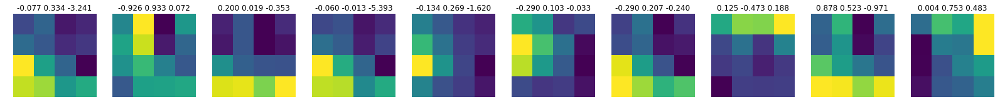

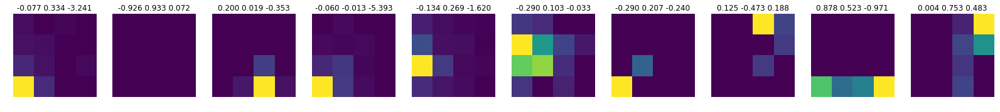

epoch: 244
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8670, device='cuda:1') tensor(4.9196e-07, device='cuda:1', grad_fn=<SumBackward0>)


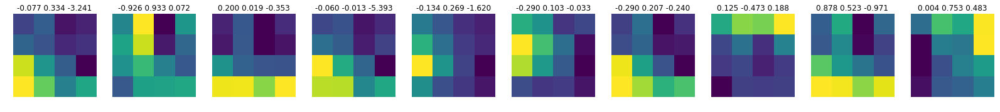

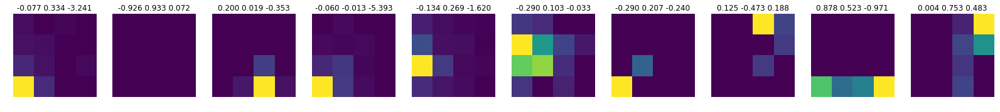

Train loss: -4.802011029938347 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9790, device='cuda:1') tensor(2.5810e-07, device='cuda:1', grad_fn=<SumBackward0>)


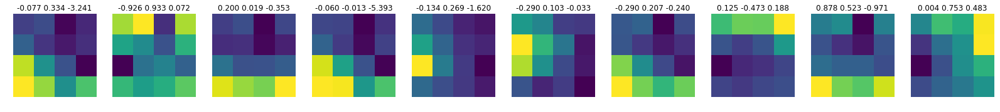

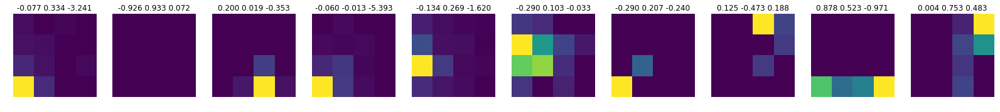

epoch: 245
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9786, device='cuda:1') tensor(2.5810e-07, device='cuda:1', grad_fn=<SumBackward0>)


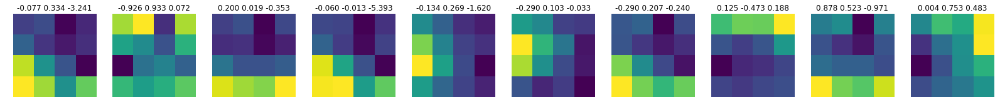

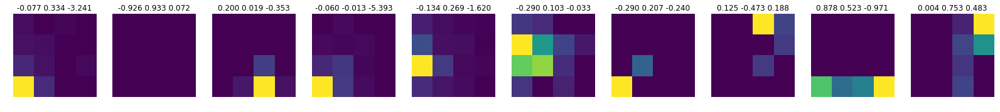

Train loss: -4.892990474073934 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6925, device='cuda:1') tensor(2.5582e-08, device='cuda:1', grad_fn=<SumBackward0>)


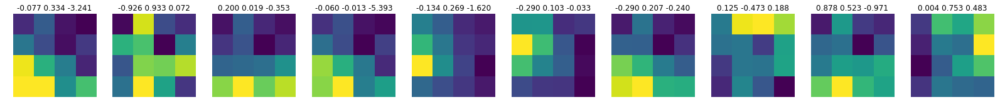

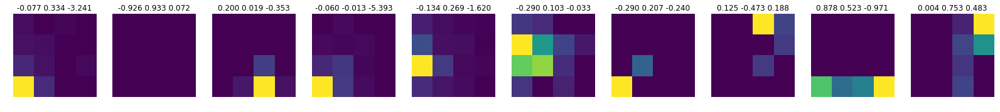

epoch: 246
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6902, device='cuda:1') tensor(2.5582e-08, device='cuda:1', grad_fn=<SumBackward0>)


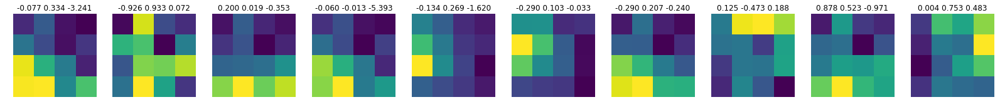

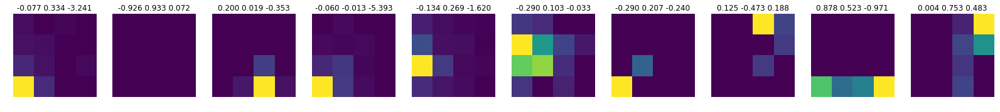

Train loss: -4.665128554123498 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-5.0211, device='cuda:1') tensor(1.6219e-07, device='cuda:1', grad_fn=<SumBackward0>)


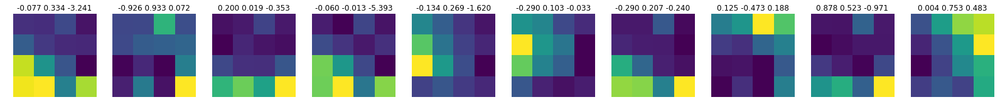

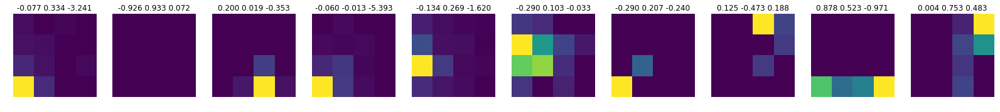

epoch: 247
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-5.0202, device='cuda:1') tensor(1.6219e-07, device='cuda:1', grad_fn=<SumBackward0>)


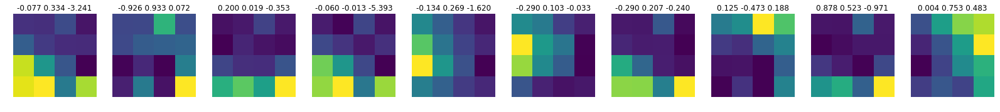

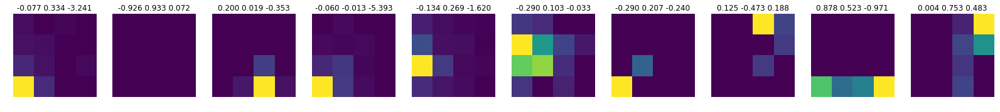

Train loss: -5.027327861337686 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5646, device='cuda:1') tensor(3.0855e-07, device='cuda:1', grad_fn=<SumBackward0>)


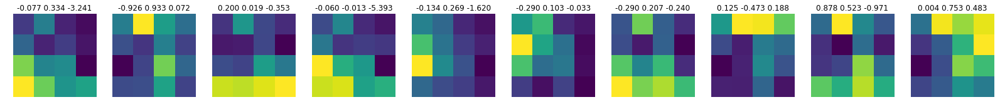

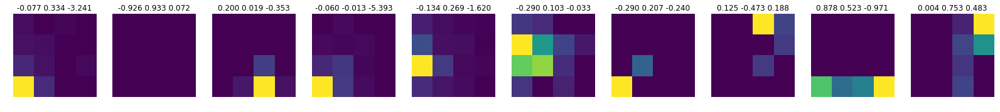

epoch: 248
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5632, device='cuda:1') tensor(3.0855e-07, device='cuda:1', grad_fn=<SumBackward0>)


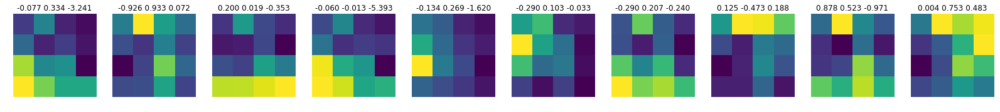

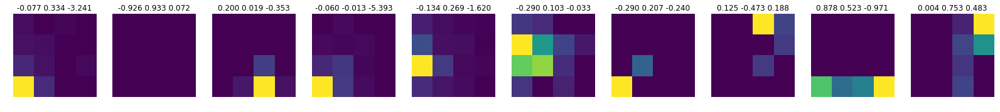

Train loss: -4.552133943184295 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5662, device='cuda:1') tensor(4.7130e-08, device='cuda:1', grad_fn=<SumBackward0>)


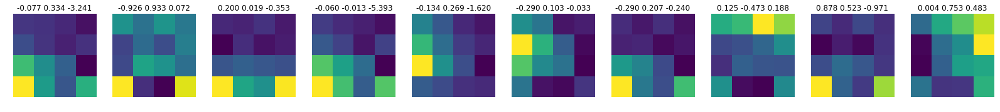

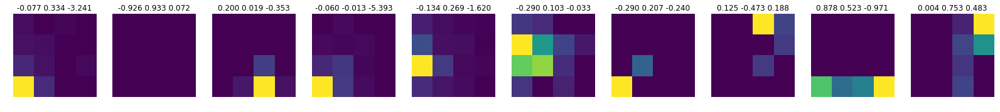

epoch: 249
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5656, device='cuda:1') tensor(4.7130e-08, device='cuda:1', grad_fn=<SumBackward0>)


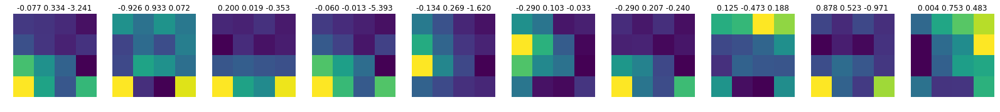

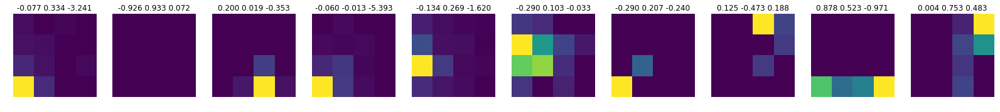

Train loss: -4.517565636868402 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5776, device='cuda:1') tensor(1.2854e-07, device='cuda:1', grad_fn=<SumBackward0>)


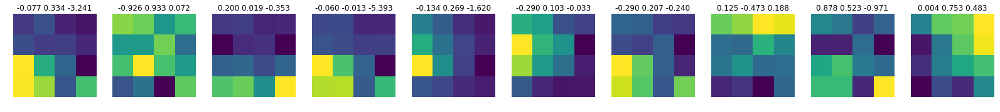

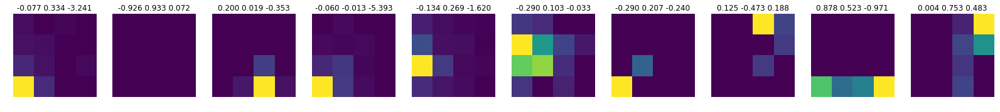

epoch: 250
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5747, device='cuda:1') tensor(1.2854e-07, device='cuda:1', grad_fn=<SumBackward0>)


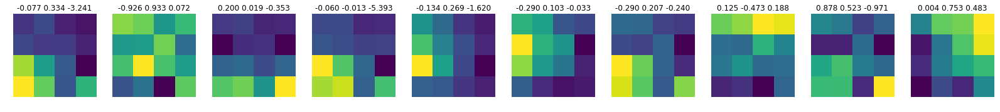

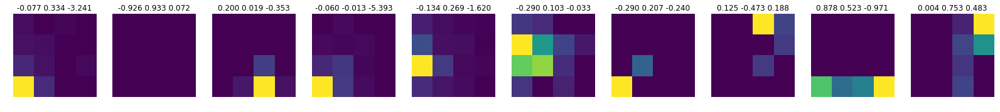

Train loss: -4.57479887516279 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5831, device='cuda:1') tensor(4.5681e-08, device='cuda:1', grad_fn=<SumBackward0>)


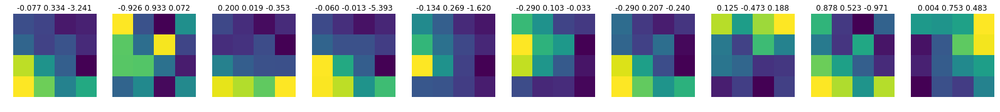

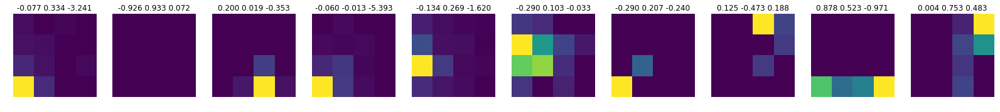

epoch: 251
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5807, device='cuda:1') tensor(4.5681e-08, device='cuda:1', grad_fn=<SumBackward0>)


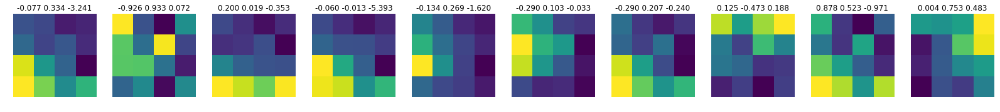

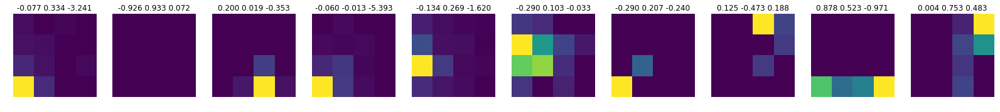

Train loss: -4.60802678939365 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5758, device='cuda:1') tensor(1.2085e-07, device='cuda:1', grad_fn=<SumBackward0>)


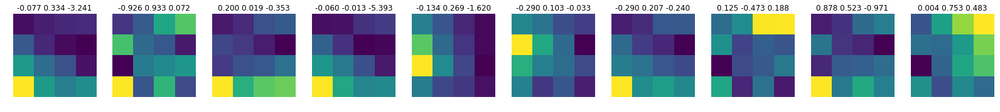

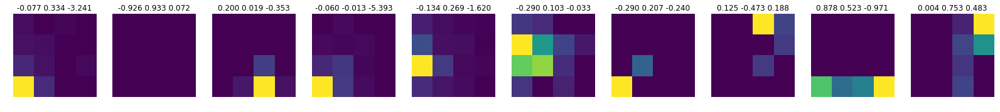

epoch: 252
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5776, device='cuda:1') tensor(1.2085e-07, device='cuda:1', grad_fn=<SumBackward0>)


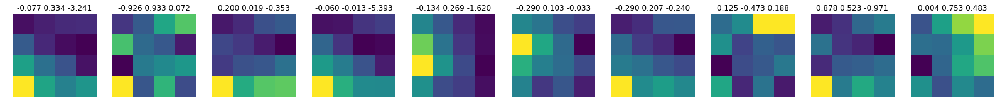

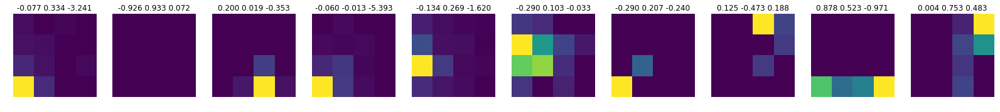

Train loss: -4.685276856759615 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8453, device='cuda:1') tensor(2.4888e-07, device='cuda:1', grad_fn=<SumBackward0>)


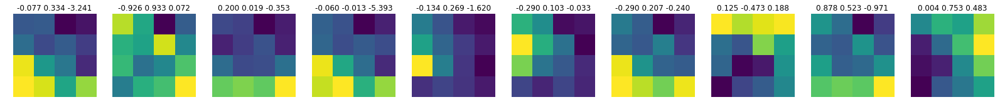

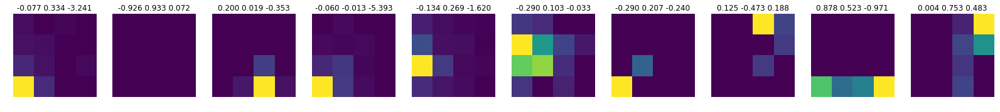

epoch: 253
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8448, device='cuda:1') tensor(2.4888e-07, device='cuda:1', grad_fn=<SumBackward0>)


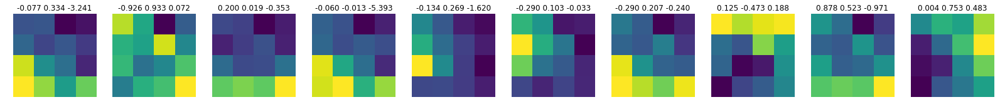

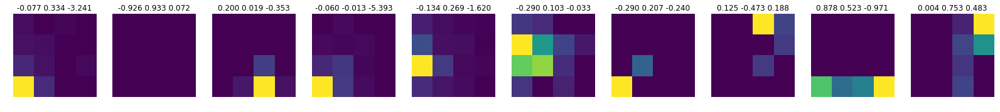

Train loss: -4.854160046701693 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6052, device='cuda:1') tensor(3.7133e-07, device='cuda:1', grad_fn=<SumBackward0>)


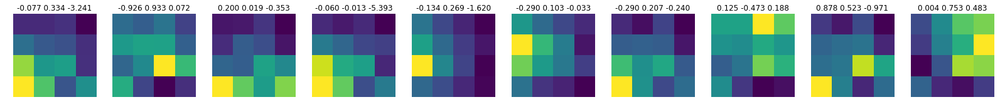

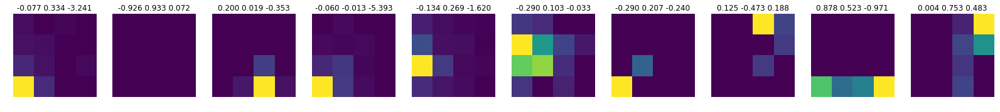

epoch: 254
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6055, device='cuda:1') tensor(3.7133e-07, device='cuda:1', grad_fn=<SumBackward0>)


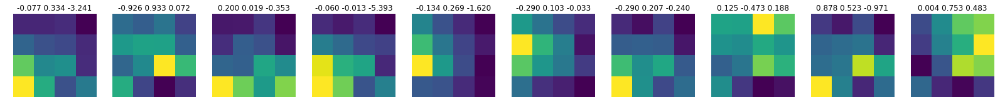

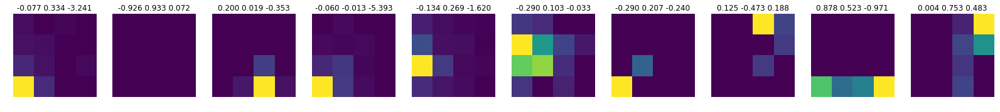

Train loss: -4.803893646034845 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5201, device='cuda:1') tensor(6.7998e-07, device='cuda:1', grad_fn=<SumBackward0>)


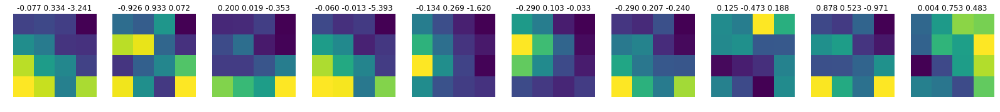

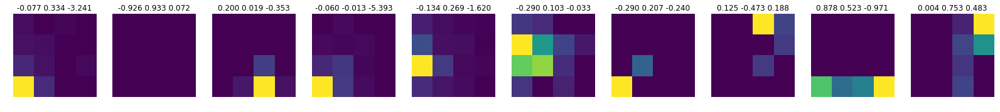

epoch: 255
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5196, device='cuda:1') tensor(6.7998e-07, device='cuda:1', grad_fn=<SumBackward0>)


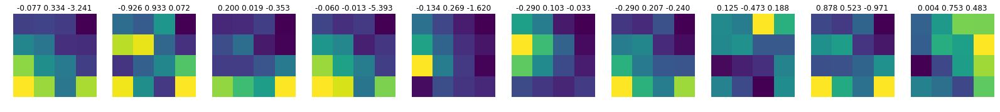

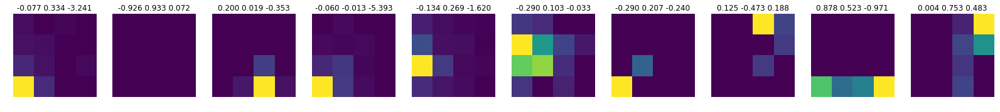

Train loss: -4.585694691951226 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5666, device='cuda:1') tensor(3.0368e-08, device='cuda:1', grad_fn=<SumBackward0>)


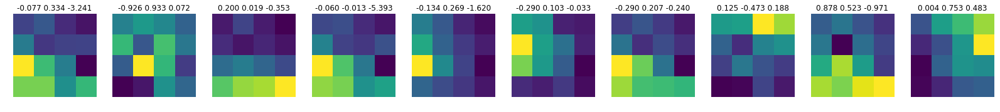

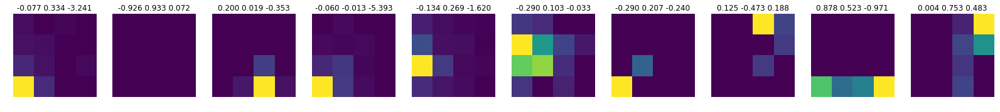

epoch: 256
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5665, device='cuda:1') tensor(3.0368e-08, device='cuda:1', grad_fn=<SumBackward0>)


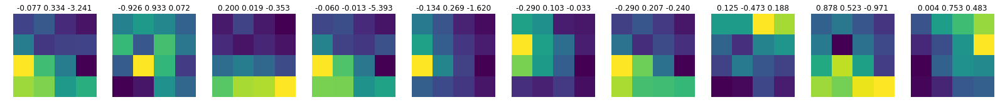

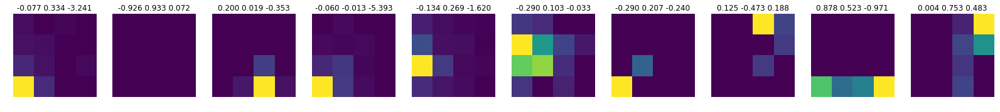

Train loss: -4.49851903553826 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6010, device='cuda:1') tensor(3.9756e-07, device='cuda:1', grad_fn=<SumBackward0>)


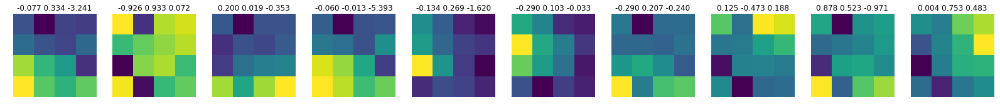

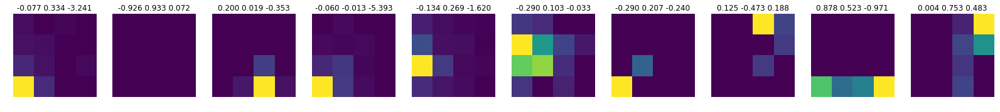

epoch: 257
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6006, device='cuda:1') tensor(3.9756e-07, device='cuda:1', grad_fn=<SumBackward0>)


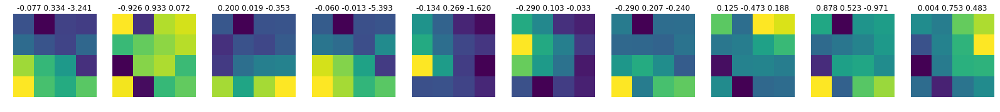

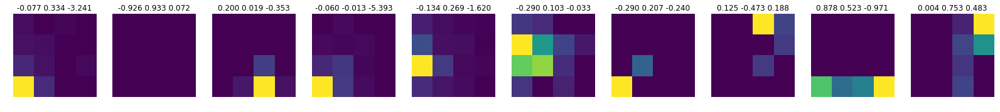

Train loss: -4.820618236761039 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7756, device='cuda:1') tensor(5.8820e-07, device='cuda:1', grad_fn=<SumBackward0>)


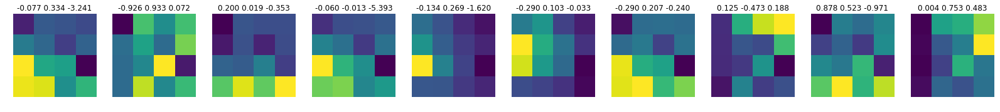

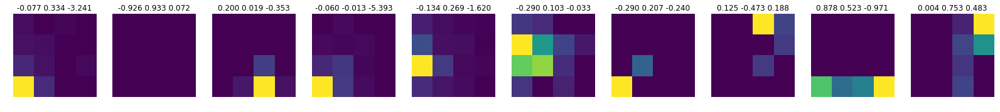

epoch: 258
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7759, device='cuda:1') tensor(5.8820e-07, device='cuda:1', grad_fn=<SumBackward0>)


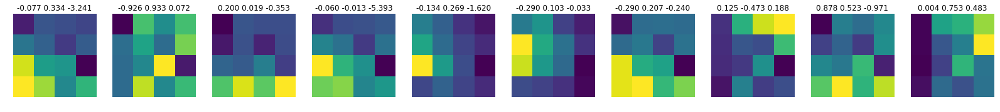

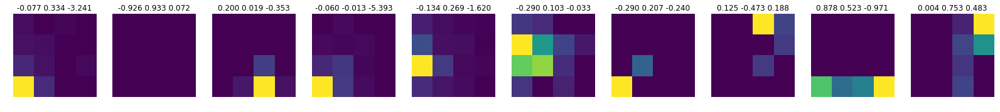

Train loss: -4.778227965033125 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9101, device='cuda:1') tensor(1.9872e-07, device='cuda:1', grad_fn=<SumBackward0>)


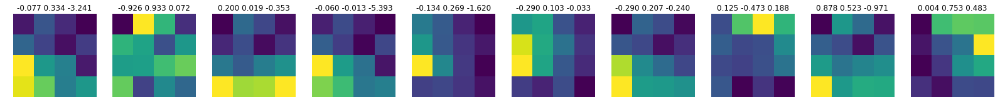

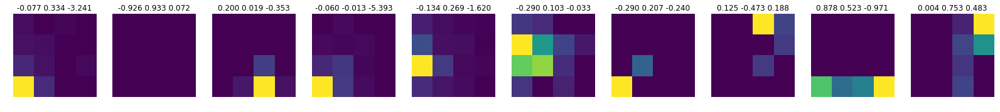

epoch: 259
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9106, device='cuda:1') tensor(1.9872e-07, device='cuda:1', grad_fn=<SumBackward0>)


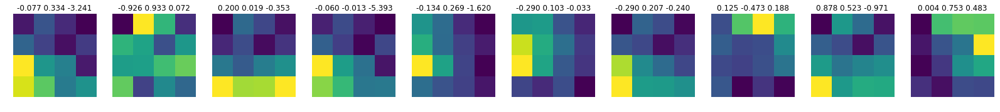

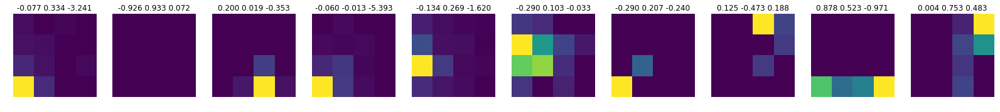

Train loss: -4.8119224951142385 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8400, device='cuda:1') tensor(7.2698e-08, device='cuda:1', grad_fn=<SumBackward0>)


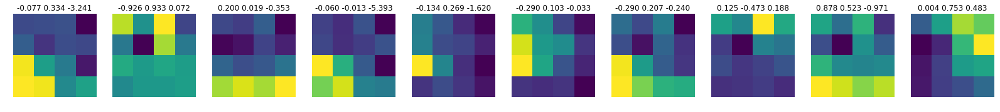

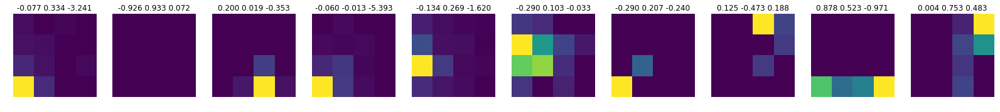

epoch: 260
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8434, device='cuda:1') tensor(7.2698e-08, device='cuda:1', grad_fn=<SumBackward0>)


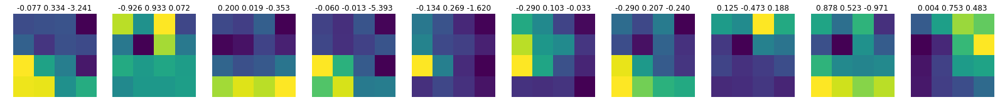

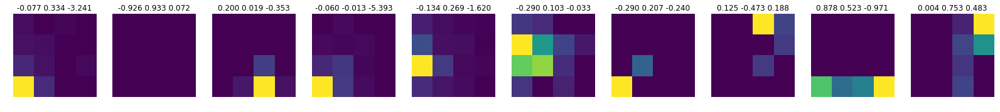

Train loss: -4.801255025232562 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6025, device='cuda:1') tensor(9.4124e-09, device='cuda:1', grad_fn=<SumBackward0>)


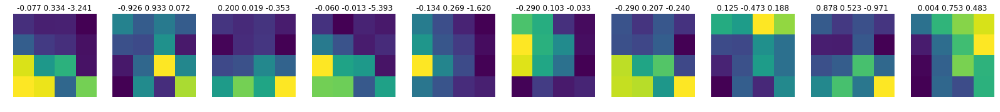

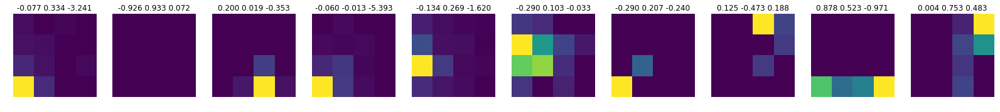

epoch: 261
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6032, device='cuda:1') tensor(9.4124e-09, device='cuda:1', grad_fn=<SumBackward0>)


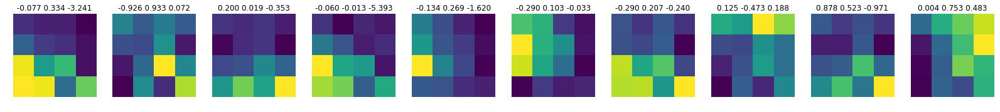

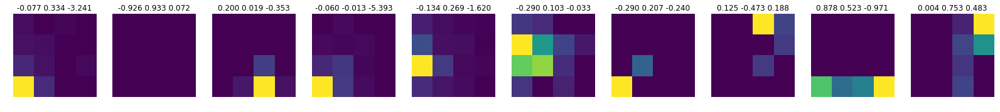

Train loss: -4.573675527648824 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8492, device='cuda:1') tensor(3.4096e-08, device='cuda:1', grad_fn=<SumBackward0>)


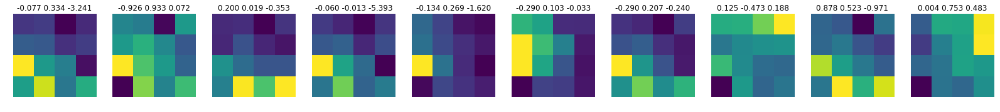

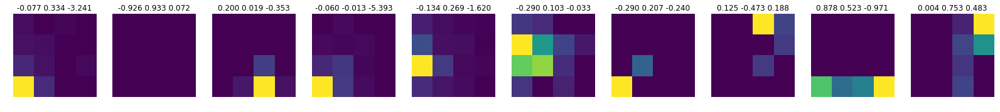

epoch: 262
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8487, device='cuda:1') tensor(3.4096e-08, device='cuda:1', grad_fn=<SumBackward0>)


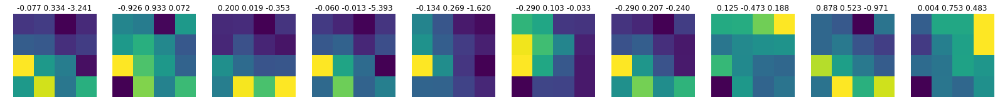

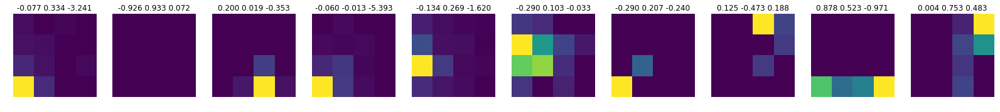

Train loss: -4.894612603303253 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5806, device='cuda:1') tensor(1.3344e-07, device='cuda:1', grad_fn=<SumBackward0>)


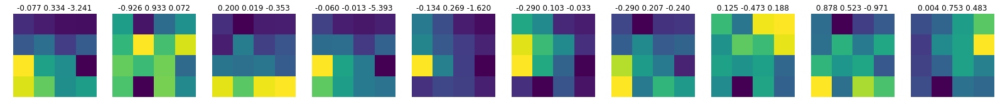

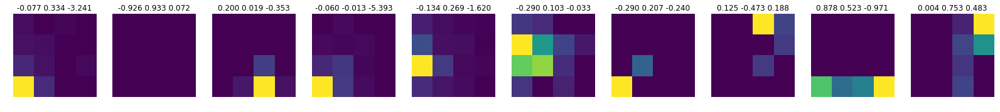

epoch: 263
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5812, device='cuda:1') tensor(1.3344e-07, device='cuda:1', grad_fn=<SumBackward0>)


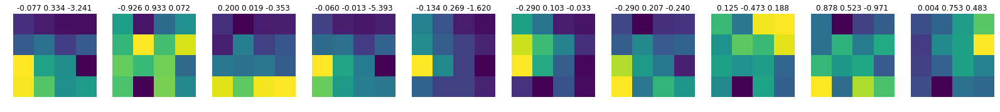

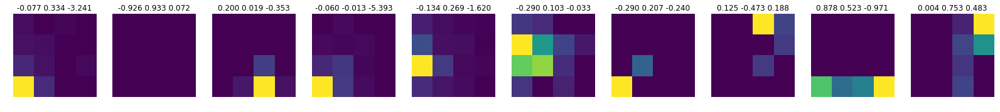

Train loss: -4.785474899222127 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8485, device='cuda:1') tensor(7.0497e-07, device='cuda:1', grad_fn=<SumBackward0>)


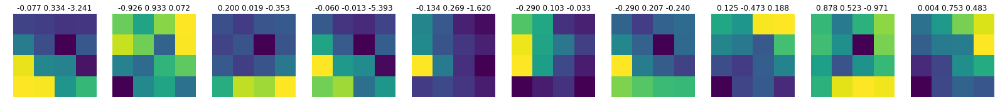

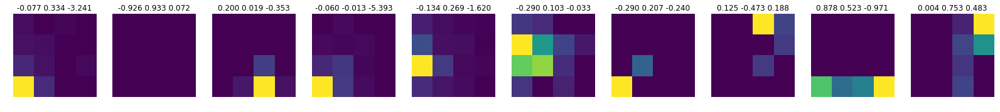

epoch: 264
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8464, device='cuda:1') tensor(7.0497e-07, device='cuda:1', grad_fn=<SumBackward0>)


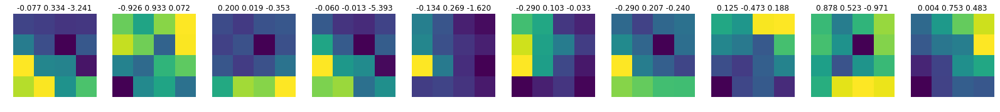

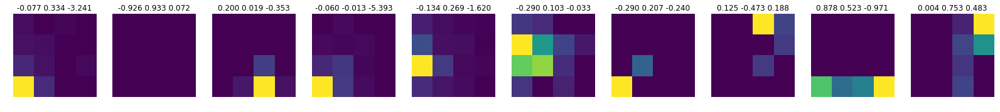

Train loss: -4.918255419023915 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7859, device='cuda:1') tensor(6.2461e-08, device='cuda:1', grad_fn=<SumBackward0>)


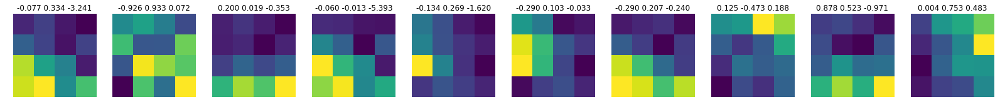

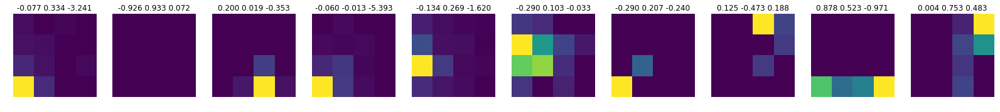

epoch: 265
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7845, device='cuda:1') tensor(6.2461e-08, device='cuda:1', grad_fn=<SumBackward0>)


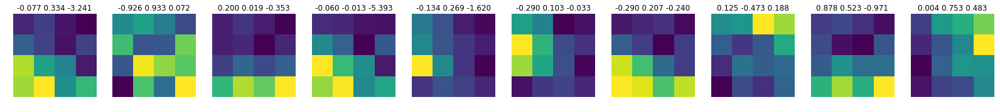

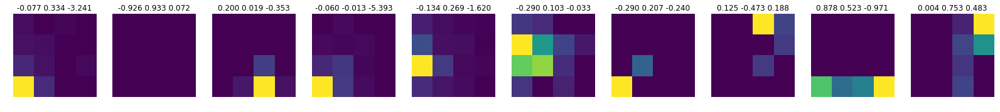

Train loss: -4.70260489931341 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9379, device='cuda:1') tensor(9.1180e-09, device='cuda:1', grad_fn=<SumBackward0>)


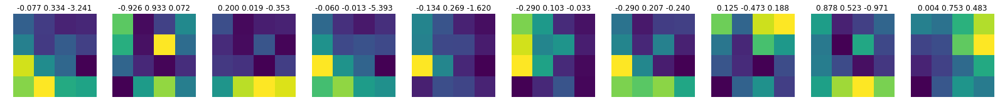

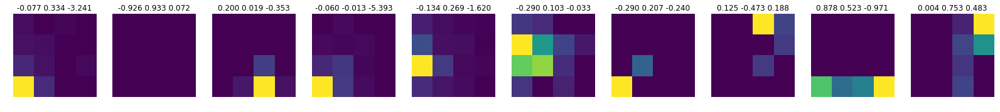

epoch: 266
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9440, device='cuda:1') tensor(9.1180e-09, device='cuda:1', grad_fn=<SumBackward0>)


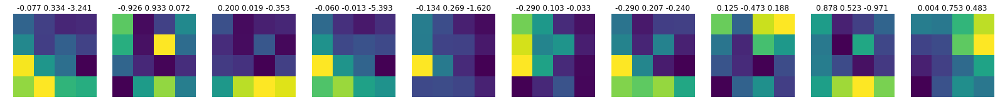

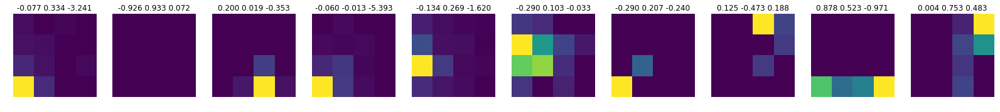

Train loss: -4.891153270372178 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7946, device='cuda:1') tensor(2.0665e-08, device='cuda:1', grad_fn=<SumBackward0>)


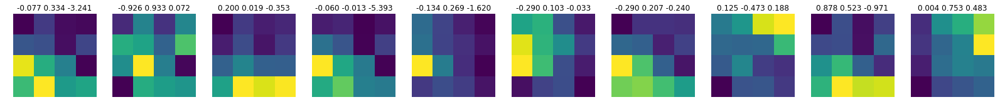

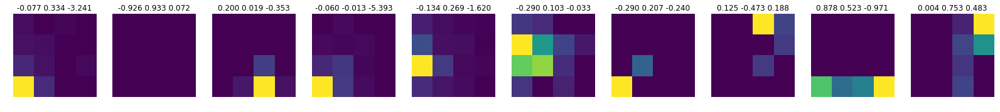

epoch: 267
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7955, device='cuda:1') tensor(2.0665e-08, device='cuda:1', grad_fn=<SumBackward0>)


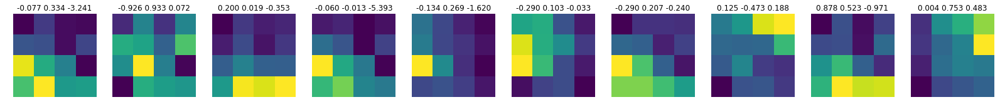

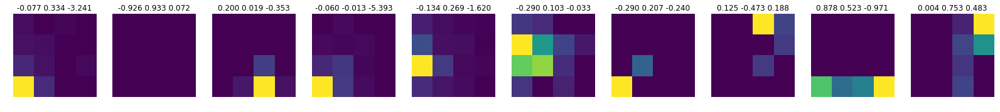

Train loss: -4.672593518882012 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7024, device='cuda:1') tensor(8.5834e-08, device='cuda:1', grad_fn=<SumBackward0>)


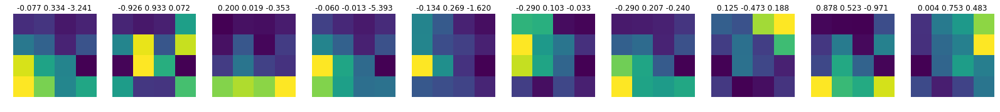

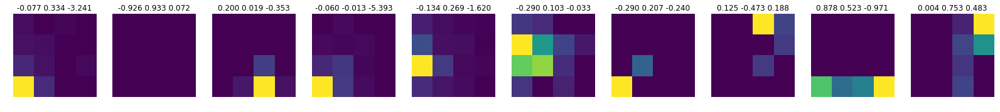

epoch: 268
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7031, device='cuda:1') tensor(8.5834e-08, device='cuda:1', grad_fn=<SumBackward0>)


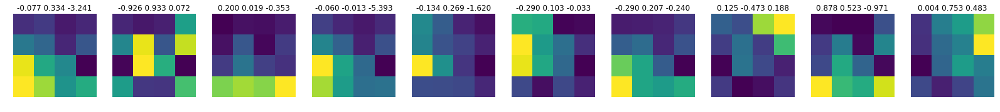

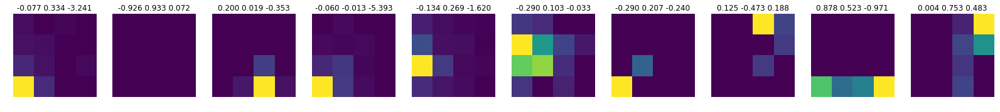

Train loss: -4.716205179013969 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7502, device='cuda:1') tensor(2.5687e-07, device='cuda:1', grad_fn=<SumBackward0>)


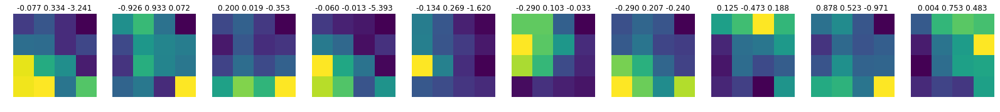

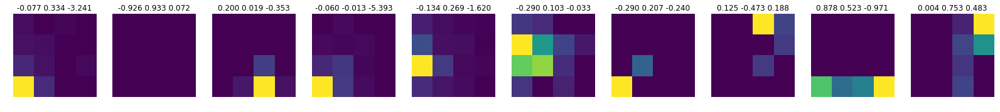

epoch: 269
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7507, device='cuda:1') tensor(2.5687e-07, device='cuda:1', grad_fn=<SumBackward0>)


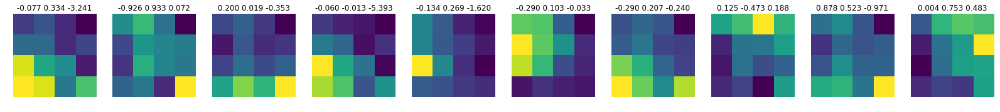

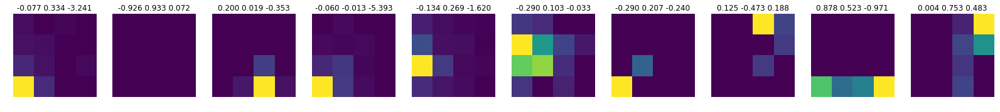

Train loss: -4.748022601426457 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8196, device='cuda:1') tensor(1.7145e-07, device='cuda:1', grad_fn=<SumBackward0>)


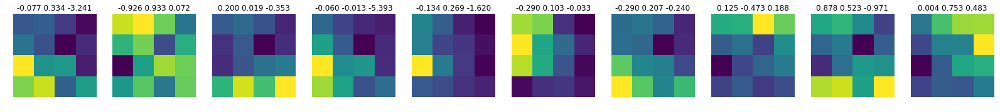

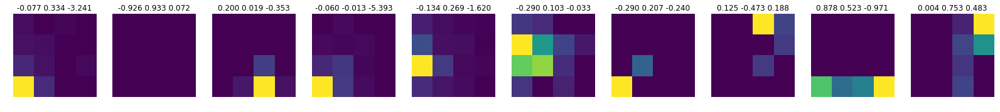

epoch: 270
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8188, device='cuda:1') tensor(1.7145e-07, device='cuda:1', grad_fn=<SumBackward0>)


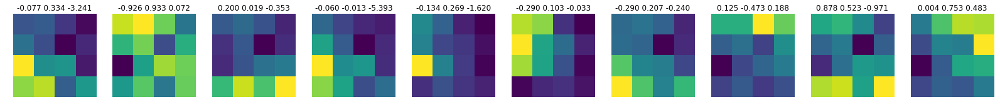

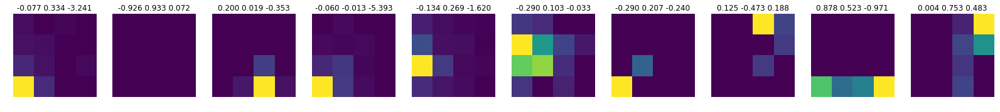

Train loss: -4.722506571046715 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9477, device='cuda:1') tensor(2.6877e-07, device='cuda:1', grad_fn=<SumBackward0>)


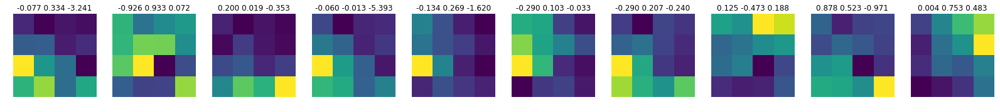

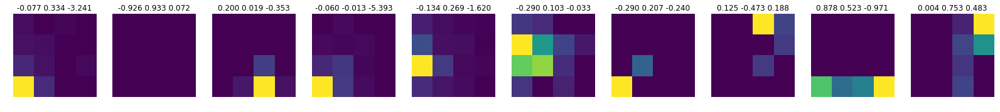

epoch: 271
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9467, device='cuda:1') tensor(2.6877e-07, device='cuda:1', grad_fn=<SumBackward0>)


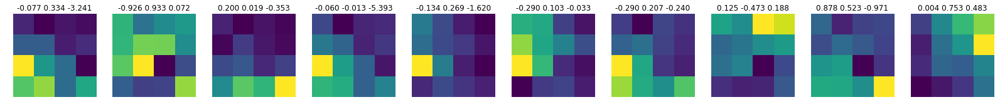

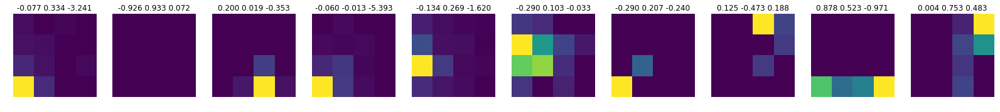

Train loss: -4.816265063452037 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7050, device='cuda:1') tensor(2.5759e-08, device='cuda:1', grad_fn=<SumBackward0>)


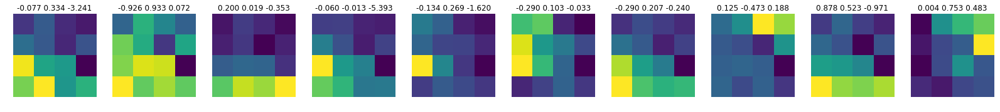

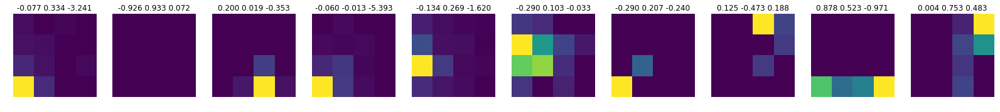

epoch: 272
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7032, device='cuda:1') tensor(2.5759e-08, device='cuda:1', grad_fn=<SumBackward0>)


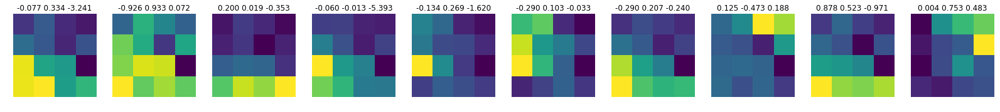

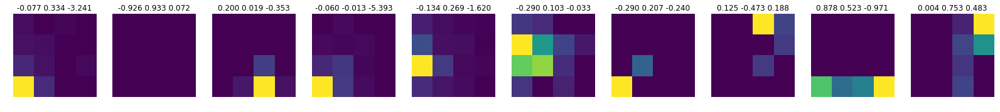

Train loss: -4.719190987989365 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5821, device='cuda:1') tensor(5.9070e-08, device='cuda:1', grad_fn=<SumBackward0>)


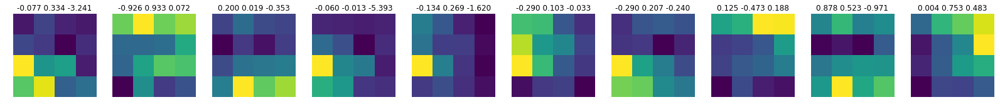

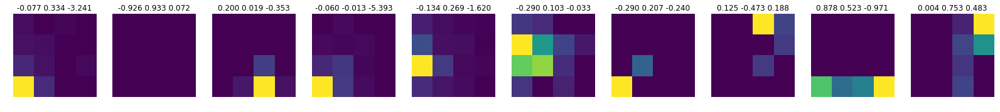

epoch: 273
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.5806, device='cuda:1') tensor(5.9070e-08, device='cuda:1', grad_fn=<SumBackward0>)


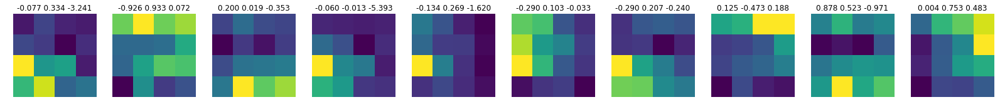

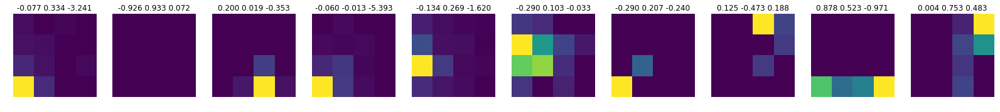

Train loss: -4.47703297772704 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8335, device='cuda:1') tensor(2.0770e-07, device='cuda:1', grad_fn=<SumBackward0>)


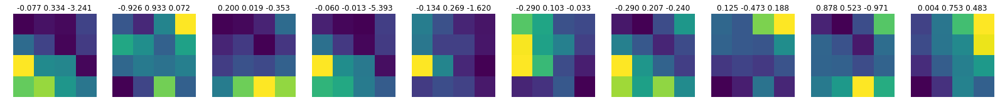

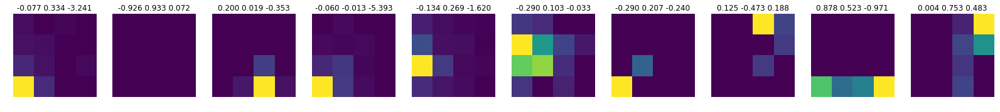

epoch: 274
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8328, device='cuda:1') tensor(2.0770e-07, device='cuda:1', grad_fn=<SumBackward0>)


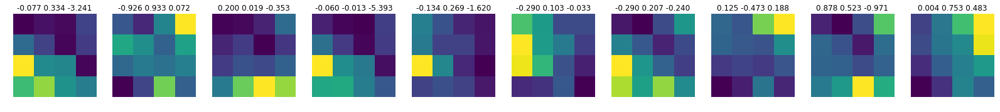

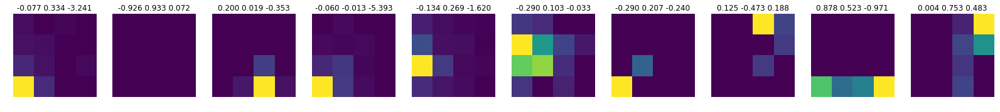

Train loss: -4.854776839250177 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7765, device='cuda:1') tensor(1.1275e-07, device='cuda:1', grad_fn=<SumBackward0>)


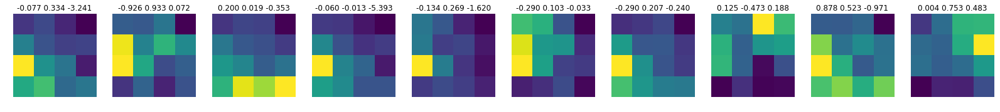

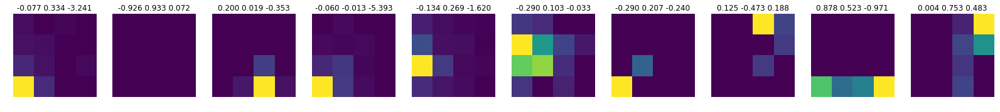

epoch: 275
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7759, device='cuda:1') tensor(1.1275e-07, device='cuda:1', grad_fn=<SumBackward0>)


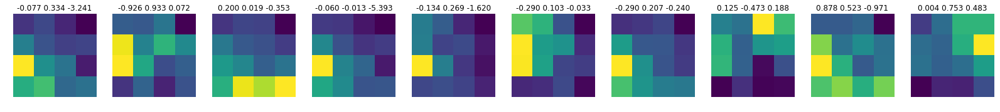

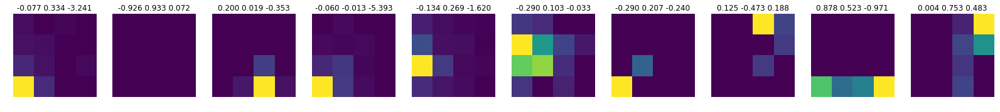

Train loss: -4.62913415932615 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8808, device='cuda:1') tensor(1.8910e-07, device='cuda:1', grad_fn=<SumBackward0>)


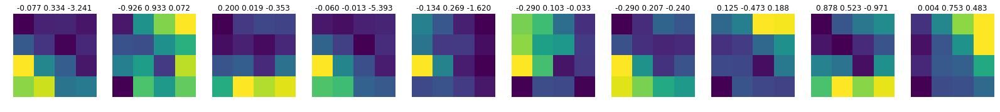

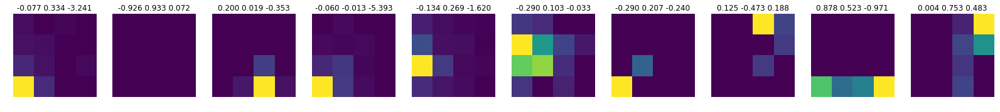

epoch: 276
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8813, device='cuda:1') tensor(1.8910e-07, device='cuda:1', grad_fn=<SumBackward0>)


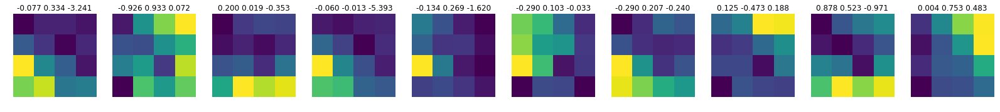

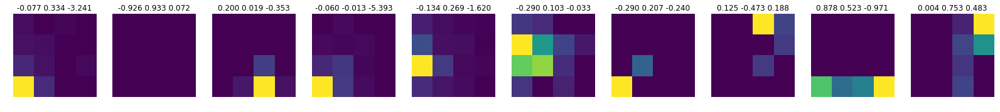

Train loss: -4.771348199901207 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8088, device='cuda:1') tensor(2.1306e-07, device='cuda:1', grad_fn=<SumBackward0>)


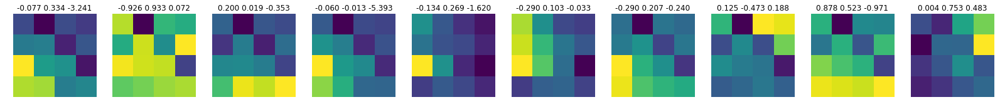

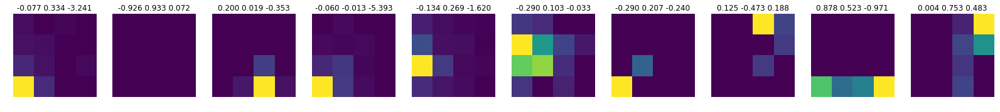

epoch: 277
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8091, device='cuda:1') tensor(2.1306e-07, device='cuda:1', grad_fn=<SumBackward0>)


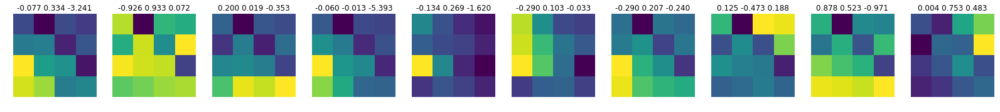

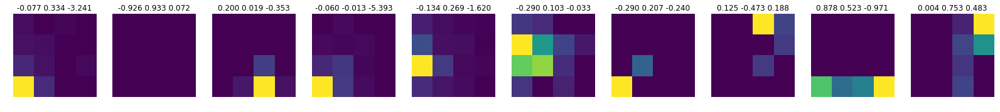

Train loss: -4.740266490496082 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7178, device='cuda:1') tensor(1.3756e-07, device='cuda:1', grad_fn=<SumBackward0>)


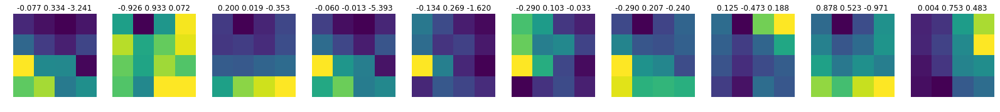

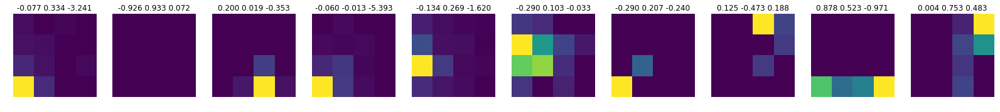

epoch: 278
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7155, device='cuda:1') tensor(1.3756e-07, device='cuda:1', grad_fn=<SumBackward0>)


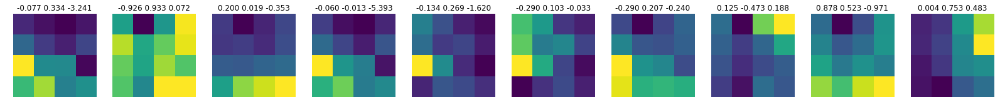

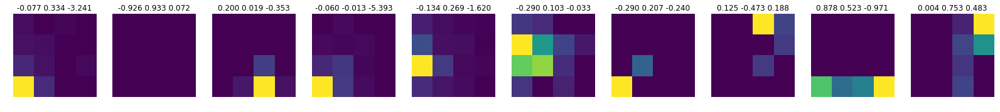

Train loss: -4.681269259763509 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7673, device='cuda:1') tensor(8.9162e-07, device='cuda:1', grad_fn=<SumBackward0>)


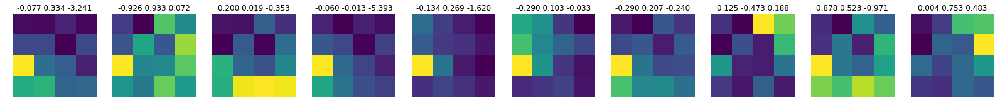

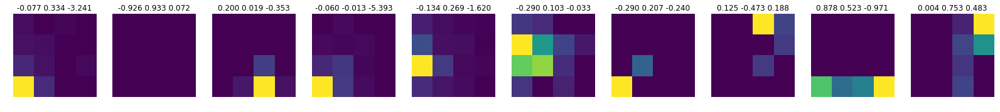

epoch: 279
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7669, device='cuda:1') tensor(8.9162e-07, device='cuda:1', grad_fn=<SumBackward0>)


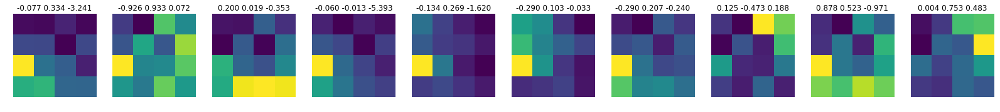

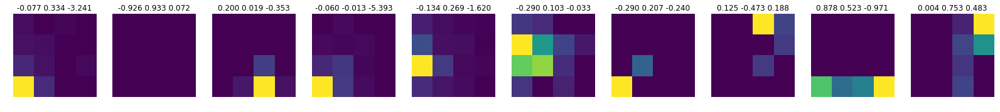

Train loss: -4.793157577358572 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6648, device='cuda:1') tensor(3.1639e-07, device='cuda:1', grad_fn=<SumBackward0>)


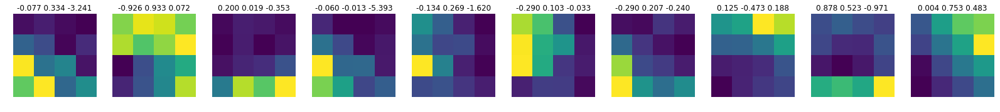

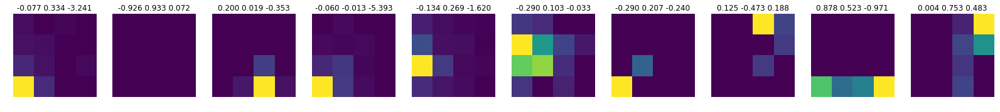

epoch: 280
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6645, device='cuda:1') tensor(3.1639e-07, device='cuda:1', grad_fn=<SumBackward0>)


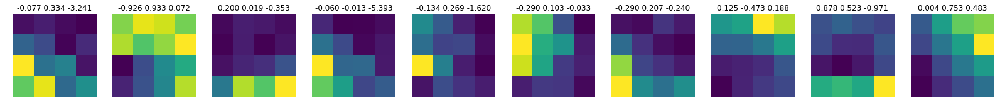

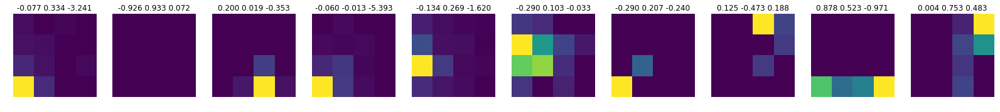

Train loss: -4.585482738509526 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7440, device='cuda:1') tensor(6.9457e-07, device='cuda:1', grad_fn=<SumBackward0>)


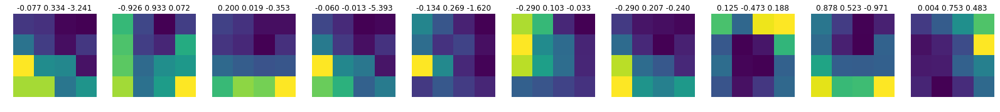

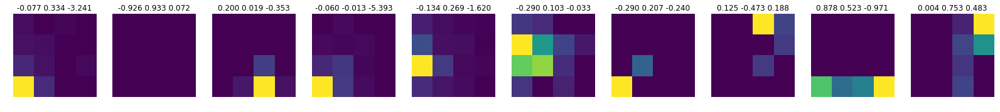

epoch: 281
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7445, device='cuda:1') tensor(6.9457e-07, device='cuda:1', grad_fn=<SumBackward0>)


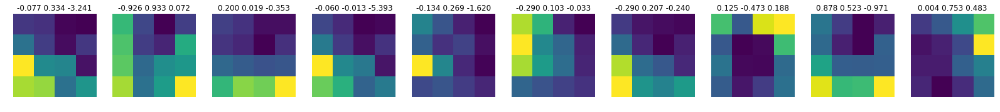

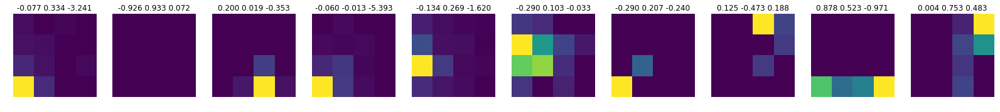

Train loss: -4.669923322082482 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7620, device='cuda:1') tensor(1.1496e-06, device='cuda:1', grad_fn=<SumBackward0>)


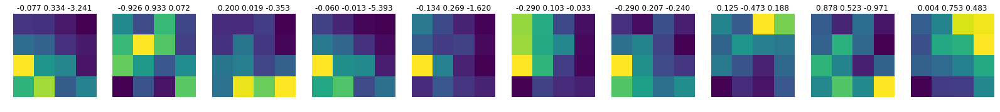

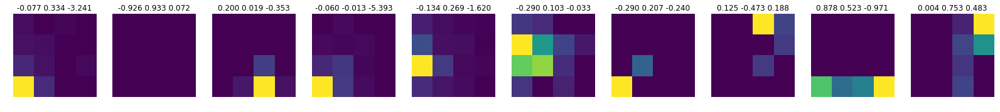

epoch: 282
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7621, device='cuda:1') tensor(1.1496e-06, device='cuda:1', grad_fn=<SumBackward0>)


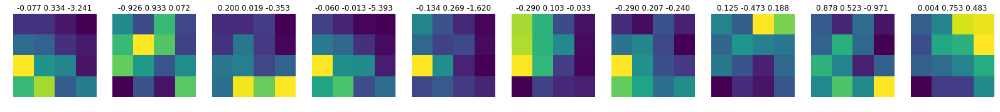

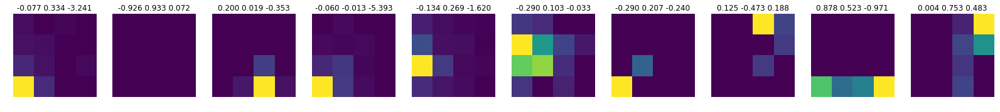

Train loss: -4.680099539156323 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9188, device='cuda:1') tensor(2.3995e-07, device='cuda:1', grad_fn=<SumBackward0>)


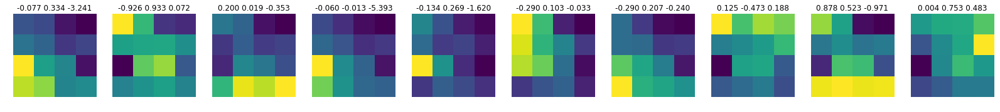

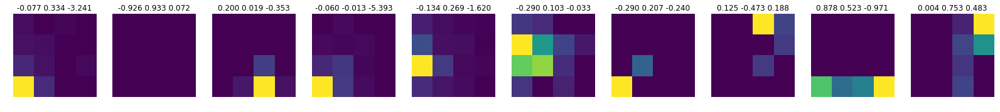

epoch: 283
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9152, device='cuda:1') tensor(2.3995e-07, device='cuda:1', grad_fn=<SumBackward0>)


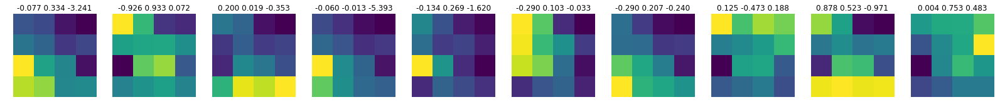

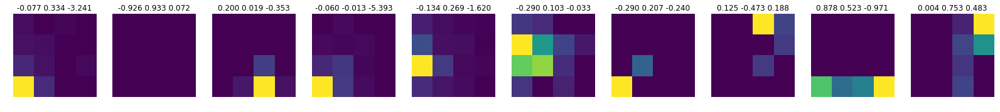

Train loss: -4.867044575941615 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8222, device='cuda:1') tensor(1.2543e-07, device='cuda:1', grad_fn=<SumBackward0>)


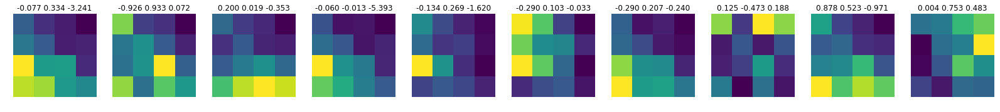

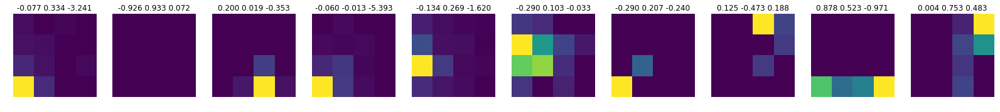

epoch: 284
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8220, device='cuda:1') tensor(1.2543e-07, device='cuda:1', grad_fn=<SumBackward0>)


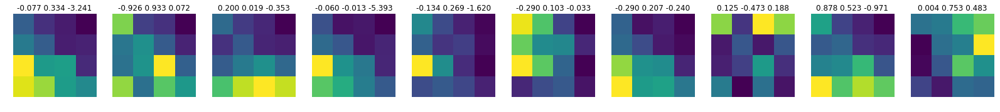

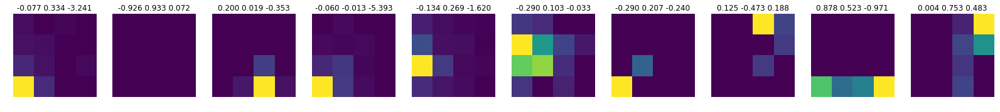

Train loss: -4.87795247050443 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8574, device='cuda:1') tensor(4.3321e-07, device='cuda:1', grad_fn=<SumBackward0>)


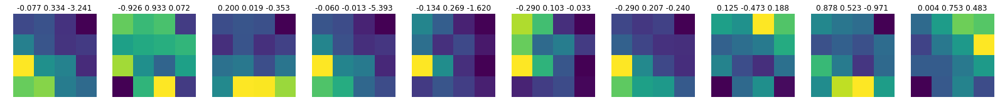

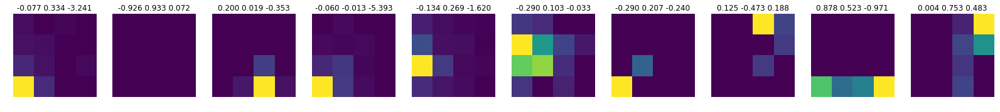

epoch: 285
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8583, device='cuda:1') tensor(4.3321e-07, device='cuda:1', grad_fn=<SumBackward0>)


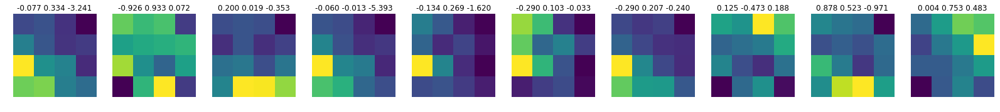

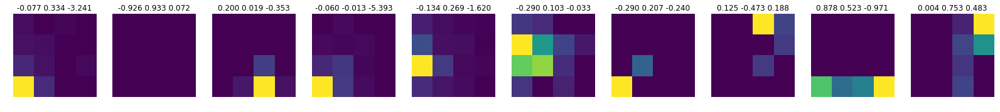

Train loss: -4.589313458632625 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8679, device='cuda:1') tensor(2.2265e-08, device='cuda:1', grad_fn=<SumBackward0>)


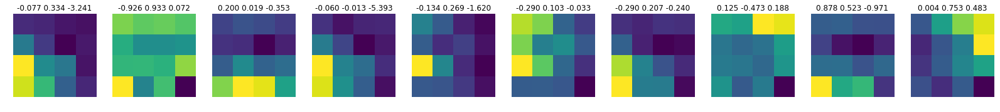

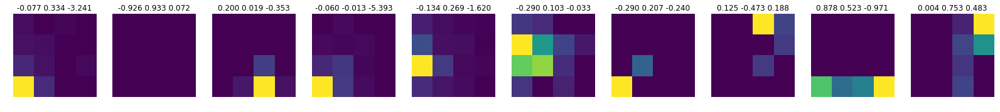

epoch: 286
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8676, device='cuda:1') tensor(2.2265e-08, device='cuda:1', grad_fn=<SumBackward0>)


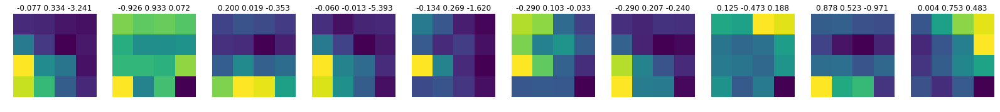

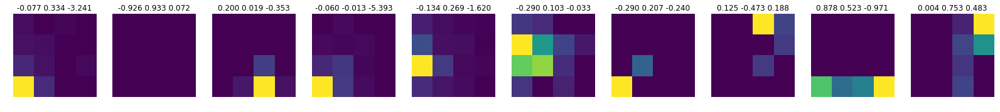

Train loss: -4.824160041475683 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8590, device='cuda:1') tensor(9.7887e-08, device='cuda:1', grad_fn=<SumBackward0>)


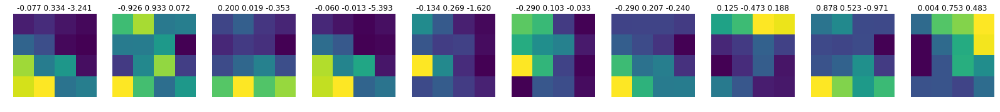

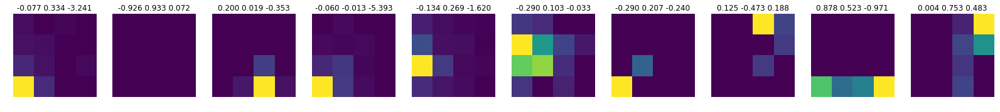

epoch: 287
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8569, device='cuda:1') tensor(9.7887e-08, device='cuda:1', grad_fn=<SumBackward0>)


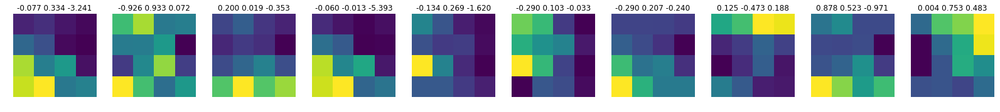

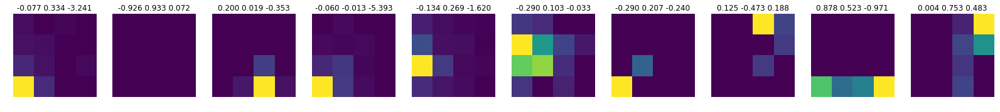

Train loss: -4.836600803392864 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8997, device='cuda:1') tensor(8.1155e-08, device='cuda:1', grad_fn=<SumBackward0>)


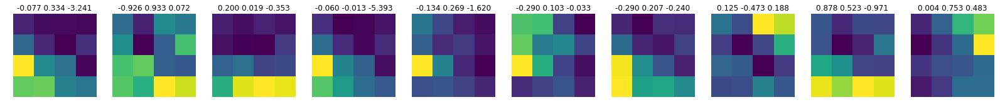

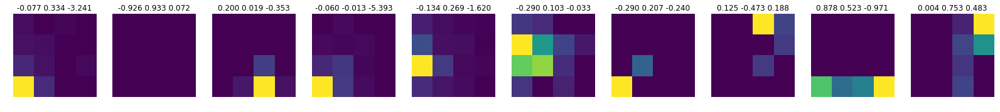

epoch: 288
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9002, device='cuda:1') tensor(8.1155e-08, device='cuda:1', grad_fn=<SumBackward0>)


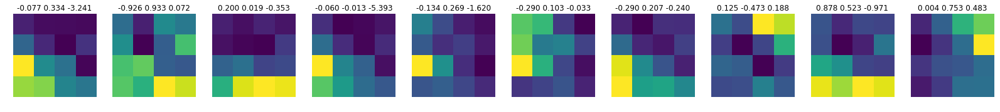

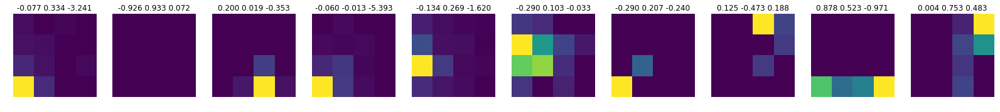

Train loss: -4.926930619989114 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6853, device='cuda:1') tensor(5.1895e-08, device='cuda:1', grad_fn=<SumBackward0>)


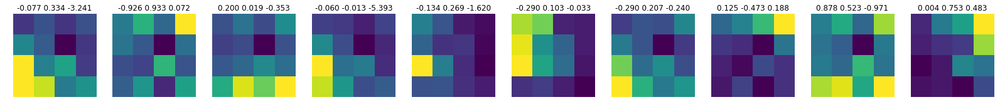

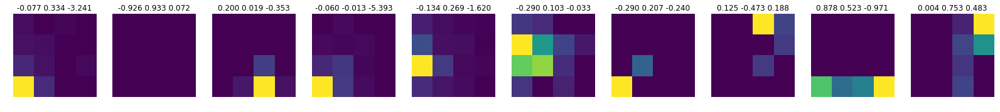

epoch: 289
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6867, device='cuda:1') tensor(5.1895e-08, device='cuda:1', grad_fn=<SumBackward0>)


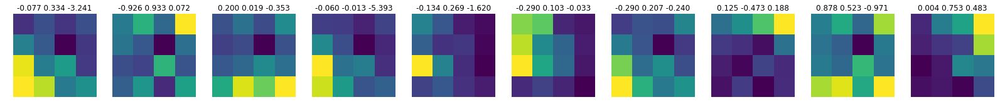

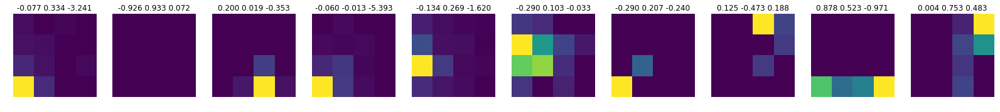

Train loss: -4.474607946255545 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9046, device='cuda:1') tensor(2.6418e-07, device='cuda:1', grad_fn=<SumBackward0>)


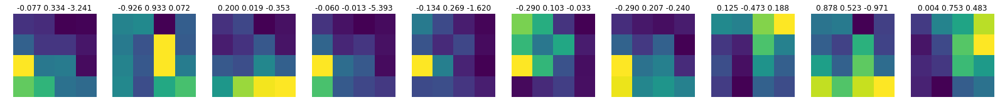

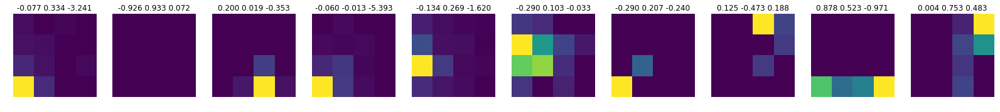

epoch: 290
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9042, device='cuda:1') tensor(2.6418e-07, device='cuda:1', grad_fn=<SumBackward0>)


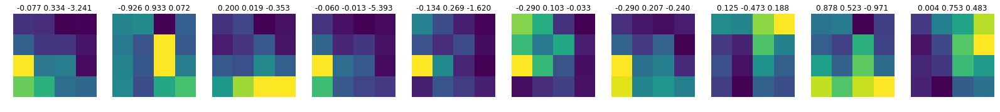

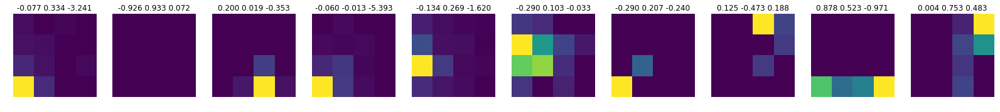

Train loss: -4.832300944299504 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-5.0287, device='cuda:1') tensor(4.6371e-07, device='cuda:1', grad_fn=<SumBackward0>)


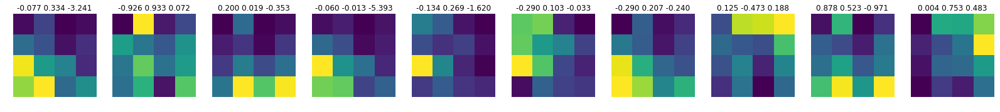

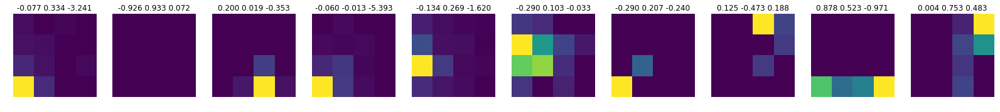

epoch: 291
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-5.0294, device='cuda:1') tensor(4.6371e-07, device='cuda:1', grad_fn=<SumBackward0>)


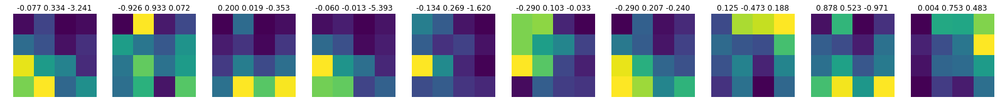

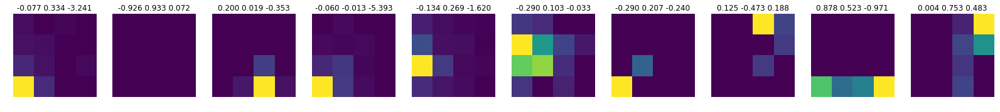

Train loss: -5.0170343314548775 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8631, device='cuda:1') tensor(1.1959e-06, device='cuda:1', grad_fn=<SumBackward0>)


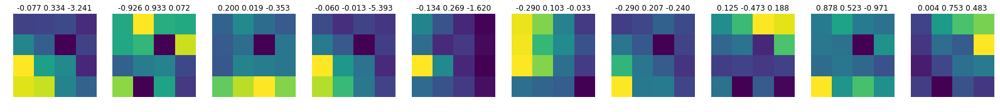

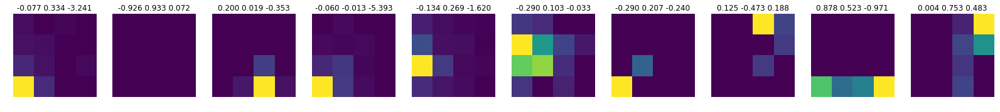

epoch: 292
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8612, device='cuda:1') tensor(1.1959e-06, device='cuda:1', grad_fn=<SumBackward0>)


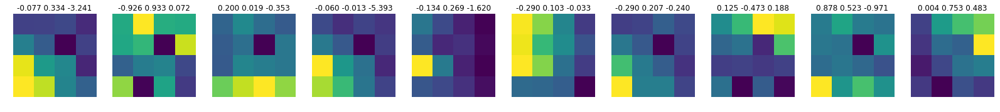

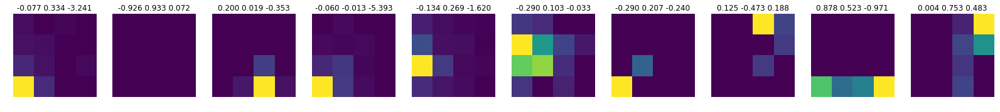

Train loss: -4.871478334279758 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8256, device='cuda:1') tensor(5.2244e-08, device='cuda:1', grad_fn=<SumBackward0>)


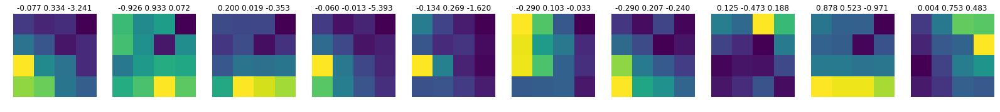

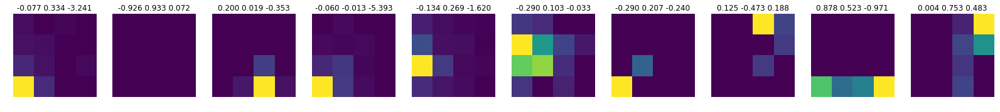

epoch: 293
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8230, device='cuda:1') tensor(5.2244e-08, device='cuda:1', grad_fn=<SumBackward0>)


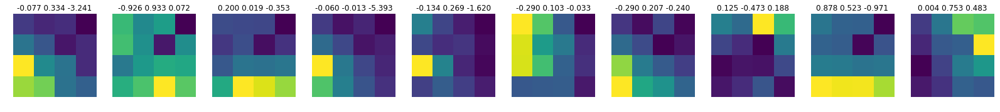

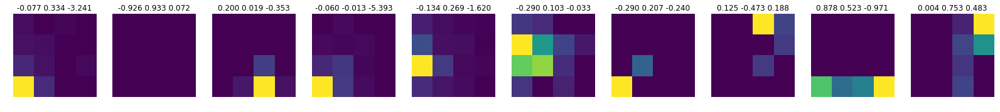

Train loss: -4.808453934213245 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7025, device='cuda:1') tensor(8.0305e-07, device='cuda:1', grad_fn=<SumBackward0>)


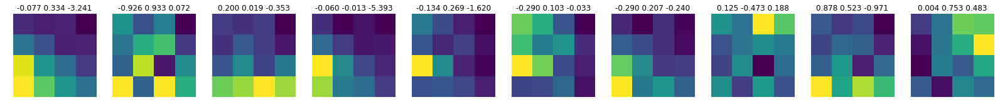

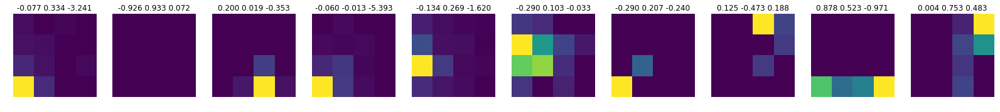

epoch: 294
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7017, device='cuda:1') tensor(8.0305e-07, device='cuda:1', grad_fn=<SumBackward0>)


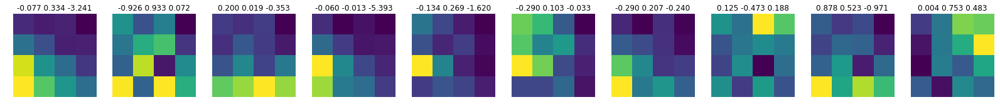

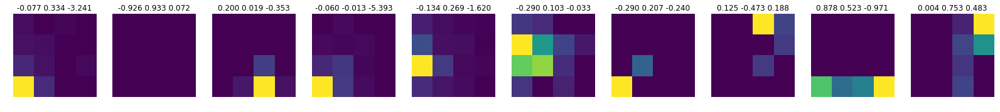

Train loss: -4.735429499646933 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9594, device='cuda:1') tensor(3.3766e-07, device='cuda:1', grad_fn=<SumBackward0>)


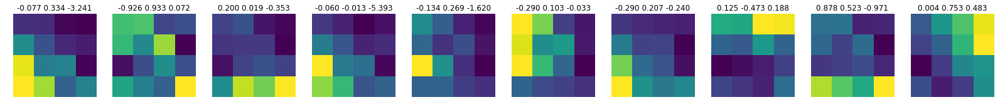

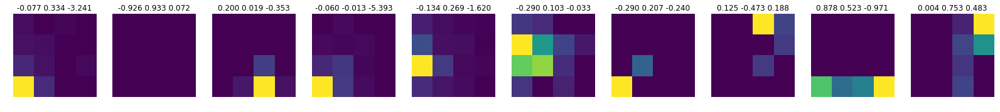

epoch: 295
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.9574, device='cuda:1') tensor(3.3766e-07, device='cuda:1', grad_fn=<SumBackward0>)


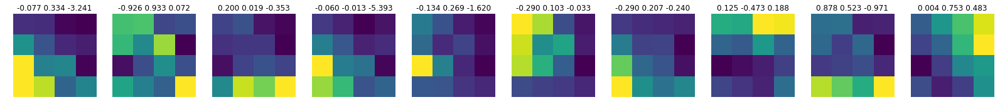

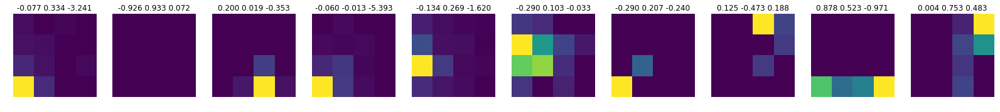

Train loss: -4.929108014832361 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6387, device='cuda:1') tensor(1.7185e-07, device='cuda:1', grad_fn=<SumBackward0>)


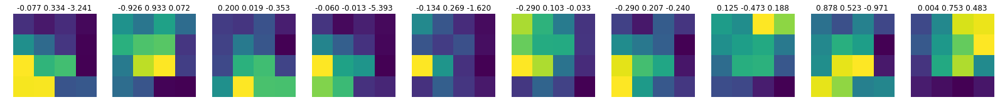

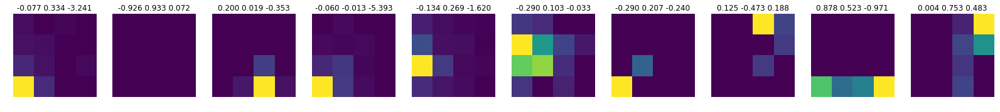

epoch: 296
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.6336, device='cuda:1') tensor(1.7185e-07, device='cuda:1', grad_fn=<SumBackward0>)


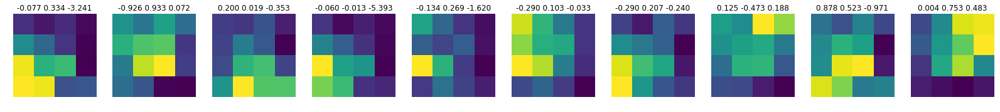

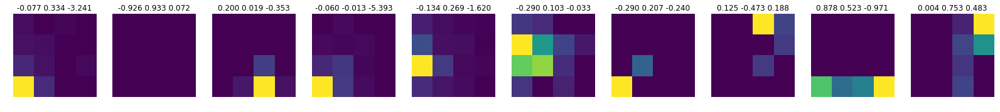

Train loss: -4.740505083220231 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7561, device='cuda:1') tensor(4.1042e-08, device='cuda:1', grad_fn=<SumBackward0>)


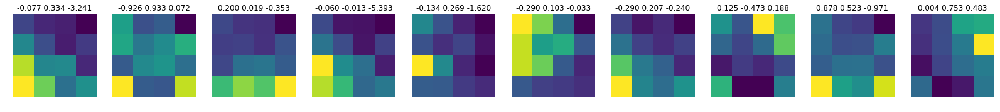

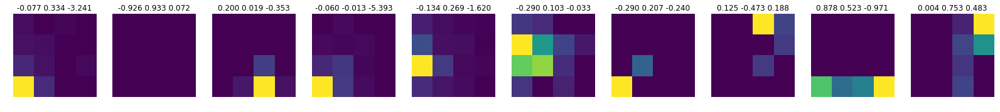

epoch: 297
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7548, device='cuda:1') tensor(4.1042e-08, device='cuda:1', grad_fn=<SumBackward0>)


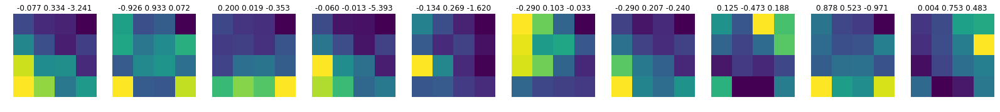

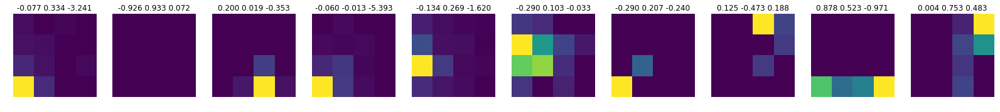

Train loss: -4.659885644251683 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8138, device='cuda:1') tensor(7.7349e-08, device='cuda:1', grad_fn=<SumBackward0>)


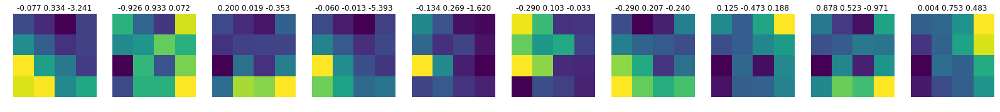

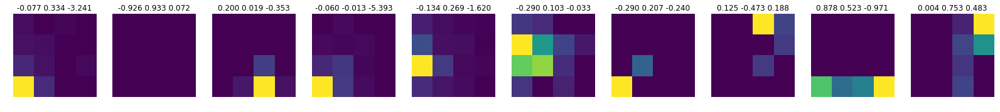

epoch: 298
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.8153, device='cuda:1') tensor(7.7349e-08, device='cuda:1', grad_fn=<SumBackward0>)


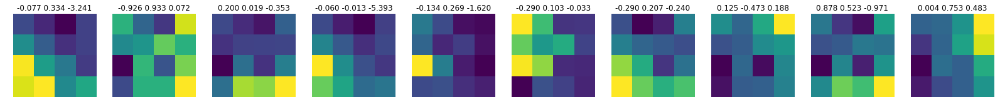

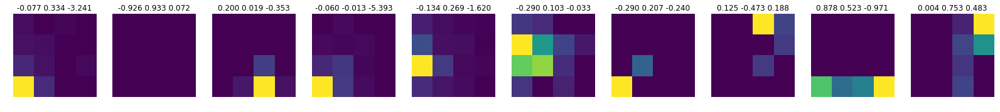

Train loss: -4.923557615272852 Batch 600 of 500           a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7597, device='cuda:1') tensor(8.2542e-08, device='cuda:1', grad_fn=<SumBackward0>)


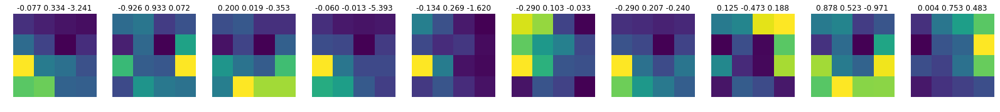

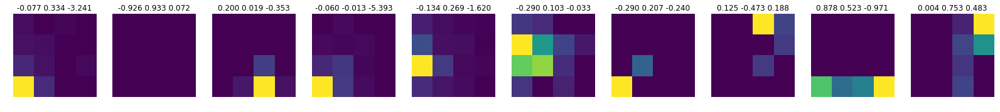

epoch: 299
a_gen shape torch.Size([10, 16])
alpha  1.0
batch_loss:loss_simple, KL tensor(-4.7603, device='cuda:1') tensor(8.2542e-08, device='cuda:1', grad_fn=<SumBackward0>)


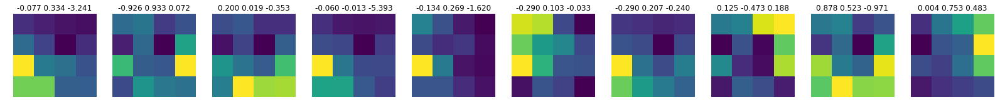

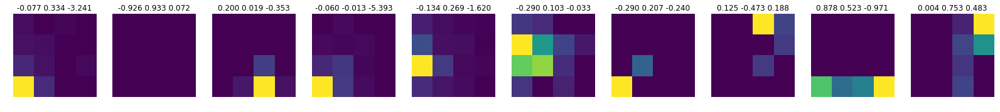

Train loss: -4.7529875703738025 Batch 600 of 500           

In [37]:
a = CVAE(1, 5, 16, 0.5)
vae_model_d2_k1 = train_model(a, tests=[])

In [ ]:
a

In [ ]:
with open("/home/sayankotor/data/VAEResG/DUMP/model_a_main.txt","wb") as file:
    pickle.dump(a,file)

epoch: 0
Train loss: -2.8730755862346173 Batch 90 of 500           proposal mu  tensor([[ 0.0001,  0.0002, -0.0009, -0.0009, -0.0006, -0.0003, -0.0006,  0.0025,
          0.0006,  0.0005,  0.0003],
        [-0.0001,  0.0001, -0.0010, -0.0008, -0.0006, -0.0005, -0.0008,  0.0021,
          0.0005,  0.0004,  0.0001],
        [ 0.0001,  0.0001, -0.0010, -0.0007, -0.0008, -0.0002, -0.0006,  0.0025,
          0.0010,  0.0005,  0.0002],
        [-0.0001, -0.0001, -0.0011, -0.0006, -0.0008, -0.0004, -0.0007,  0.0022,
          0.0008,  0.0006,  0.0001]], grad_fn=<SliceBackward>)
proposal sigma  tensor([[1.0003, 1.0001, 1.0001, 1.0004, 1.0001, 0.9998, 0.9989, 0.9996, 1.0004,
         0.9991, 1.0000],
        [1.0001, 0.9999, 0.9994, 1.0000, 0.9995, 0.9993, 0.9991, 0.9996, 1.0003,
         0.9992, 1.0000],
        [0.9998, 0.9996, 0.9990, 0.9998, 0.9995, 0.9992, 0.9980, 0.9989, 1.0000,
         0.9984, 0.9996],
        [1.0000, 1.0000, 0.9997, 1.0001, 0.9997, 0.9997, 0.9989, 0.9994, 1.0003,
    

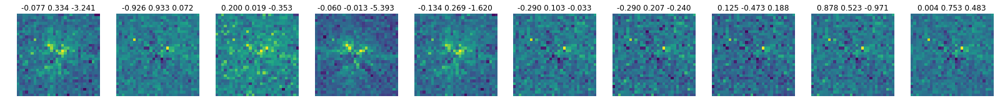

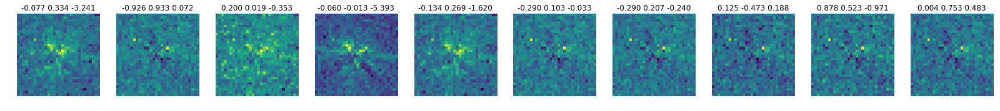

Train loss: -3.160628962611352 Batch 100 of 500           tensor(2.2597)
tensor(-0.0970)


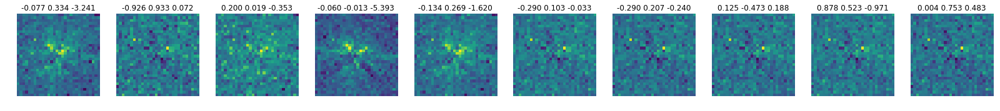

Train loss: -3.6162144282963253 Batch 190 of 500           proposal mu  tensor([[-0.0004, -0.0001,  0.0002,  0.0001,  0.0006,  0.0002,  0.0001,  0.0001,
         -0.0004, -0.0001,  0.0002],
        [-0.0006,  0.0007, -0.0001,  0.0002,  0.0007,  0.0005, -0.0000,  0.0003,
          0.0003, -0.0002,  0.0001],
        [-0.0008,  0.0004,  0.0001,  0.0002,  0.0008,  0.0006,  0.0001, -0.0002,
          0.0008, -0.0007, -0.0001],
        [-0.0006,  0.0005, -0.0000,  0.0002,  0.0008,  0.0003,  0.0001,  0.0003,
          0.0001, -0.0002,  0.0001]], grad_fn=<SliceBackward>)
proposal sigma  tensor([[1.0012, 1.0007, 1.0014, 1.0008, 1.0013, 1.0009, 1.0012, 1.0011, 1.0003,
         1.0011, 1.0013],
        [1.0005, 0.9997, 0.9998, 1.0001, 1.0002, 1.0000, 0.9993, 0.9994, 0.9998,
         0.9992, 1.0000],
        [0.9984, 0.9976, 0.9962, 0.9980, 0.9980, 0.9976, 0.9970, 0.9977, 0.9983,
         0.9972, 0.9982],
        [1.0008, 0.9998, 0.9999, 1.0001, 1.0003, 1.0001, 0.9995, 0.9996, 0.9999,
         0.9

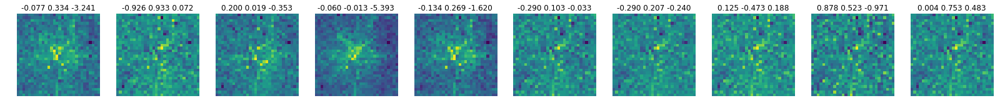

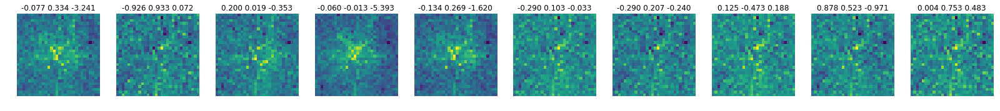

Train loss: -3.844535635809878 Batch 200 of 500           tensor(2.2597)
tensor(0.0539)


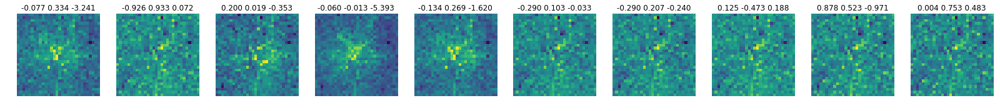

Train loss: -3.917216911421635 Batch 230 of 500            

KeyboardInterrupt: 

In [52]:
#b = CVAE(11, 5, 900, 0.5).cuda().to(device)
with open("/home/sayankotor/data/VAEResG/DUMP/model_DUMP.txt","rb") as mod:
    b = pickle.load(mod)

vae_model_d2_k1 = train_model(b, tests=[])

In [78]:
n_gen_img = []

min_ = np.min(a_gen)
max_ = np.max(a_gen)

for i, elem in enumerate(a_gen):
    if (i%5000 == 0):
        print (i)
    n_elem = (elem - min_)/(max_ - min_)*3371.953567922453
    n_gen_img.append(n_elem)
n_gen_img = np.array(n_gen_img)

0


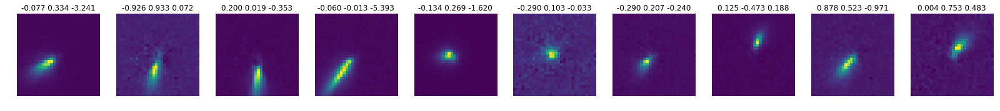

In [79]:
show_images(Variable(torch.from_numpy(n_gen_img)), Variable(torch.from_numpy(data_x[20:30])))

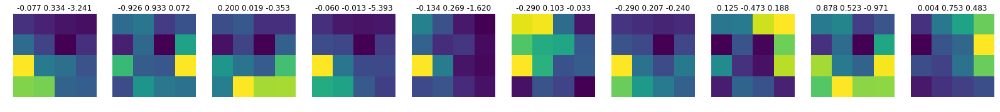

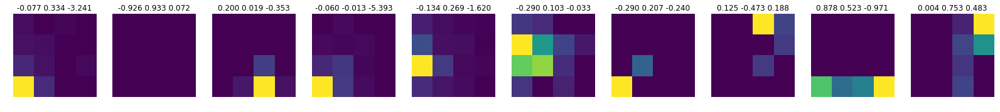

In [41]:
a_gen = a.generate_samples(Variable(torch.cuda.DoubleTensor(data_x[20:30]).to(device)))
show_images(a_gen, Variable(torch.from_numpy(data_x[20:30])))
show_images(Variable(torch.from_numpy(n_cut_data[20:30])), Variable(torch.from_numpy(data_x[20:30])))

In [91]:
n_generated_images = []

min_ = np.min(generated_images)
max_ = np.max(generated_images)

for i, elem in enumerate(generated_images):
    if (i%5000 == 0):
        print (i)
    n_elem = (elem - min_)/(max_ - min_)*3371.953567922453
    n_generated_images.append(n_elem)
n_generated_images = np.array(n_generated_images)
print (n_generated_images.shape)

0
5000
10000
15000
20000
25000
(29600, 900)


In [103]:
data_point = data['ParticlePoint']
data_momentum = data['ParticleMomentum']
reshape_gen_im = n_generated_images.reshape((29600, 30, 30))

In [35]:
np.savez("n_image.npz", nimage=n_data_img)

In [104]:
np.savez("fake_VAE.npz", ParticlePoint=data_point, ParticleMomentum=data_momentum, EnergyDeposit = reshape_gen_im, flat = n_generated_images)

In [113]:
print (generated_images[3])

[-4.06038859e-05 -7.54913423e-05  4.53468094e-05  4.09295799e-05
  5.27407868e-05  2.82123676e-05  1.13309279e-04  5.47830431e-05
  2.73034158e-04  1.55011265e-04  2.68316131e-04  3.23647545e-04
  5.34255984e-04  6.05567360e-04  3.43626502e-04  7.92652124e-05
 -6.54828073e-05  2.63823828e-04  1.24692322e-04  7.27274295e-05
  1.29314689e-04  6.24901184e-05  1.45315581e-05  1.54488550e-04
 -8.89636720e-06  8.92661603e-05 -4.70259827e-07 -1.20235368e-05
  3.32842458e-05  8.69843893e-05  1.08474229e-05  3.37206744e-05
  6.97988164e-05  5.84289128e-05  4.72348808e-05 -2.59795618e-05
  1.03315749e-04  1.87836614e-04  2.39448859e-04  1.92558009e-04
  6.69065392e-04  6.71110944e-04  9.60299071e-04  1.06530580e-03
  6.40332864e-04  2.34108491e-04  6.57835700e-05  1.32270709e-04
  7.49903351e-05  1.12851864e-04  1.54342961e-04 -3.74369648e-05
 -7.03693583e-05  4.58196589e-05 -4.56467849e-05  8.64432157e-05
  2.37371821e-05  9.56391696e-06 -4.09927792e-05  5.96860898e-05
 -1.27293102e-06 -1.90938

In [112]:
print (n_generated_images[3])

[528.27211752 527.84134285 529.33339816 529.27885619 529.42469568
 529.12182976 530.17256826 529.44991254 532.14477944 530.68748569
 532.08652336 532.76973085 535.3702294  536.25075029 533.01642205
 529.75220739 527.96492376 532.03105441 530.31312097 529.67148178
 530.37019588 529.54507605 528.95290526 530.68103143 528.66362774
 529.87569461 528.76766954 528.62501485 529.18445504 529.84752033
 528.90741521 529.18984386 529.63532058 529.49493011 529.35671122
 528.45269212 530.04917263 531.09279837 531.73008322 531.15109603
 537.03479552 537.06005308 540.63081838 541.92739438 536.68001914
 531.66414276 529.58574212 530.40669549 529.69942312 530.1669203
 530.67923376 528.31122124 527.90458682 529.3392367  528.20985007
 529.84083816 529.06657217 528.89156705 528.26731564 529.51045317
 528.75775851 528.53771363 531.51226541 529.05317831 529.63559483
 530.44180469 530.43696339 532.47536678 535.18305745 534.49334991
 534.80016606 539.56674486 544.71918694 549.10943948 540.34229434
 533.354725

In [135]:
print (np.min(n_generated_images))
print (np.max(n_generated_images))

0.0
3371.953567922453


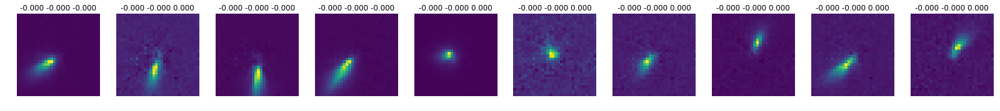

In [94]:
show_images(Variable(torch.from_numpy(generated_images[20:30])), Variable(torch.from_numpy(generated_images[20:30])))

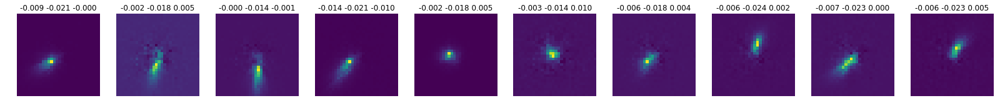

In [184]:
show_images(Variable(torch.from_numpy(reconstr_data_img[20:30])), Variable(torch.from_numpy(reconstr_data_img[20:30])))

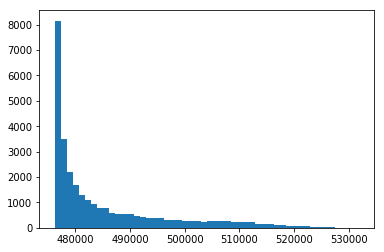

In [109]:
plt.hist(np.sum(reshape_gen_im, axis = (1,2)), bins = 50)
plt.show()

In [15]:
a = data_img[:,15 ,15]
a.shape

(29600,)

In [ ]:
def get_log(array):
    anws = []
    for ind, elem

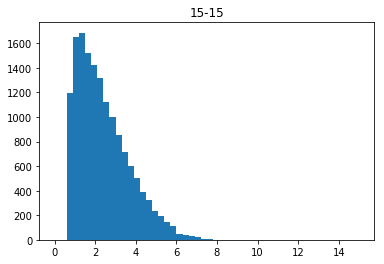

In [40]:
plt.hist(np.log(np.clip(a,a_min = 1e-9, a_max = np.max(a))), range=[0.0, 15.0], bins = 50)
plt.title("15-15")

In [ ]:
vae_model_d2_k1 = train_model(CVAE(8, 5, 900, 0.5), tests=[])

### Визуализация латетного пространства (с точки зрения энкодера)